In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import zipfile
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Path to your ZIP files
zip_file_path = '/content/drive/MyDrive/HAM.zip'
extract_dir = '/content/HAM'  # Directory to extract the ZIP files

# Unzip the files
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

In [ ]:
# Importing Dependencies
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
import tensorflow as tf
import os
import sys
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/HAM/HAM/metadata.csv')
df.head()

,isic_id,attribution,copyright_license,age_approx,anatom_site_general,benign_malignant,concomitant_biopsy,diagnosis,diagnosis_confirm_type,image_type,lesion_id,melanocytic,sex
0,ISIC_0024306,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,45.0,NaN,benign,False,nevus,serial imaging showing no change,dermoscopic,IL_7252831,True,male
1,ISIC_0024307,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,50.0,lower extremity,benign,False,nevus,serial imaging showing no change,dermoscopic,IL_6125741,True,male
2,ISIC_0024308,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,55.0,NaN,benign,False,nevus,serial imaging showing no change,dermoscopic,IL_3692653,True,female
3,ISIC_0024309,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,40.0,NaN,benign,False,nevus,serial imaging showing no change,dermoscopic,IL_0959663,True,male
4,ISIC_0024310,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,60.0,anterior torso,malignant,True,melanoma,histopathology,dermoscopic,IL_8194852,True,male


In [ ]:
df.keys()

Index(['isic_id', 'attribution', 'copyright_license', 'age_approx',
       'anatom_site_general', 'benign_malignant', 'concomitant_biopsy',
       'diagnosis', 'diagnosis_confirm_type', 'image_type', 'lesion_id',
       'melanocytic', 'sex'],
      dtype='object')

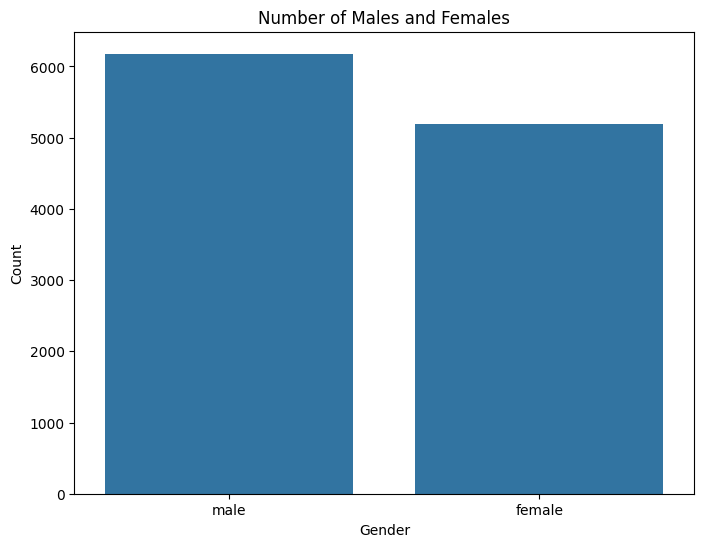

In [ ]:
# prompt: plot the a bar graph to represent the amount of males and females in the csv

import seaborn as sns
import matplotlib.pyplot as plt

# Count the number of males and females
gender_counts = df['sex'].value_counts()

# Create a bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=gender_counts.index, y=gender_counts.values)
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Number of Males and Females')
plt.show()


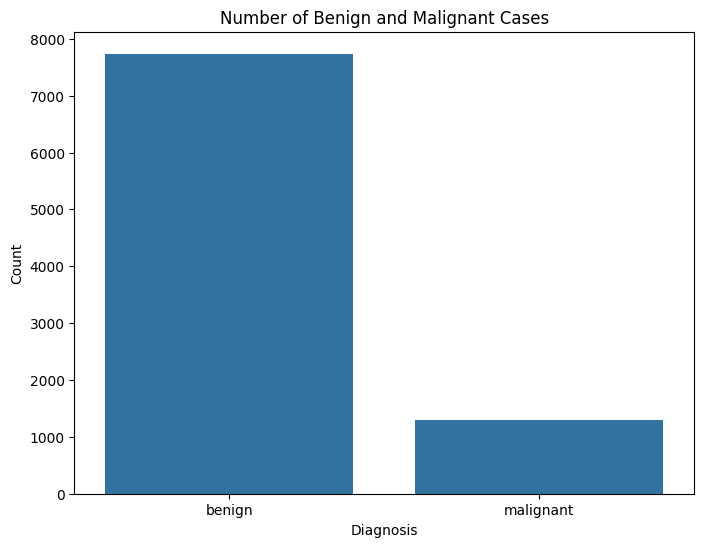

In [ ]:

# Count the number of benign and malignant cases
diagnosis_counts = df['benign_malignant'].value_counts()

# Create a bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=diagnosis_counts.index, y=diagnosis_counts.values)
plt.xlabel('Diagnosis')
plt.ylabel('Count')
plt.title('Number of Benign and Malignant Cases')
plt.show()


** NOTE: ** Here we can see that the skin lesion images of malignant class are very few compared to the Benign class which indicates the great imbalance in the dataset

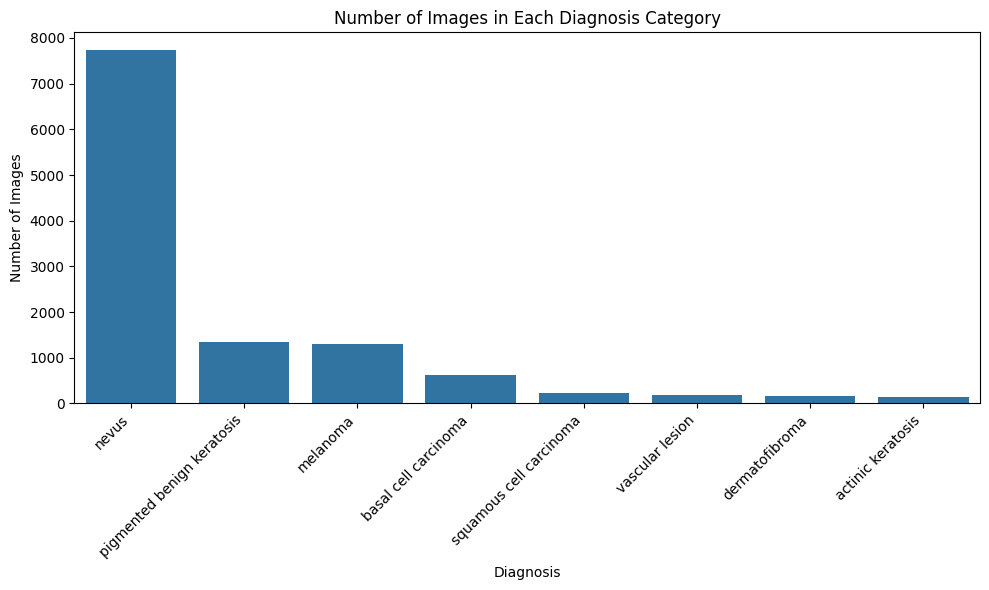

In [ ]:

# Count the number of images in each diagnosis category
diagnosis_counts = df['diagnosis'].value_counts()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=diagnosis_counts.index, y=diagnosis_counts.values)
plt.xlabel('Diagnosis')
plt.ylabel('Number of Images')
plt.title('Number of Images in Each Diagnosis Category')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.tight_layout()
plt.show()


### The diagnosis fiels contatins the different categories of skin lesions which the HAM10000 dataset contains . This bar graph indicates the large imbalance that we can see in these different categories

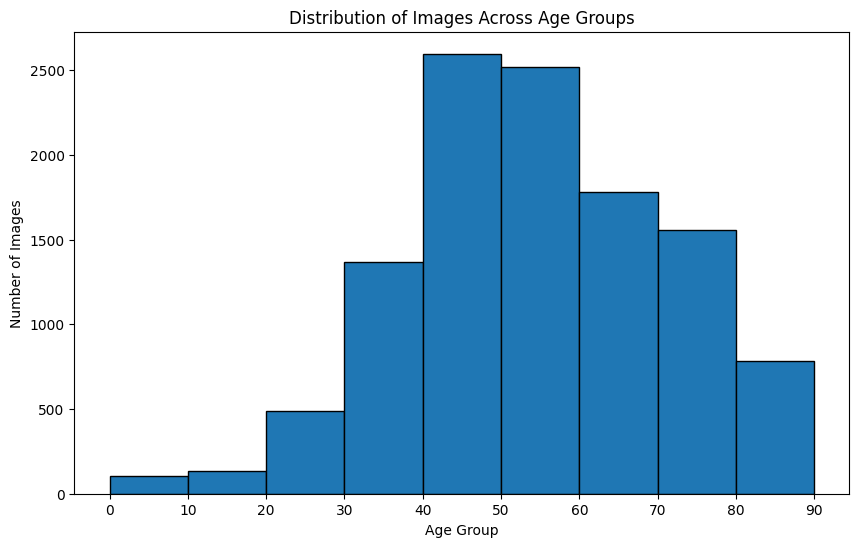

In [ ]:

# Create age groups with an interval of 10
bins = range(0, int(df['age_approx'].max()) + 10, 10)

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(df['age_approx'], bins=bins, edgecolor='black')
plt.xlabel('Age Group')
plt.ylabel('Number of Images')
plt.title('Distribution of Images Across Age Groups')
plt.xticks(bins)
plt.show()


In [ ]:
# prompt: there is a data folder in the conten/HAM/HAM/ directory which contains the skin lesion images with the image name having the isic_id . This isic_id maps to the isic_id value in the column of 'isic_id' in our dataframe . Map the path of the images in the datafolder on the basis of the isic_id and image name by adding a column in the dataframe image_path that contains the path to the image we map

# Path to the data folder
data_folder = '/content/HAM/HAM/data/'

# Create a new column 'image_path' in the dataframe
df['image_path'] = df['isic_id'].apply(lambda id: os.path.join(data_folder, id + '.JPG'))


In [ ]:
df.head()

,isic_id,attribution,copyright_license,age_approx,anatom_site_general,benign_malignant,concomitant_biopsy,diagnosis,diagnosis_confirm_type,image_type,lesion_id,melanocytic,sex,image_path
0,ISIC_0024306,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,45.0,NaN,benign,False,nevus,serial imaging showing no change,dermoscopic,IL_7252831,True,male,/content/HAM/HAM/data/ISIC_0024306.JPG
1,ISIC_0024307,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,50.0,lower extremity,benign,False,nevus,serial imaging showing no change,dermoscopic,IL_6125741,True,male,/content/HAM/HAM/data/ISIC_0024307.JPG
2,ISIC_0024308,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,55.0,NaN,benign,False,nevus,serial imaging showing no change,dermoscopic,IL_3692653,True,female,/content/HAM/HAM/data/ISIC_0024308.JPG
3,ISIC_0024309,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,40.0,NaN,benign,False,nevus,serial imaging showing no change,dermoscopic,IL_0959663,True,male,/content/HAM/HAM/data/ISIC_0024309.JPG
4,ISIC_0024310,"ViDIR Group, Department of Dermatology, Medica...",CC-BY-NC,60.0,anterior torso,malignant,True,melanoma,histopathology,dermoscopic,IL_8194852,True,male,/content/HAM/HAM/data/ISIC_0024310.JPG


In [ ]:
# prompt: write code to load the images and their labels(values in diagnosis column associated with each image) using the tensorflow ImageDataGenerator library

from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Assuming 'df' is your DataFrame with 'image_path' and 'diagnosis' columns

# Create an ImageDataGenerator
datagen = ImageDataGenerator(rescale=1./255)  # Normalize pixel values

# Flow images from the DataFrame
image_generator = datagen.flow_from_dataframe(
    dataframe=df,
    directory=None,  # Images are already in 'image_path' column
    x_col='image_path',
    y_col='diagnosis',
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,  # Adjust as needed
    class_mode='categorical'  # Or 'binary' if you have only two classes
)


Found 11720 validated image filenames belonging to 8 classes.


In [ ]:
import os
import shutil
import pandas as pd

# Assuming df is your DataFrame containing 'image_path' and 'diagnosis' columns
# For example:
# df = pd.DataFrame({
#     'image_path': ['path/to/image1.jpg', 'path/to/image2.jpg', ...],
#     'diagnosis': ['pigmented_benign_keratosis', 'melanoma', ...]
# })

# Create directories for each class
for diagnosis in df['diagnosis'].unique():
    os.makedirs(f'/content/{diagnosis}/{diagnosis}/', exist_ok=True)

# Iterate over the DataFrame and copy images to respective directories
for index, row in df.iterrows():
    image_path = row['image_path']
    diagnosis = row['diagnosis']
    destination_dir = f'/content/{diagnosis}/{diagnosis}/'
    shutil.copy(image_path, destination_dir)

print("Images copied to respective directories successfully.")


Images copied to respective directories successfully.


In [ ]:
# prompt: print all the directory names along with their directory links

import os
# Get the current working directory
current_directory = os.getcwd()

# Iterate over the directories in the current directory
for directory in os.listdir(current_directory):
    if os.path.isdir(directory):
        directory_path = os.path.join(current_directory, directory)
        print(f"Directory Name: {directory}")
        print(f"Directory Link: {directory_path}")
        print()


Directory Name: .config
Directory Link: /content/.config

Directory Name: squamous cell carcinoma
Directory Link: /content/squamous cell carcinoma

Directory Name: sample_data
Directory Link: /content/sample_data

Directory Name: nevus
Directory Link: /content/nevus

Directory Name: discriminator_weights
Directory Link: /content/discriminator_weights

Directory Name: dermatofibroma
Directory Link: /content/dermatofibroma

Directory Name: basal cell carcinoma
Directory Link: /content/basal cell carcinoma

Directory Name: actinic keratosis
Directory Link: /content/actinic keratosis

Directory Name: vascular lesion
Directory Link: /content/vascular lesion

Directory Name: pigmented benign keratosis
Directory Link: /content/pigmented benign keratosis

Directory Name: HAM
Directory Link: /content/HAM

Directory Name: drive
Directory Link: /content/drive

Directory Name: melanoma
Directory Link: /content/melanoma



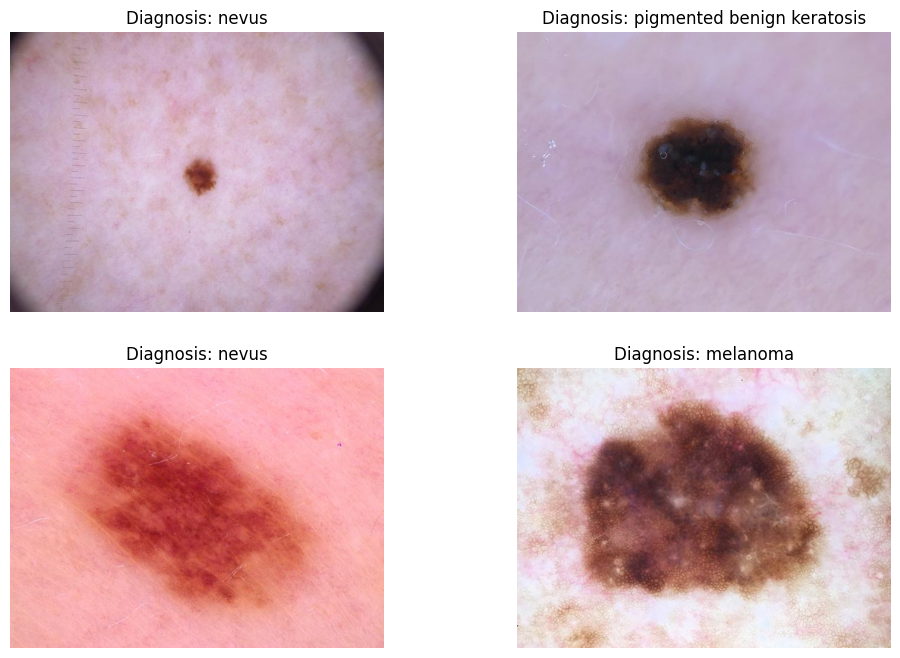

In [ ]:


# prompt: show 4 random samples of images using matplotlib from the image path column we made

from google.colab import drive
import os
import zipfile
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
import tensorflow as tf
import os
import sys
import seaborn as sns
import matplotlib.pyplot as plt
import random
from PIL import Image

# ... (preceding code) ...

# Select 4 random samples
sample_images = df.sample(n=4)

# Display the images
plt.figure(figsize=(12, 8))
for i, row in enumerate(sample_images.iterrows()):
    image_path = row[1]['image_path']
    image = Image.open(image_path)
    plt.subplot(2, 2, i + 1)
    plt.imshow(image)
    plt.title(f"Diagnosis: {row[1]['diagnosis']}")
    plt.axis('off')
plt.show()


In [ ]:
df.keys()

Index(['isic_id', 'attribution', 'copyright_license', 'age_approx',
       'anatom_site_general', 'benign_malignant', 'concomitant_biopsy',
       'diagnosis', 'diagnosis_confirm_type', 'image_type', 'lesion_id',
       'melanocytic', 'sex', 'image_path'],
      dtype='object')

In [ ]:
# Create a list of unique classes
unique_classes = df['diagnosis'].unique()

In [ ]:

unique_classes

array(['nevus', 'melanoma', 'pigmented benign keratosis',
       'dermatofibroma', 'squamous cell carcinoma',
       'basal cell carcinoma', 'vascular lesion', 'actinic keratosis'],
      dtype=object)

In [ ]:
from keras.layers import Conv2D, LeakyReLU, BatchNormalization, Dense, GaussianNoise
from keras.layers import Reshape, UpSampling2D, Activation, Dropout, Flatten, Conv2DTranspose
from keras.models import Sequential
from keras.optimizers import Adam


In [ ]:
class_dirs = {
    "vascular lesion": "/content/vascular lesion/",
    "melanoma": "/content/melanoma/",
    "actinic keratosis": "/content/actinic keratosis/",
    "nevus": "/content/nevus/nevus",
    "basal cell carcinoma": "/content/basal cell carcinoma/",
    "dermatofibroma": "/content/dermatofibroma/",
    "pigmented benign keratosis": "/content/pigmented benign keratosis/",
    "squamous cell carcinoma": "/content/squamous cell carcinoma/"
}

In [ ]:
tf.keras.mixed_precision.set_global_policy('mixed_float16')

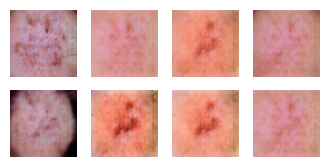

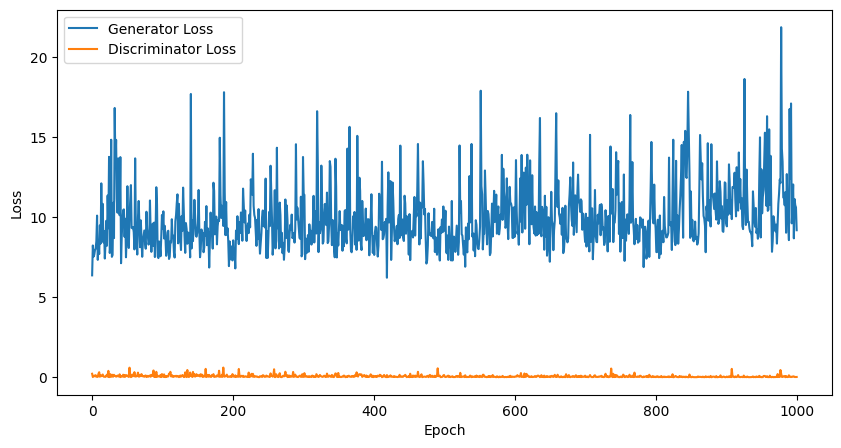

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import os
import time
import PIL
import glob
from matplotlib import pyplot as plt
from IPython import display

# Enable mixed precision training
tf.keras.mixed_precision.set_global_policy('mixed_float16')

# Define the function to load images
def load_isic2018_data(image_dir):
    images = []
    for img_path in glob.glob(os.path.join(image_dir, '*.JPG')):
        img = PIL.Image.open(img_path).resize((128, 128))  # Ensure resizing to 128x128
        img = np.array(img)
        if img.ndim == 2:  # If the image is grayscale
            img = np.expand_dims(img, axis=-1)
        images.append(img)
    images = np.array(images)
    return images

# Define the generator model
def make_generator_model():
    model = tf.keras.Sequential([
        layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Reshape((8, 8, 512)),

        layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', use_bias=False, activation='tanh')
    ])
    return model

# Enhanced Discriminator Model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Define the loss and optimizers
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Use legacy optimizers compatible with mixed precision
generator_optimizer = tf.keras.optimizers.legacy.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.legacy.Adam(1e-4)

# Define the training loop
EPOCHS = 1000
noise_dim = 100
num_examples_to_generate = 8
seed = tf.random.normal([num_examples_to_generate, noise_dim])

@tf.function
def train_step(images, generator, discriminator):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

def generate_and_save_images(model, epoch, test_input, save_dir):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i].numpy() * 127.5 + 127.5).astype(np.uint8))
        plt.axis('off')
    plt.savefig(os.path.join(save_dir, f'image_at_epoch_{epoch:04d}.png'))
    plt.show()

def plot_loss(gen_losses, disc_losses, save_dir):
    plt.figure(figsize=(10, 5))
    plt.plot(gen_losses, label='Generator Loss')
    plt.plot(disc_losses, label='Discriminator Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig(os.path.join(save_dir, 'loss_plot.png'))
    plt.show()

def train(dataset, generator, discriminator, epochs, save_dir, checkpoint_prefix):
    checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                     discriminator_optimizer=discriminator_optimizer,
                                     generator=generator,
                                     discriminator=discriminator)
    gen_losses = []
    disc_losses = []
    for epoch in range(epochs):
        start = time.time()
        epoch_gen_losses = []
        epoch_disc_losses = []
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch, generator, discriminator)
            epoch_gen_losses.append(gen_loss)
            epoch_disc_losses.append(disc_loss)
        gen_losses.append(np.mean(epoch_gen_losses))
        disc_losses.append(np.mean(epoch_disc_losses))

        if (epoch + 1) % 10 == 0:
            display.clear_output(wait=True)
            generate_and_save_images(generator, epoch, seed, save_dir)
            plot_loss(gen_losses, disc_losses, save_dir)  # Print loss curves every 10 epochs

        if (epoch + 1) % 50 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        print(f'Epoch {epoch + 1}, gen_loss={gen_losses[-1]}, disc_loss={disc_losses[-1]}')
        print(f'Time for epoch {epoch + 1} is {time.time() - start} sec')

    display.clear_output(wait=True)
    generate_and_save_images(generator, epochs, seed, save_dir)
    plot_loss(gen_losses, disc_losses, save_dir)

# Ensure the directories for saving weights and images exist
os.makedirs('./discriminator_weights', exist_ok=True)
os.makedirs('./output_images', exist_ok=True)

# Training GAN for each class
class_dirs = {
    "vascular lesion": "/content/vascular lesion/vascular lesion",
    "melanoma": "/content/melanoma/melanoma",
    "actinic keratosis": "/content/actinic keratosis/actinic keratosis",
    "nevus": "/content/nevus/nevus",
    "basal cell carcinoma": "/content/basal cell carcinoma/basal cell carcinoma",
    "dermatofibroma": "/content/dermatofibroma/dermatofibroma",
    "pigmented benign keratosis": "/content/pigmented benign keratosis/pigmented benign keratosis",
    "squamous cell carcinoma": "/content/squamous cell carcinoma/squamous cell carcinoma"
}

# Create the generator and discriminator models
generator = make_generator_model()
discriminator = make_discriminator_model()

# Run a dummy training step to initialize variables
dummy_image_batch = np.random.randn(1, 128, 128, 3).astype('float32')
dummy_image_batch = tf.convert_to_tensor(dummy_image_batch)
train_step(dummy_image_batch, generator, discriminator)

for class_name, image_dir in class_dirs.items():
    print(f"Training GAN for class: {class_name}")
    train_images = load_isic2018_data(image_dir)
    if len(train_images) == 0:
        print(f"No images found in {image_dir}, skipping this class.")
        continue

    train_images = (train_images - 127.5) / 127.5  # Normalize the images to [-1, 1]

    BUFFER_SIZE = len(train_images)
    BATCH_SIZE = 8  # Adjust batch size based on your GPU memory

    # Batch, shuffle, and prefetch the data
    train_dataset = tf.data.Dataset.from_tensor_slices(train_images) \
                                 .shuffle(BUFFER_SIZE) \
                                 .batch(BATCH_SIZE) \
                                 .prefetch(buffer_size=tf.data.AUTOTUNE)

    # Define checkpoint directory and prefix
    checkpoint_dir = f'./training_checkpoints/{class_name}'
    checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

    # Create output directory for generated images
    output_dir = f'./output_images/{class_name}'
    os.makedirs(output_dir, exist_ok=True)

    # Train the GAN
    train(train_dataset, generator, discriminator, EPOCHS, output_dir, checkpoint_prefix)

    # Save the discriminator weights
    discriminator.save_weights(f'./discriminator_weights/{class_name}_discriminator_weights.h5')


Evaluating GAN for class: vascular lesion
Restored from ./training_checkpoints/vascular lesion/ckpt-20


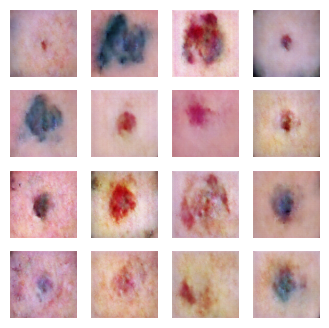

6/6 [==============================] - 0s 46ms/step
FID score for vascular lesion: -2.2934986159900715e+106
Evaluating GAN for class: melanoma
Restored from ./training_checkpoints/melanoma/ckpt-20


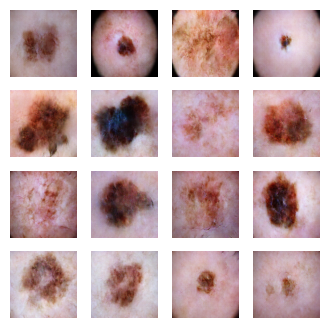

41/41 [==============================] - 2s 47ms/step
FID score for melanoma: 2.6376868041356924e+36
Evaluating GAN for class: actinic keratosis
Restored from ./training_checkpoints/actinic keratosis/ckpt-20


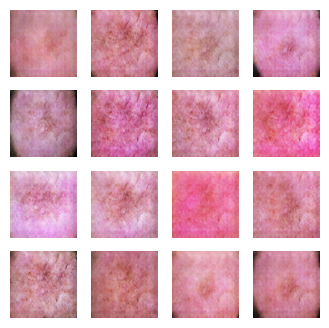

5/5 [==============================] - 0s 46ms/step
FID score for actinic keratosis: 8.623554796122669e+107
Evaluating GAN for class: nevus
Restored from ./training_checkpoints/nevus/ckpt-20


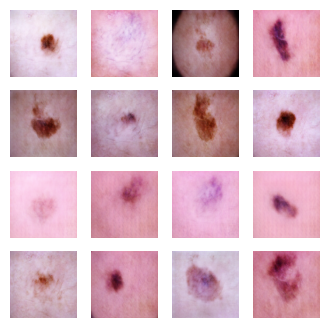

ResourceExhaustedError: Exception encountered when calling layer 'conv2d_transpose_1' (type Conv2DTranspose).

{{function_node __wrapped__Conv2DBackpropInput_device_/job:localhost/replica:0/task:0/device:GPU:0}} OOM when allocating tensor with shape[7737,32,32,128] and type half on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Conv2DBackpropInput]

Call arguments received by layer 'conv2d_transpose_1' (type Conv2DTranspose):
  • inputs=tf.Tensor(shape=(7737, 16, 16, 256), dtype=float16)

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import os
import PIL
from matplotlib import pyplot as plt
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from scipy.linalg import sqrtm

# Function to generate and display images
def generate_and_display_images(model, noise_dim, num_examples_to_generate, save_dir, epoch=None):
    seed = tf.random.normal([num_examples_to_generate, noise_dim])
    predictions = model(seed, training=False)
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i].numpy() * 127.5 + 127.5).astype(np.uint8))
        plt.axis('off')
    if epoch is not None:
        plt.savefig(os.path.join(save_dir, f'image_at_epoch_{epoch:04d}.png'))
    plt.show()

# Function to calculate FID score
def calculate_fid(model, real_images, generated_images):
    # Resize images to 299x299 for InceptionV3
    real_images = tf.image.resize(real_images, (299, 299))
    generated_images = tf.image.resize(generated_images, (299, 299))

    # Preprocess images for InceptionV3
    real_images = preprocess_input(real_images)
    generated_images = preprocess_input(generated_images)

    # Get the activations from the last pooling layer
    act1 = model.predict(real_images)
    act2 = model.predict(generated_images)

    # Calculate the mean and covariance of the activations
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)

    # Calculate FID
    ssdiff = np.sum((mu1 - mu2)**2.0)
    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

# Load InceptionV3 model for FID calculation
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

# Evaluate GAN for each class
noise_dim = 100
num_examples_to_generate = 16

for class_name in class_dirs.keys():
    print(f"Evaluating GAN for class: {class_name}")

    # Load the generator model
    generator = make_generator_model()
    checkpoint_dir = f'./training_checkpoints/{class_name}'
    checkpoint = tf.train.Checkpoint(generator=generator)
    latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
    if latest_checkpoint:
        checkpoint.restore(latest_checkpoint).expect_partial()
        print(f"Restored from {latest_checkpoint}")
    else:
        print(f"No checkpoint found for {class_name}, skipping evaluation.")
        continue

    # Generate and display images
    output_dir = f'./output_images/{class_name}'
    generate_and_display_images(generator, noise_dim, num_examples_to_generate, output_dir)

    # Calculate FID
    image_dir = class_dirs[class_name]
    real_images = load_isic2018_data(image_dir)
    real_images = (real_images - 127.5) / 127.5  # Normalize the images to [-1, 1]
    generated_images = generator(tf.random.normal([real_images.shape[0], noise_dim]), training=False)
    fid_score = calculate_fid(inception_model, real_images, generated_images)
    print(f"FID score for {class_name}: {fid_score}")

    # Clear session to free memory
    tf.keras.backend.clear_session()


In [ ]:
import os
import shutil
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers

# Define the directories
class_dirs = {
    "vascular lesion": "/content/vascular lesion/",
    "melanoma": "/content/melanoma/",
    "actinic keratosis": "/content/actinic keratosis/",
    "nevus": "/content/nevus/nevus",
    "basal cell carcinoma": "/content/basal cell carcinoma/",
    "dermatofibroma": "/content/dermatofibroma/",
    "pigmented benign keratosis": "/content/pigmented benign keratosis/",
    "squamous cell carcinoma": "/content/squamous cell carcinoma/"
}

# Create a new directory named HAM10000_dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Combine images into the new directory with labels
for class_name, class_dir in class_dirs.items():
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)
    for img_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_name)
        if os.path.isfile(img_path):
            shutil.copy(img_path, class_combined_dir)

# Split the data into training, validation, and test sets
def split_data(combined_dir, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    for class_name in os.listdir(combined_dir):
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_name)

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir)

# Create a function to convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    datagen = ImageDataGenerator(rescale=1./255)
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)
    return datagen.flow_from_directory(combined_dir, target_size=img_size, batch_size=batch_size, class_mode='sparse')

# Image size and batch size
img_size = (256, 256)
batch_size = 32

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define Layer Groups
def layer_group_1(inputs):
    x = layers.Conv2D(32, (3, 3), activation='relu')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    return x

def layer_group_2(inputs):
    x = layers.Conv2D(64, (3, 3), activation='relu')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    return x

def layer_group_3_class(inputs):
    x = layers.Conv2D(128, (3, 3), activation='relu')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    return x

def layer_group_4_class(inputs):
    x = layers.Conv2D(256, (3, 3), activation='relu')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    return x

def layer_group_5_class(inputs):
    x = layers.Conv2D(512, (3, 3), activation='relu')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    return x

def layer_group_6_class(inputs):
    x = layers.Flatten()(inputs)
    x = layers.Dense(128, activation='relu')(x)
    return x

def extra_layers(inputs):
    x = layers.Dense(64, activation='relu')(inputs)
    x = layers.Dense(32, activation='relu')(x)
    return x

def final_classification_layer(inputs, num_classes):
    x = layers.Dense(num_classes, activation='softmax')(inputs)
    return x

# Function to create and load class expert layers
def create_class_expert(input_shape, weights_path):
    inputs = tf.keras.Input(shape=input_shape)
    x = layer_group_3_class(inputs)
    x = layer_group_4_class(x)
    x = layer_group_5_class(x)
    x = layer_group_6_class(x)
    model = tf.keras.Model(inputs, x)
    model.load_weights(weights_path)
    return model

# Create the main CNN model
input_shape = (256, 256, 3)  # Image input shape
inputs = tf.keras.Input(shape=input_shape)

# Apply Layer Groups 1 and 2
x = layer_group_1(inputs)
x = layer_group_2(x)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_dirs.keys():
    weights_path = f'{weights_folder}/{class_name}_discriminator_weights.h5'  # Path to weights for each class
    expert_model = create_class_expert(x.shape[1:], weights_path)
    expert_x = expert_model(x)
    class_expert_outputs.append(expert_x)

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = extra_layers(concatenated)
outputs = final_classification_layer(x, len(class_dirs))

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model using the hyperparameters and losses defined in the paper
final_model.compile(optimizer=optimizers.Adam(lr=0.0001),  # Learning rate as defined in the paper
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Train the model
final_model.fit(train_generator, epochs=100, validation_data=val_generator)

# Evaluate the model
final_model.evaluate(test_generator)

# Save the final model
final_model.save('class_expert_cnn.h5')

print("Final model trained, evaluated, and saved.")


Found 7737 images belonging to 8 classes.
Found 7737 images belonging to 8 classes.
Found 7737 images belonging to 8 classes.


ValueError: Layer count mismatch when loading weights from file. Model expected 4 layers, found 10 saved layers.

In [ ]:
import os
import shutil
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers

# Define the directories for each skin lesion class
class_dirs = {
    "vascular lesion": "/content/vascular lesion/",
    "melanoma": "/content/melanoma/",
    "actinic keratosis": "/content/actinic keratosis/",
    "nevus": "/content/nevus/nevus",
    "basal cell carcinoma": "/content/basal cell carcinoma/",
    "dermatofibroma": "/content/dermatofibroma/",
    "pigmented benign keratosis": "/content/pigmented benign keratosis/",
    "squamous cell carcinoma": "/content/squamous cell carcinoma/"
}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Copy images into the new directory with their class labels
for class_name, class_dir in class_dirs.items():
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)
    for img_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_name)
        if os.path.isfile(img_path):
            shutil.copy(img_path, class_combined_dir)

# Split the data into training, validation, and test sets
def split_data(combined_dir, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(os.listdir(combined_dir))}
    for class_name in os.listdir(combined_dir):
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(
        data, labels, test_size=test_size, stratify=labels
    )
    train_data, val_data, train_labels, val_labels = train_test_split(
        train_data, train_labels, test_size=val_size, stratify=train_labels
    )

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(
        generator,
        output_types=(tf.float32, tf.int32),
        output_shapes=output_shapes
    )

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_dirs.keys():
    weights_path = f'{weights_folder}/{class_name}_discriminator_weights.h5'  # Path to weights for each class
    expert_model = create_class_expert((128, 128, 3), weights_path)
    expert_x = expert_model(inputs)
    class_expert_outputs.append(expert_x)

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_dirs), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(
    optimizer=optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
final_model.fit(
    train_generator,
    epochs=100,
    validation_data=val_generator,
    steps_per_epoch=len(train_data) // batch_size,
    validation_steps=len(val_data) // batch_size
)

# Evaluate the model
final_model.evaluate(test_generator, steps=len(test_data) // batch_size)

# Save the final model
final_model.save('class_expert_cnn.h5')


Epoch 1/100
154/154 [==============================] - 149s 780ms/step - loss: 0.0683 - accuracy: 0.9799 - val_loss: 1.0097e-08 - val_accuracy: 1.0000
Epoch 2/100
 14/154 [=>............................] - ETA: 1:45 - loss: 0.0020 - accuracy: 1.0000

KeyboardInterrupt: 

In [ ]:
df.keys()

Index(['isic_id', 'attribution', 'copyright_license', 'age_approx',
       'anatom_site_general', 'benign_malignant', 'concomitant_biopsy',
       'diagnosis', 'diagnosis_confirm_type', 'image_type', 'lesion_id',
       'melanocytic', 'sex', 'image_path'],
      dtype='object')

In [ ]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

# Define the path to images
image_dir = '/content/HAM/HAM/data'

# Function to preprocess data
def preprocess_data(df, image_dir, test_size=0.2, val_size=0.2):
    # Map diagnosis to integers
    class_map = {label: idx for idx, label in enumerate(df['diagnosis'].unique())}
    df['label'] = df['diagnosis'].map(class_map)

    # Create lists for image paths and labels
    data = []
    labels = []
    for _, row in df.iterrows():
        img_path = os.path.join(image_dir, row['image_path'])
        if os.path.isfile(img_path):
            data.append(img_path)
            labels.append(row['label'])

    # Split the data
    train_data, test_data, train_labels, test_labels = train_test_split(
        data, labels, test_size=test_size, stratify=labels
    )
    train_data, val_data, train_labels, val_labels = train_test_split(
        train_data, train_labels, test_size=val_size, stratify=train_labels
    )

    return train_data, val_data, test_data, train_labels, val_labels, test_labels, class_map

# Preprocess the data
train_data, val_data, test_data, train_labels, val_labels, test_labels, class_map = preprocess_data(
    df, image_dir
)


In [ ]:
import tensorflow as tf

# Image size and batch size
img_size = (128, 128)  # Updated to match d||iscriminator input size
batch_size = 32

def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(
        generator,
        output_types=(tf.float32, tf.int32),
        output_shapes=output_shapes
    )

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)


In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Load the dataset
df = pd.read_csv('/content/HAM/HAM/metadata.csv')

# Define the class labels and paths for discriminator weights
class_dirs = {
    "vascular lesion": "/content/vascular lesion/",
    "melanoma": "/content/melanoma/",
    "actinic keratosis": "/content/actinic keratosis/",
    "nevus": "/content/nevus/nevus",
    "basal cell carcinoma": "/content/basal cell carcinoma/",
    "dermatofibroma": "/content/dermatofibroma/",
    "pigmented benign keratosis": "/content/pigmented benign keratosis/",
    "squamous cell carcinoma": "/content/squamous cell carcinoma/"
}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Copy images into the new directory with their class labels
for class_name, class_dir in class_dirs.items():
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)
    for img_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_name)
        if os.path.isfile(img_path):
            shutil.copy(img_path, class_combined_dir)

# Split the data into training, validation, and test sets
def split_data(combined_dir, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(os.listdir(combined_dir))}
    for class_name in os.listdir(combined_dir):
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_dirs.keys():
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
    expert_model = create_class_expert((128, 128, 3), weights_path)
    expert_x = expert_model(inputs)
    class_expert_outputs.append(expert_x)

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_dirs), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Train the model
final_model.fit(train_generator, epochs=100, validation_data=val_generator, steps_per_epoch=len(train_data)//batch_size, validation_steps=len(val_data)//batch_size)

# Evaluate the model
final_model.evaluate(test_generator, steps=len(test_data)//batch_size)

# Save the final model
final_model.save('class_expert_cnn.h5')


Epoch 1/100
 59/154 [==========>...................] - ETA: 1:12 - loss: 0.6499 - accuracy: 0.8411

KeyboardInterrupt: 

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Load the dataset
df = pd.read_csv('/content/HAM/HAM/metadata.csv')

# Define the class labels and paths for discriminator weights
class_dirs = {
    "vascular lesion": "/content/vascular lesion/",
    "melanoma": "/content/melanoma/",
    "actinic keratosis": "/content/actinic keratosis/",
    "nevus": "/content/nevus/nevus",
    "basal cell carcinoma": "/content/basal cell carcinoma/",
    "dermatofibroma": "/content/dermatofibroma/",
    "pigmented benign keratosis": "/content/pigmented benign keratosis/",
    "squamous cell carcinoma": "/content/squamous cell carcinoma/"
}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Copy images into the new directory with their class labels
for class_name, class_dir in class_dirs.items():
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)
    for img_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_name)
        if os.path.isfile(img_path):
            shutil.copy(img_path, class_combined_dir)

# Display the count of images for each class
print("Image count for each class in the combined dataset:")
for class_name in class_dirs.keys():
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")

# Split the data into training, validation, and test sets
def split_data(combined_dir, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(os.listdir(combined_dir))}
    for class_name in os.listdir(combined_dir):
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_dirs.keys():
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
    expert_model = create_class_expert((128, 128, 3), weights_path)
    expert_x = expert_model(inputs)
    class_expert_outputs.append(expert_x)

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_dirs), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Train the model
final_model.fit(train_generator, epochs=100, validation_data=val_generator, steps_per_epoch=len(train_data)//batch_size, validation_steps=len(val_data)//batch_size)

# Evaluate the model
final_model.evaluate(test_generator, steps=len(test_data)//batch_size)

# Save the final model
final_model.save('class_expert_cnn.h5')


Image count for each class in the combined dataset:
vascular lesion: 0 images
melanoma: 0 images
actinic keratosis: 0 images
nevus: 7737 images
basal cell carcinoma: 0 images
dermatofibroma: 0 images
pigmented benign keratosis: 0 images
squamous cell carcinoma: 0 images
Epoch 1/100


KeyboardInterrupt: 

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Load the dataset
df = pd.read_csv('/content/HAM/HAM/metadata.csv')

# Define the class labels and paths for discriminator weights
class_dirs = {
    "vascular lesion": "/content/vascular lesion/",
    "melanoma": "/content/melanoma/",
    "actinic keratosis": "/content/actinic keratosis/",
    "nevus": "/content/nevus/nevus",  # This appears to be the correct path for "nevus"
    "basal cell carcinoma": "/content/basal cell carcinoma/",
    "dermatofibroma": "/content/dermatofibroma/",
    "pigmented benign keratosis": "/content/pigmented benign keratosis/",
    "squamous cell carcinoma": "/content/squamous cell carcinoma/"
}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Copy images into the new directory with their class labels
for class_name, class_dir in class_dirs.items():
    if os.path.exists(class_dir):
        class_combined_dir = os.path.join(combined_dir, class_name)
        if not os.path.exists(class_combined_dir):
            os.makedirs(class_combined_dir)
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            if os.path.isfile(img_path):
                shutil.copy(img_path, class_combined_dir)
    else:
        print(f"Directory does not exist: {class_dir}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_dirs.keys():
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(os.listdir(combined_dir))}
    for class_name in os.listdir(combined_dir):
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_dirs.keys():
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_x = expert_model(inputs)
        class_expert_outputs.append(expert_x)
    else:
        print(f"Weight file does not exist: {weights_path}")

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_dirs), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Train the model
final_model.fit(train_generator, epochs=100, validation_data=val_generator, steps_per_epoch=len(train_data)//batch_size, validation_steps=len(val_data)//batch_size)

# Evaluate the model
final_model.evaluate(test_generator, steps=len(test_data)//batch_size)

# Save the final model
final_model.save('class_expert_cnn.h5')


Image count for each class in the combined dataset:
vascular lesion: 0 images
melanoma: 0 images
actinic keratosis: 0 images
nevus: 7737 images
basal cell carcinoma: 0 images
dermatofibroma: 0 images
pigmented benign keratosis: 0 images
squamous cell carcinoma: 0 images
Epoch 1/100


KeyboardInterrupt: 

In [ ]:
df.keys()


Index(['isic_id', 'attribution', 'copyright_license', 'age_approx',
       'anatom_site_general', 'benign_malignant', 'concomitant_biopsy',
       'diagnosis', 'diagnosis_confirm_type', 'image_type', 'lesion_id',
       'melanocytic', 'sex', 'image_path'],
      dtype='object')

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Load the dataset


# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir, class_labels)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_x = expert_model(inputs)
        class_expert_outputs.append(expert_x)
    else:
        print(f"Weight file does not exist: {weights_path}")

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_labels), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Train the model
final_model.fit(train_generator, epochs=100, validation_data=val_generator, steps_per_epoch=len(train_data)//batch_size, validation_steps=len(val_data)//batch_size)

# Evaluate the model
final_model.evaluate(test_generator, steps=len(test_data)//batch_size)

# Save the final model
final_model.save('class_expert_cnn.h5')


Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Epoch 1/100
223/234 [===========================>..] - ETA: 8s - loss: 1.3517 - accuracy: 0.6198

KeyboardInterrupt: 

Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Epoch 1/60
234/234 [==============================] - ETA: 0s - loss: 1.5033 - accuracy: 0.5920

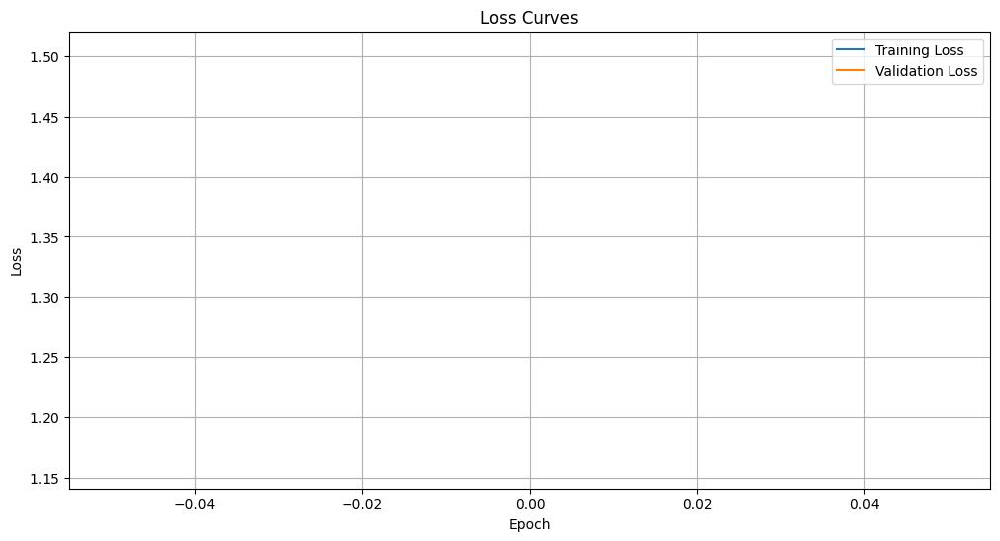

234/234 [==============================] - 71s 204ms/step - loss: 1.5033 - accuracy: 0.5920 - val_loss: 1.1584 - val_accuracy: 0.6848
Epoch 2/60
234/234 [==============================] - ETA: 0s - loss: 0.9915 - accuracy: 0.6813

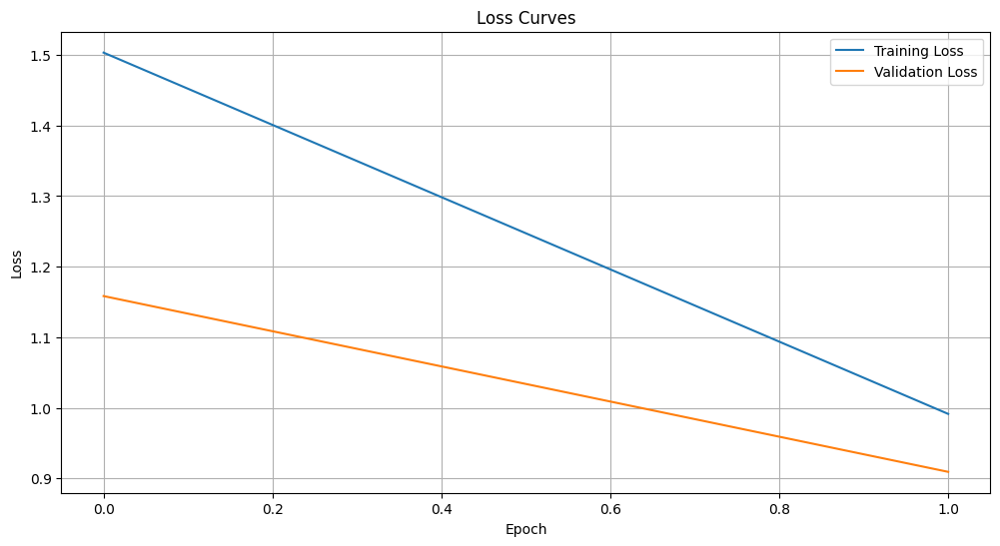

234/234 [==============================] - 47s 202ms/step - loss: 0.9915 - accuracy: 0.6813 - val_loss: 0.9094 - val_accuracy: 0.7290
Epoch 3/60
234/234 [==============================] - ETA: 0s - loss: 0.8123 - accuracy: 0.7388

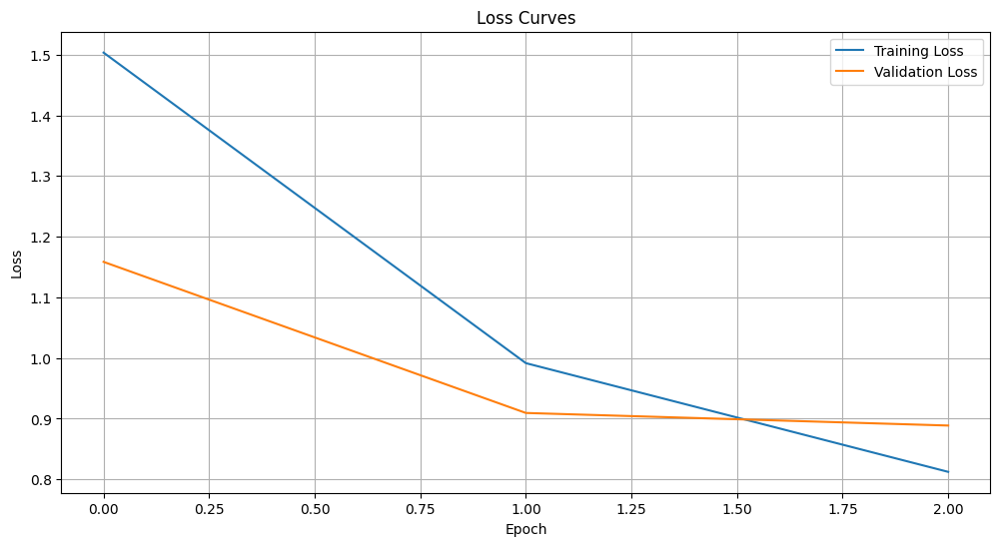

234/234 [==============================] - 48s 204ms/step - loss: 0.8123 - accuracy: 0.7388 - val_loss: 0.8886 - val_accuracy: 0.7360
Epoch 4/60
234/234 [==============================] - ETA: 0s - loss: 0.7223 - accuracy: 0.7654

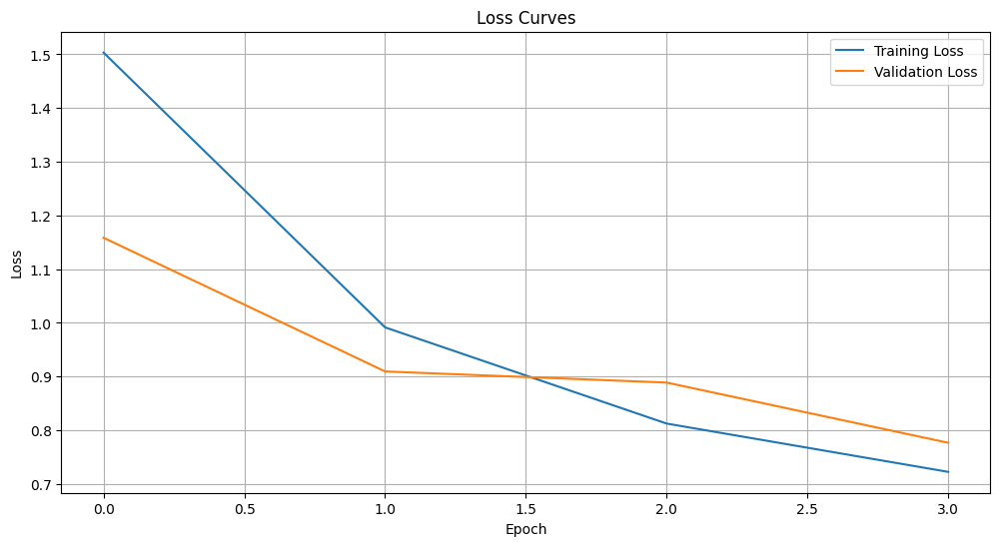

234/234 [==============================] - 48s 204ms/step - loss: 0.7223 - accuracy: 0.7654 - val_loss: 0.7765 - val_accuracy: 0.7705
Epoch 5/60
234/234 [==============================] - ETA: 0s - loss: 0.6428 - accuracy: 0.7907

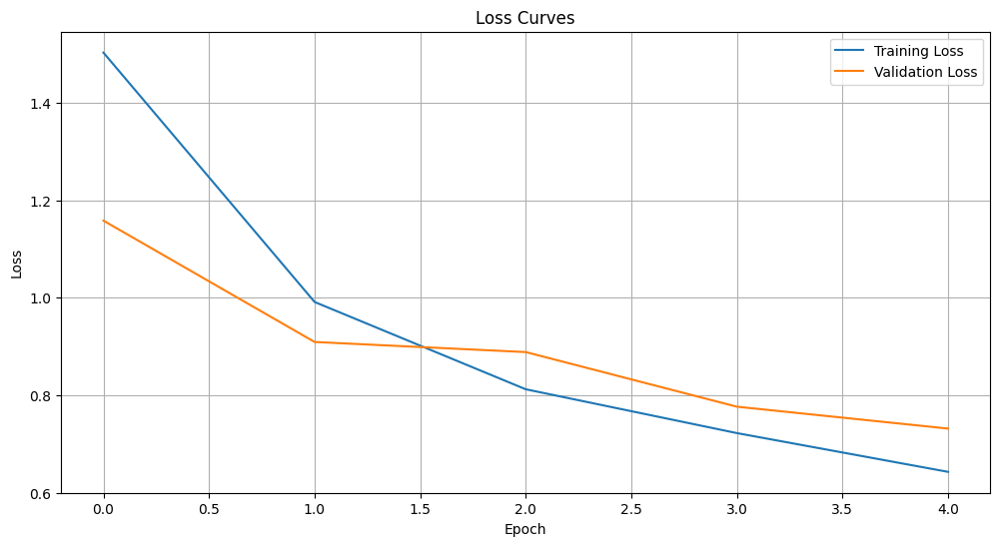

234/234 [==============================] - 48s 205ms/step - loss: 0.6428 - accuracy: 0.7907 - val_loss: 0.7316 - val_accuracy: 0.7753
Epoch 6/60
234/234 [==============================] - ETA: 0s - loss: 0.5789 - accuracy: 0.8078

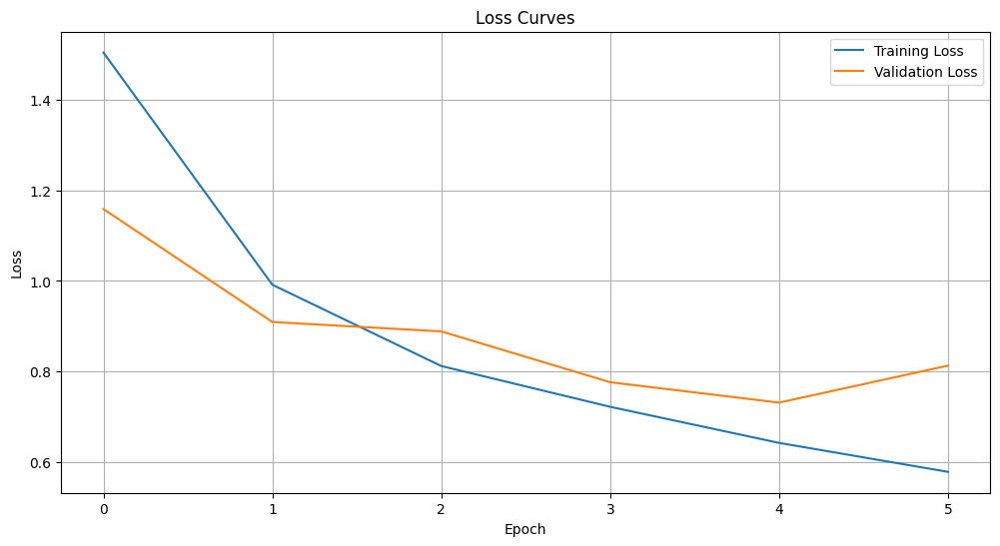

234/234 [==============================] - 48s 205ms/step - loss: 0.5789 - accuracy: 0.8078 - val_loss: 0.8132 - val_accuracy: 0.7667
Epoch 7/60
234/234 [==============================] - ETA: 0s - loss: 0.5166 - accuracy: 0.8257

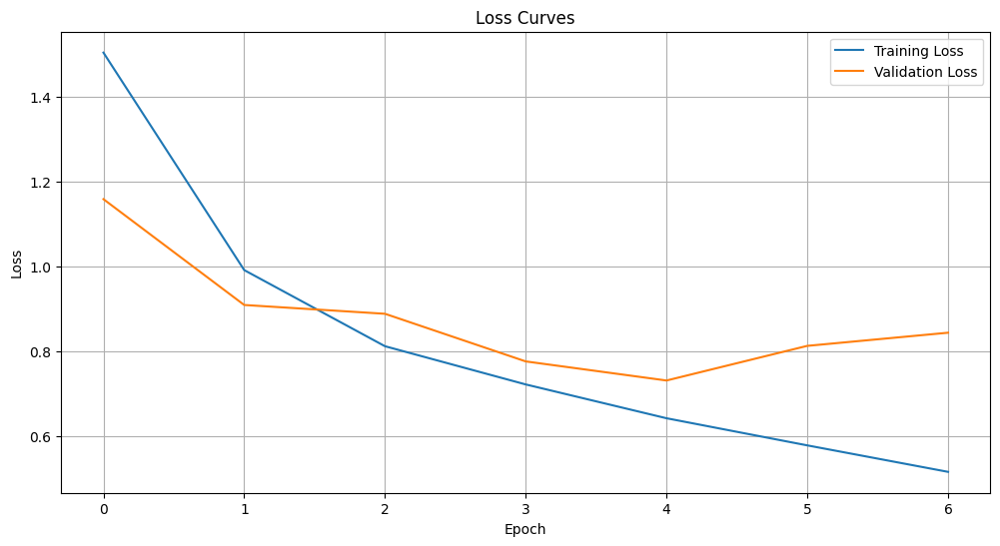

234/234 [==============================] - 48s 205ms/step - loss: 0.5166 - accuracy: 0.8257 - val_loss: 0.8441 - val_accuracy: 0.7710
Epoch 8/60
234/234 [==============================] - ETA: 0s - loss: 0.4571 - accuracy: 0.8465

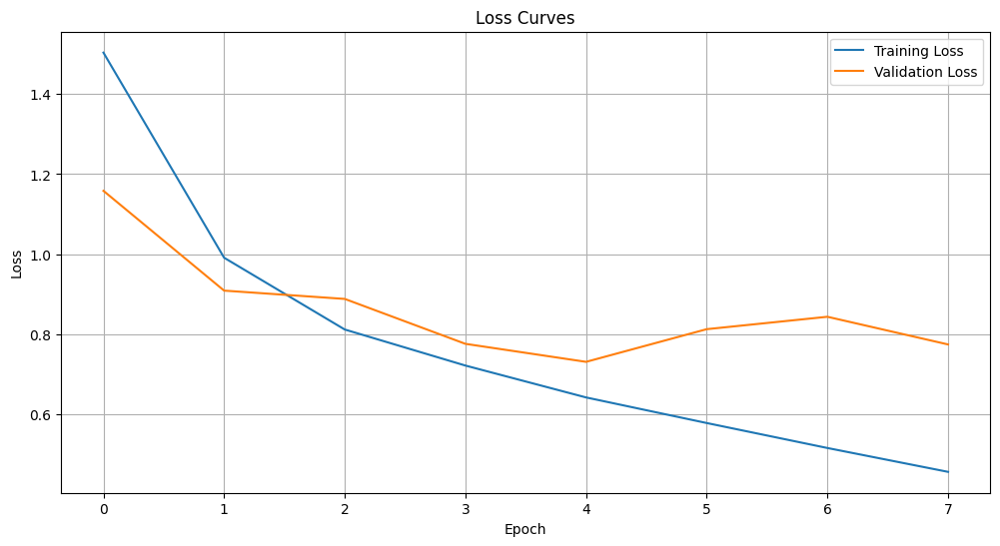

234/234 [==============================] - 48s 205ms/step - loss: 0.4571 - accuracy: 0.8465 - val_loss: 0.7750 - val_accuracy: 0.7807
Epoch 9/60
234/234 [==============================] - ETA: 0s - loss: 0.3991 - accuracy: 0.8668

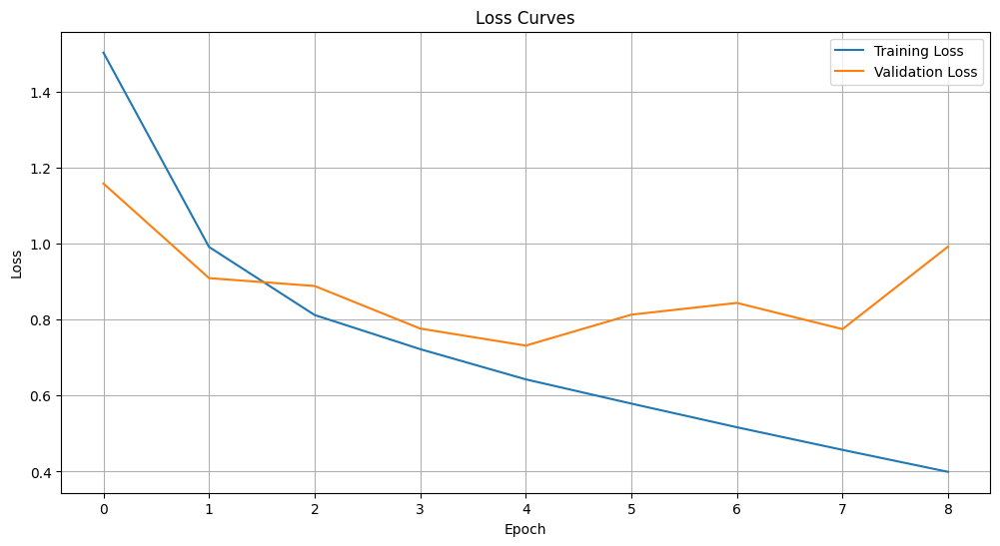

234/234 [==============================] - 48s 205ms/step - loss: 0.3991 - accuracy: 0.8668 - val_loss: 0.9924 - val_accuracy: 0.7565
Epoch 10/60
234/234 [==============================] - ETA: 0s - loss: 0.3664 - accuracy: 0.8745

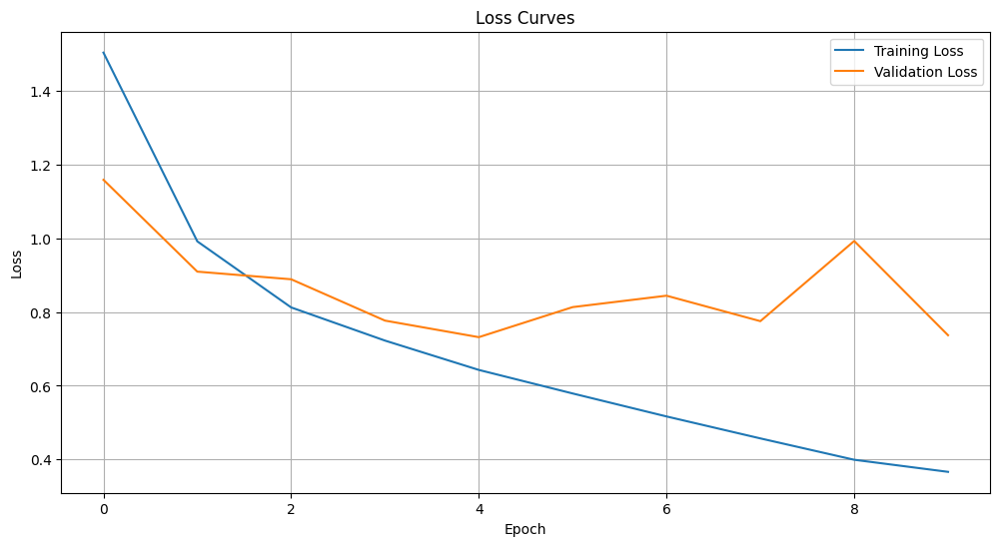

234/234 [==============================] - 48s 205ms/step - loss: 0.3664 - accuracy: 0.8745 - val_loss: 0.7369 - val_accuracy: 0.7974
Epoch 11/60
234/234 [==============================] - ETA: 0s - loss: 0.3357 - accuracy: 0.8859

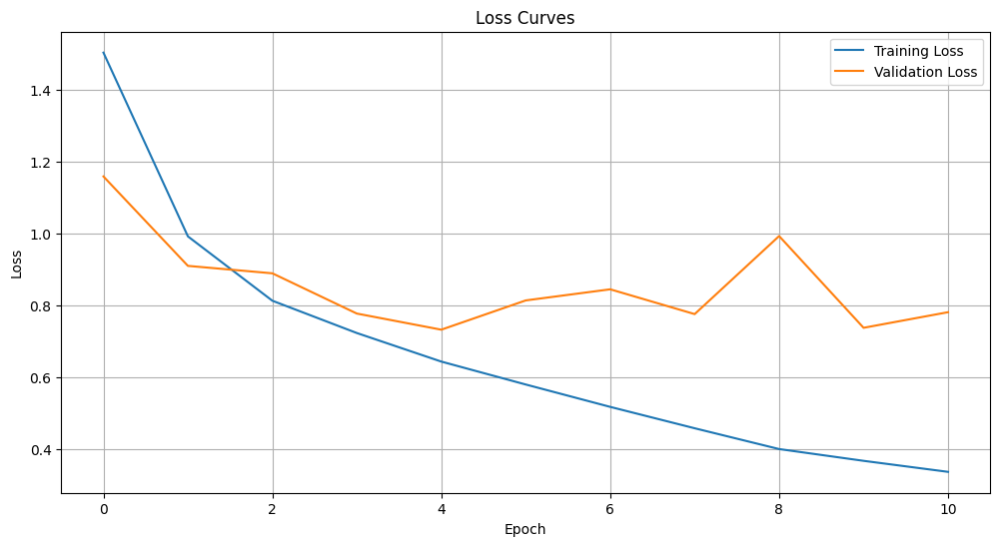

234/234 [==============================] - 48s 205ms/step - loss: 0.3357 - accuracy: 0.8859 - val_loss: 0.7804 - val_accuracy: 0.8050
Epoch 12/60
234/234 [==============================] - ETA: 0s - loss: 0.2941 - accuracy: 0.8998

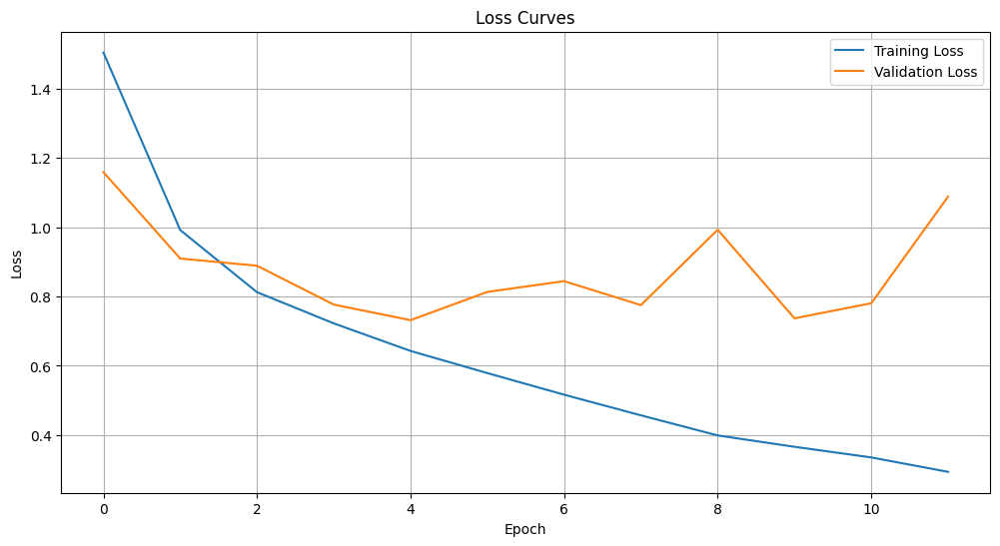

234/234 [==============================] - 48s 205ms/step - loss: 0.2941 - accuracy: 0.8998 - val_loss: 1.0878 - val_accuracy: 0.7737
Epoch 13/60
234/234 [==============================] - ETA: 0s - loss: 0.2507 - accuracy: 0.9131

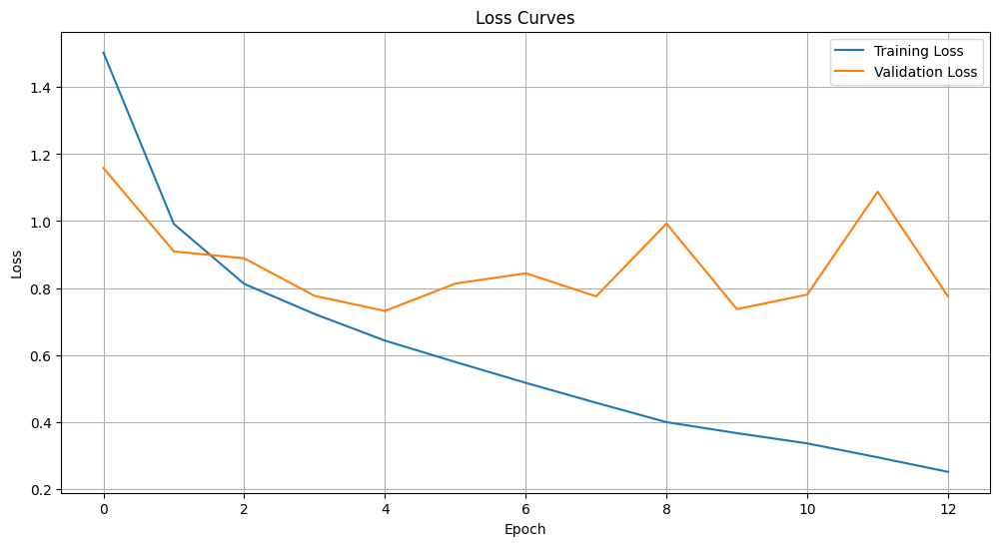

234/234 [==============================] - 48s 205ms/step - loss: 0.2507 - accuracy: 0.9131 - val_loss: 0.7746 - val_accuracy: 0.8044
Epoch 14/60
234/234 [==============================] - ETA: 0s - loss: 0.2404 - accuracy: 0.9185

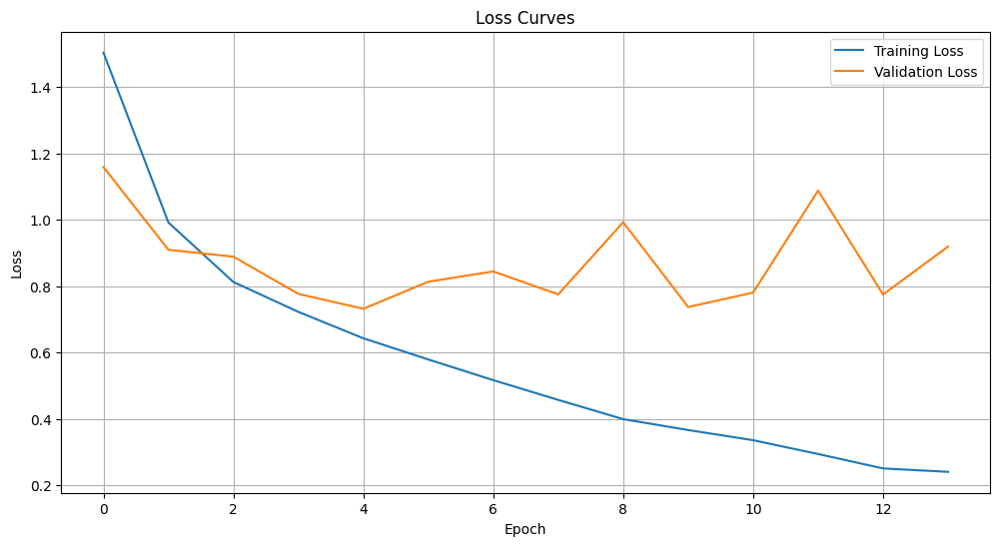

234/234 [==============================] - 48s 205ms/step - loss: 0.2404 - accuracy: 0.9185 - val_loss: 0.9192 - val_accuracy: 0.7936
Epoch 15/60
234/234 [==============================] - ETA: 0s - loss: 0.2197 - accuracy: 0.9253

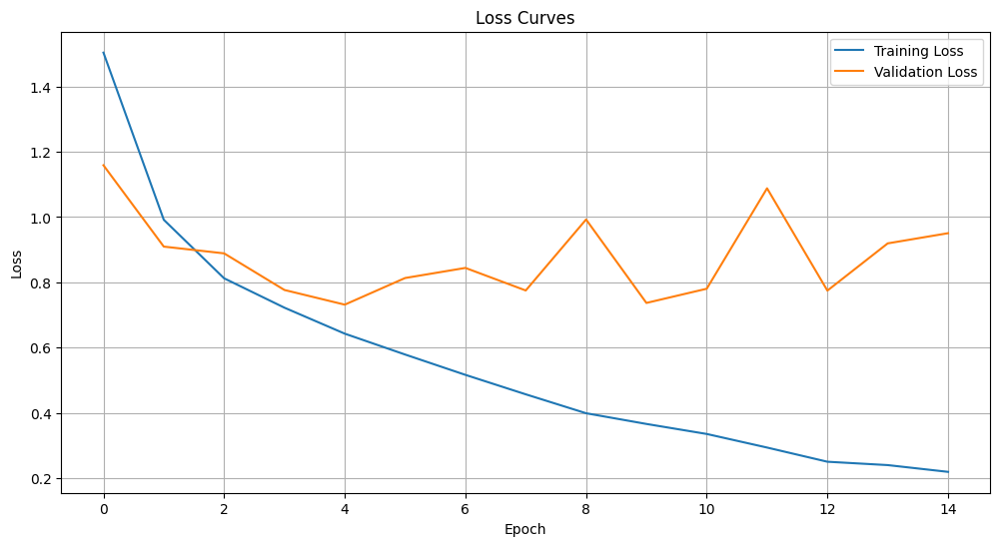

234/234 [==============================] - 48s 205ms/step - loss: 0.2197 - accuracy: 0.9253 - val_loss: 0.9504 - val_accuracy: 0.7926
Epoch 16/60
234/234 [==============================] - ETA: 0s - loss: 0.1942 - accuracy: 0.9353

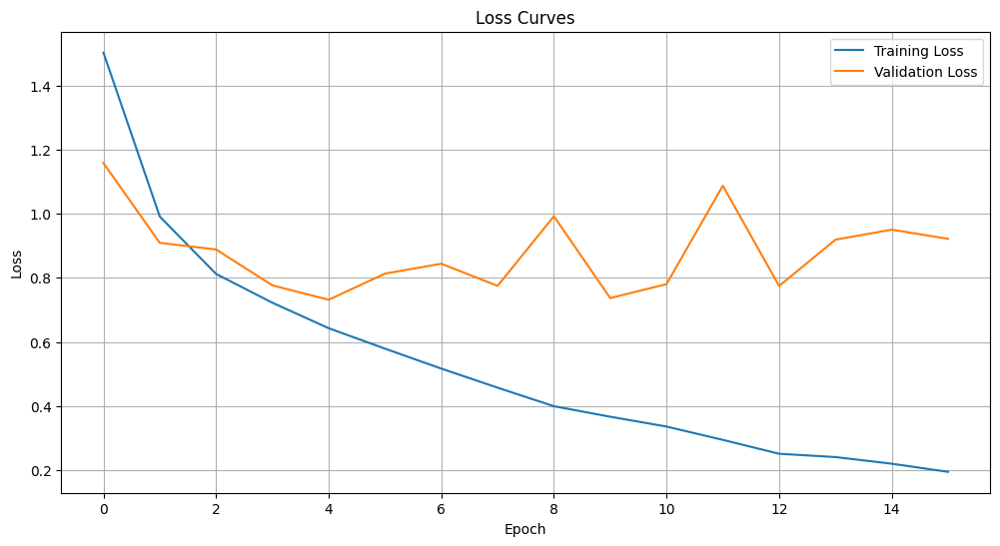

234/234 [==============================] - 48s 204ms/step - loss: 0.1942 - accuracy: 0.9353 - val_loss: 0.9218 - val_accuracy: 0.7942
Epoch 17/60
234/234 [==============================] - ETA: 0s - loss: 0.1581 - accuracy: 0.9470

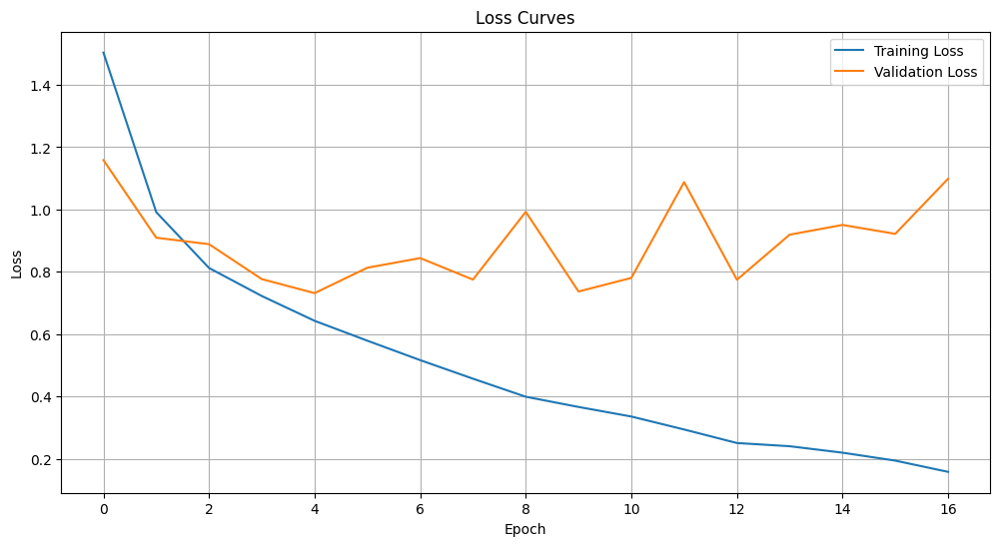

234/234 [==============================] - 48s 204ms/step - loss: 0.1581 - accuracy: 0.9470 - val_loss: 1.0985 - val_accuracy: 0.7904
Epoch 18/60
234/234 [==============================] - ETA: 0s - loss: 0.1394 - accuracy: 0.9537

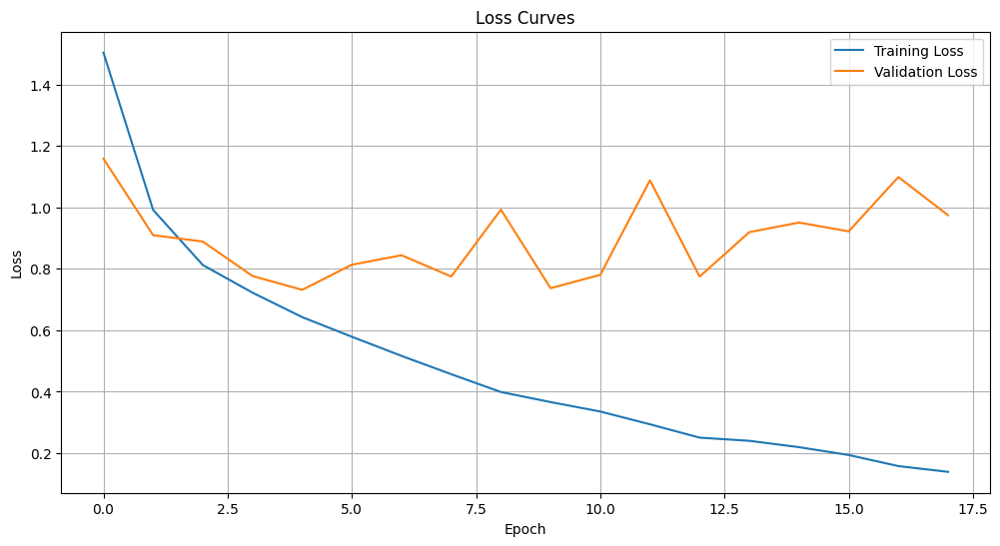

234/234 [==============================] - 48s 204ms/step - loss: 0.1394 - accuracy: 0.9537 - val_loss: 0.9743 - val_accuracy: 0.7980
Epoch 19/60
234/234 [==============================] - ETA: 0s - loss: 0.1382 - accuracy: 0.9551

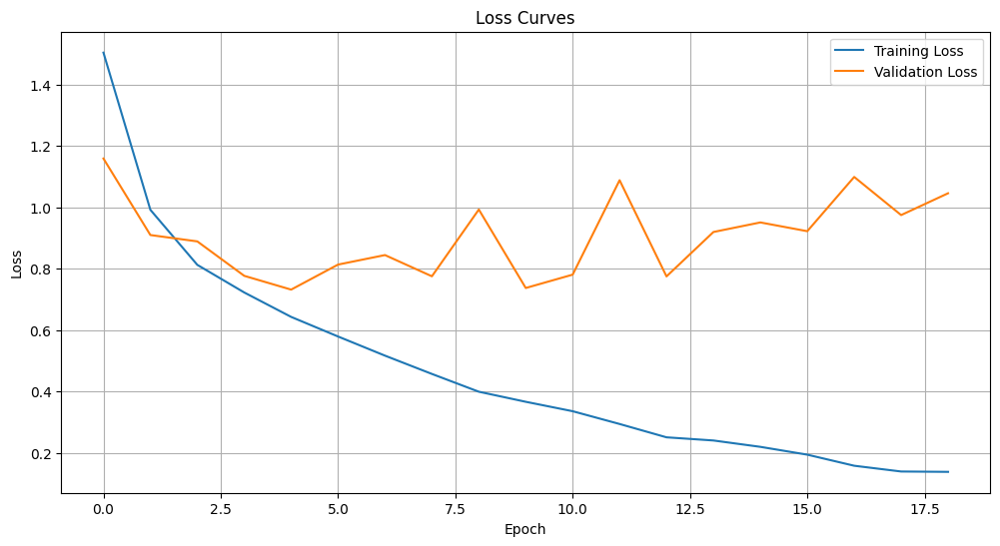

234/234 [==============================] - 48s 204ms/step - loss: 0.1382 - accuracy: 0.9551 - val_loss: 1.0453 - val_accuracy: 0.7963
Epoch 20/60
234/234 [==============================] - ETA: 0s - loss: 0.1390 - accuracy: 0.9537

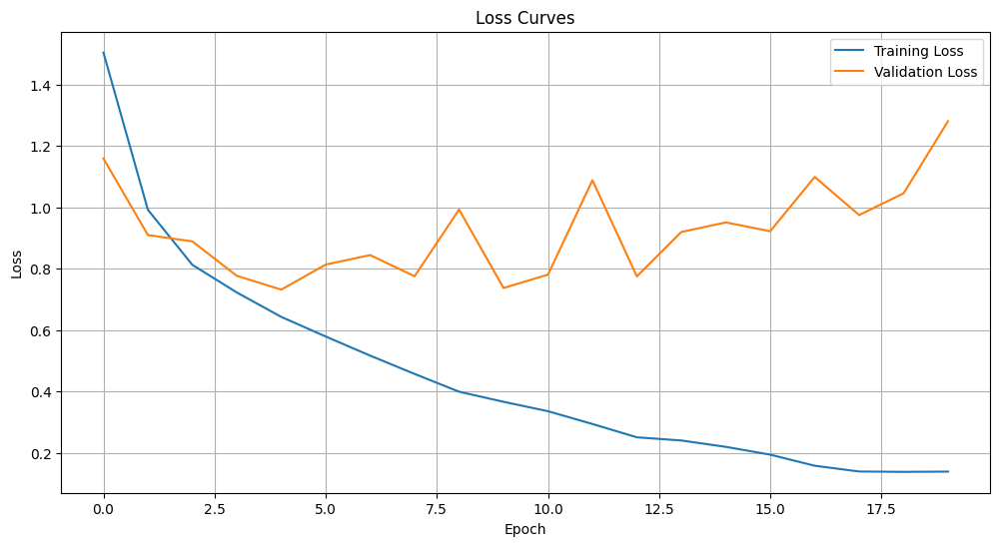

234/234 [==============================] - 48s 204ms/step - loss: 0.1390 - accuracy: 0.9537 - val_loss: 1.2804 - val_accuracy: 0.7861
Epoch 21/60
234/234 [==============================] - ETA: 0s - loss: 0.1065 - accuracy: 0.9652

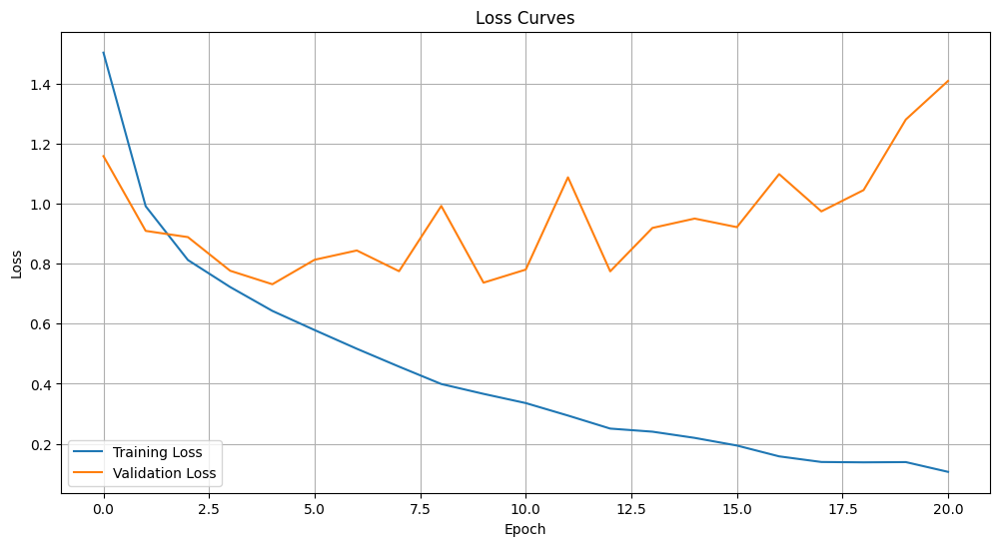

234/234 [==============================] - 48s 204ms/step - loss: 0.1065 - accuracy: 0.9652 - val_loss: 1.4090 - val_accuracy: 0.7958
Epoch 22/60
234/234 [==============================] - ETA: 0s - loss: 0.1172 - accuracy: 0.9621

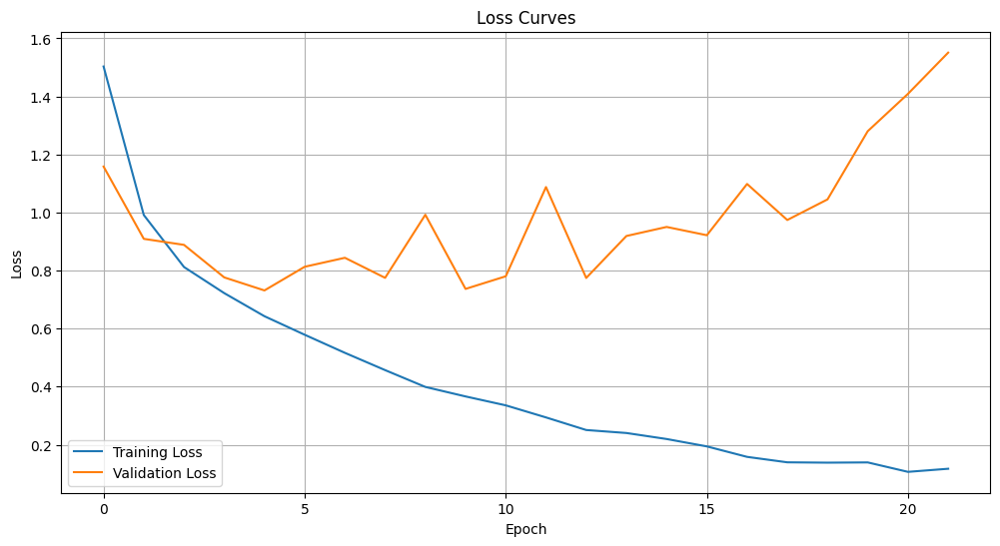

234/234 [==============================] - 48s 204ms/step - loss: 0.1172 - accuracy: 0.9621 - val_loss: 1.5510 - val_accuracy: 0.7705
Epoch 23/60
234/234 [==============================] - ETA: 0s - loss: 0.1053 - accuracy: 0.9655

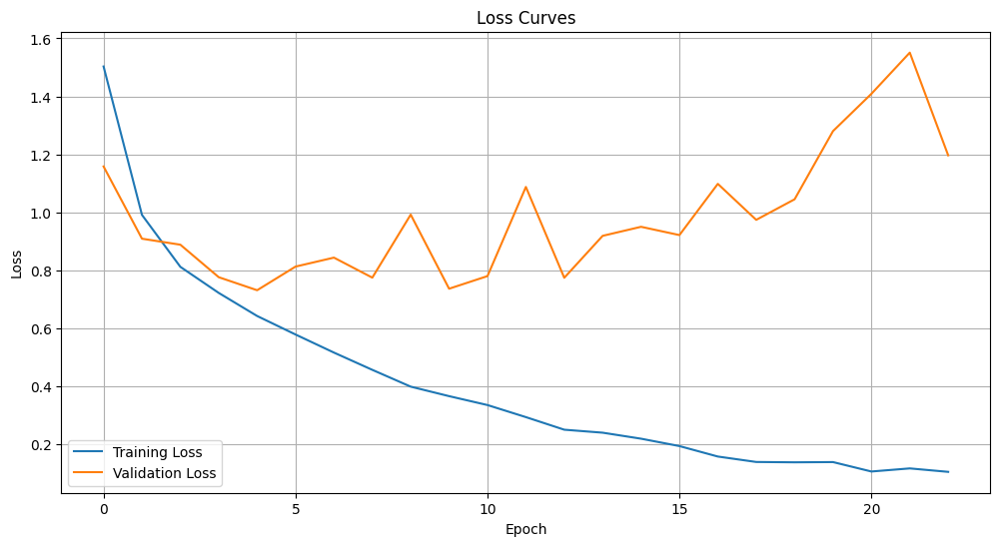

234/234 [==============================] - 48s 204ms/step - loss: 0.1053 - accuracy: 0.9655 - val_loss: 1.1968 - val_accuracy: 0.7996
Epoch 24/60
234/234 [==============================] - ETA: 0s - loss: 0.1015 - accuracy: 0.9660

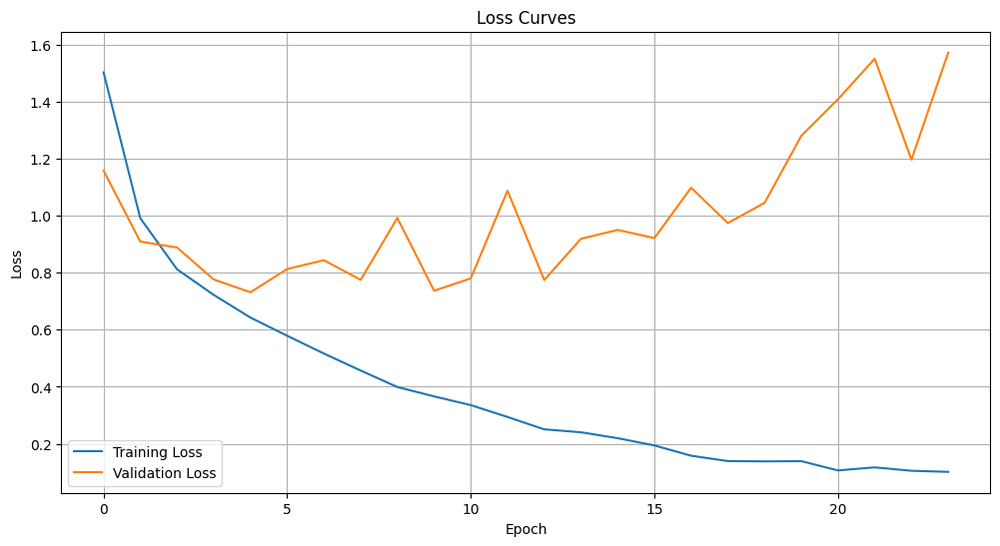

234/234 [==============================] - 48s 204ms/step - loss: 0.1015 - accuracy: 0.9660 - val_loss: 1.5724 - val_accuracy: 0.7656
Epoch 25/60
234/234 [==============================] - ETA: 0s - loss: 0.0860 - accuracy: 0.9697

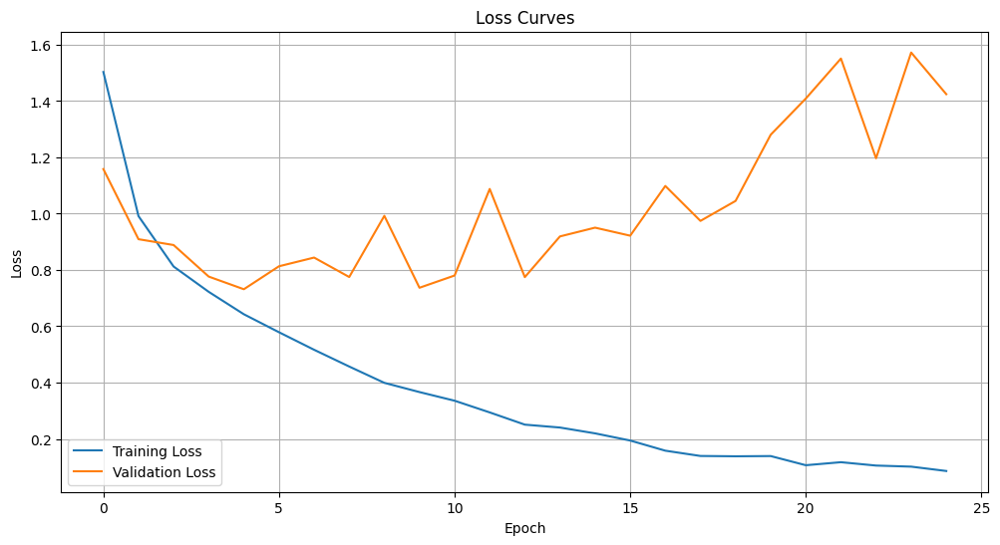

234/234 [==============================] - 48s 204ms/step - loss: 0.0860 - accuracy: 0.9697 - val_loss: 1.4244 - val_accuracy: 0.7893
Epoch 26/60
234/234 [==============================] - ETA: 0s - loss: 0.0839 - accuracy: 0.9719

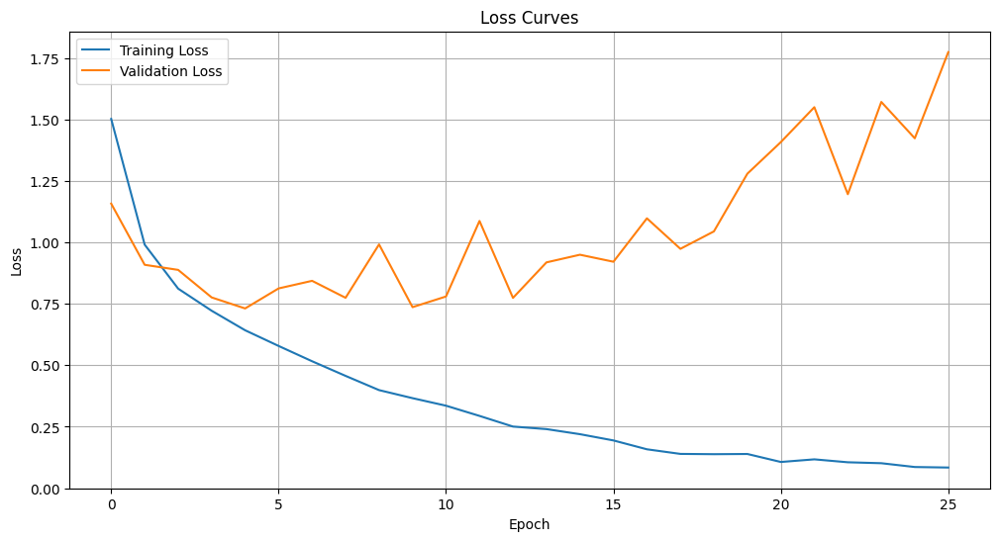

234/234 [==============================] - 48s 204ms/step - loss: 0.0839 - accuracy: 0.9719 - val_loss: 1.7752 - val_accuracy: 0.7619
Epoch 27/60
234/234 [==============================] - ETA: 0s - loss: 0.0736 - accuracy: 0.9721

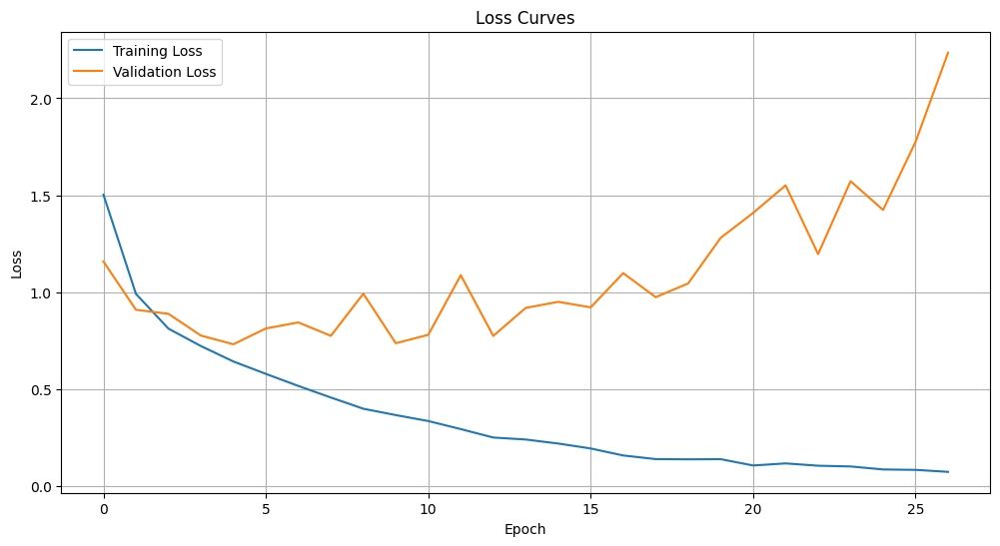

234/234 [==============================] - 49s 208ms/step - loss: 0.0736 - accuracy: 0.9721 - val_loss: 2.2356 - val_accuracy: 0.7376
Epoch 28/60
234/234 [==============================] - ETA: 0s - loss: 0.0816 - accuracy: 0.9713

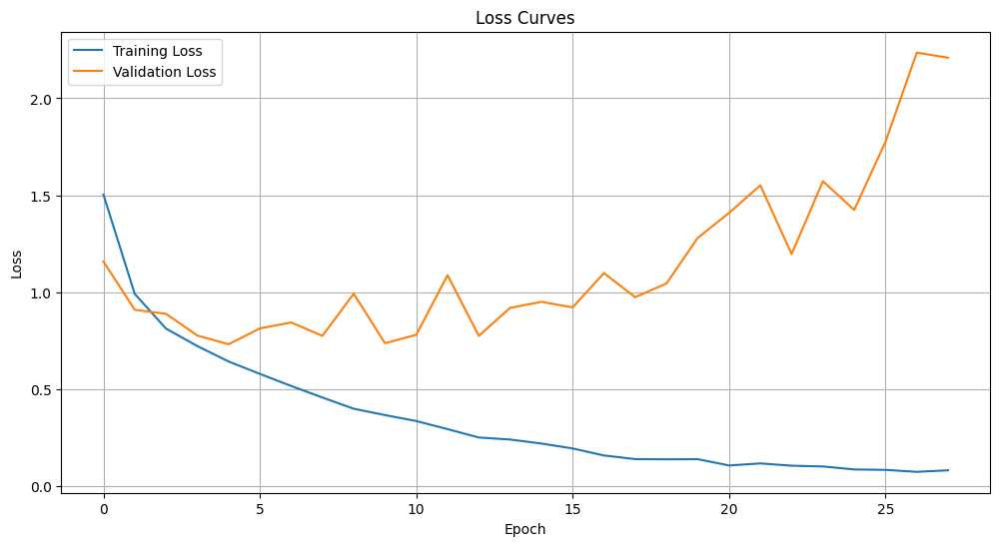

234/234 [==============================] - 48s 204ms/step - loss: 0.0816 - accuracy: 0.9713 - val_loss: 2.2094 - val_accuracy: 0.7505
Epoch 29/60
234/234 [==============================] - ETA: 0s - loss: 0.0736 - accuracy: 0.9744

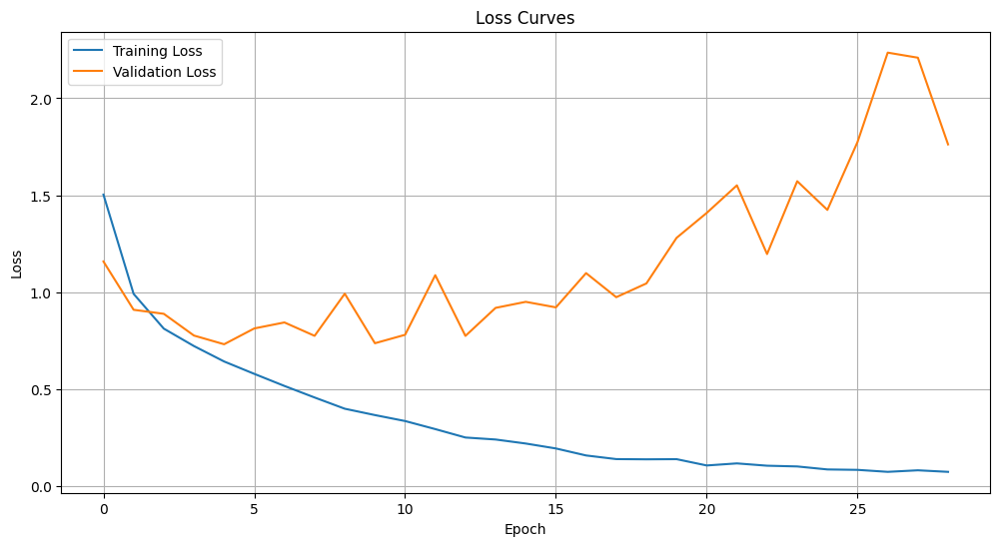

234/234 [==============================] - 48s 204ms/step - loss: 0.0736 - accuracy: 0.9744 - val_loss: 1.7624 - val_accuracy: 0.7748
Epoch 30/60
234/234 [==============================] - ETA: 0s - loss: 0.0841 - accuracy: 0.9728

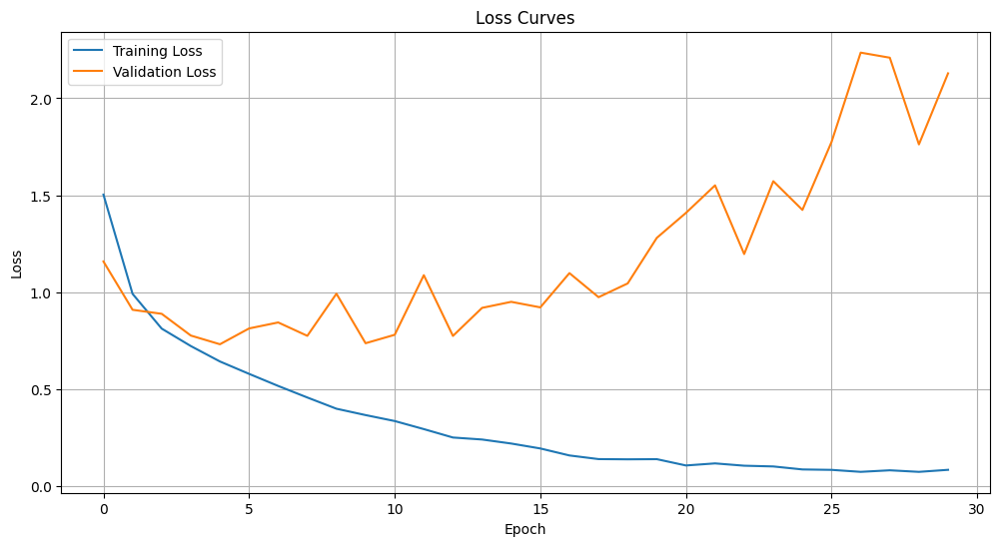

234/234 [==============================] - 48s 205ms/step - loss: 0.0841 - accuracy: 0.9728 - val_loss: 2.1287 - val_accuracy: 0.7694
Epoch 31/60
234/234 [==============================] - ETA: 0s - loss: 0.0696 - accuracy: 0.9800

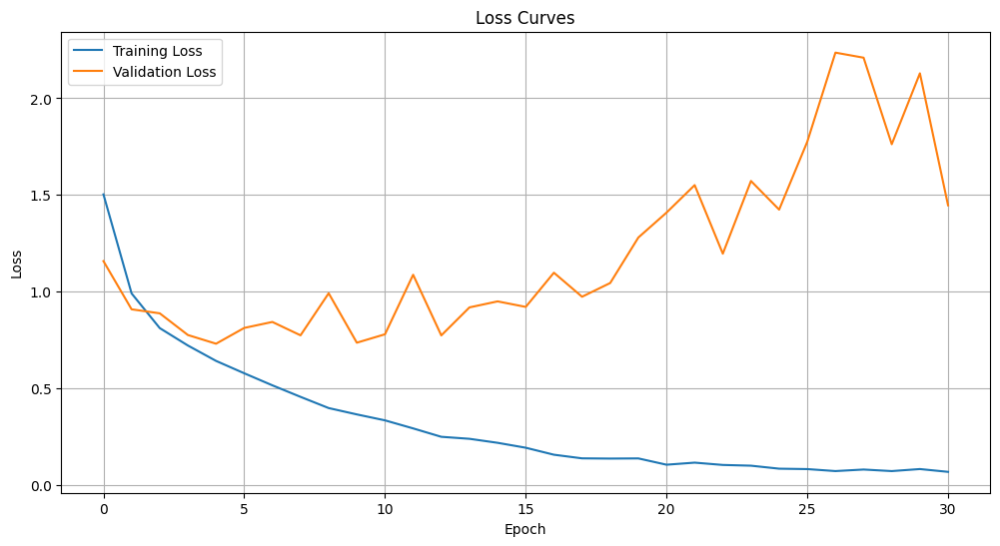

234/234 [==============================] - 48s 205ms/step - loss: 0.0696 - accuracy: 0.9800 - val_loss: 1.4468 - val_accuracy: 0.7726
Epoch 32/60
234/234 [==============================] - ETA: 0s - loss: 0.0646 - accuracy: 0.9796

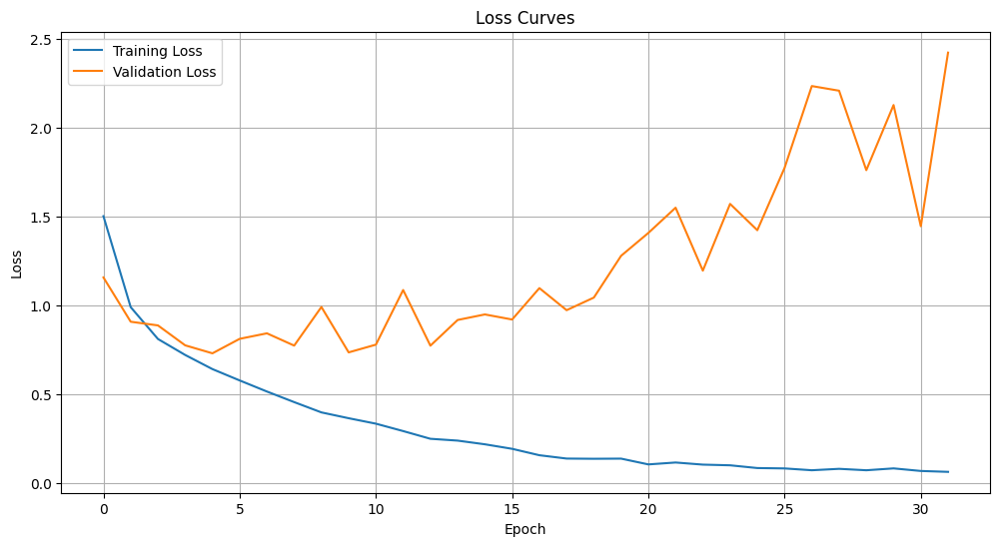

234/234 [==============================] - 48s 205ms/step - loss: 0.0646 - accuracy: 0.9796 - val_loss: 2.4237 - val_accuracy: 0.7484
Epoch 33/60
234/234 [==============================] - ETA: 0s - loss: 0.0533 - accuracy: 0.9802

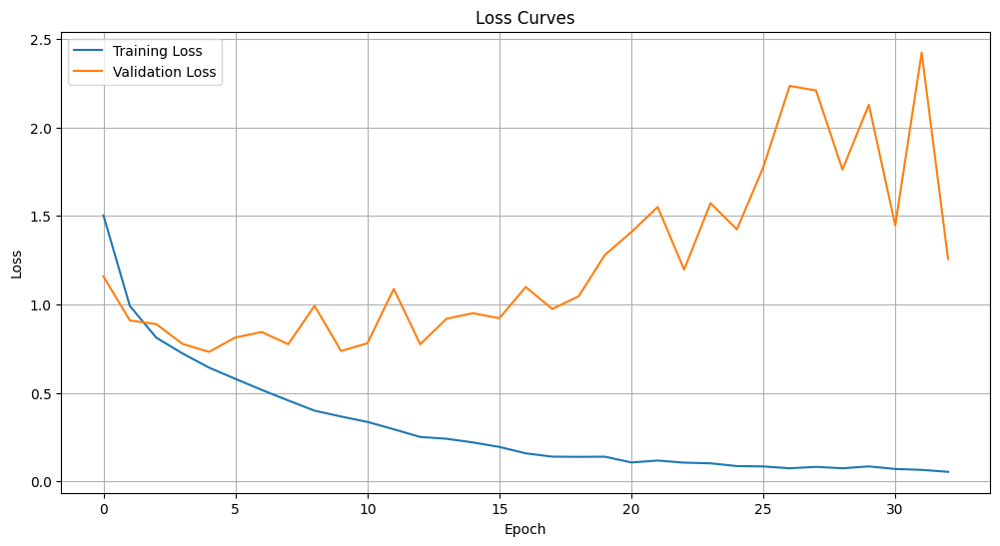

234/234 [==============================] - 48s 205ms/step - loss: 0.0533 - accuracy: 0.9802 - val_loss: 1.2568 - val_accuracy: 0.7963
Epoch 34/60
234/234 [==============================] - ETA: 0s - loss: 0.0615 - accuracy: 0.9809

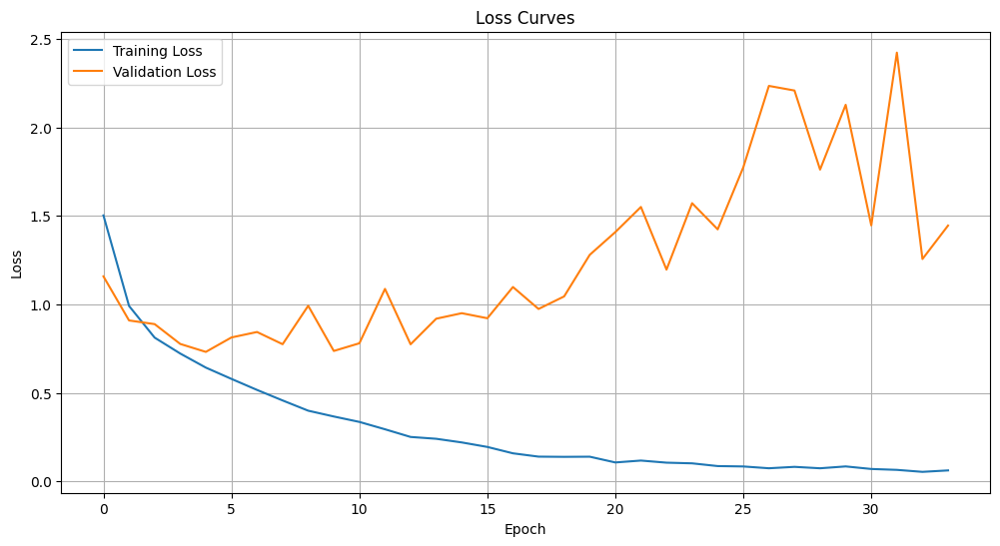

234/234 [==============================] - 48s 205ms/step - loss: 0.0615 - accuracy: 0.9809 - val_loss: 1.4459 - val_accuracy: 0.7823
Epoch 35/60
234/234 [==============================] - ETA: 0s - loss: 0.0449 - accuracy: 0.9859

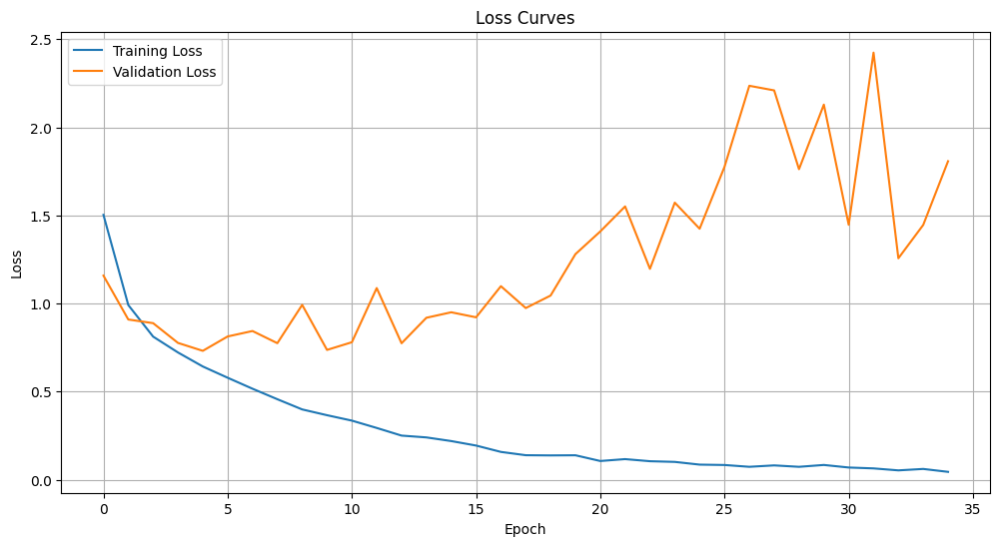

234/234 [==============================] - 48s 205ms/step - loss: 0.0449 - accuracy: 0.9859 - val_loss: 1.8075 - val_accuracy: 0.7802
Epoch 36/60
234/234 [==============================] - ETA: 0s - loss: 0.0524 - accuracy: 0.9818

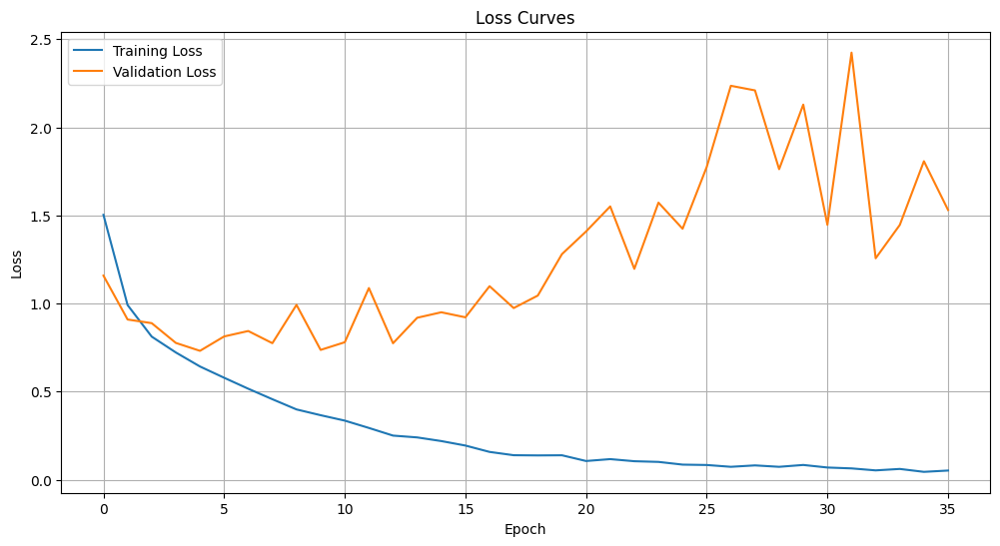

234/234 [==============================] - 48s 205ms/step - loss: 0.0524 - accuracy: 0.9818 - val_loss: 1.5309 - val_accuracy: 0.7980
Epoch 37/60
234/234 [==============================] - ETA: 0s - loss: 0.0468 - accuracy: 0.9846

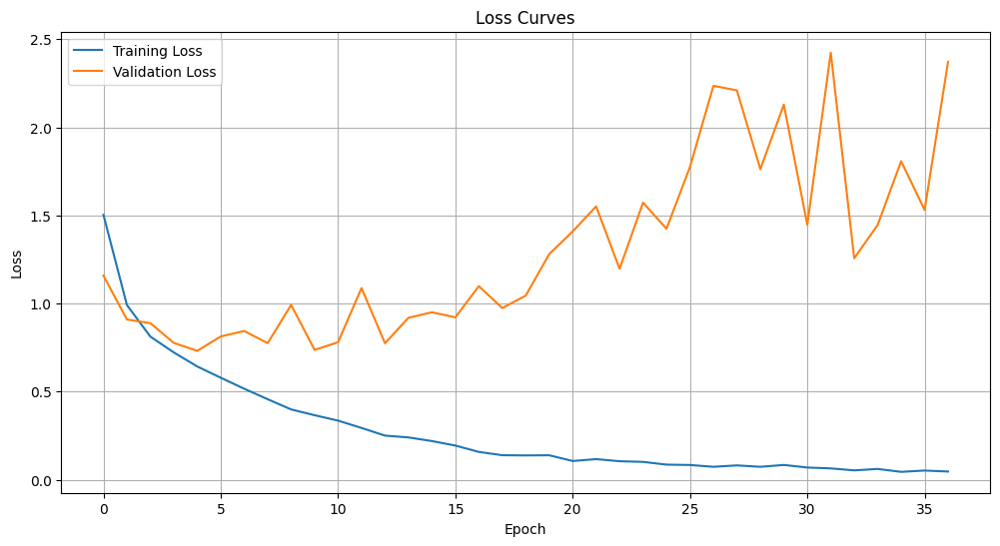

234/234 [==============================] - 48s 205ms/step - loss: 0.0468 - accuracy: 0.9846 - val_loss: 2.3717 - val_accuracy: 0.7640
Epoch 38/60
234/234 [==============================] - ETA: 0s - loss: 0.0564 - accuracy: 0.9814

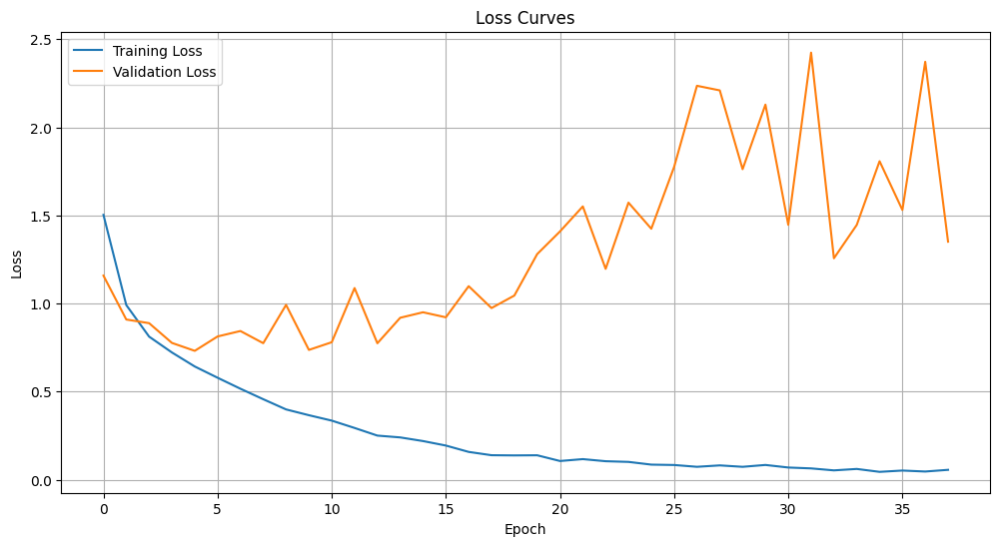

234/234 [==============================] - 48s 205ms/step - loss: 0.0564 - accuracy: 0.9814 - val_loss: 1.3510 - val_accuracy: 0.7834
Epoch 39/60
234/234 [==============================] - ETA: 0s - loss: 0.0690 - accuracy: 0.9810

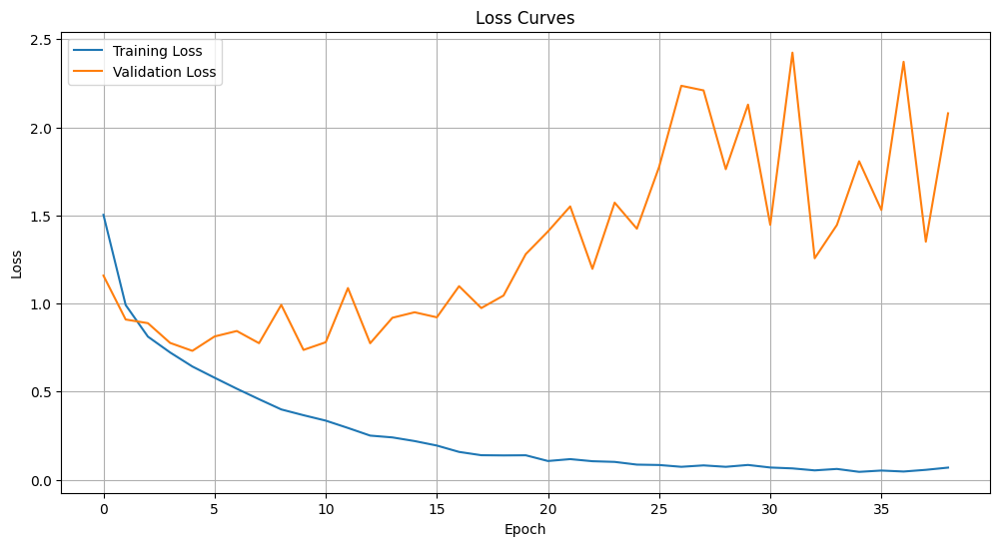

234/234 [==============================] - 48s 205ms/step - loss: 0.0690 - accuracy: 0.9810 - val_loss: 2.0793 - val_accuracy: 0.7710
Epoch 40/60
234/234 [==============================] - ETA: 0s - loss: 0.0603 - accuracy: 0.9818

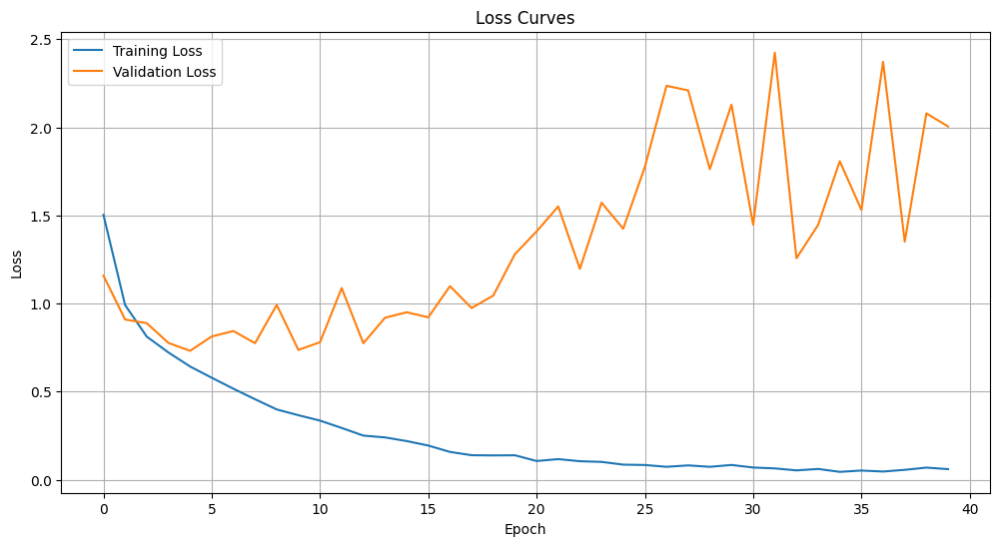

234/234 [==============================] - 48s 205ms/step - loss: 0.0603 - accuracy: 0.9818 - val_loss: 2.0046 - val_accuracy: 0.7548
Epoch 41/60
234/234 [==============================] - ETA: 0s - loss: 0.0399 - accuracy: 0.9866

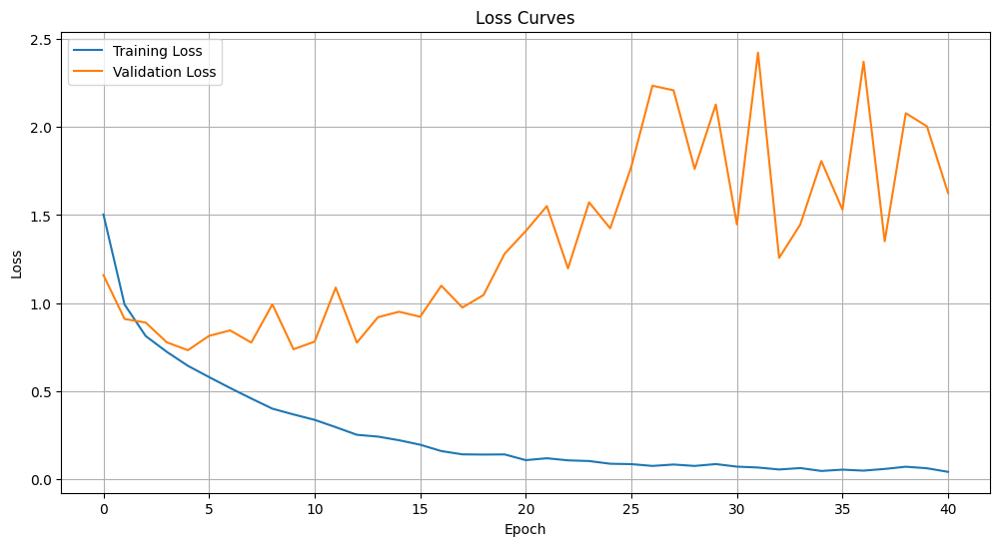

234/234 [==============================] - 48s 205ms/step - loss: 0.0399 - accuracy: 0.9866 - val_loss: 1.6255 - val_accuracy: 0.7904
Epoch 42/60
234/234 [==============================] - ETA: 0s - loss: 0.0494 - accuracy: 0.9839

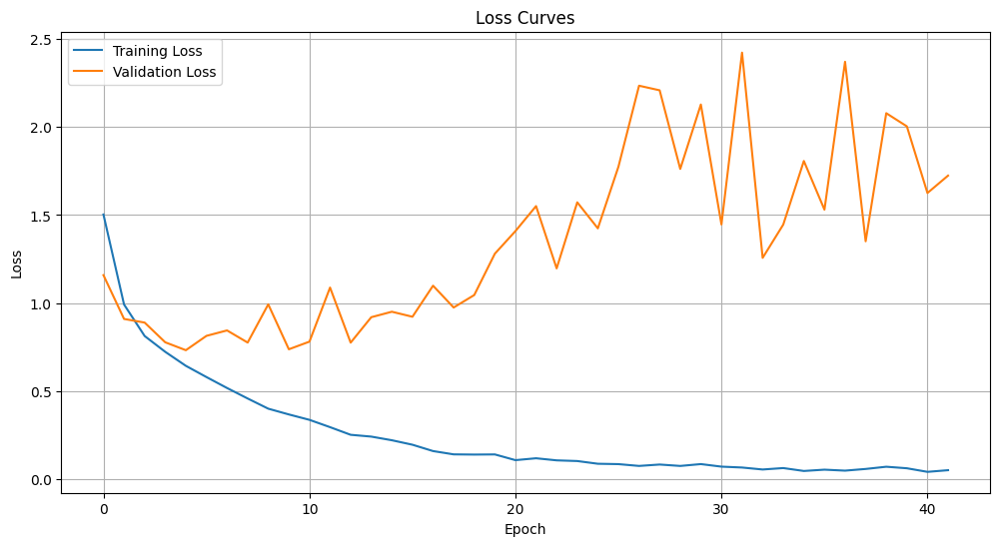

234/234 [==============================] - 48s 205ms/step - loss: 0.0494 - accuracy: 0.9839 - val_loss: 1.7244 - val_accuracy: 0.7807
Epoch 43/60
234/234 [==============================] - ETA: 0s - loss: 0.0364 - accuracy: 0.9869

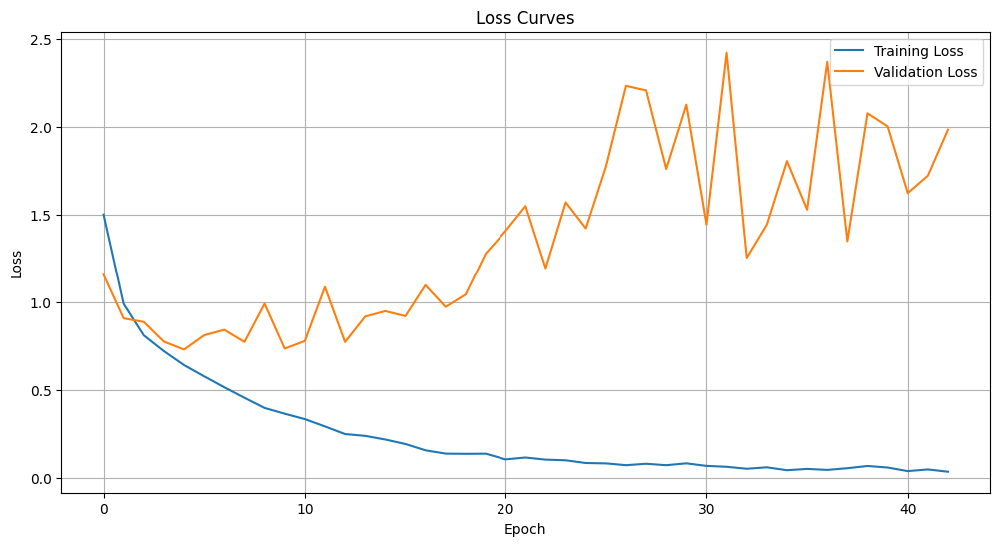

234/234 [==============================] - 48s 205ms/step - loss: 0.0364 - accuracy: 0.9869 - val_loss: 1.9866 - val_accuracy: 0.7769
Epoch 44/60
234/234 [==============================] - ETA: 0s - loss: 0.0426 - accuracy: 0.9839

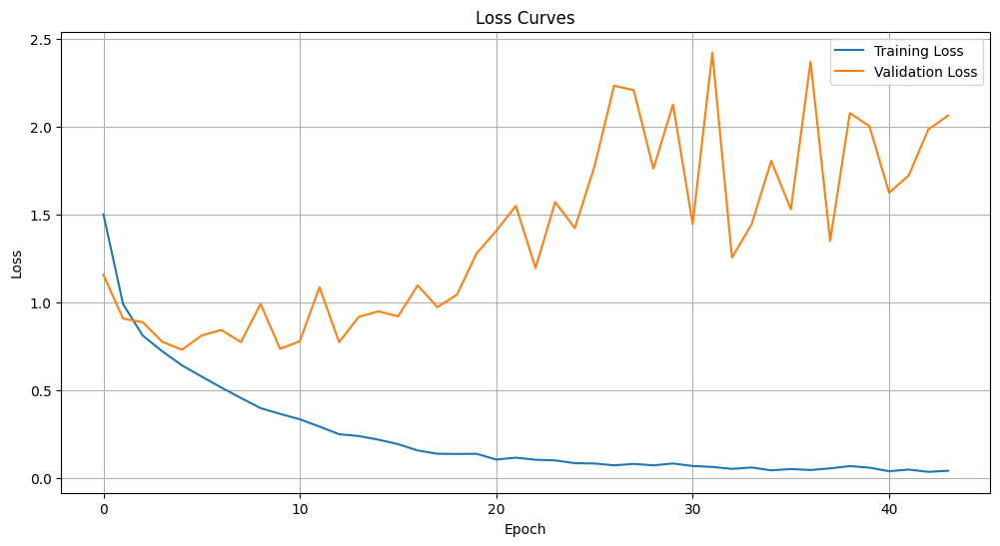

234/234 [==============================] - 48s 205ms/step - loss: 0.0426 - accuracy: 0.9839 - val_loss: 2.0651 - val_accuracy: 0.7721
Epoch 45/60
234/234 [==============================] - ETA: 0s - loss: 0.0430 - accuracy: 0.9857

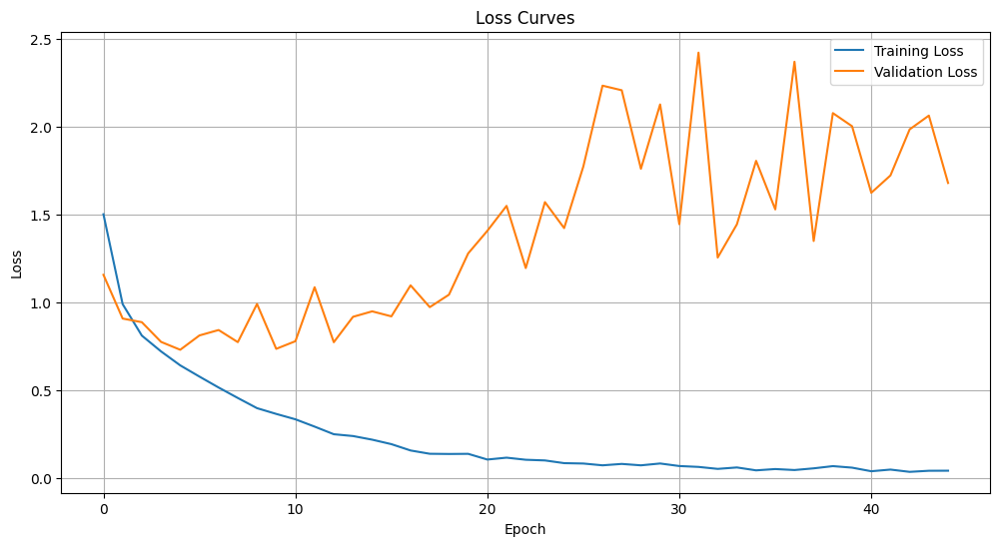

234/234 [==============================] - 48s 205ms/step - loss: 0.0430 - accuracy: 0.9857 - val_loss: 1.6815 - val_accuracy: 0.7823
Epoch 46/60
234/234 [==============================] - ETA: 0s - loss: 0.0453 - accuracy: 0.9855

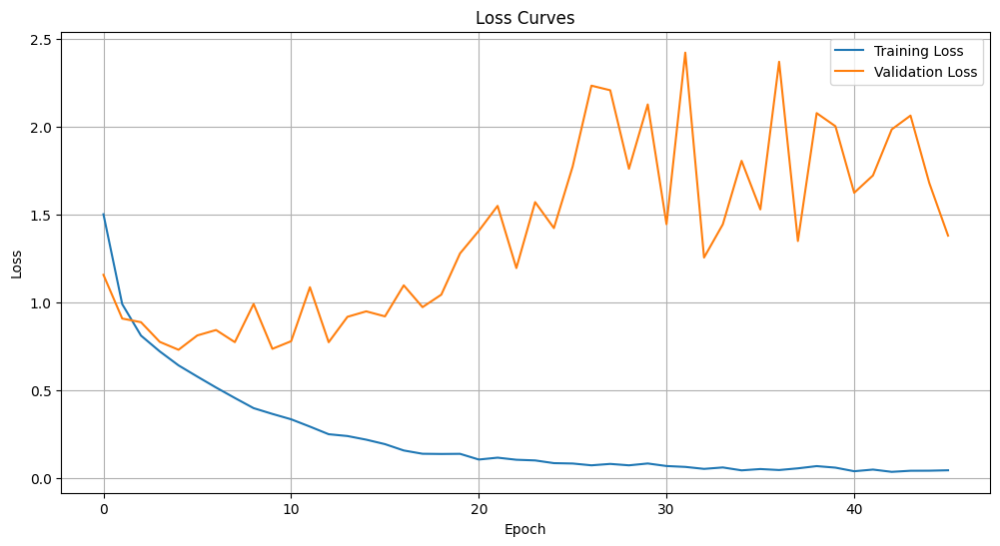

234/234 [==============================] - 48s 205ms/step - loss: 0.0453 - accuracy: 0.9855 - val_loss: 1.3816 - val_accuracy: 0.7909
Epoch 47/60
234/234 [==============================] - ETA: 0s - loss: 0.0345 - accuracy: 0.9884

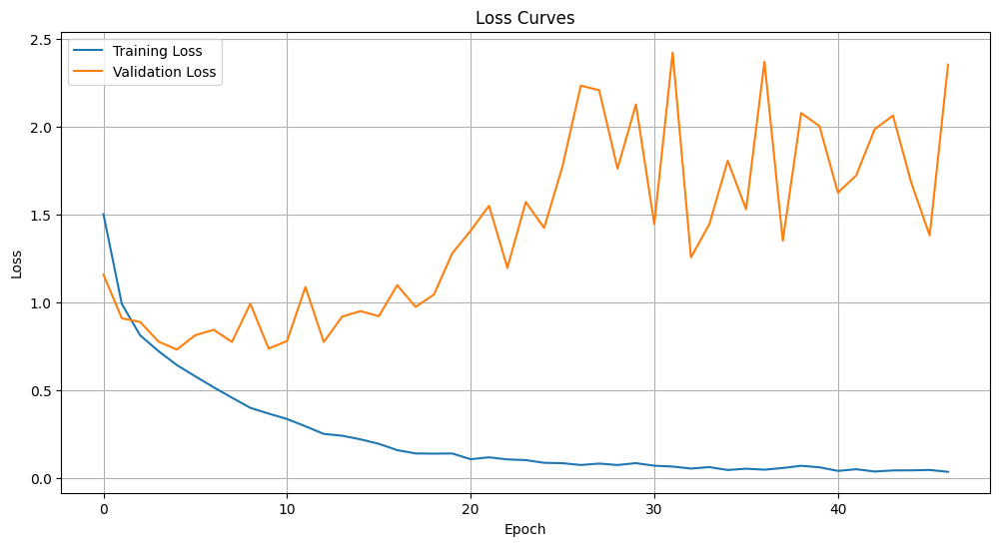

234/234 [==============================] - 48s 205ms/step - loss: 0.0345 - accuracy: 0.9884 - val_loss: 2.3554 - val_accuracy: 0.7559
Epoch 48/60
234/234 [==============================] - ETA: 0s - loss: 0.0305 - accuracy: 0.9906

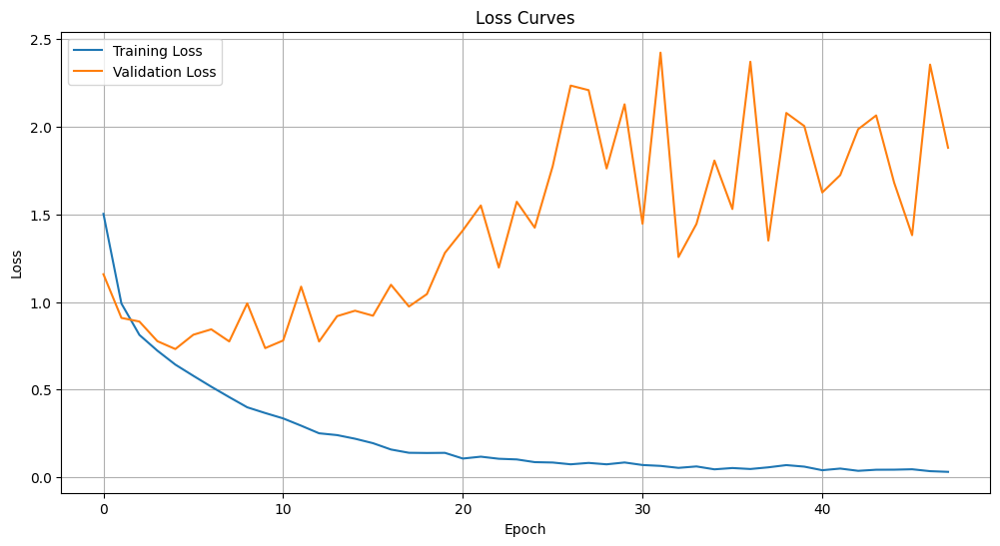

234/234 [==============================] - 48s 205ms/step - loss: 0.0305 - accuracy: 0.9906 - val_loss: 1.8806 - val_accuracy: 0.7883
Epoch 49/60
234/234 [==============================] - ETA: 0s - loss: 0.0421 - accuracy: 0.9886

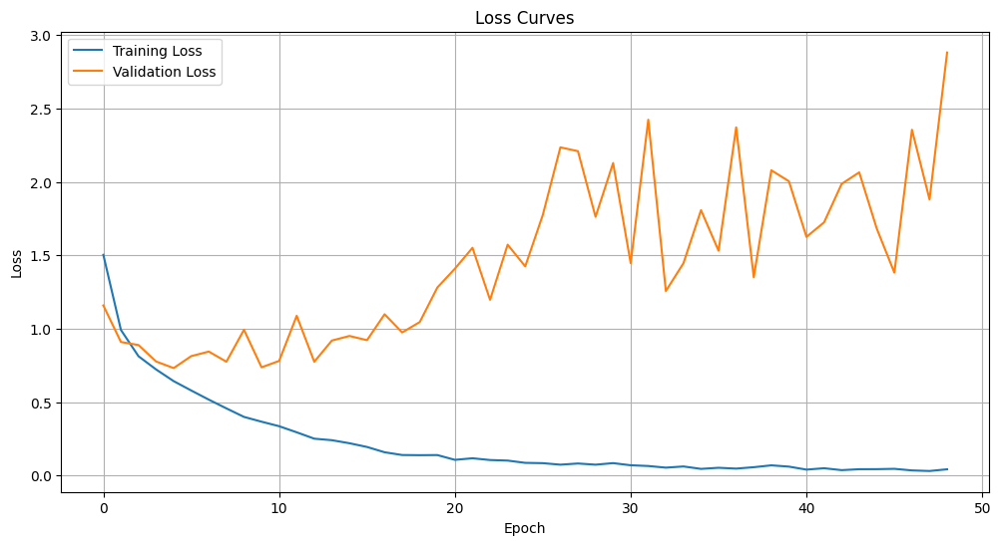

234/234 [==============================] - 48s 205ms/step - loss: 0.0421 - accuracy: 0.9886 - val_loss: 2.8815 - val_accuracy: 0.7527
Epoch 50/60
234/234 [==============================] - ETA: 0s - loss: 0.0453 - accuracy: 0.9845

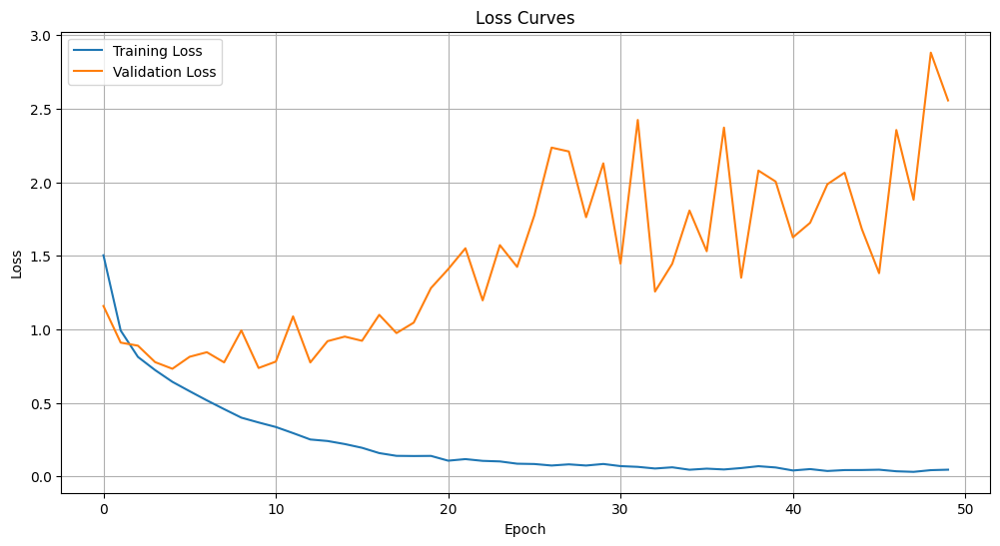

234/234 [==============================] - 48s 206ms/step - loss: 0.0453 - accuracy: 0.9845 - val_loss: 2.5567 - val_accuracy: 0.7462
Epoch 51/60
234/234 [==============================] - ETA: 0s - loss: 0.0334 - accuracy: 0.9885

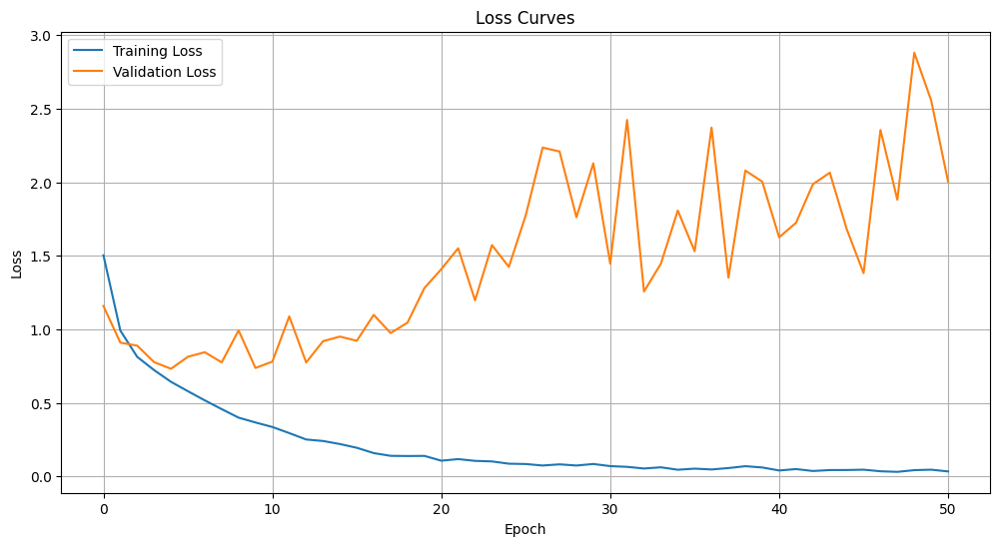

234/234 [==============================] - 48s 205ms/step - loss: 0.0334 - accuracy: 0.9885 - val_loss: 2.0053 - val_accuracy: 0.7883
Epoch 52/60
234/234 [==============================] - ETA: 0s - loss: 0.0342 - accuracy: 0.9894

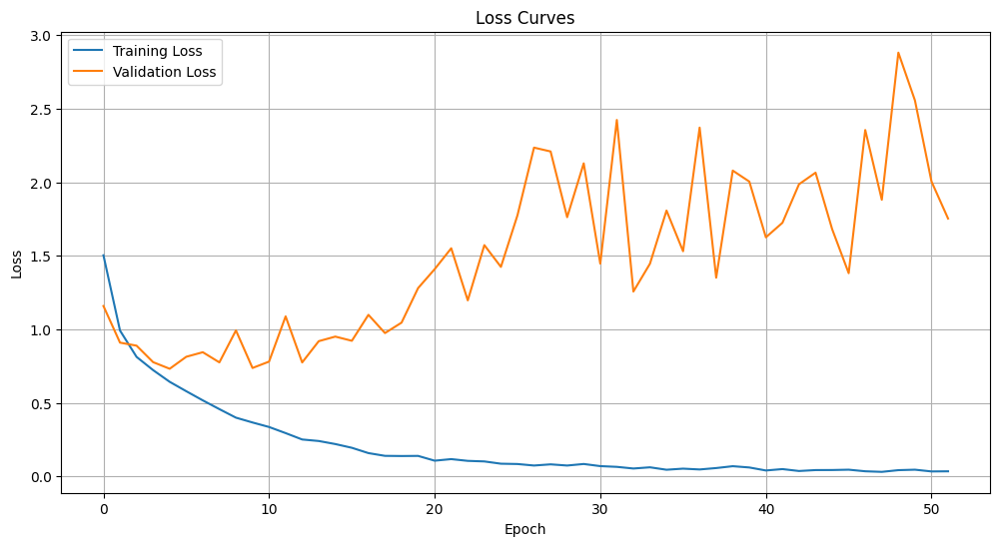

234/234 [==============================] - 48s 206ms/step - loss: 0.0342 - accuracy: 0.9894 - val_loss: 1.7533 - val_accuracy: 0.7893
Epoch 53/60
234/234 [==============================] - ETA: 0s - loss: 0.0306 - accuracy: 0.9901

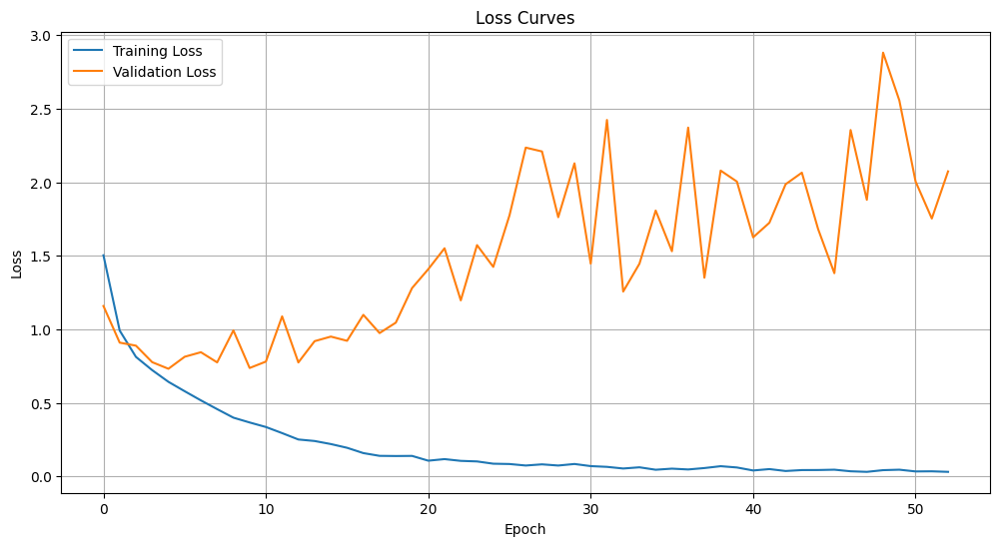

234/234 [==============================] - 48s 205ms/step - loss: 0.0306 - accuracy: 0.9901 - val_loss: 2.0740 - val_accuracy: 0.7818
Epoch 54/60
234/234 [==============================] - ETA: 0s - loss: 0.0361 - accuracy: 0.9886

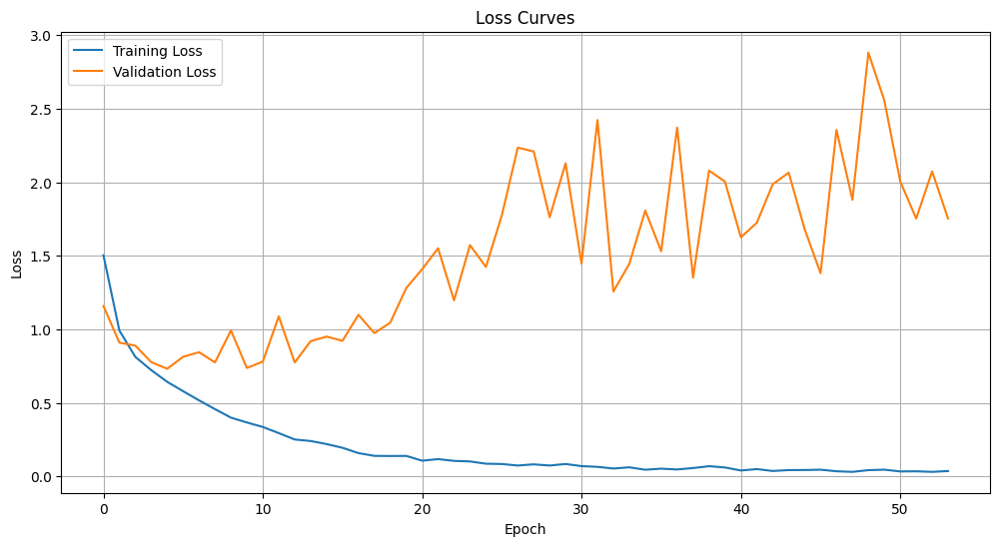

234/234 [==============================] - 48s 205ms/step - loss: 0.0361 - accuracy: 0.9886 - val_loss: 1.7530 - val_accuracy: 0.7694
Epoch 55/60
234/234 [==============================] - ETA: 0s - loss: 0.0344 - accuracy: 0.9873

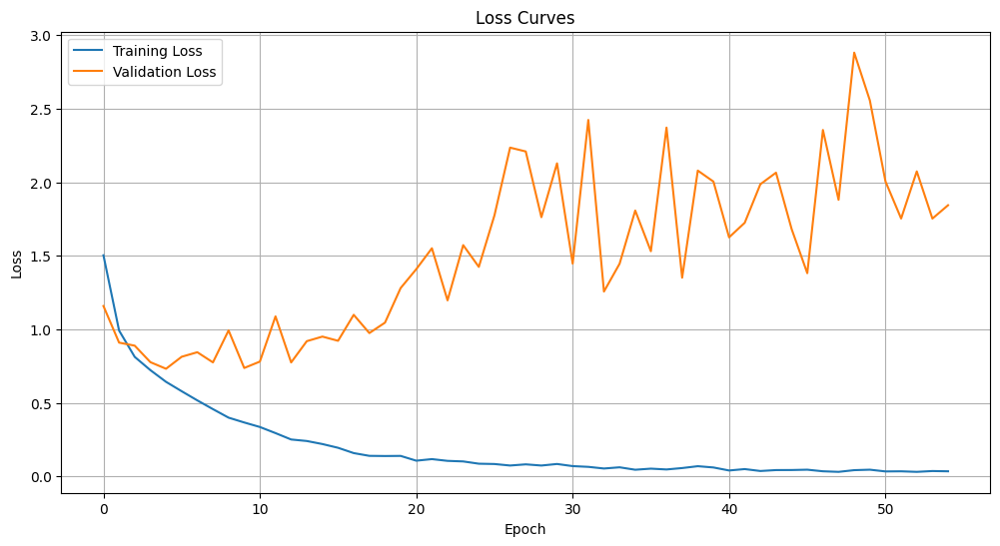

234/234 [==============================] - 48s 206ms/step - loss: 0.0344 - accuracy: 0.9873 - val_loss: 1.8438 - val_accuracy: 0.7317
Epoch 56/60
234/234 [==============================] - ETA: 0s - loss: 0.0391 - accuracy: 0.9877

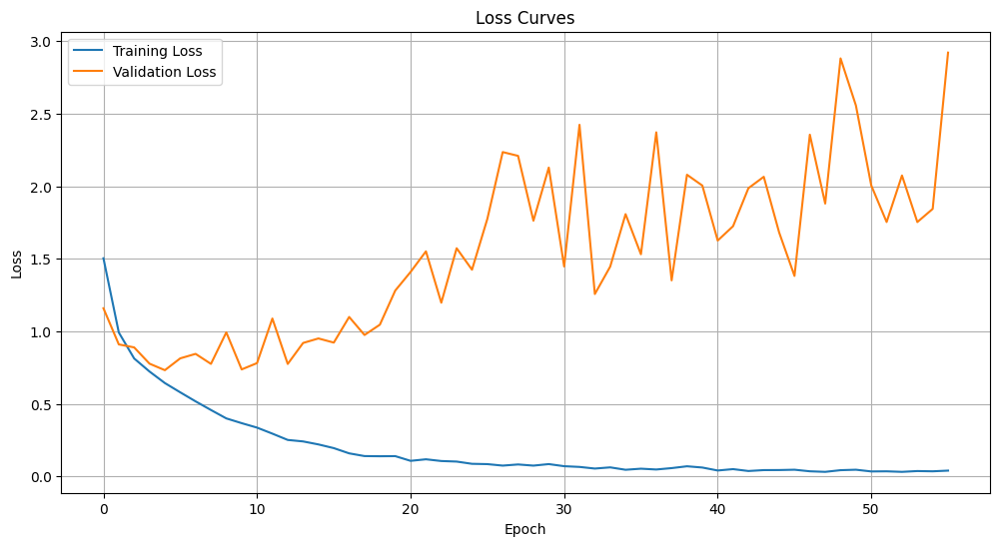

234/234 [==============================] - 48s 205ms/step - loss: 0.0391 - accuracy: 0.9877 - val_loss: 2.9213 - val_accuracy: 0.7575
Epoch 57/60
234/234 [==============================] - ETA: 0s - loss: 0.0461 - accuracy: 0.9866

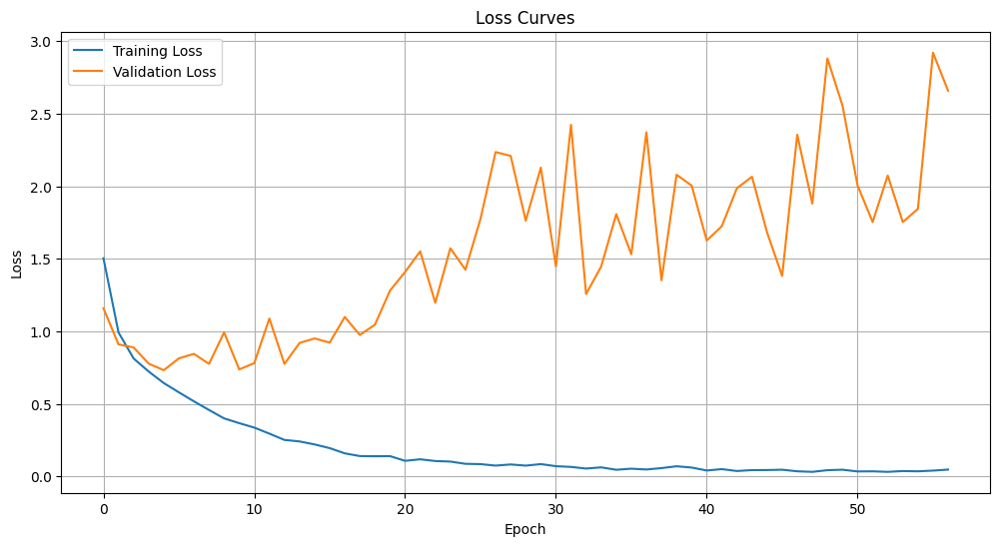

234/234 [==============================] - 48s 205ms/step - loss: 0.0461 - accuracy: 0.9866 - val_loss: 2.6587 - val_accuracy: 0.7613
Epoch 58/60
234/234 [==============================] - ETA: 0s - loss: 0.0469 - accuracy: 0.9867

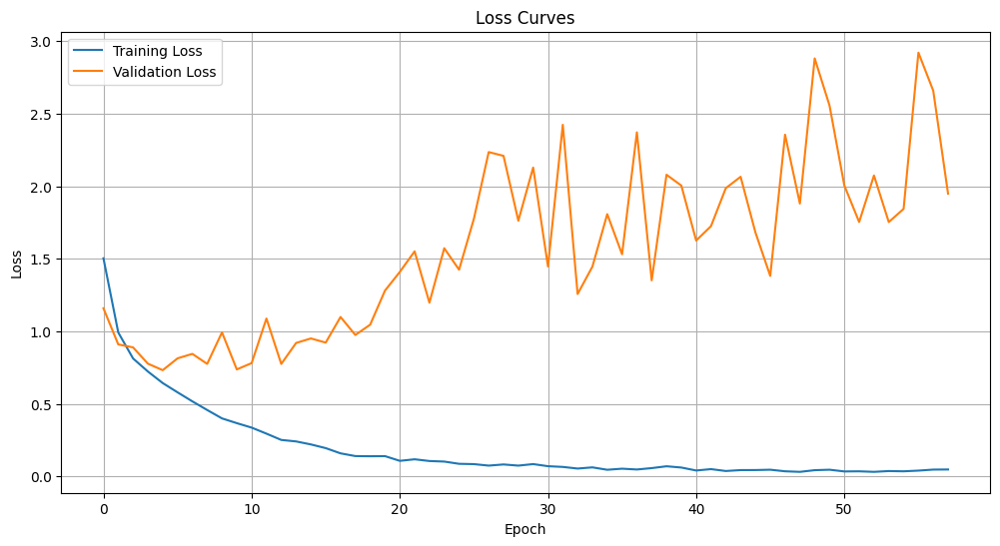

234/234 [==============================] - 48s 206ms/step - loss: 0.0469 - accuracy: 0.9867 - val_loss: 1.9488 - val_accuracy: 0.7753
Epoch 59/60
234/234 [==============================] - ETA: 0s - loss: 0.0322 - accuracy: 0.9905

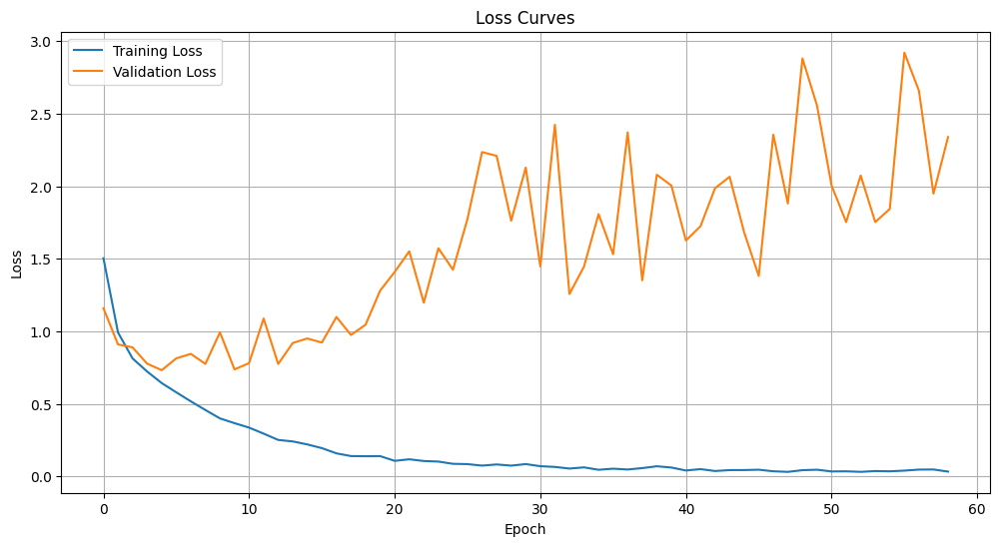

234/234 [==============================] - 48s 205ms/step - loss: 0.0322 - accuracy: 0.9905 - val_loss: 2.3391 - val_accuracy: 0.7592
Epoch 60/60
234/234 [==============================] - ETA: 0s - loss: 0.0194 - accuracy: 0.9924

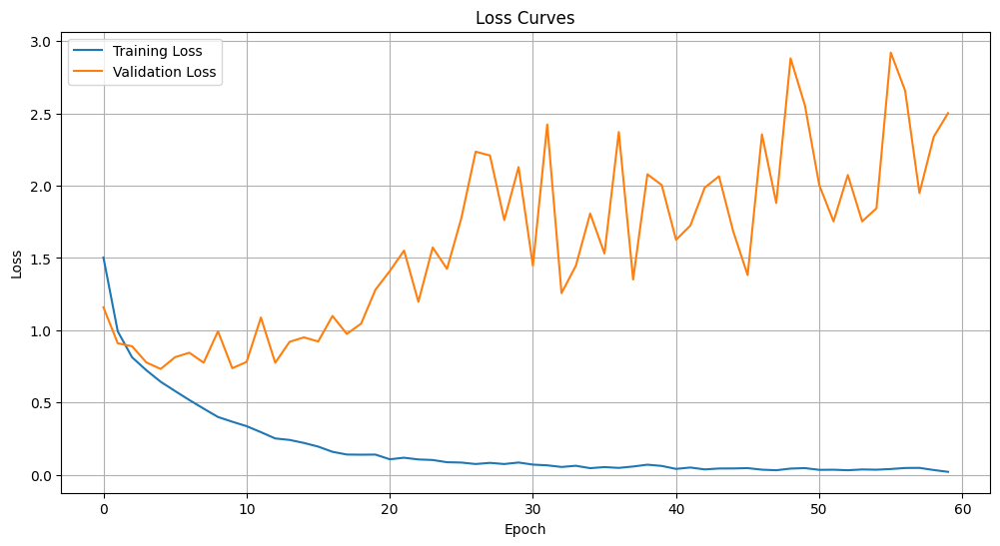

73/73 [==============================] - 4s 54ms/step - loss: 2.4515 - accuracy: 0.7787
Test Loss: 2.4514987468719482
Test Accuracy: 0.7786815166473389


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 0s 22ms/step


ValueError: Found input variables with inconsistent numbers of samples: [2344, 2336]

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers
from tensorflow.keras.callbacks import Callback

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'



# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir, class_labels)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_x = expert_model(inputs)
        class_expert_outputs.append(expert_x)
    else:
        print(f"Weight file does not exist: {weights_path}")

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_labels), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Custom Callback to Plot Loss Curves
class PlotLossesCallback(Callback):
    def __init__(self):
        super(PlotLossesCallback, self).__init__()
        self.train_losses = []
        self.val_losses = []

    def on_epoch_end(self, epoch, logs=None):
        self.train_losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        plt.figure(figsize=(12, 6))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses, label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Loss Curves')
        plt.legend()
        plt.grid(True)
        plt.show()

# Train the model with custom callback
plot_losses_callback = PlotLossesCallback()
final_model.fit(train_generator, epochs=60, validation_data=val_generator, steps_per_epoch=len(train_data)//batch_size, validation_steps=len(val_data)//batch_size, callbacks=[plot_losses_callback])

# Evaluate the model
test_loss, test_accuracy = final_model.evaluate(test_generator, steps=len(test_data)//batch_size)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Save the final model
final_model.save('class_expert_cnn.h5')

# Compute BMA predictions
def compute_bma(expert_models, data_generator, num_samples):
    predictions = []
    for model in expert_models:
        preds = model.predict(data_generator, steps=num_samples, verbose=0)  # Predict on the entire generator
        predictions.append(preds)

    # Average the predictions
    avg_predictions = np.mean(predictions, axis=0)
    return avg_predictions

# Load and create class expert models for BMA
expert_models = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_models.append(expert_model)
    else:
        print(f"Weight file does not exist for BMA: {weights_path}")

# Compute BMA predictions
bma_predictions = compute_bma(expert_models, test_generator, num_samples=len(test_data)//batch_size)

# Convert BMA predictions to class labels
bma_class_predictions = np.argmax(bma_predictions, axis=1)

# Assuming true labels are available
true_labels = np.array(test_labels)

# Evaluate BMA performance
from sklearn.metrics import classification_report
print(classification_report(true_labels, bma_class_predictions))


Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Epoch 1/30
234/234 [==============================] - ETA: 0s - loss: 1.3447 - accuracy: 0.5987

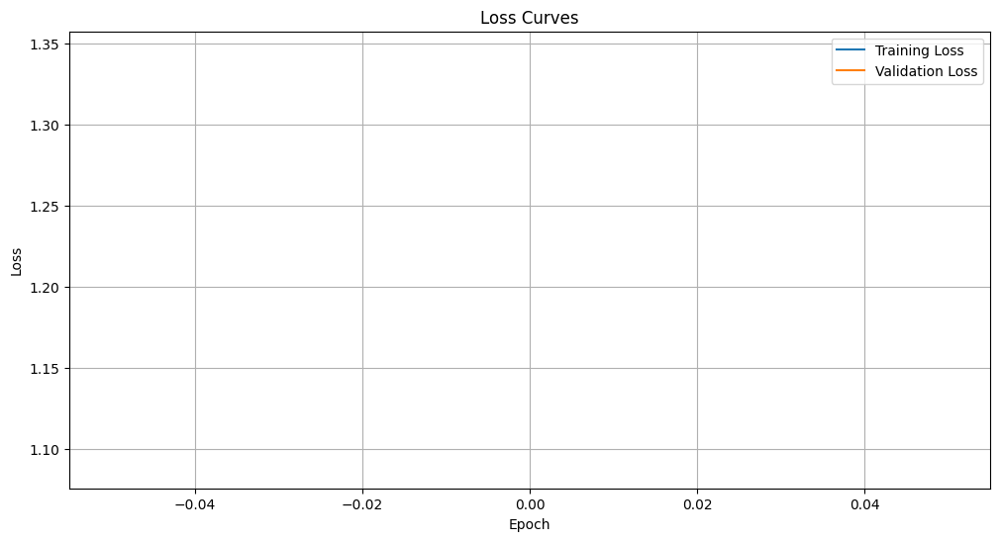

234/234 [==============================] - 70s 204ms/step - loss: 1.3447 - accuracy: 0.5987 - val_loss: 1.0886 - val_accuracy: 0.7015
Epoch 2/30
234/234 [==============================] - ETA: 0s - loss: 0.8884 - accuracy: 0.7144

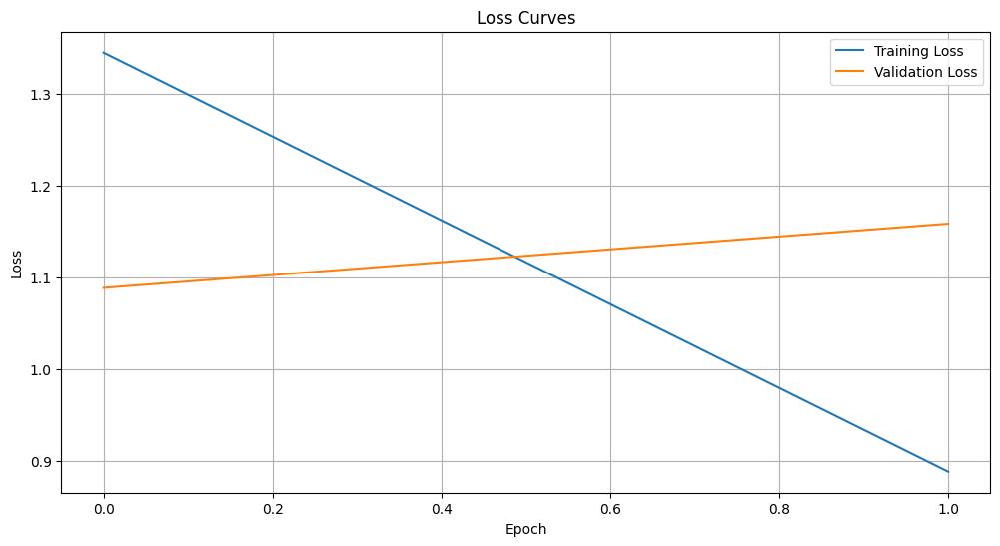

234/234 [==============================] - 47s 201ms/step - loss: 0.8884 - accuracy: 0.7144 - val_loss: 1.1586 - val_accuracy: 0.7252
Epoch 3/30
234/234 [==============================] - ETA: 0s - loss: 0.7136 - accuracy: 0.7665

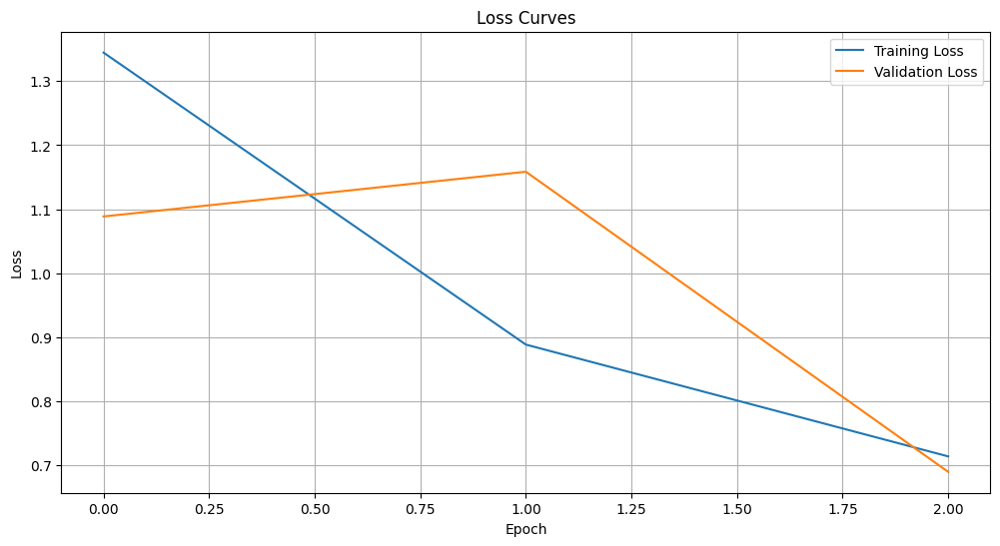

234/234 [==============================] - 47s 202ms/step - loss: 0.7136 - accuracy: 0.7665 - val_loss: 0.6894 - val_accuracy: 0.7845
Epoch 4/30
234/234 [==============================] - ETA: 0s - loss: 0.6095 - accuracy: 0.7989

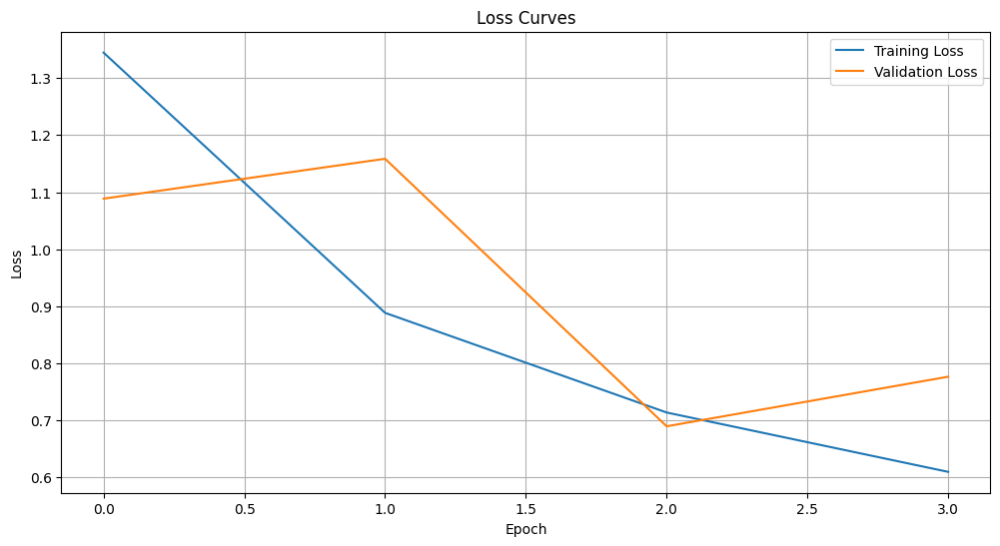

234/234 [==============================] - 47s 202ms/step - loss: 0.6095 - accuracy: 0.7989 - val_loss: 0.7764 - val_accuracy: 0.7915
Epoch 5/30
234/234 [==============================] - ETA: 0s - loss: 0.5335 - accuracy: 0.8242

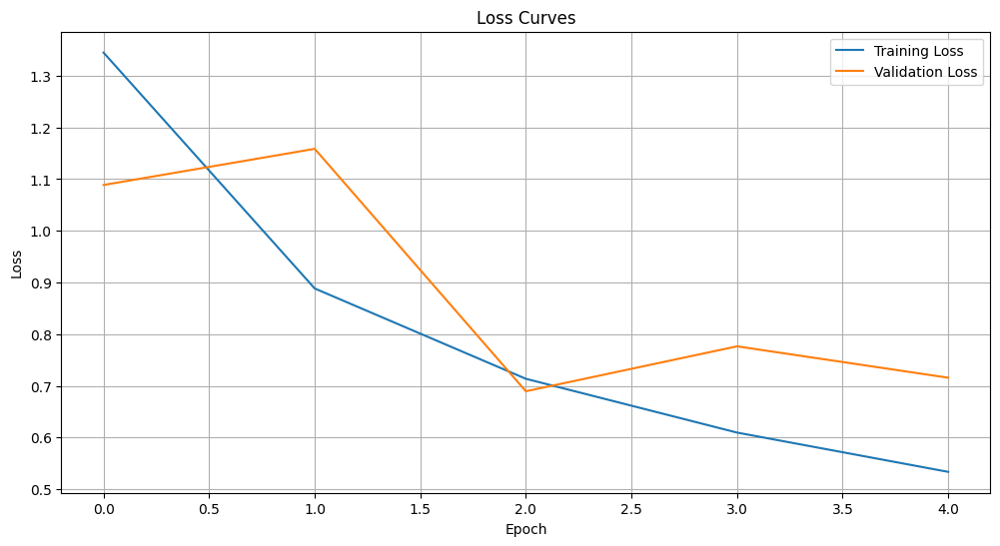

234/234 [==============================] - 47s 202ms/step - loss: 0.5335 - accuracy: 0.8242 - val_loss: 0.7157 - val_accuracy: 0.7872
Epoch 6/30
234/234 [==============================] - ETA: 0s - loss: 0.4612 - accuracy: 0.8467

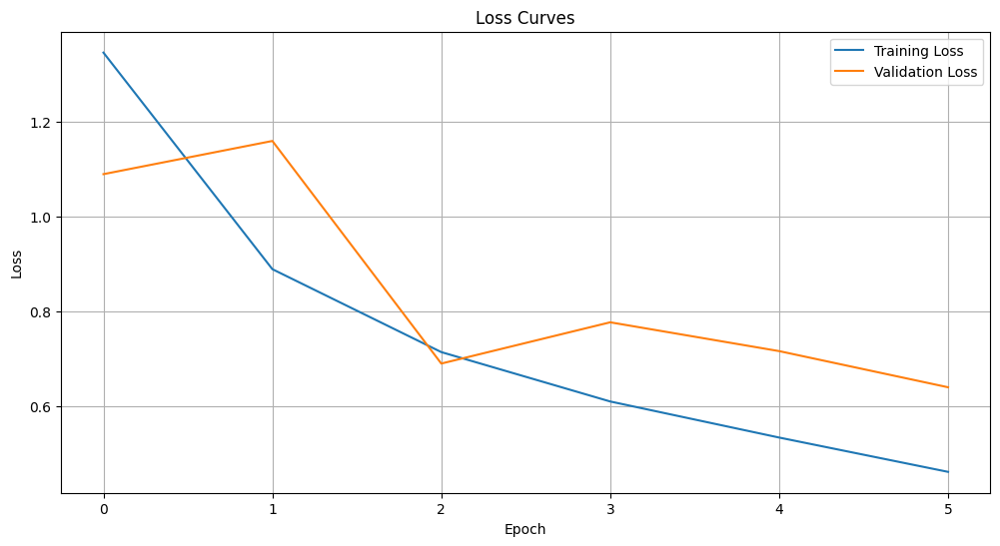

234/234 [==============================] - 48s 203ms/step - loss: 0.4612 - accuracy: 0.8467 - val_loss: 0.6395 - val_accuracy: 0.8066
Epoch 7/30
234/234 [==============================] - ETA: 0s - loss: 0.3971 - accuracy: 0.8650

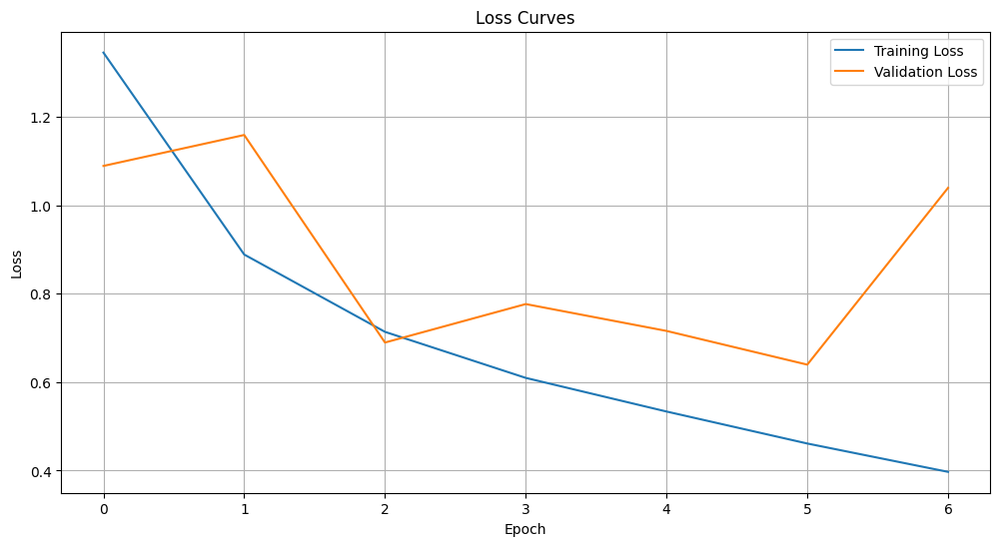

234/234 [==============================] - 48s 204ms/step - loss: 0.3971 - accuracy: 0.8650 - val_loss: 1.0391 - val_accuracy: 0.7619
Epoch 8/30
234/234 [==============================] - ETA: 0s - loss: 0.3390 - accuracy: 0.8835

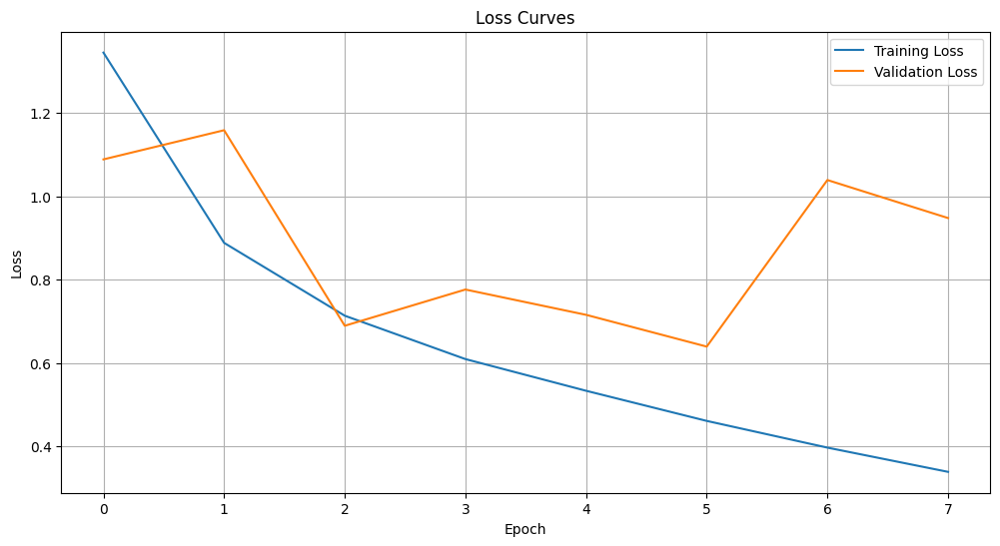

234/234 [==============================] - 48s 205ms/step - loss: 0.3390 - accuracy: 0.8835 - val_loss: 0.9479 - val_accuracy: 0.7780
Epoch 9/30
234/234 [==============================] - ETA: 0s - loss: 0.3002 - accuracy: 0.9002

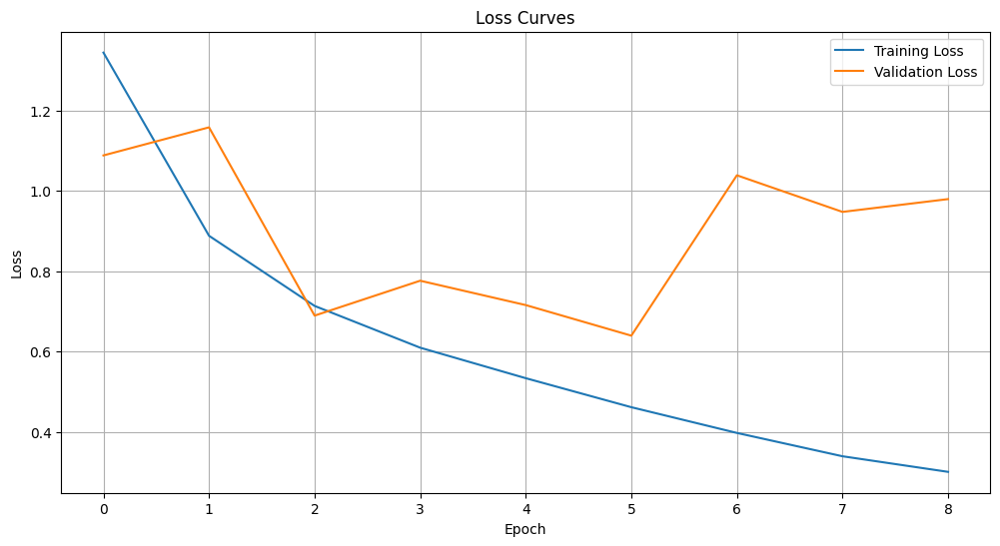

234/234 [==============================] - 48s 205ms/step - loss: 0.3002 - accuracy: 0.9002 - val_loss: 0.9798 - val_accuracy: 0.7958
Epoch 10/30
234/234 [==============================] - ETA: 0s - loss: 0.2714 - accuracy: 0.9126

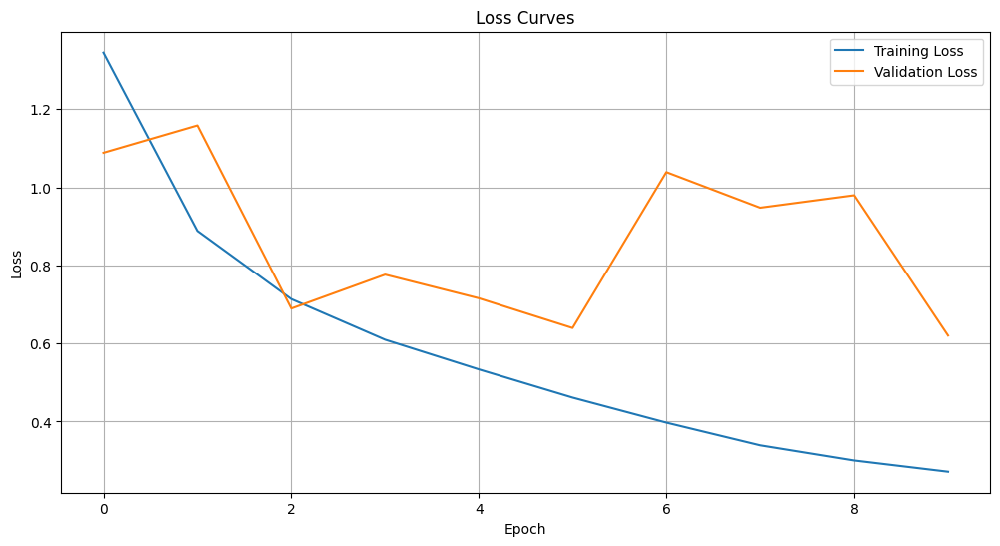

234/234 [==============================] - 48s 205ms/step - loss: 0.2714 - accuracy: 0.9126 - val_loss: 0.6202 - val_accuracy: 0.8265
Epoch 11/30
234/234 [==============================] - ETA: 0s - loss: 0.2354 - accuracy: 0.9181

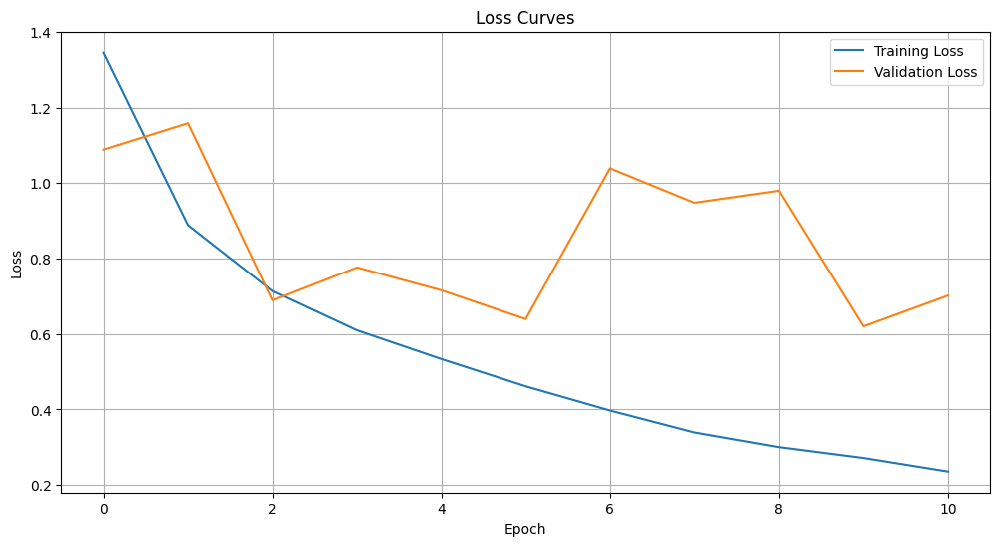

234/234 [==============================] - 48s 206ms/step - loss: 0.2354 - accuracy: 0.9181 - val_loss: 0.7019 - val_accuracy: 0.8173
Epoch 12/30
234/234 [==============================] - ETA: 0s - loss: 0.2274 - accuracy: 0.9233

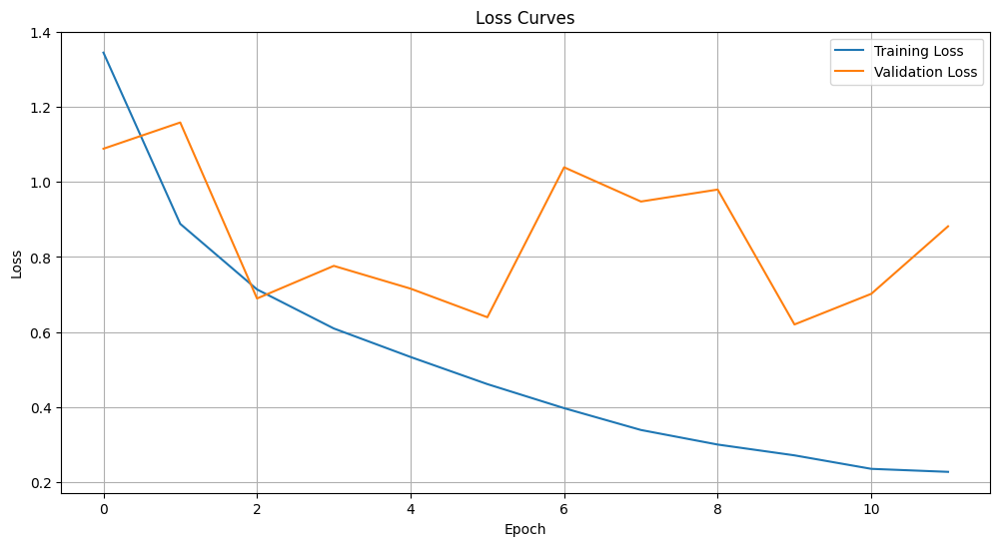

234/234 [==============================] - 48s 204ms/step - loss: 0.2274 - accuracy: 0.9233 - val_loss: 0.8818 - val_accuracy: 0.7969
Epoch 13/30
234/234 [==============================] - ETA: 0s - loss: 0.2043 - accuracy: 0.9312

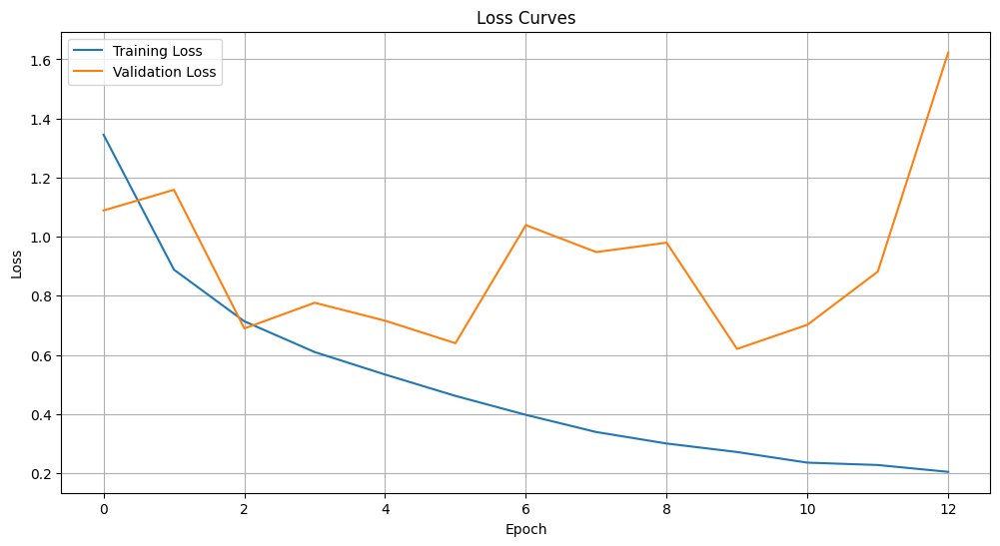

234/234 [==============================] - 48s 204ms/step - loss: 0.2043 - accuracy: 0.9312 - val_loss: 1.6227 - val_accuracy: 0.7543
Epoch 14/30
234/234 [==============================] - ETA: 0s - loss: 0.1763 - accuracy: 0.9387

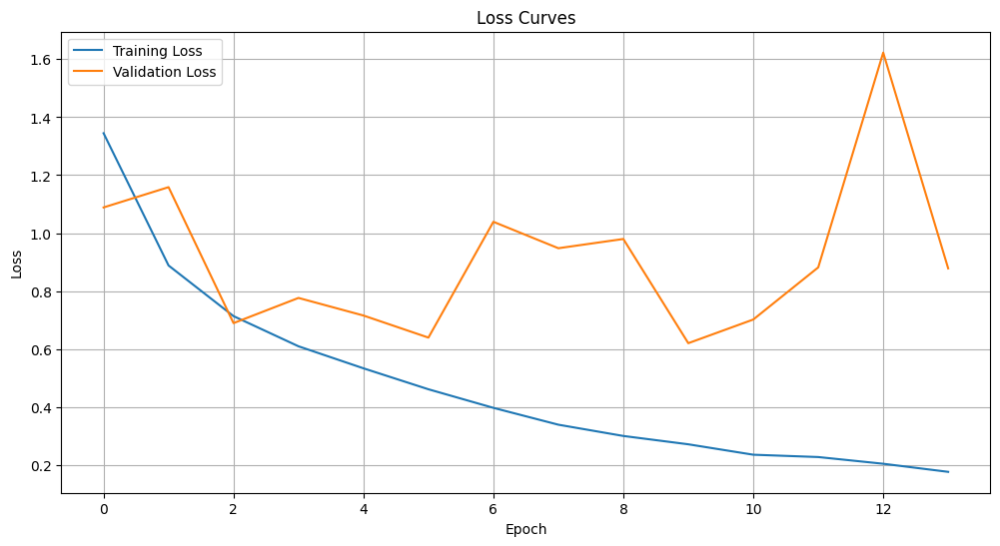

234/234 [==============================] - 48s 204ms/step - loss: 0.1763 - accuracy: 0.9387 - val_loss: 0.8783 - val_accuracy: 0.8077
Epoch 15/30
234/234 [==============================] - ETA: 0s - loss: 0.1421 - accuracy: 0.9513

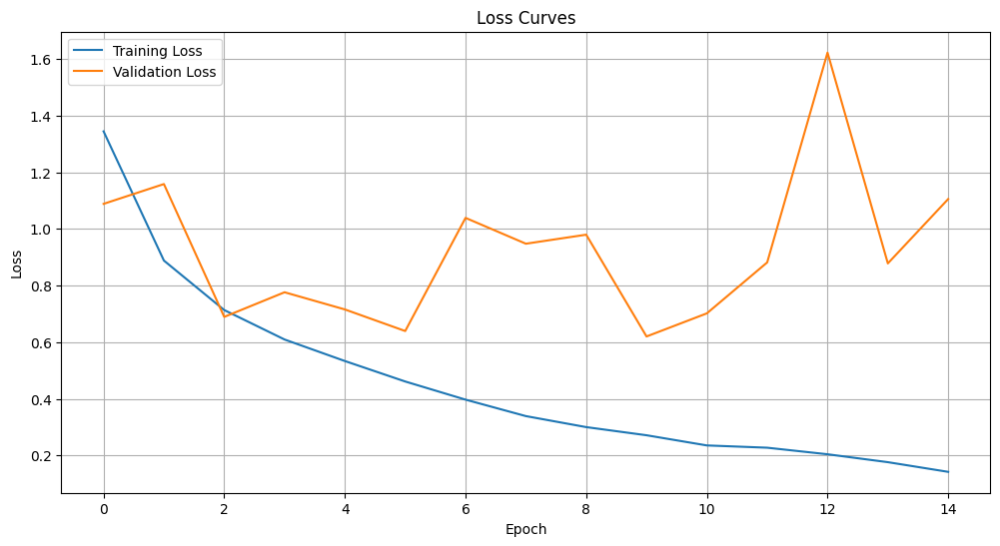

234/234 [==============================] - 48s 204ms/step - loss: 0.1421 - accuracy: 0.9513 - val_loss: 1.1056 - val_accuracy: 0.7990
Epoch 16/30
234/234 [==============================] - ETA: 0s - loss: 0.1325 - accuracy: 0.9562

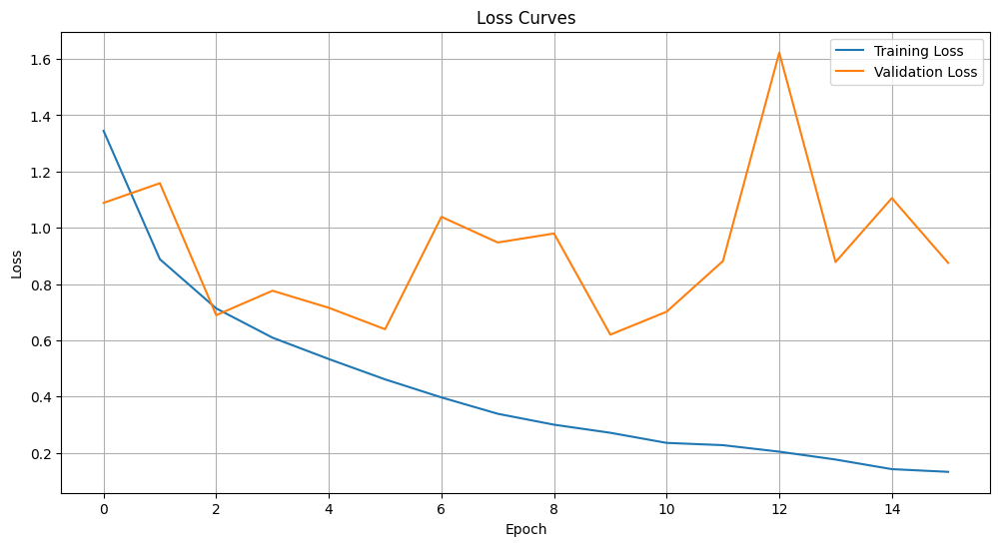

234/234 [==============================] - 48s 204ms/step - loss: 0.1325 - accuracy: 0.9562 - val_loss: 0.8752 - val_accuracy: 0.7958
Epoch 17/30
234/234 [==============================] - ETA: 0s - loss: 0.1259 - accuracy: 0.9580

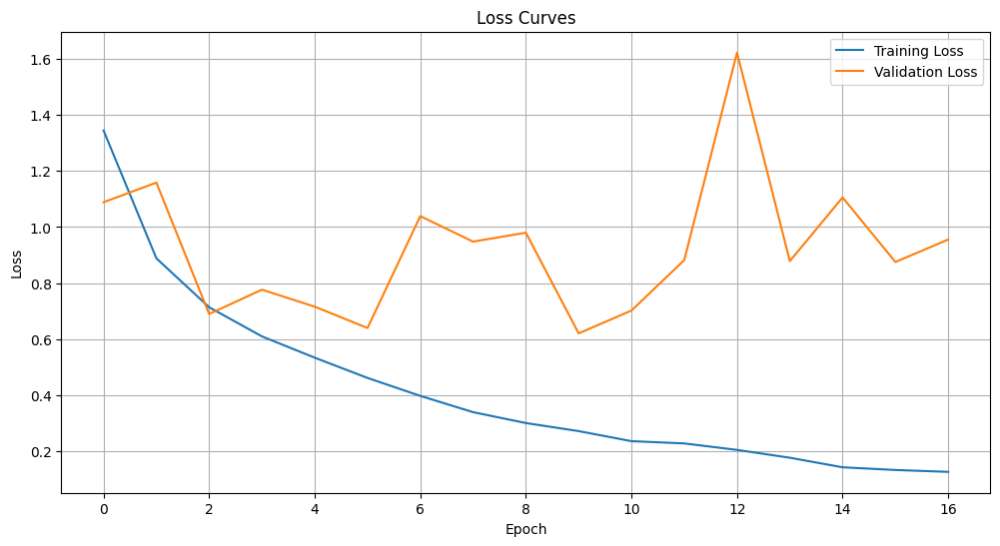

234/234 [==============================] - 48s 204ms/step - loss: 0.1259 - accuracy: 0.9580 - val_loss: 0.9553 - val_accuracy: 0.7996
Epoch 18/30
234/234 [==============================] - ETA: 0s - loss: 0.1076 - accuracy: 0.9609

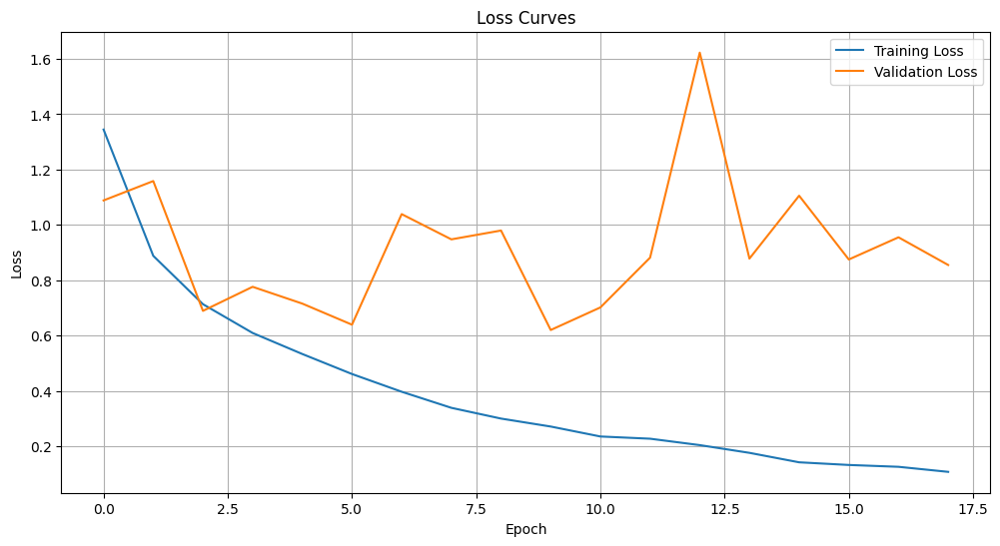

234/234 [==============================] - 48s 204ms/step - loss: 0.1076 - accuracy: 0.9609 - val_loss: 0.8553 - val_accuracy: 0.8060
Epoch 19/30
234/234 [==============================] - ETA: 0s - loss: 0.0995 - accuracy: 0.9680

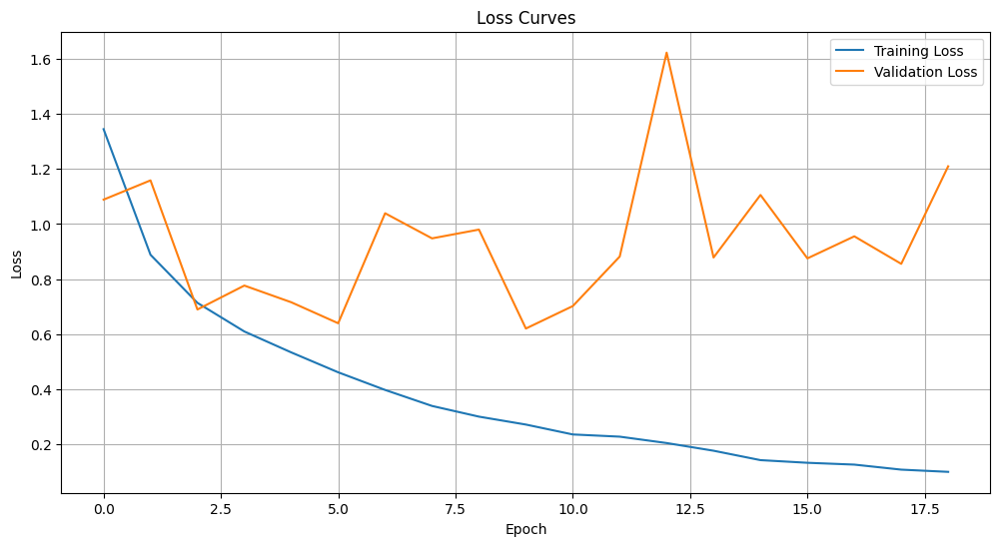

234/234 [==============================] - 48s 204ms/step - loss: 0.0995 - accuracy: 0.9680 - val_loss: 1.2097 - val_accuracy: 0.7942
Epoch 20/30
234/234 [==============================] - ETA: 0s - loss: 0.1057 - accuracy: 0.9638

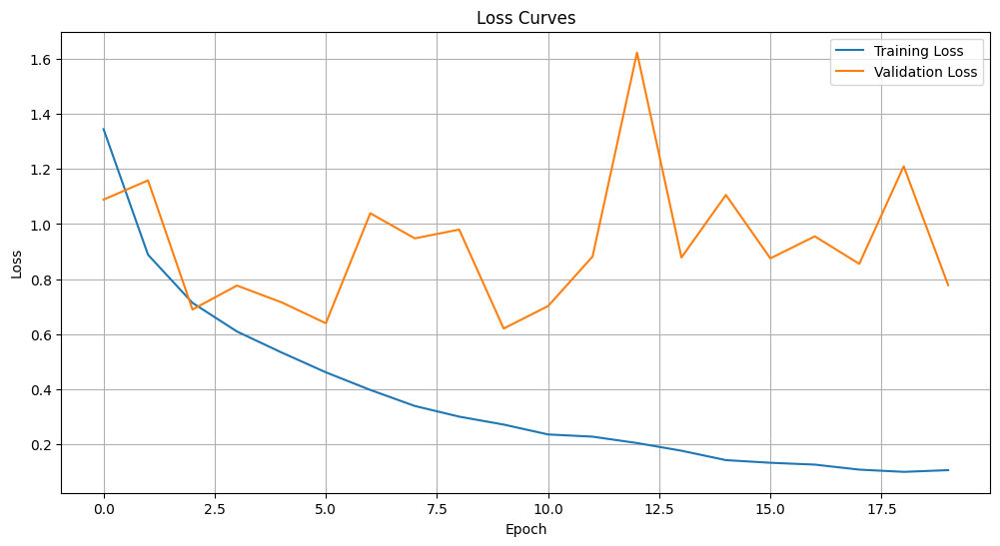

234/234 [==============================] - 48s 204ms/step - loss: 0.1057 - accuracy: 0.9638 - val_loss: 0.7778 - val_accuracy: 0.8297
Epoch 21/30
234/234 [==============================] - ETA: 0s - loss: 0.0875 - accuracy: 0.9708

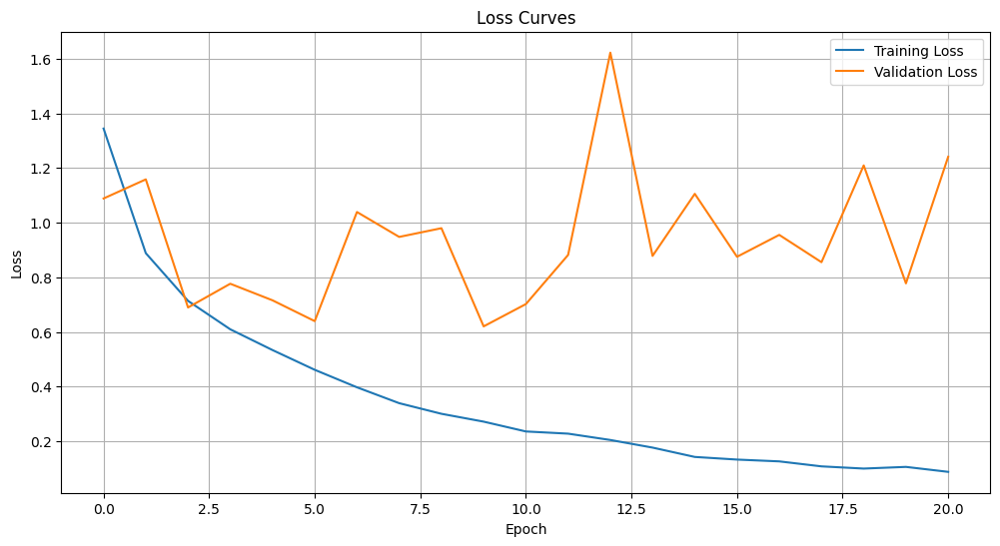

234/234 [==============================] - 48s 204ms/step - loss: 0.0875 - accuracy: 0.9708 - val_loss: 1.2412 - val_accuracy: 0.8055
Epoch 22/30
234/234 [==============================] - ETA: 0s - loss: 0.0862 - accuracy: 0.9713

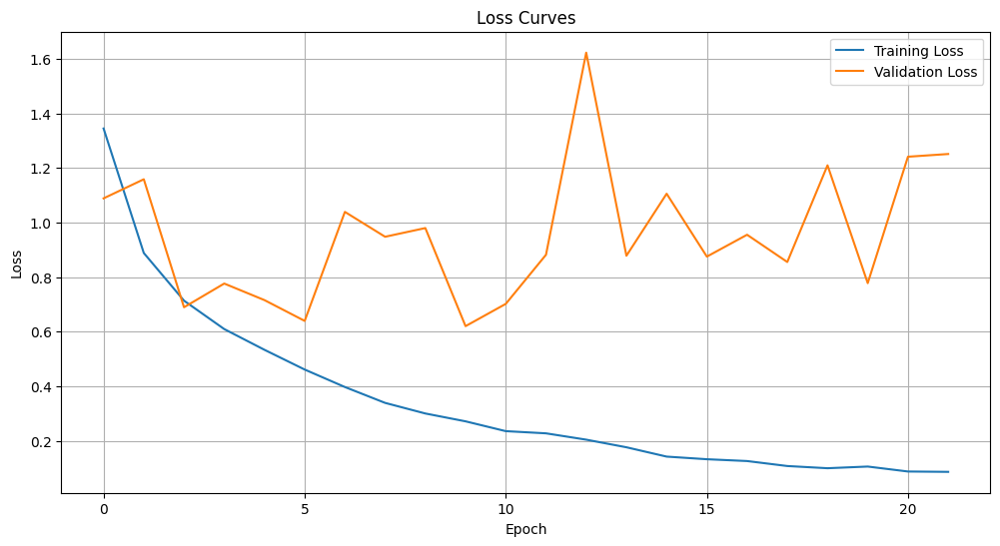

234/234 [==============================] - 48s 204ms/step - loss: 0.0862 - accuracy: 0.9713 - val_loss: 1.2512 - val_accuracy: 0.7953
Epoch 23/30
234/234 [==============================] - ETA: 0s - loss: 0.0938 - accuracy: 0.9709

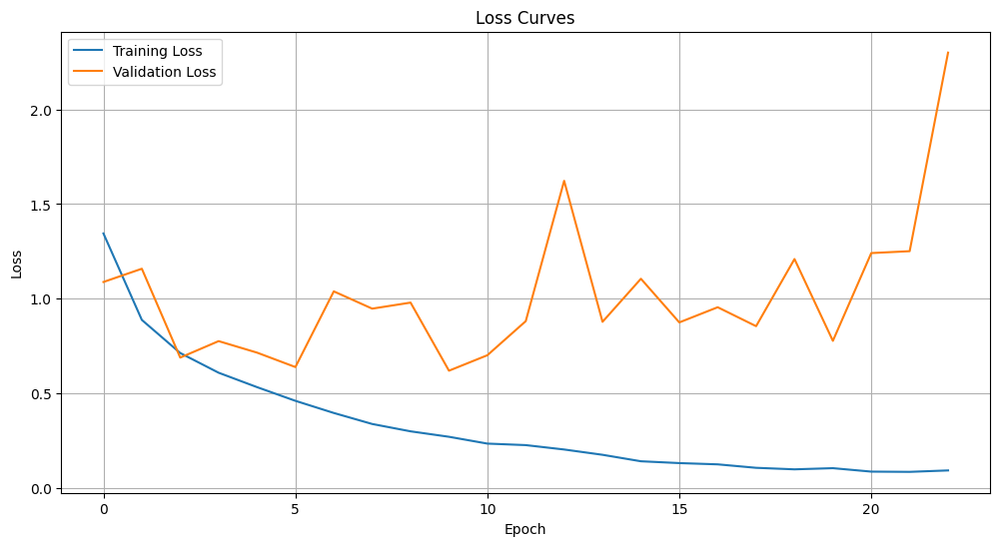

234/234 [==============================] - 48s 205ms/step - loss: 0.0938 - accuracy: 0.9709 - val_loss: 2.2994 - val_accuracy: 0.7387
Epoch 24/30
234/234 [==============================] - ETA: 0s - loss: 0.0800 - accuracy: 0.9746

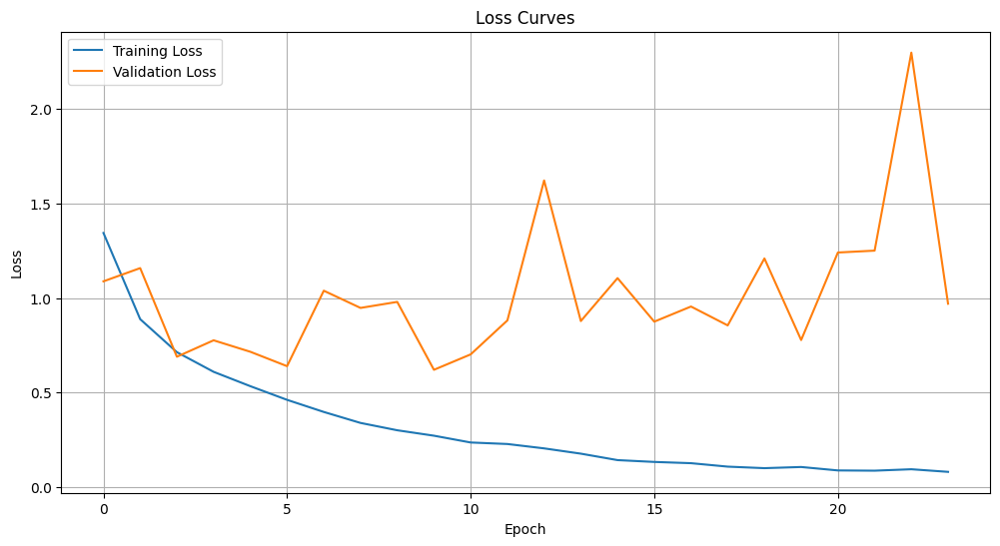

234/234 [==============================] - 48s 205ms/step - loss: 0.0800 - accuracy: 0.9746 - val_loss: 0.9701 - val_accuracy: 0.8190
Epoch 25/30
234/234 [==============================] - ETA: 0s - loss: 0.0826 - accuracy: 0.9731

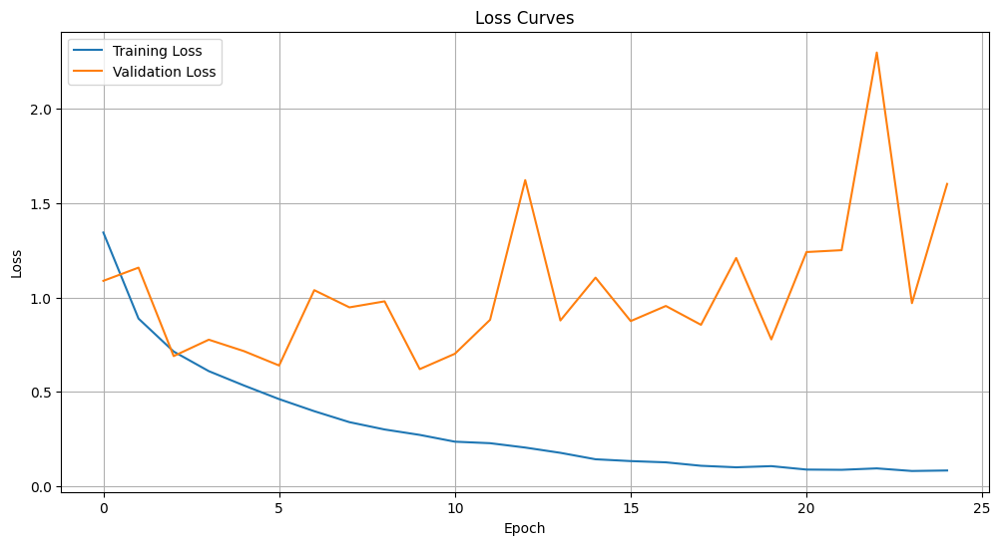

234/234 [==============================] - 48s 204ms/step - loss: 0.0826 - accuracy: 0.9731 - val_loss: 1.6024 - val_accuracy: 0.7839
Epoch 26/30
234/234 [==============================] - ETA: 0s - loss: 0.0780 - accuracy: 0.9752

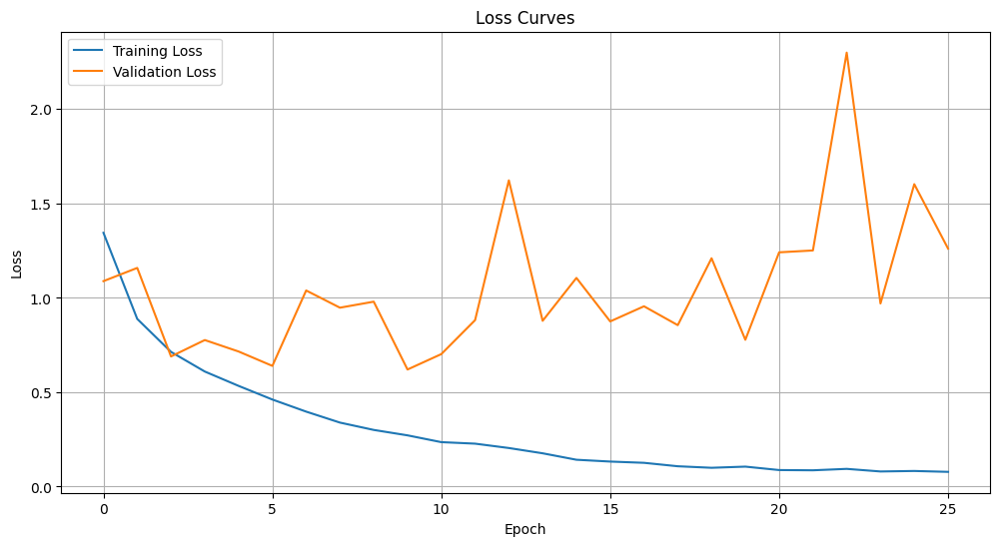

234/234 [==============================] - 48s 204ms/step - loss: 0.0780 - accuracy: 0.9752 - val_loss: 1.2611 - val_accuracy: 0.8136
Epoch 27/30
234/234 [==============================] - ETA: 0s - loss: 0.0704 - accuracy: 0.9780

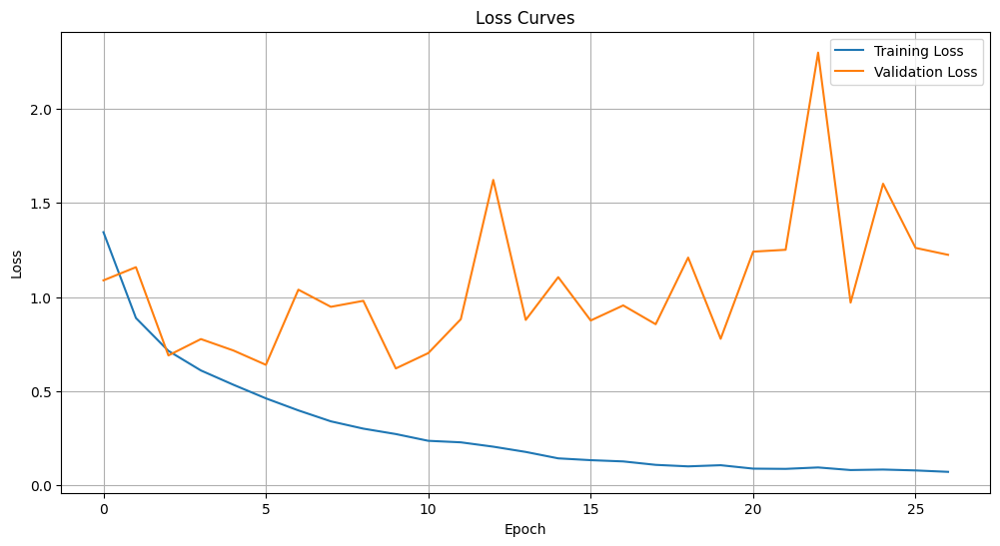

234/234 [==============================] - 48s 204ms/step - loss: 0.0704 - accuracy: 0.9780 - val_loss: 1.2244 - val_accuracy: 0.7818
Epoch 28/30
234/234 [==============================] - ETA: 0s - loss: 0.0574 - accuracy: 0.9830

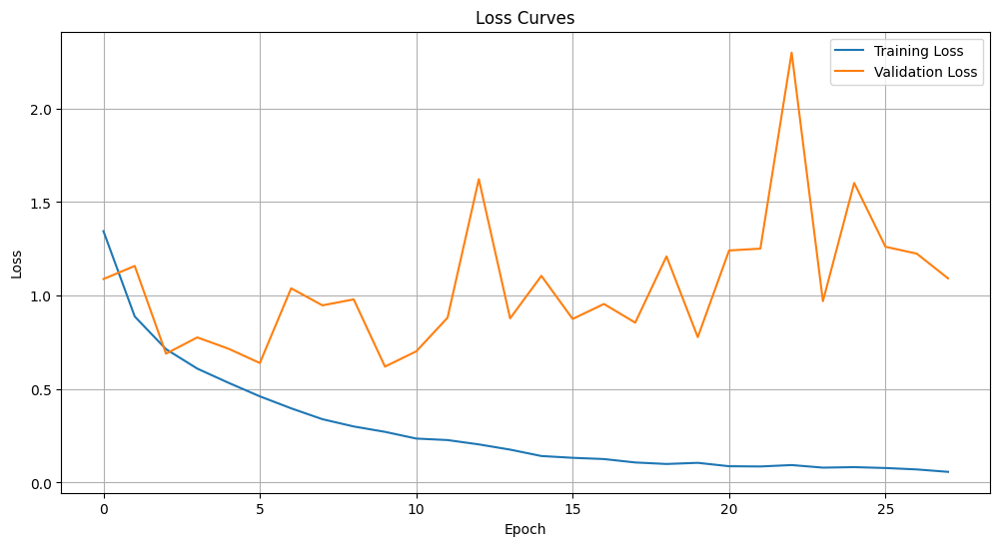

234/234 [==============================] - 48s 204ms/step - loss: 0.0574 - accuracy: 0.9830 - val_loss: 1.0922 - val_accuracy: 0.8152
Epoch 29/30
234/234 [==============================] - ETA: 0s - loss: 0.0478 - accuracy: 0.9853

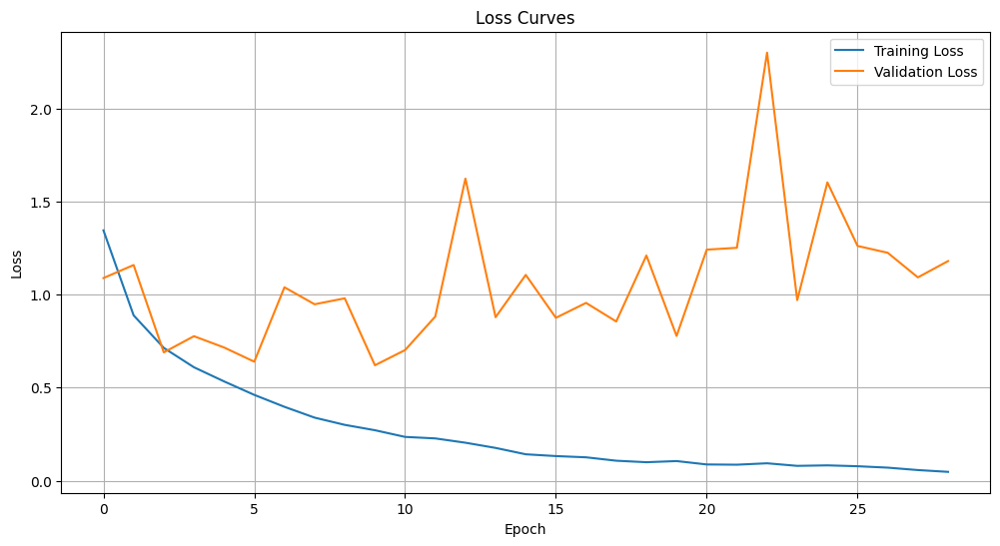

234/234 [==============================] - 48s 204ms/step - loss: 0.0478 - accuracy: 0.9853 - val_loss: 1.1798 - val_accuracy: 0.8120
Epoch 30/30
234/234 [==============================] - ETA: 0s - loss: 0.0620 - accuracy: 0.9815

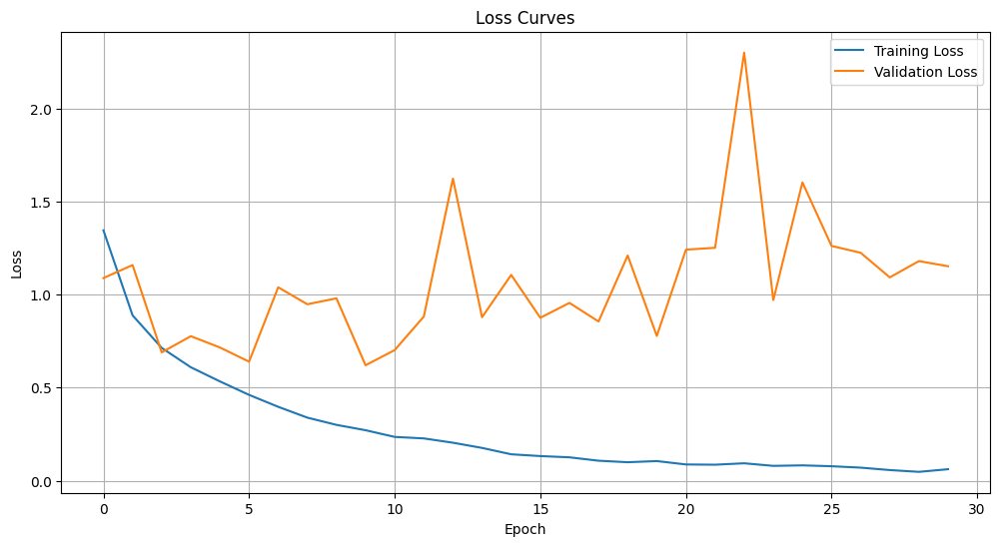

73/73 [==============================] - 4s 51ms/step - loss: 1.2018 - accuracy: 0.8061
Test Loss: 1.2017954587936401
Test Accuracy: 0.8060787916183472


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


ValueError: Found input variables with inconsistent numbers of samples: [2344, 2336]

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir, class_labels)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_x = expert_model(inputs)
        class_expert_outputs.append(expert_x)
    else:
        print(f"Weight file does not exist: {weights_path}")

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_labels), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Custom Callback to Plot Loss Curves
class PlotLossesCallback(Callback):
    def __init__(self):
        super(PlotLossesCallback, self).__init__()
        self.train_losses = []
        self.val_losses = []

    def on_epoch_end(self, epoch, logs=None):
        self.train_losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        plt.figure(figsize=(12, 6))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses, label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Loss Curves')
        plt.legend()
        plt.grid(True)
        plt.show()

# Train the model with custom callback
plot_losses_callback = PlotLossesCallback()
final_model.fit(train_generator, epochs=30, validation_data=val_generator, steps_per_epoch=len(train_data)//batch_size, validation_steps=len(val_data)//batch_size, callbacks=[plot_losses_callback])

# Evaluate the model
test_loss, test_accuracy = final_model.evaluate(test_generator, steps=len(test_data)//batch_size)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Save the final model
final_model.save('class_expert_cnn.h5')

# Compute BMA predictions
def compute_bma(expert_models, data_generator, num_samples):
    predictions = []
    for model in expert_models:
        preds = model.predict(data_generator, steps=num_samples, verbose=0)  # Predict on the entire generator
        predictions.append(preds)

    # Average the predictions
    avg_predictions = np.mean(predictions, axis=0)
    return avg_predictions

# Load and create class expert models for BMA
expert_models = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_models.append(expert_model)
    else:
        print(f"Weight file does not exist for BMA: {weights_path}")

# Compute BMA predictions
bma_predictions = compute_bma(expert_models, test_generator, num_samples=len(test_data)//batch_size)

# Convert BMA predictions to class labels
bma_class_predictions = np.argmax(bma_predictions, axis=1)

# Assuming true labels are available
true_labels = np.array(test_labels)

# Evaluate BMA performance
from sklearn.metrics import classification_report
print(classification_report(true_labels, bma_class_predictions))


In [ ]:
# Compute BMA predictions
bma_predictions = compute_bma(expert_models, test_generator, num_samples=len(test_data)//batch_size)

# Convert BMA predictions to class labels
bma_class_predictions = np.argmax(bma_predictions, axis=1)

# Assuming true labels are available
true_labels = np.array(test_labels)

# Check the shapes of the arrays before passing them to classification_report
print(f"Shape of true_labels: {true_labels.shape}")
print(f"Shape of bma_class_predictions: {bma_class_predictions.shape}")

# Evaluate BMA performance
from sklearn.metrics import classification_report
print(classification_report(true_labels[:len(bma_class_predictions)], bma_class_predictions)) # Trim true_labels to match

Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Epoch 1/60
234/234 [==============================] - ETA: 0s - loss: 11640.6699 - accuracy: 0.5726

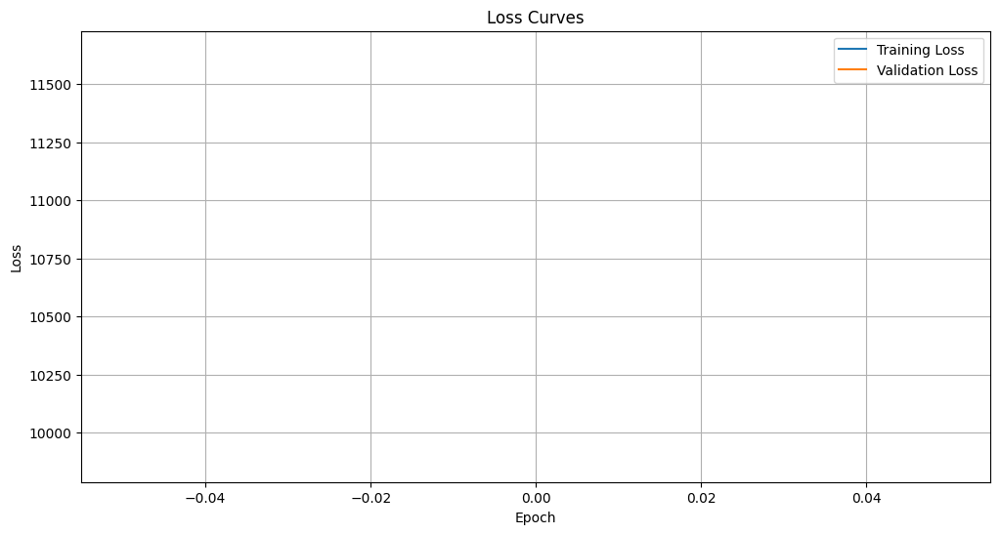

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


234/234 [==============================] - 80s 240ms/step - loss: 11640.6699 - accuracy: 0.5726 - val_loss: 9875.4805 - val_accuracy: 0.6503
Epoch 2/60
234/234 [==============================] - ETA: 0s - loss: 8501.8633 - accuracy: 0.6233

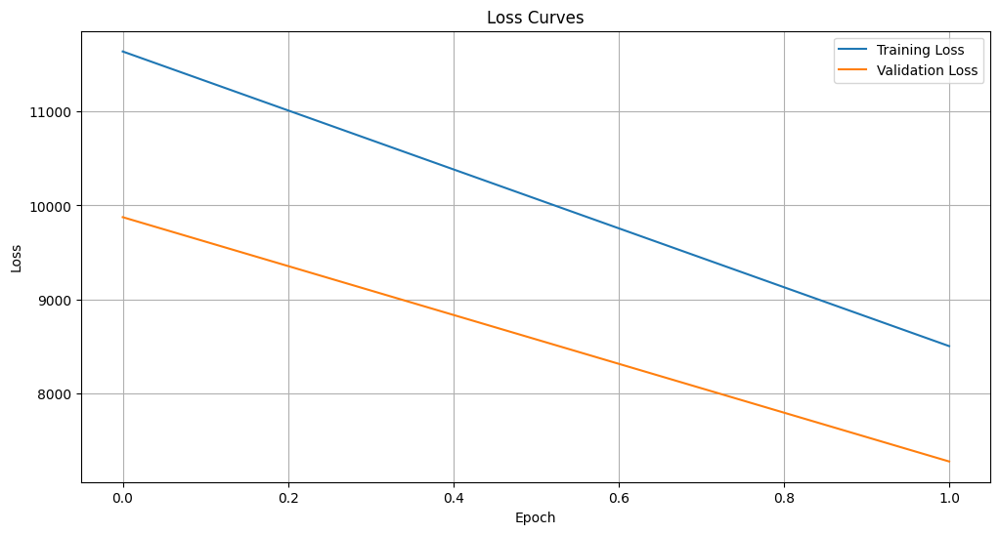

234/234 [==============================] - 55s 235ms/step - loss: 8501.8633 - accuracy: 0.6233 - val_loss: 7272.8340 - val_accuracy: 0.6622
Epoch 3/60
234/234 [==============================] - ETA: 0s - loss: 6289.0659 - accuracy: 0.6382

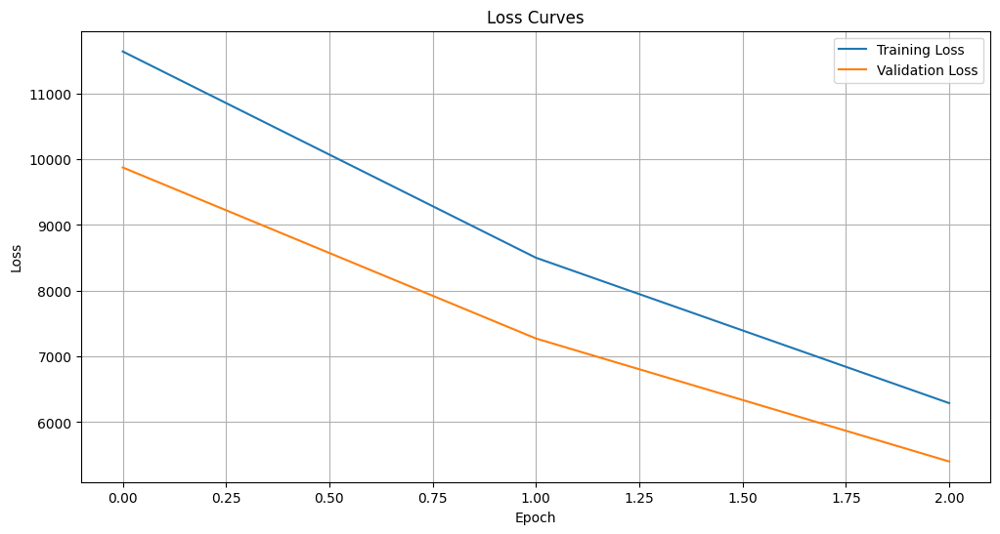

234/234 [==============================] - 57s 243ms/step - loss: 6289.0659 - accuracy: 0.6382 - val_loss: 5401.1406 - val_accuracy: 0.6643
Epoch 4/60
234/234 [==============================] - ETA: 0s - loss: 4681.0845 - accuracy: 0.6472

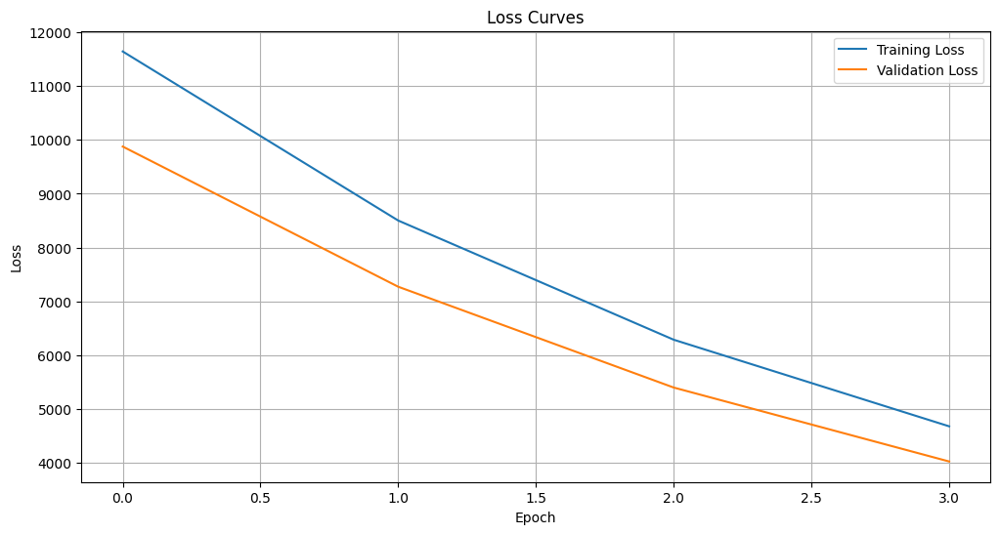

234/234 [==============================] - 55s 236ms/step - loss: 4681.0845 - accuracy: 0.6472 - val_loss: 4028.1689 - val_accuracy: 0.6638
Epoch 5/60
234/234 [==============================] - ETA: 0s - loss: 3494.3528 - accuracy: 0.6528

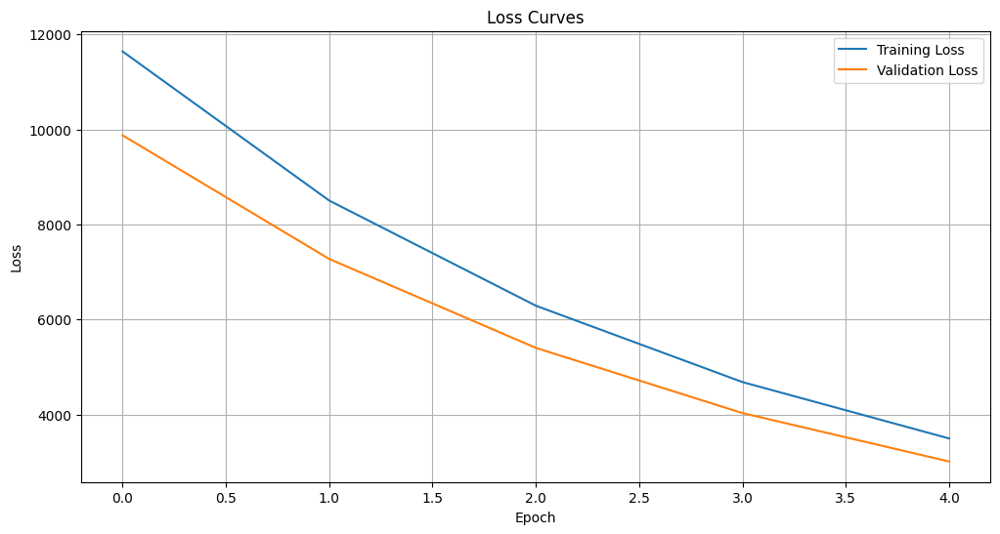

234/234 [==============================] - 57s 244ms/step - loss: 3494.3528 - accuracy: 0.6528 - val_loss: 3008.9749 - val_accuracy: 0.6821
Epoch 6/60
234/234 [==============================] - ETA: 0s - loss: 2610.6326 - accuracy: 0.6498

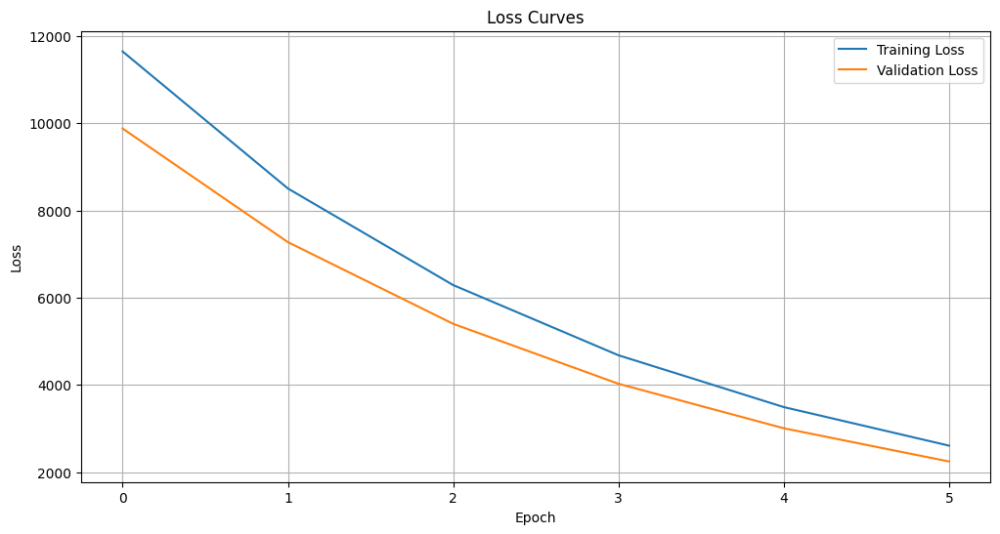

234/234 [==============================] - 58s 247ms/step - loss: 2610.6326 - accuracy: 0.6498 - val_loss: 2247.6218 - val_accuracy: 0.6907
Epoch 7/60
234/234 [==============================] - ETA: 0s - loss: 1949.1740 - accuracy: 0.6635

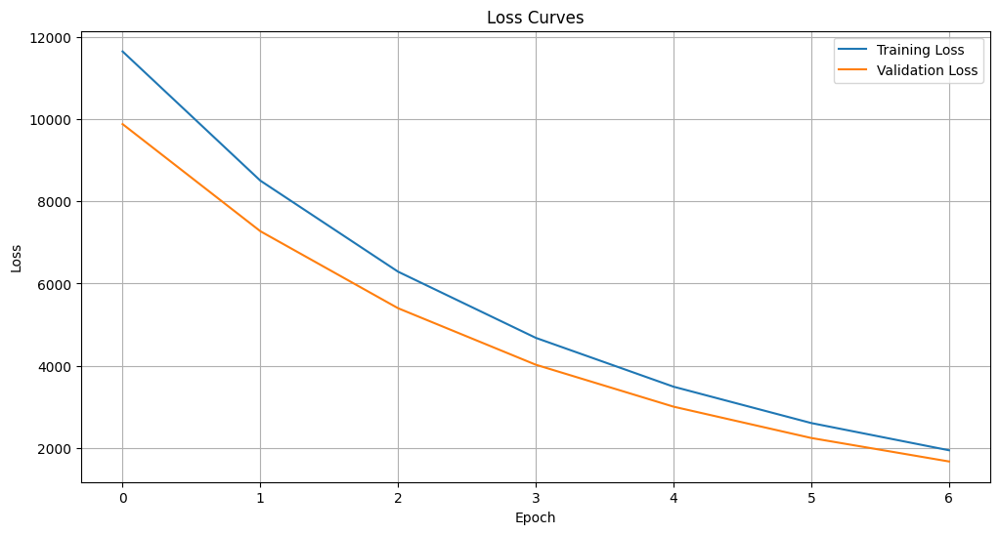

234/234 [==============================] - 55s 236ms/step - loss: 1949.1740 - accuracy: 0.6635 - val_loss: 1676.9563 - val_accuracy: 0.7010
Epoch 8/60
234/234 [==============================] - ETA: 0s - loss: 1453.0233 - accuracy: 0.6576

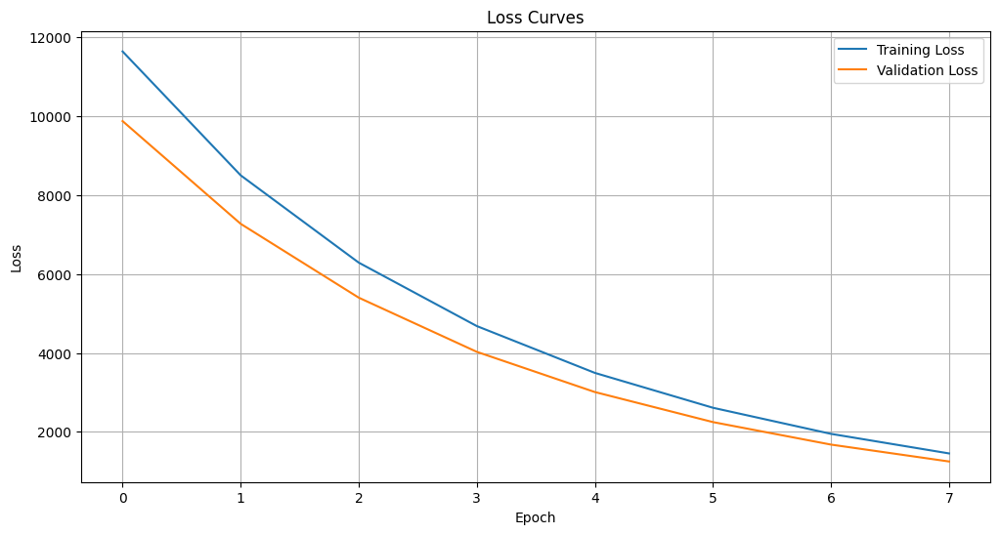

234/234 [==============================] - 55s 237ms/step - loss: 1453.0233 - accuracy: 0.6576 - val_loss: 1248.7916 - val_accuracy: 0.6379
Epoch 9/60
234/234 [==============================] - ETA: 0s - loss: 1080.6483 - accuracy: 0.6667

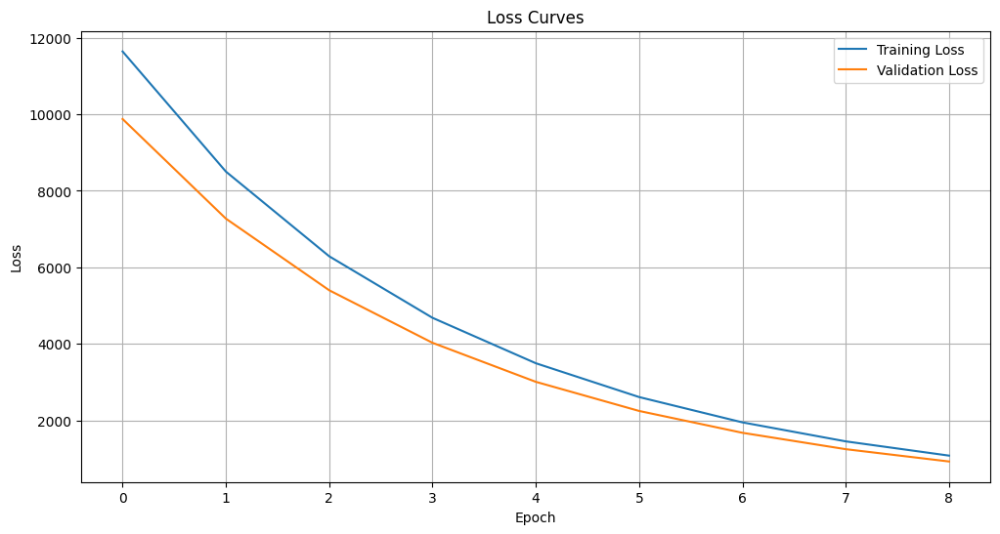

234/234 [==============================] - 57s 246ms/step - loss: 1080.6483 - accuracy: 0.6667 - val_loss: 927.3195 - val_accuracy: 0.6880
Epoch 10/60
234/234 [==============================] - ETA: 0s - loss: 801.4080 - accuracy: 0.6678

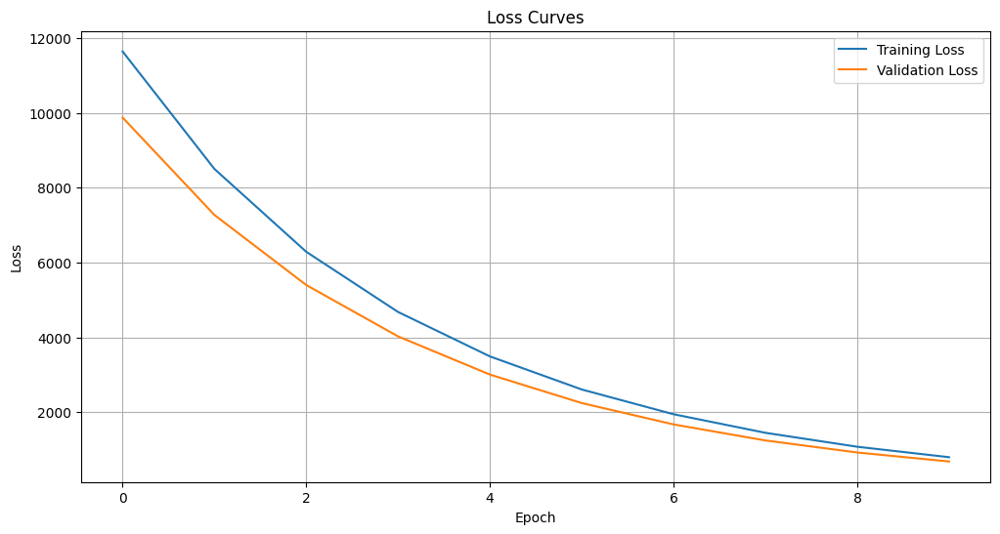

234/234 [==============================] - 55s 233ms/step - loss: 801.4080 - accuracy: 0.6678 - val_loss: 686.7822 - val_accuracy: 0.6778
Epoch 11/60
234/234 [==============================] - ETA: 0s - loss: 592.4943 - accuracy: 0.6713

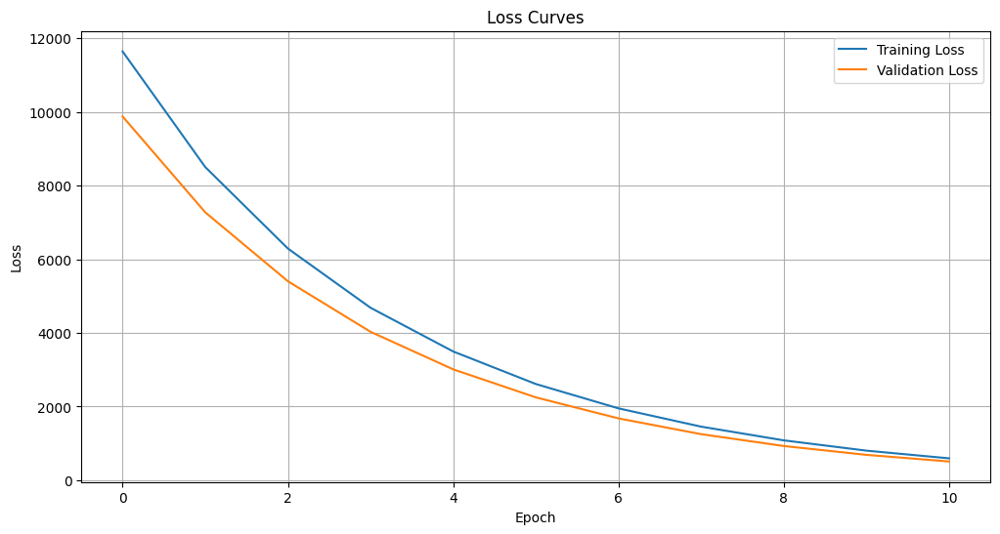

234/234 [==============================] - 57s 243ms/step - loss: 592.4943 - accuracy: 0.6713 - val_loss: 506.6965 - val_accuracy: 0.6929
Epoch 12/60
234/234 [==============================] - ETA: 0s - loss: 436.5928 - accuracy: 0.6698

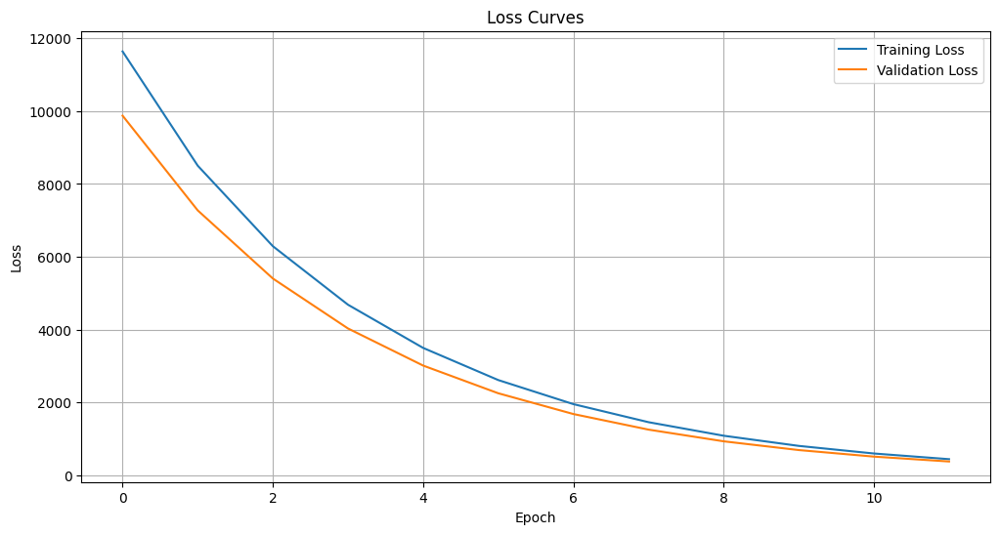

234/234 [==============================] - 57s 246ms/step - loss: 436.5928 - accuracy: 0.6698 - val_loss: 372.8313 - val_accuracy: 0.6180
Epoch 13/60
160/234 [===================>..........] - ETA: 15s - loss: 336.1240 - accuracy: 0.6684

KeyboardInterrupt: 

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers, regularizers
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir, class_labels)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size, augment=False):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    if augment:
                        img = data_gen.random_transform(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Data augmentation generator
data_gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size, augment=True)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model with regularization
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3], kernel_regularizer=regularizers.l2(0.01)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_x = expert_model(inputs)
        class_expert_outputs.append(expert_x)
    else:
        print(f"Weight file does not exist: {weights_path}")

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_labels), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Custom Callback to Plot Loss Curves
class PlotLossesCallback(Callback):
    def __init__(self):
        super(PlotLossesCallback, self).__init__()
        self.train_losses = []
        self.val_losses = []

    def on_epoch_end(self, epoch, logs=None):
        self.train_losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        plt.figure(figsize=(12, 6))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses, label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Loss Curves')
        plt.legend()
        plt.grid(True)
        plt.show()

# Early stopping callback
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Model checkpoint callback
checkpoint_callback = ModelCheckpoint('best_model_weights.h5', monitor='val_loss', save_best_only=True)

# Train the model with custom callback
plot_losses_callback = PlotLossesCallback()
final_model.fit(train_generator, epochs=60, validation_data=val_generator,
                steps_per_epoch=len(train_data)//batch_size, validation_steps=len(val_data)//batch_size,
                callbacks=[plot_losses_callback, early_stopping_callback, checkpoint_callback])

# Evaluate the model
test_loss, test_accuracy = final_model.evaluate(test_generator, steps=len(test_data)//batch_size)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Save the final model
final_model.save('class_expert_cnn.h5')

# Compute BMA predictions
def compute_bma(expert_models, data_generator, num_samples):
    predictions = []
    for model in expert_models:
        preds = []
        for _ in range(num_samples):
            batch_images, _ = next(iter(data_generator))
            batch_preds = model.predict(batch_images)
            preds.append(batch_preds)
        preds = np.concatenate(preds)
        predictions.append(preds)

    # Average the predictions
    avg_predictions = np.mean(predictions, axis=0)
    return avg_predictions

# Load and create class expert models for BMA
expert_models = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_models.append(expert_model)
    else:
        print(f"Weight file does not exist for BMA: {weights_path}")

# Compute BMA predictions
bma_predictions = compute_bma(expert_models, test_generator, num_samples=len(test_data)//batch_size)

# Convert BMA predictions to class labels
bma_class_predictions = np.argmax(bma_predictions, axis=1)

# Assuming true labels are available
true_labels = np.array(test_labels)

# Evaluate BMA performance
from sklearn.metrics import classification_report
print(classification_report(true_labels, bma_class_predictions))


Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Epoch 1/60
234/234 [==============================] - ETA: 0s - loss: 11639.7803 - accuracy: 0.5638

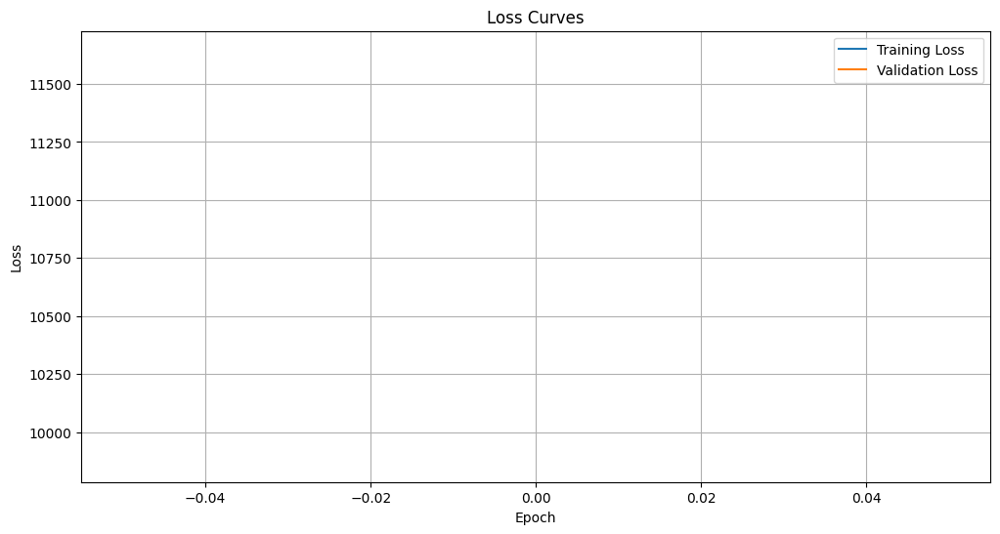

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


234/234 [==============================] - 80s 240ms/step - loss: 11639.7803 - accuracy: 0.5638 - val_loss: 9873.5029 - val_accuracy: 0.6730
Epoch 2/60
234/234 [==============================] - ETA: 0s - loss: 8499.5342 - accuracy: 0.6334

KeyboardInterrupt: 

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, optimizers, regularizers
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir, class_labels)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size, augment=False):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    img = img / 255.0  # Normalize the image to [0, 1]
                    if augment:
                        img = data_gen.random_transform(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    # Specify output shapes for the generator
    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)  # Updated to match discriminator input size
batch_size = 32

# Data augmentation generator
data_gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Create generators
train_generator = data_to_generator(train_data, train_labels, img_size, batch_size, augment=True)
val_generator = data_to_generator(val_data, val_labels, img_size, batch_size)
test_generator = data_to_generator(test_data, test_labels, img_size, batch_size)

# Define the discriminator model with regularization
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3], kernel_regularizer=regularizers.l2(0.01)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Create the main CNN model
inputs = tf.keras.Input(shape=(128, 128, 3))

# Apply Layer Groups 1 and 2
x = make_discriminator_model()(inputs)

# Create parallel class expert layers for each class and load pretrained weights
class_expert_outputs = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_x = expert_model(inputs)
        class_expert_outputs.append(expert_x)
    else:
        print(f"Weight file does not exist: {weights_path}")

# Concatenate the outputs of class expert layers
concatenated = layers.Concatenate()(class_expert_outputs)

# Apply extra layers and final classification layer
x = layers.Flatten()(concatenated)
x = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_labels), activation='softmax')(x)

# Create the final model
final_model = tf.keras.Model(inputs, outputs)

# Compile the model
final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Custom Callback to Plot Loss Curves
class PlotLossesCallback(Callback):
    def __init__(self):
        super(PlotLossesCallback, self).__init__()
        self.train_losses = []
        self.val_losses = []

    def on_epoch_end(self, epoch, logs=None):
        self.train_losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        plt.figure(figsize=(12, 6))
        plt.plot(self.train_losses, label='Training Loss')
        plt.plot(self.val_losses, label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Loss Curves')
        plt.legend()
        plt.grid(True)
        plt.show()

# Early Stopping and Model Checkpoint
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint_callback = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True)

# Train the model with custom callback
plot_losses_callback = PlotLossesCallback()
final_model.fit(train_generator, epochs=60, validation_data=val_generator,
                steps_per_epoch=len(train_data)//batch_size, validation_steps=len(val_data)//batch_size,
                callbacks=[plot_losses_callback, early_stopping_callback, checkpoint_callback])

# Evaluate the model
test_loss, test_accuracy = final_model.evaluate(test_generator, steps=len(test_data)//batch_size)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Save the final model
final_model.save('class_expert_cnn.h5')

# Compute BMA predictions
def compute_bma(expert_models, data_generator, num_samples):
    predictions = []
    for model in expert_models:
        preds = []
        for _ in range(num_samples):
            batch_images, _ = next(iter(data_generator))
            batch_preds = model.predict(batch_images)
            preds.append(batch_preds)
        preds = np.concatenate(preds)
        predictions.append(preds)

    # Average the predictions
    avg_predictions = np.mean(predictions, axis=0)
    return avg_predictions

# Load and create class expert models for BMA
expert_models = []
for class_name in class_labels:
    weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'
    if os.path.exists(weights_path):
        expert_model = create_class_expert((128, 128, 3), weights_path)
        expert_models.append(expert_model)
    else:
        print(f"Weight file does not exist for BMA: {weights_path}")

# Compute BMA predictions
bma_predictions = compute_bma(expert_models, test_generator, num_samples=len(test_data)//batch_size)

# Convert BMA predictions to class labels
bma_class_predictions = np.argmax(bma_predictions, axis=1)

# Assuming true labels are available
true_labels = np.array(test_labels)

# Evaluate BMA performance
from sklearn.metrics import classification_report
print(classification_report(true_labels, bma_class_predictions))


In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split, KFold
from tensorflow.keras import layers, optimizers, regularizers
from tensorflow.keras.callbacks import Callback, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

# Data augmentation setup
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)
batch_size = 32

# Create generators
train_generator = datagen.flow_from_directory(
    directory=combined_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='sparse'
)

# Learning rate scheduler
def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule)

# Early stopping setup
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3],
                      kernel_regularizer=regularizers.l2(0.01)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Cross-validation setup
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Cross-validation loop
for train_index, val_index in kfold.split(train_data):
    train_data_fold = [train_data[i] for i in train_index]
    val_data_fold = [val_data[i] for i in val_index]
    train_labels_fold = [train_labels[i] for i in train_index]
    val_labels_fold = [val_labels[i] for i in val_index]

    # Create generators for the fold
    train_generator = data_to_generator(train_data_fold, train_labels_fold, img_size, batch_size)
    val_generator = data_to_generator(val_data_fold, val_labels_fold, img_size, batch_size)

    # Create the main CNN model
    inputs = tf.keras.Input(shape=(128, 128, 3))

    # Apply Layer Groups 1 and 2
    x = make_discriminator_model()(inputs)

    # Create parallel class expert layers for each class and load pretrained weights
    class_expert_outputs = []
    for class_name in class_labels:
        weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
        if os.path.exists(weights_path):
            expert_model = create_class_expert((128, 128, 3), weights_path)
            expert_x = expert_model(inputs)
            class_expert_outputs.append(expert_x)
        else:
            print(f"Weight file does not exist: {weights_path}")

    # Concatenate the outputs of class expert layers
    concatenated = layers.Concatenate()(class_expert_outputs)

    # Apply extra layers and final classification layer
    x = layers.Flatten()(concatenated)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(len(class_labels), activation='softmax')(x)

    # Create the final model
    final_model = tf.keras.Model(inputs, outputs)

    # Compile the model
    final_model.compile(optimizer=optimizers.Adam(learning_rate=0.0001),
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])

    # Custom Callback to Plot Loss Curves
    class PlotLossesCallback(Callback):
        def __init__(self):
            super(PlotLossesCallback, self).__init__()
            self.epochs = []
            self.history = {'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': []}

        def on_epoch_end(self, epoch, logs=None):
            self.epochs.append(epoch)
            for key in self.history.keys():
                self.history[key].append(logs.get(key))
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.plot(self.epochs, self.history['loss'], label='Training Loss')
            plt.plot(self.epochs, self.history['val_loss'], label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()
            plt.title('Loss Curves')
            plt.grid(True)

            plt.subplot(1, 2, 2)
            plt.plot(self.epochs, self.history['accuracy'], label='Training Accuracy')
            plt.plot(self.epochs, self.history['val_accuracy'], label='Validation Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()
            plt.title('Accuracy Curves')
            plt.grid(True)

            plt.tight_layout()
            plt.show()

    plot_losses_callback = PlotLossesCallback()

    # Train the model
    final_model.fit(
        train_generator,
        epochs=60,
        validation_data=val_generator,
        steps_per_epoch=len(train_data_fold)//batch_size,
        validation_steps=len(val_data_fold)//batch_size,
        callbacks=[plot_losses_callback, early_stopping, lr_scheduler]
    )

    # Evaluate on validation set
    val_loss, val_accuracy = final_model.evaluate(val_generator, steps=len(val_data_fold)//batch_size)
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

    # Save model weights
    final_model.save_weights(f'/content/final_model_weights_fold_{fold_index}.h5')

    # Print classification report
    val_predictions = final_model.predict(val_generator, steps=len(val_data_fold)//batch_size)
    val_predictions = np.argmax(val_predictions, axis=1)
    print(classification_report(val_labels_fold, val_predictions, target_names=class_labels))


Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Found 11720 images belonging to 8 classes.


IndexError: list index out of range

Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Epoch 1/60
187/187 [==============================] - ETA: 0s - loss: 5012.5396 - accuracy: 0.5720

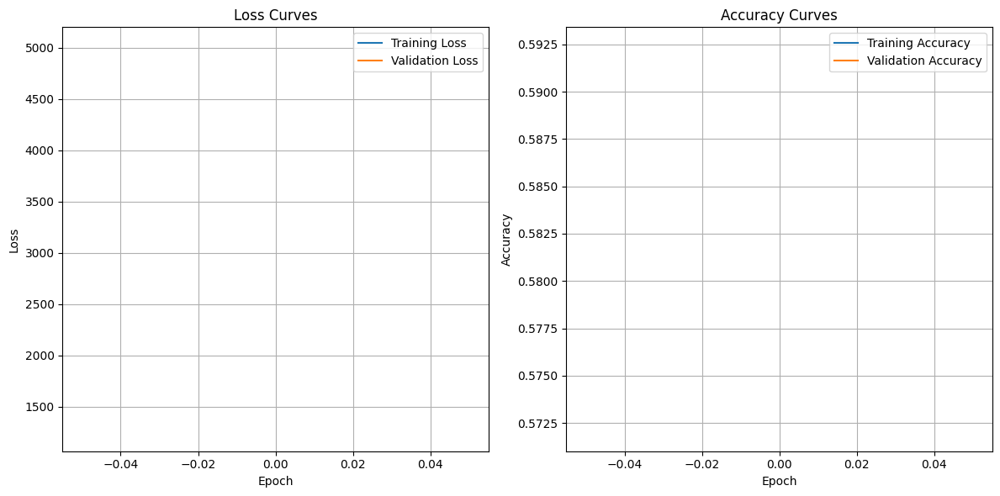

187/187 [==============================] - 66s 225ms/step - loss: 5012.5396 - accuracy: 0.5720 - val_loss: 1251.9730 - val_accuracy: 0.5924 - lr: 0.0010
Epoch 2/60
187/187 [==============================] - ETA: 0s - loss: 518.8983 - accuracy: 0.6089

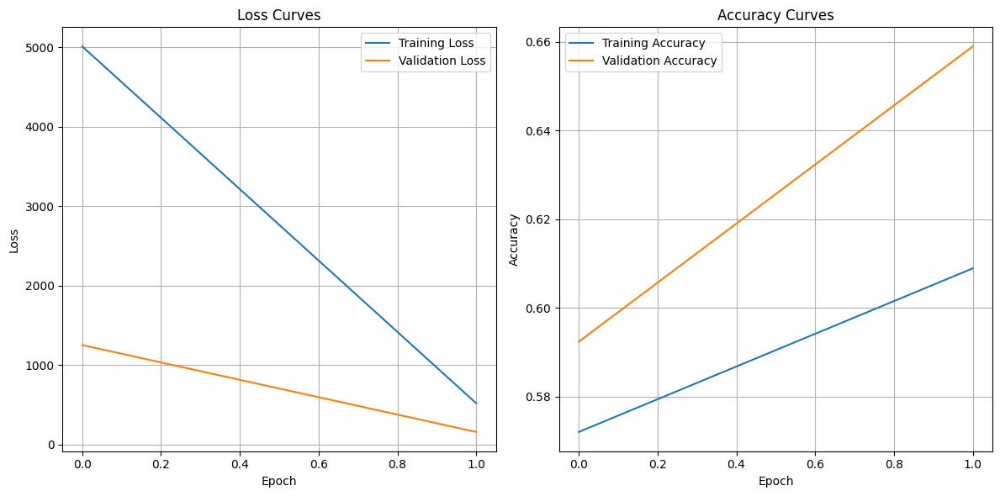

187/187 [==============================] - 43s 218ms/step - loss: 518.8983 - accuracy: 0.6089 - val_loss: 157.5692 - val_accuracy: 0.6590 - lr: 0.0010
Epoch 3/60
187/187 [==============================] - ETA: 0s - loss: 71.3779 - accuracy: 0.6146

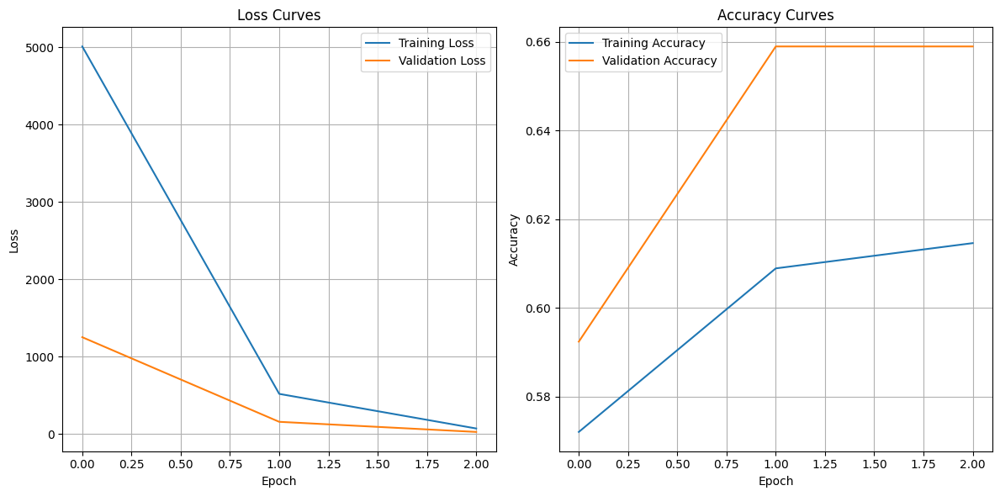

187/187 [==============================] - 41s 219ms/step - loss: 71.3779 - accuracy: 0.6146 - val_loss: 26.6870 - val_accuracy: 0.6590 - lr: 0.0010
Epoch 4/60
187/187 [==============================] - ETA: 0s - loss: 14.6214 - accuracy: 0.6372

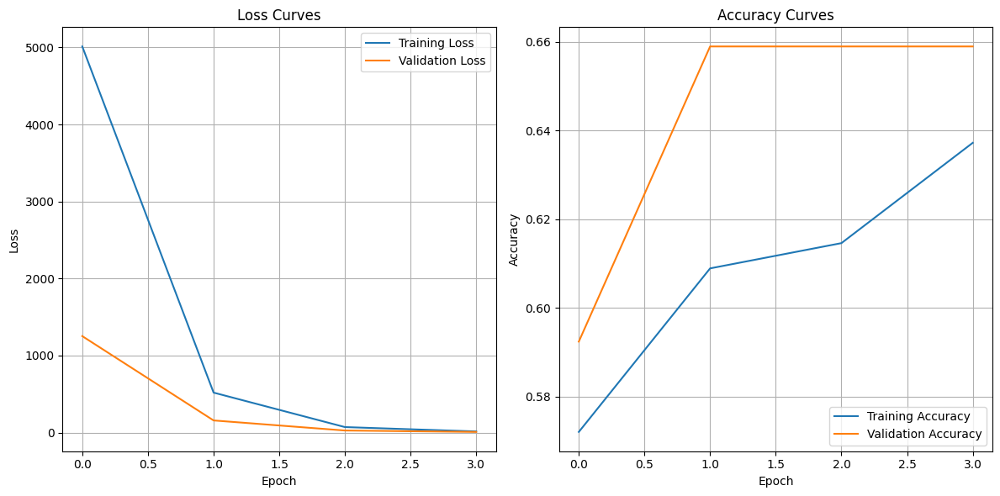

187/187 [==============================] - 41s 220ms/step - loss: 14.6214 - accuracy: 0.6372 - val_loss: 8.2785 - val_accuracy: 0.6590 - lr: 0.0010
Epoch 5/60
187/187 [==============================] - ETA: 0s - loss: 5.8873 - accuracy: 0.6421

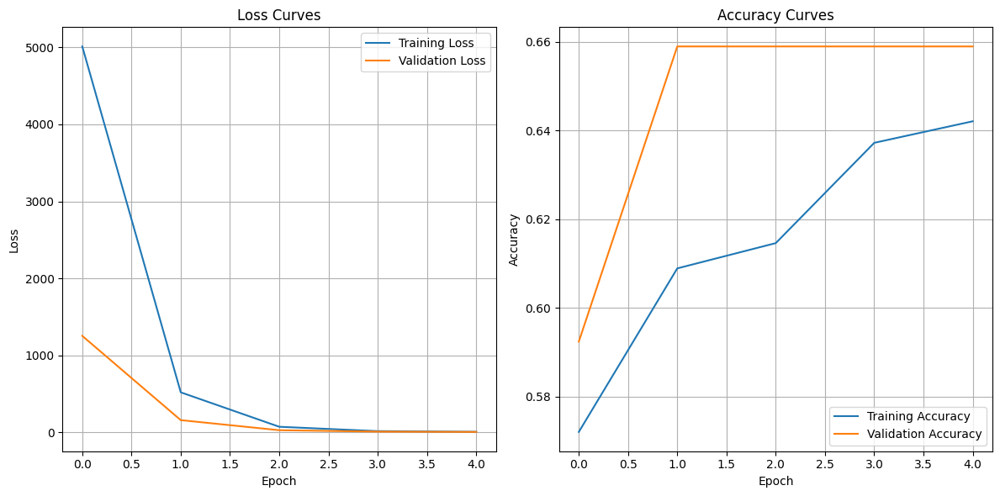

187/187 [==============================] - 41s 221ms/step - loss: 5.8873 - accuracy: 0.6421 - val_loss: 4.1982 - val_accuracy: 0.6590 - lr: 0.0010
Epoch 6/60
187/187 [==============================] - ETA: 0s - loss: 3.5214 - accuracy: 0.6510

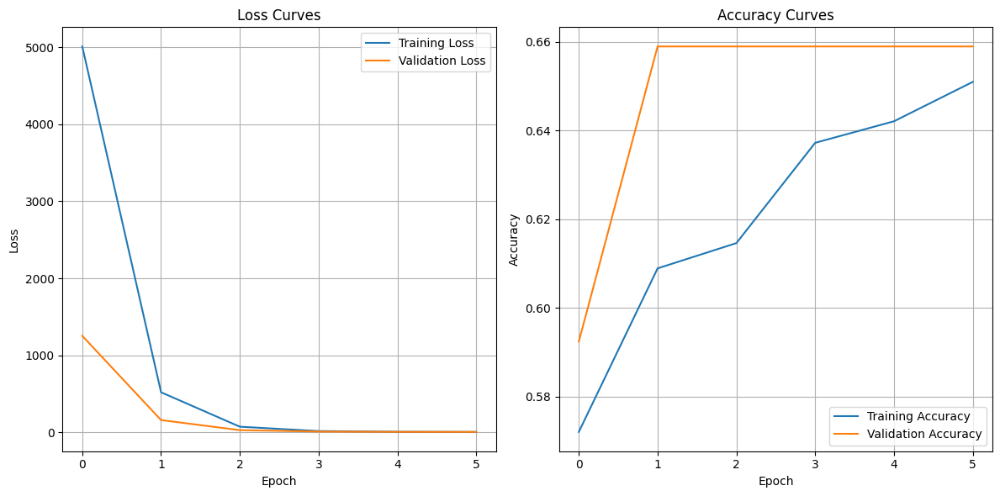

187/187 [==============================] - 41s 221ms/step - loss: 3.5214 - accuracy: 0.6510 - val_loss: 3.4447 - val_accuracy: 0.6590 - lr: 0.0010
Epoch 7/60
187/187 [==============================] - ETA: 0s - loss: 3.3152 - accuracy: 0.6513

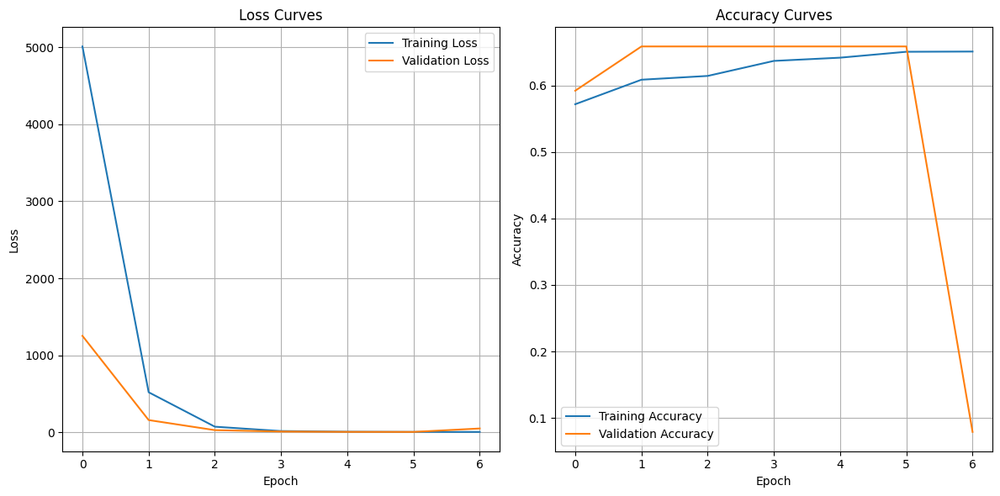

187/187 [==============================] - 41s 221ms/step - loss: 3.3152 - accuracy: 0.6513 - val_loss: 48.2520 - val_accuracy: 0.0788 - lr: 0.0010
Epoch 8/60
187/187 [==============================] - ETA: 0s - loss: 3.2523 - accuracy: 0.6471

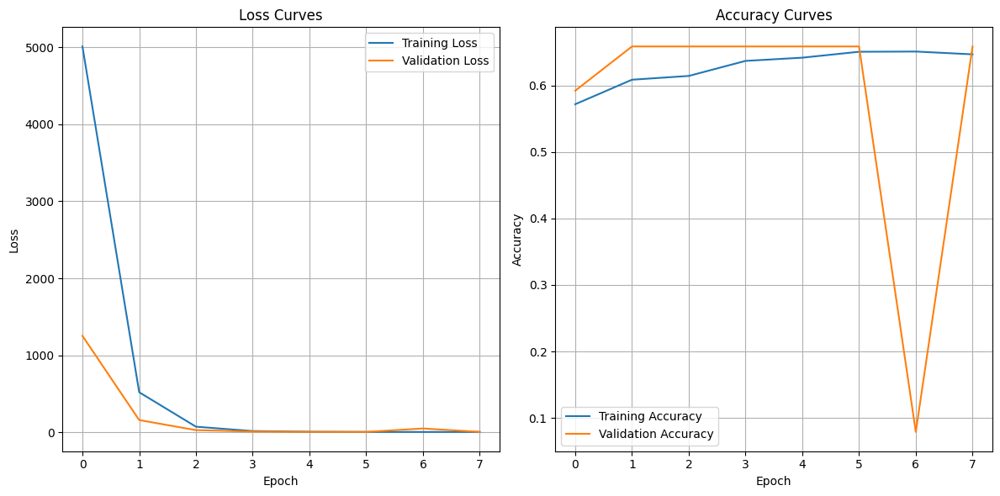

187/187 [==============================] - 41s 221ms/step - loss: 3.2523 - accuracy: 0.6471 - val_loss: 3.6784 - val_accuracy: 0.6590 - lr: 0.0010
Epoch 9/60
187/187 [==============================] - ETA: 0s - loss: 2.7357 - accuracy: 0.6532

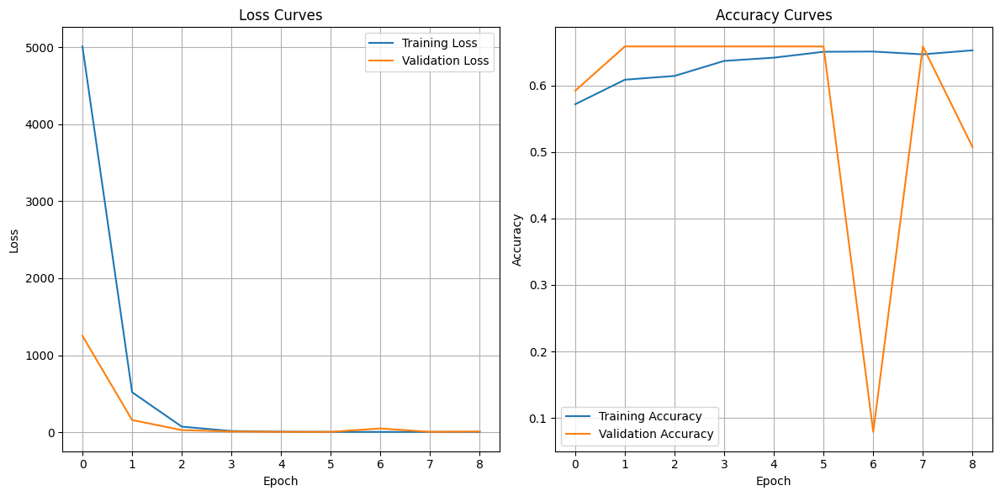

187/187 [==============================] - 41s 221ms/step - loss: 2.7357 - accuracy: 0.6532 - val_loss: 8.1818 - val_accuracy: 0.5075 - lr: 0.0010
Epoch 10/60
187/187 [==============================] - ETA: 0s - loss: 2.6560 - accuracy: 0.6553

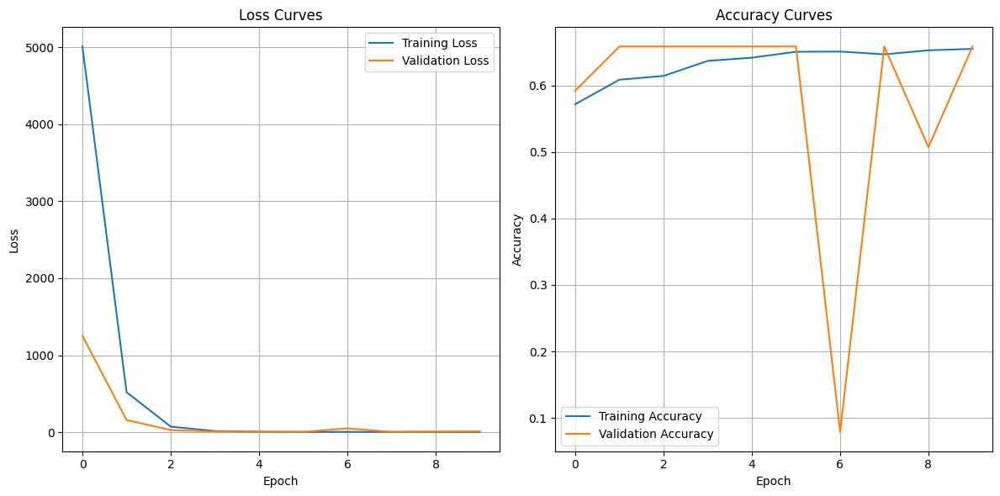

187/187 [==============================] - 41s 221ms/step - loss: 2.6560 - accuracy: 0.6553 - val_loss: 11.0901 - val_accuracy: 0.6590 - lr: 0.0010
Epoch 11/60
187/187 [==============================] - ETA: 0s - loss: 2.6376 - accuracy: 0.6572

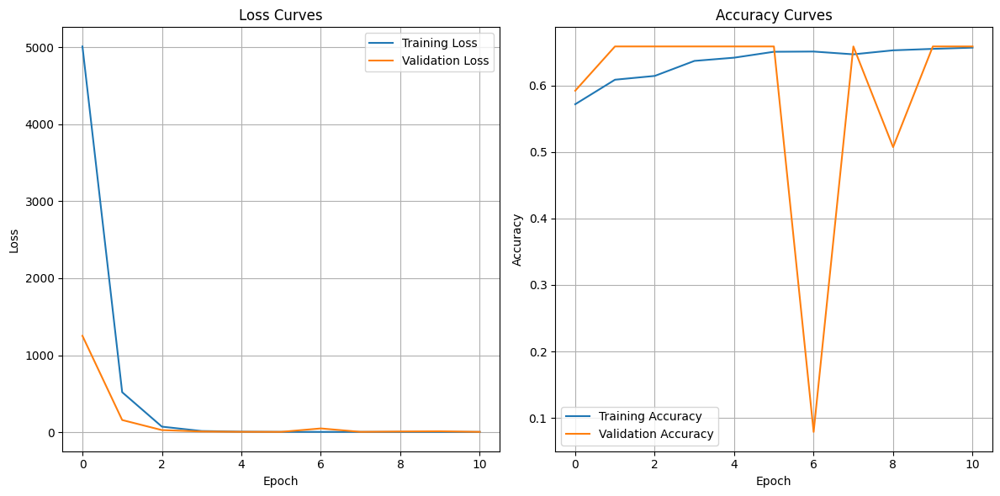

187/187 [==============================] - 42s 223ms/step - loss: 2.6376 - accuracy: 0.6572 - val_loss: 3.3621 - val_accuracy: 0.6590 - lr: 9.0484e-04
Epoch 12/60
187/187 [==============================] - ETA: 0s - loss: 2.3078 - accuracy: 0.6602

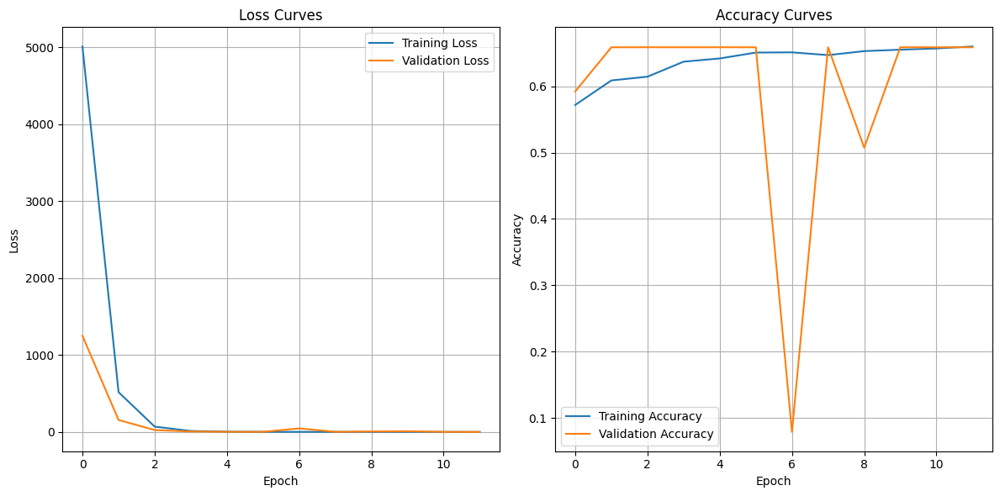

187/187 [==============================] - 42s 222ms/step - loss: 2.3078 - accuracy: 0.6602 - val_loss: 2.2120 - val_accuracy: 0.6590 - lr: 8.1873e-04
Epoch 13/60
187/187 [==============================] - ETA: 0s - loss: 2.1890 - accuracy: 0.6619

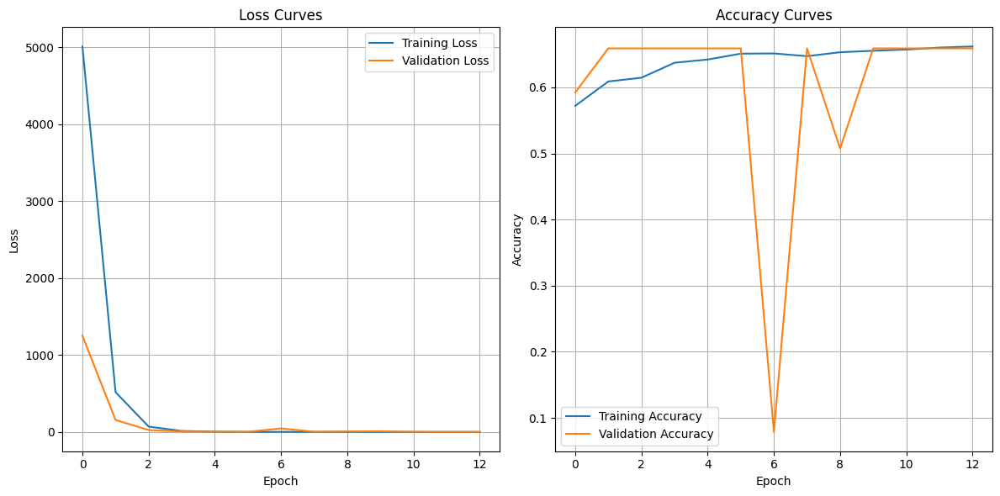

187/187 [==============================] - 42s 222ms/step - loss: 2.1890 - accuracy: 0.6619 - val_loss: 2.0713 - val_accuracy: 0.6590 - lr: 7.4082e-04
Epoch 14/60
187/187 [==============================] - ETA: 0s - loss: 1.9838 - accuracy: 0.6572

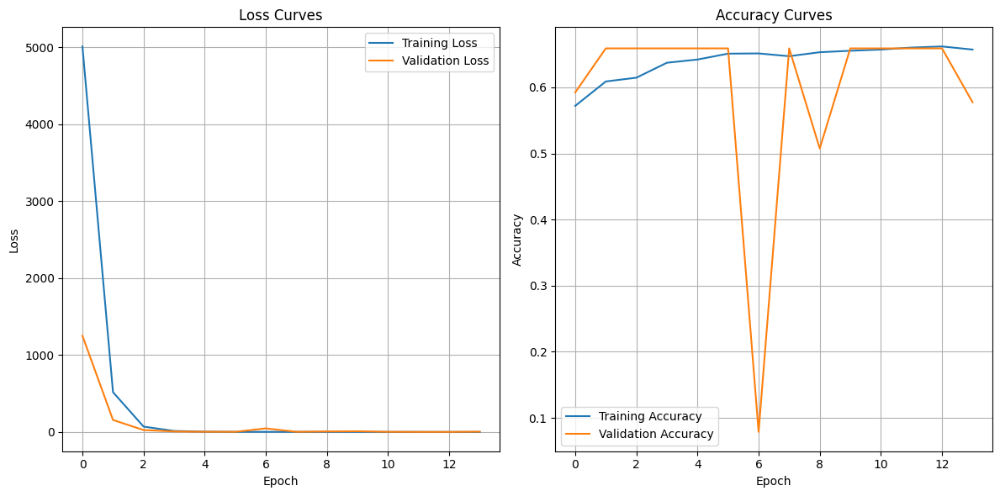

187/187 [==============================] - 41s 221ms/step - loss: 1.9838 - accuracy: 0.6572 - val_loss: 5.3834 - val_accuracy: 0.5774 - lr: 6.7032e-04
Epoch 15/60
187/187 [==============================] - ETA: 0s - loss: 2.1534 - accuracy: 0.6672

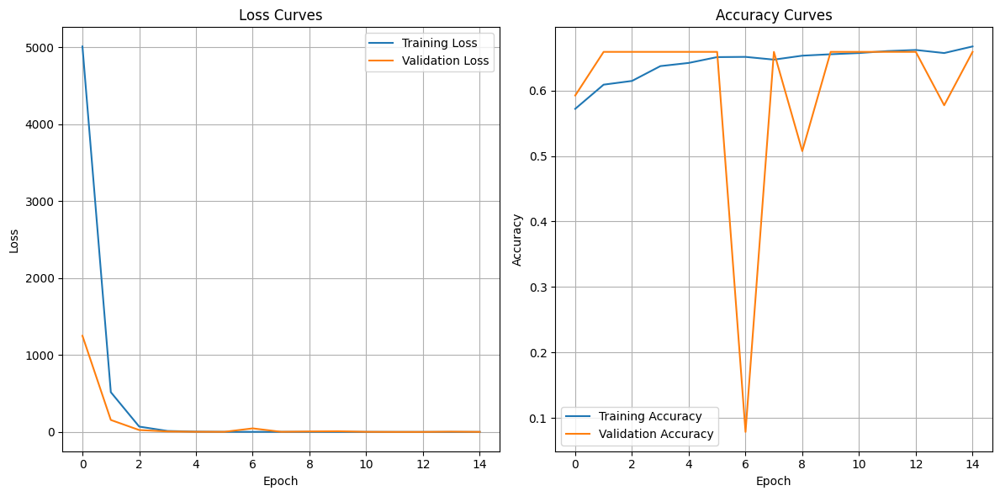

187/187 [==============================] - 41s 221ms/step - loss: 2.1534 - accuracy: 0.6672 - val_loss: 2.5529 - val_accuracy: 0.6590 - lr: 6.0653e-04
Epoch 16/60
187/187 [==============================] - ETA: 0s - loss: 1.8348 - accuracy: 0.6634

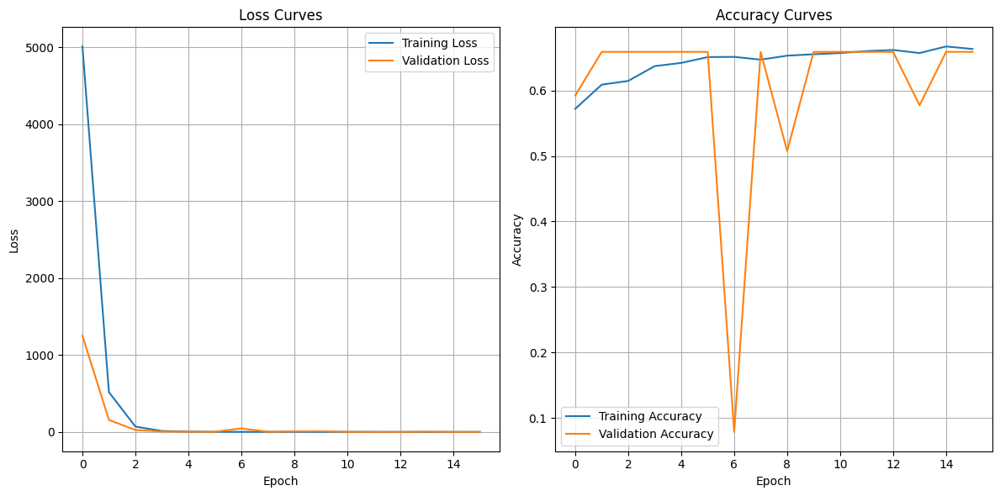

187/187 [==============================] - 41s 221ms/step - loss: 1.8348 - accuracy: 0.6634 - val_loss: 2.5737 - val_accuracy: 0.6590 - lr: 5.4881e-04
Epoch 17/60
187/187 [==============================] - ETA: 0s - loss: 1.8740 - accuracy: 0.6676

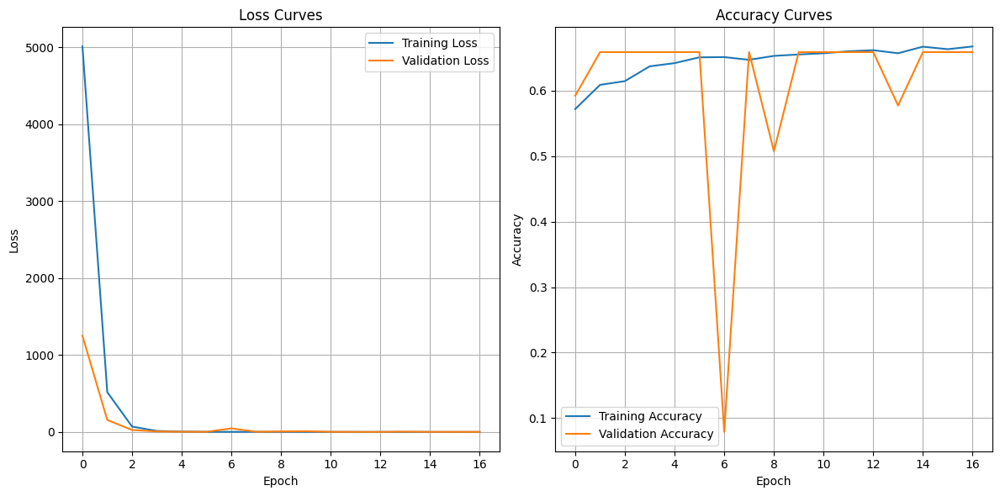

187/187 [==============================] - 41s 221ms/step - loss: 1.8740 - accuracy: 0.6676 - val_loss: 2.3102 - val_accuracy: 0.6590 - lr: 4.9659e-04
Epoch 18/60
187/187 [==============================] - ETA: 0s - loss: 1.7278 - accuracy: 0.6716

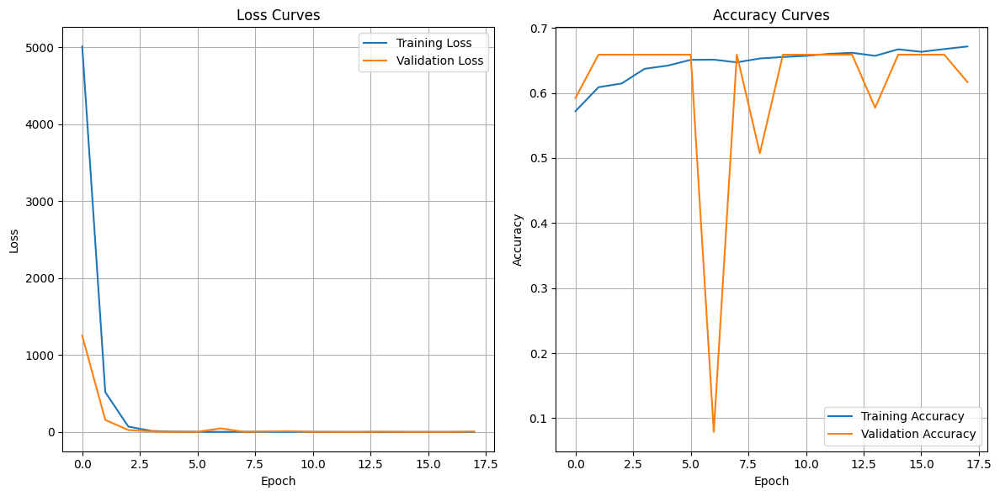

46/46 [==============================] - 3s 57ms/step - loss: 2.0713 - accuracy: 0.6590
Validation Loss: 2.0713117122650146, Validation Accuracy: 0.6589673757553101
46/46 [==============================] - 3s 52ms/step


ValueError: Found input variables with inconsistent numbers of samples: [1500, 1472]

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split, KFold
from tensorflow.keras import layers, optimizers, regularizers
from tensorflow.keras.callbacks import Callback, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

# Data augmentation setup
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)
batch_size = 32

# Learning rate scheduler
def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule)

# Early stopping setup
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3],
                      kernel_regularizer=regularizers.l2(0.01)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Cross-validation setup
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Split the data into train, validation, and test sets
train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir, class_labels)

# Cross-validation loop
fold_index = 0
for train_index, val_index in kfold.split(train_data):
    # Splitting data into folds
    train_data_fold = [train_data[i] for i in train_index]
    val_data_fold = [train_data[i] for i in val_index]
    train_labels_fold = [train_labels[i] for i in train_index]
    val_labels_fold = [train_labels[i] for i in val_index]

    # Create generators for the fold
    train_generator = data_to_generator(train_data_fold, train_labels_fold, img_size, batch_size)
    val_generator = data_to_generator(val_data_fold, val_labels_fold, img_size, batch_size)

    # Create the main CNN model
    inputs = tf.keras.Input(shape=(128, 128, 3))

    # Apply Layer Groups 1 and 2
    x = make_discriminator_model()(inputs)

    # Create parallel class expert layers for each class and load pretrained weights
    class_expert_outputs = []
    for class_name in class_labels:
        weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
        if os.path.exists(weights_path):
            expert_model = create_class_expert((128, 128, 3), weights_path)
            expert_x = expert_model(inputs)
            class_expert_outputs.append(expert_x)
        else:
            print(f"Weight file does not exist: {weights_path}")

    # Concatenate the outputs of class expert layers
    concatenated = layers.Concatenate()(class_expert_outputs)

    # Apply extra layers and final classification layer
    x = layers.Flatten()(concatenated)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(len(class_labels), activation='softmax')(x)

    # Compile the model
    final_model = tf.keras.Model(inputs=inputs, outputs=outputs)
    final_model.compile(optimizer=optimizers.Adam(learning_rate=0.001),
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])

    # Define a custom callback to plot losses and accuracies
    class PlotLossesCallback(Callback):
        def __init__(self):
            super(PlotLossesCallback, self).__init__()
            self.epochs = []
            self.history = {'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': []}

        def on_epoch_end(self, epoch, logs=None):
            self.epochs.append(epoch)
            for key in self.history.keys():
                self.history[key].append(logs.get(key))
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.plot(self.epochs, self.history['loss'], label='Training Loss')
            plt.plot(self.epochs, self.history['val_loss'], label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()
            plt.title('Loss Curves')
            plt.grid(True)

            plt.subplot(1, 2, 2)
            plt.plot(self.epochs, self.history['accuracy'], label='Training Accuracy')
            plt.plot(self.epochs, self.history['val_accuracy'], label='Validation Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()
            plt.title('Accuracy Curves')
            plt.grid(True)

            plt.tight_layout()
            plt.show()

    plot_losses_callback = PlotLossesCallback()

    # Train the model
    final_model.fit(
        train_generator,
        epochs=60,
        validation_data=val_generator,
        steps_per_epoch=len(train_data_fold)//batch_size,
        validation_steps=len(val_data_fold)//batch_size,
        callbacks=[plot_losses_callback, early_stopping, lr_scheduler]
    )

    # Evaluate on validation set
    val_loss, val_accuracy = final_model.evaluate(val_generator, steps=len(val_data_fold)//batch_size)
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

    # Save model weights
    final_model.save_weights(f'/content/final_model_weights_fold_{fold_index}.h5')

    # Print classification report
    val_predictions = final_model.predict(val_generator, steps=len(val_data_fold)//batch_size)
    val_predictions = np.argmax(val_predictions, axis=1)
    print(classification_report(val_labels_fold, val_predictions, target_names=class_labels))

    fold_index += 1


Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Epoch 1/60
187/187 [==============================] - ETA: 0s - loss: 5011.0107 - accuracy: 0.5829

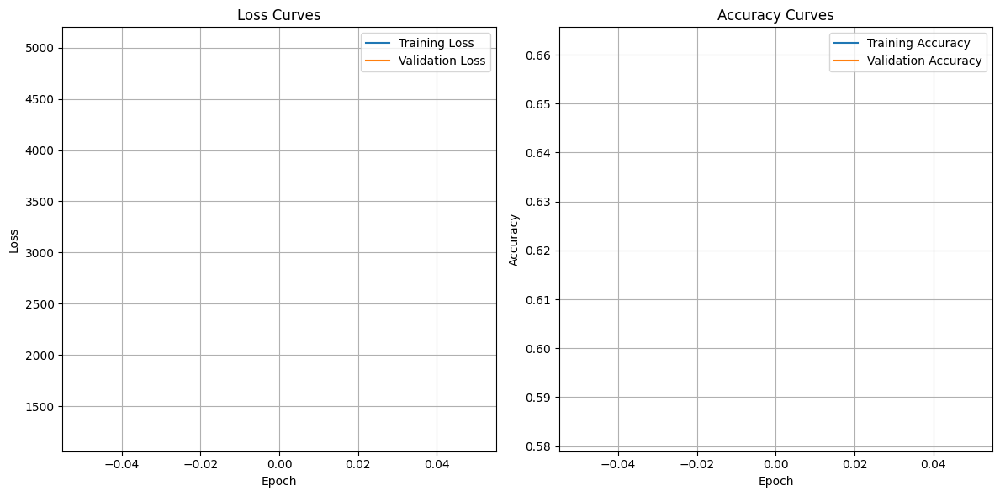

187/187 [==============================] - 66s 224ms/step - loss: 5011.0107 - accuracy: 0.5829 - val_loss: 1249.7981 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 2/60
187/187 [==============================] - ETA: 0s - loss: 517.2726 - accuracy: 0.6397

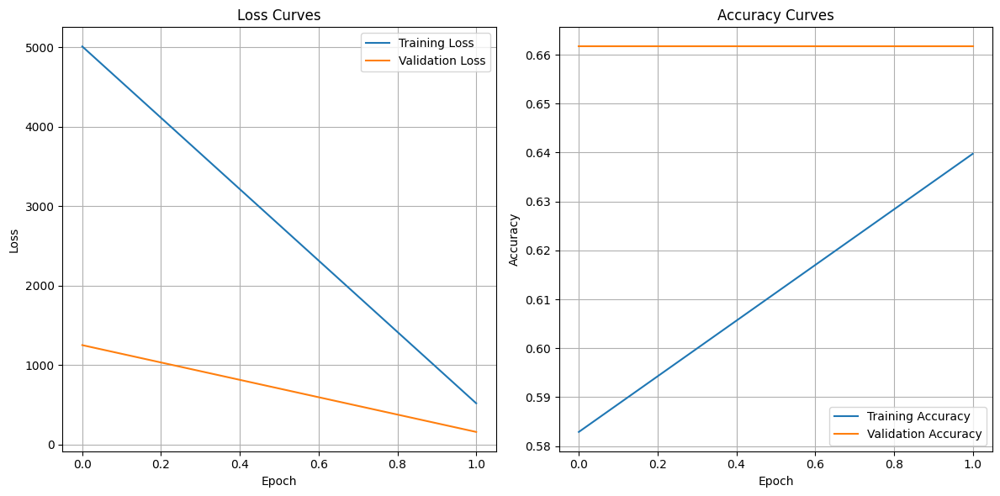

187/187 [==============================] - 41s 219ms/step - loss: 517.2726 - accuracy: 0.6397 - val_loss: 156.5568 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 3/60
187/187 [==============================] - ETA: 0s - loss: 70.5476 - accuracy: 0.6510

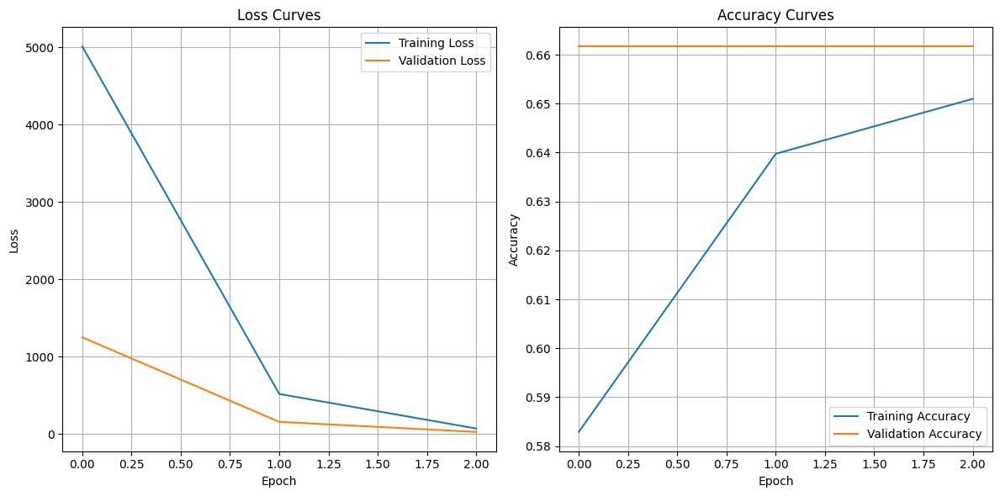

187/187 [==============================] - 41s 220ms/step - loss: 70.5476 - accuracy: 0.6510 - val_loss: 26.0708 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 4/60
187/187 [==============================] - ETA: 0s - loss: 13.9938 - accuracy: 0.6553

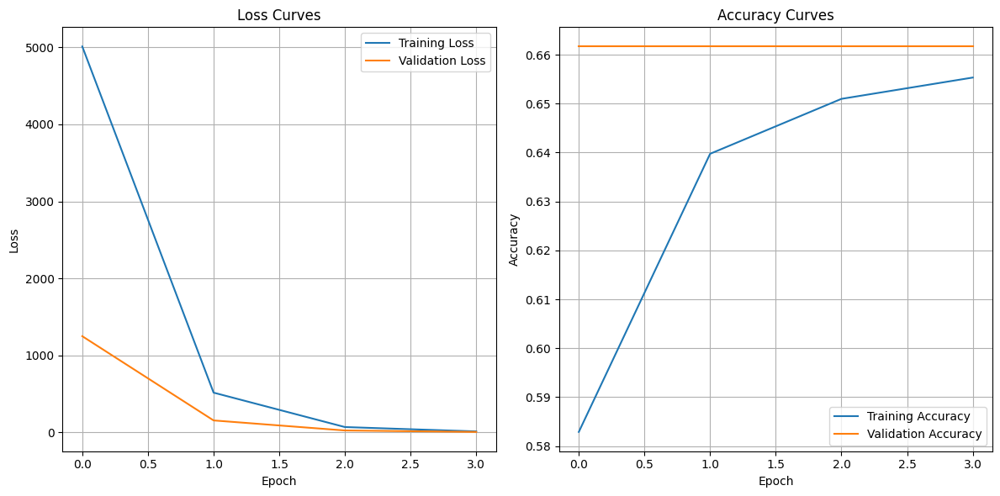

187/187 [==============================] - 41s 221ms/step - loss: 13.9938 - accuracy: 0.6553 - val_loss: 7.1200 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 5/60
187/187 [==============================] - ETA: 0s - loss: 5.3007 - accuracy: 0.6577

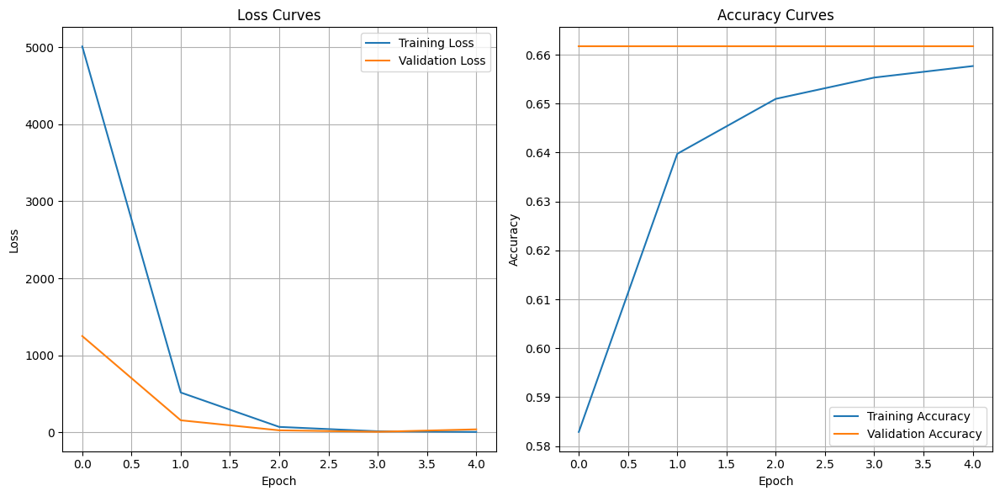

187/187 [==============================] - 41s 220ms/step - loss: 5.3007 - accuracy: 0.6577 - val_loss: 38.7993 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 6/60
187/187 [==============================] - ETA: 0s - loss: 3.3653 - accuracy: 0.6588

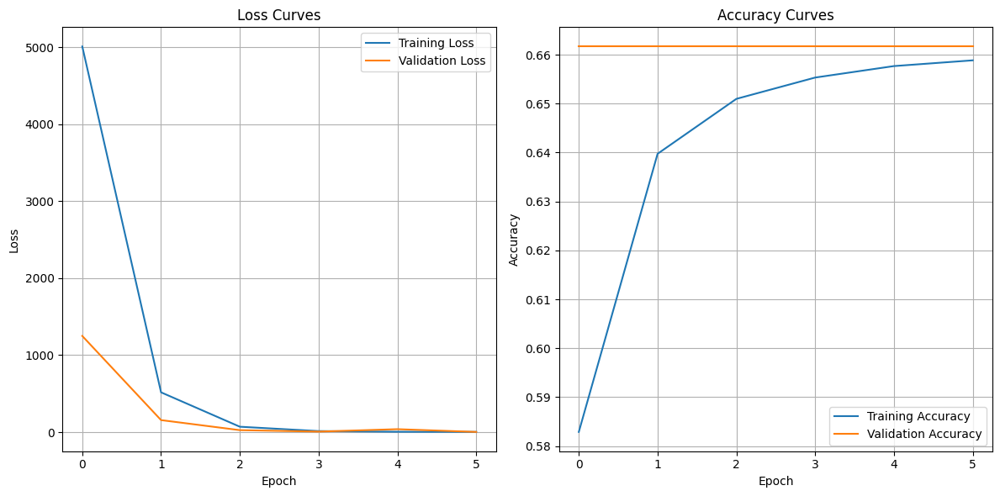

187/187 [==============================] - 42s 223ms/step - loss: 3.3653 - accuracy: 0.6588 - val_loss: 2.8428 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 7/60
187/187 [==============================] - ETA: 0s - loss: 2.7020 - accuracy: 0.6595

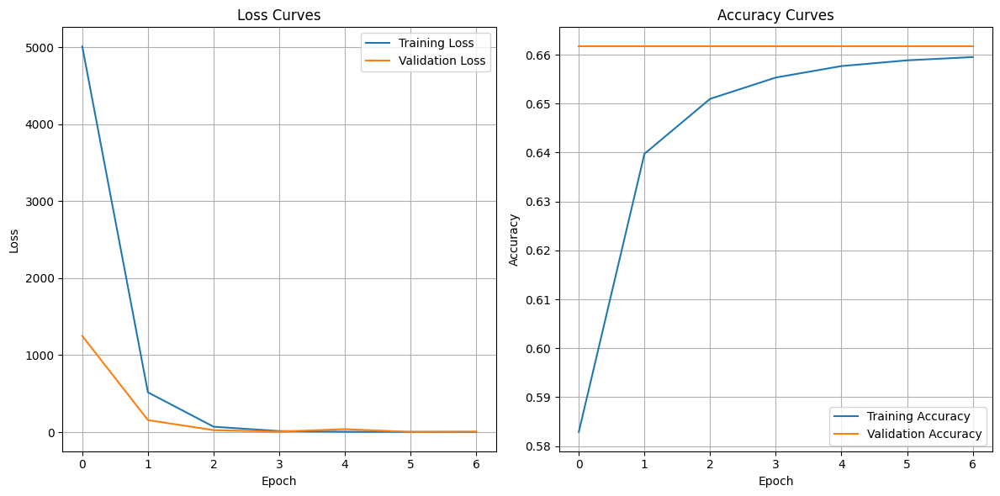

187/187 [==============================] - 41s 221ms/step - loss: 2.7020 - accuracy: 0.6595 - val_loss: 6.9409 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 8/60
187/187 [==============================] - ETA: 0s - loss: 2.6581 - accuracy: 0.6587

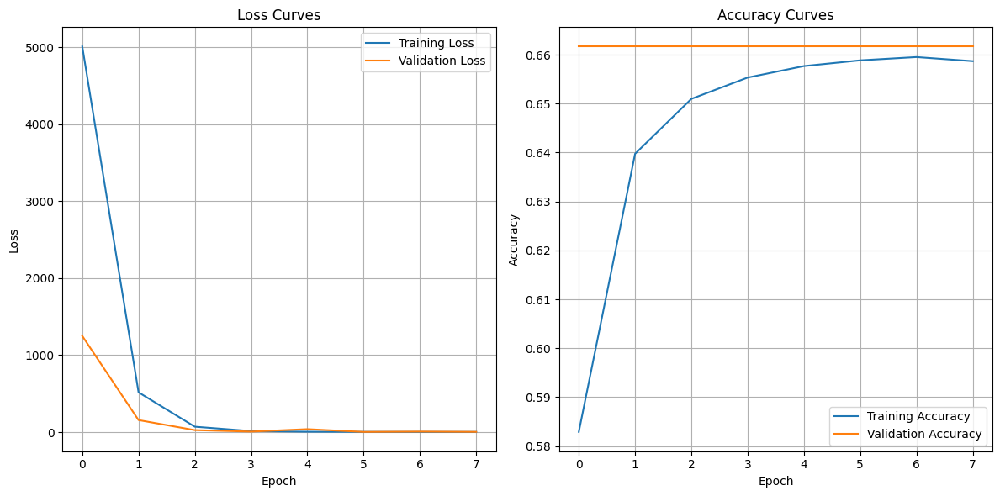

187/187 [==============================] - 41s 221ms/step - loss: 2.6581 - accuracy: 0.6587 - val_loss: 3.4887 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 9/60
187/187 [==============================] - ETA: 0s - loss: 2.2984 - accuracy: 0.6577

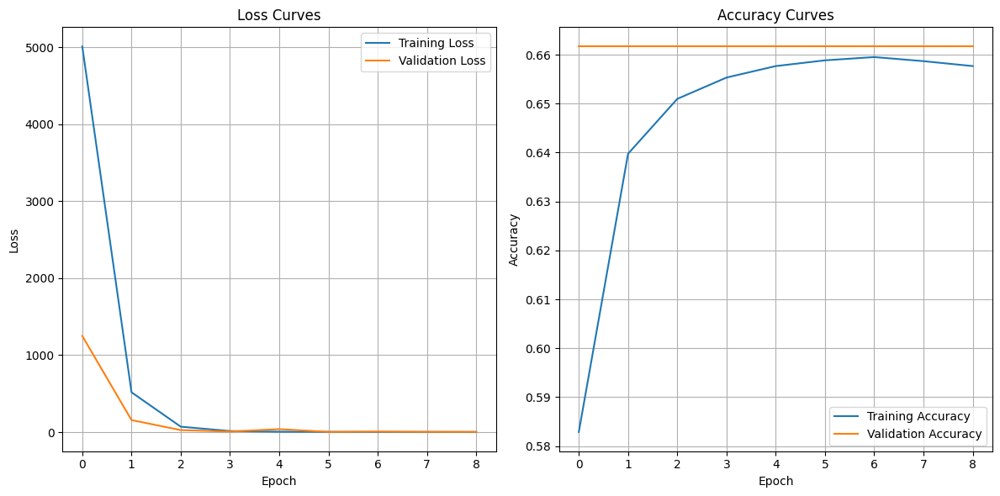

187/187 [==============================] - 41s 221ms/step - loss: 2.2984 - accuracy: 0.6577 - val_loss: 3.0045 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 10/60
187/187 [==============================] - ETA: 0s - loss: 2.5523 - accuracy: 0.6595

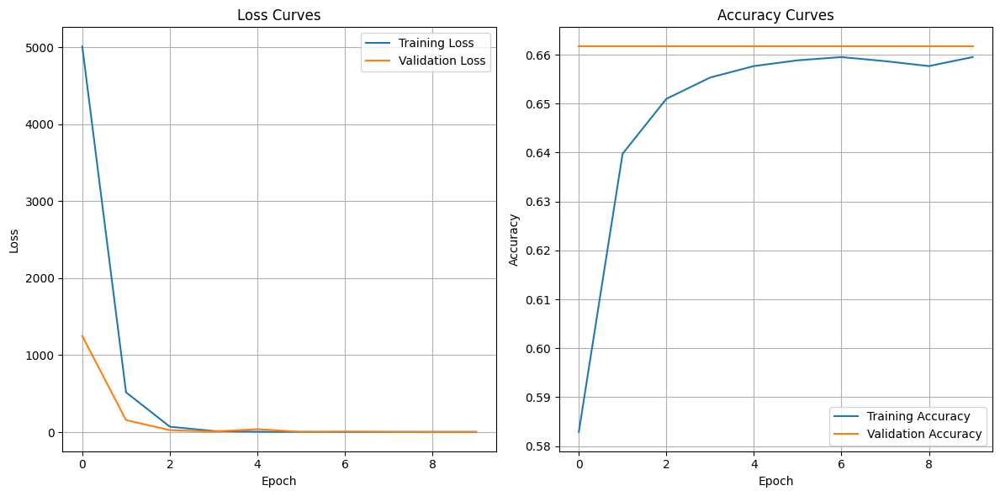

187/187 [==============================] - 42s 223ms/step - loss: 2.5523 - accuracy: 0.6595 - val_loss: 2.5124 - val_accuracy: 0.6617 - lr: 0.0010
Epoch 11/60
187/187 [==============================] - ETA: 0s - loss: 2.2025 - accuracy: 0.6582

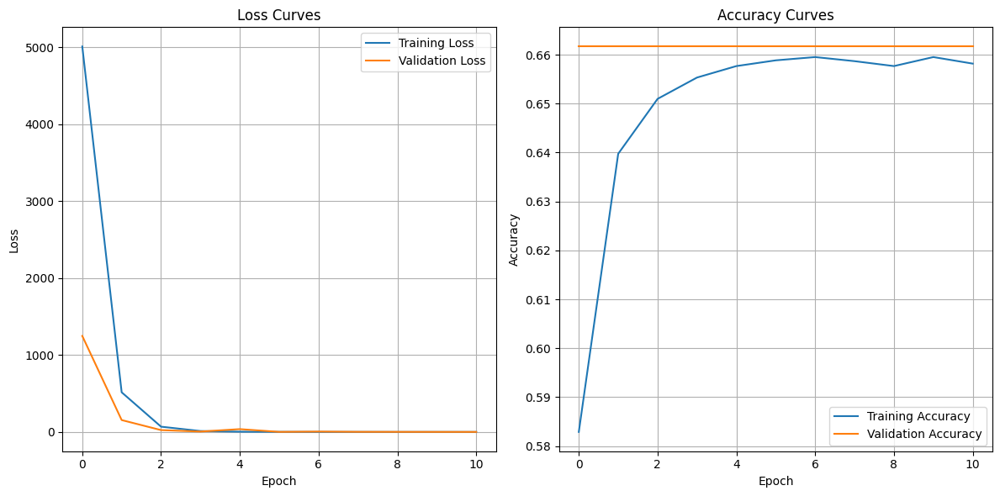

187/187 [==============================] - 42s 222ms/step - loss: 2.2025 - accuracy: 0.6582 - val_loss: 2.2923 - val_accuracy: 0.6617 - lr: 9.0484e-04
Epoch 12/60
187/187 [==============================] - ETA: 0s - loss: 2.1475 - accuracy: 0.6590

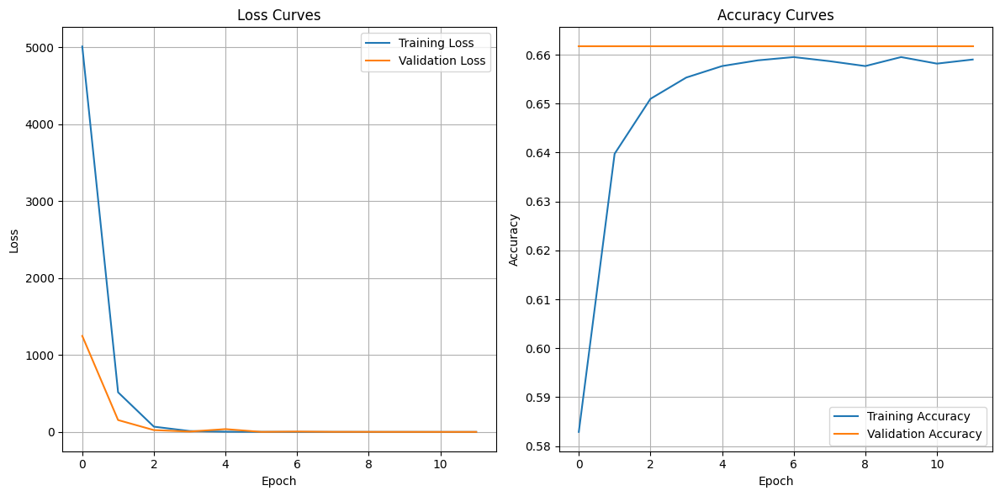

187/187 [==============================] - 41s 221ms/step - loss: 2.1475 - accuracy: 0.6590 - val_loss: 2.3085 - val_accuracy: 0.6617 - lr: 8.1873e-04
Epoch 13/60
187/187 [==============================] - ETA: 0s - loss: 1.9221 - accuracy: 0.6593

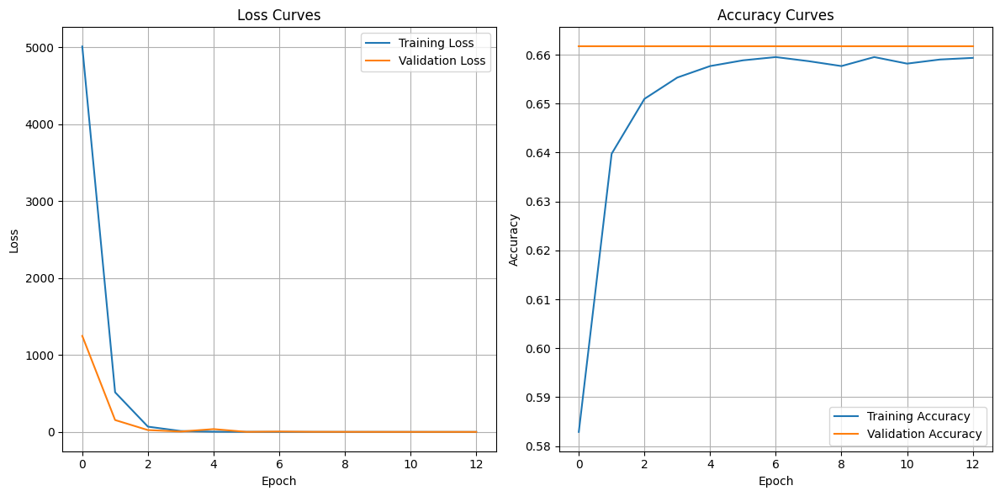

187/187 [==============================] - 42s 222ms/step - loss: 1.9221 - accuracy: 0.6593 - val_loss: 2.1065 - val_accuracy: 0.6617 - lr: 7.4082e-04
Epoch 14/60
187/187 [==============================] - ETA: 0s - loss: 1.8754 - accuracy: 0.6580

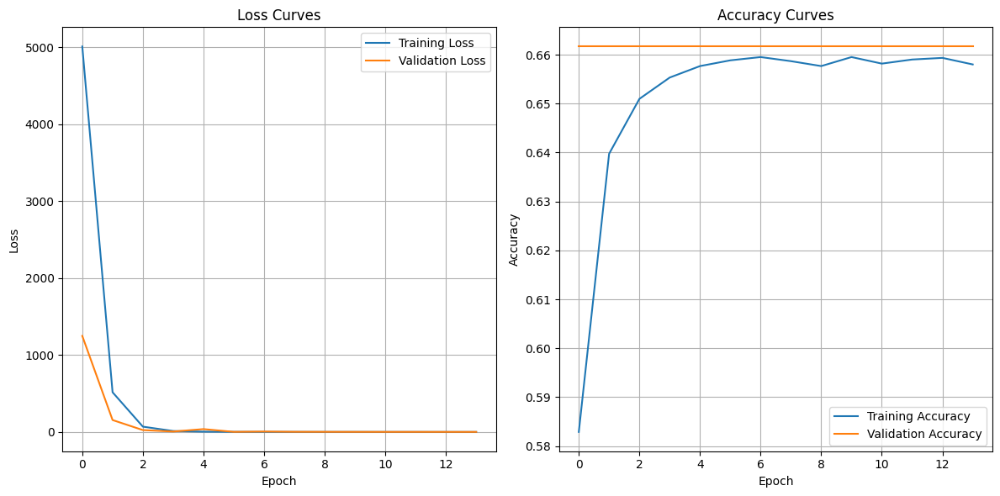

187/187 [==============================] - 42s 222ms/step - loss: 1.8754 - accuracy: 0.6580 - val_loss: 1.9317 - val_accuracy: 0.6617 - lr: 6.7032e-04
Epoch 15/60
187/187 [==============================] - ETA: 0s - loss: 1.7320 - accuracy: 0.6582

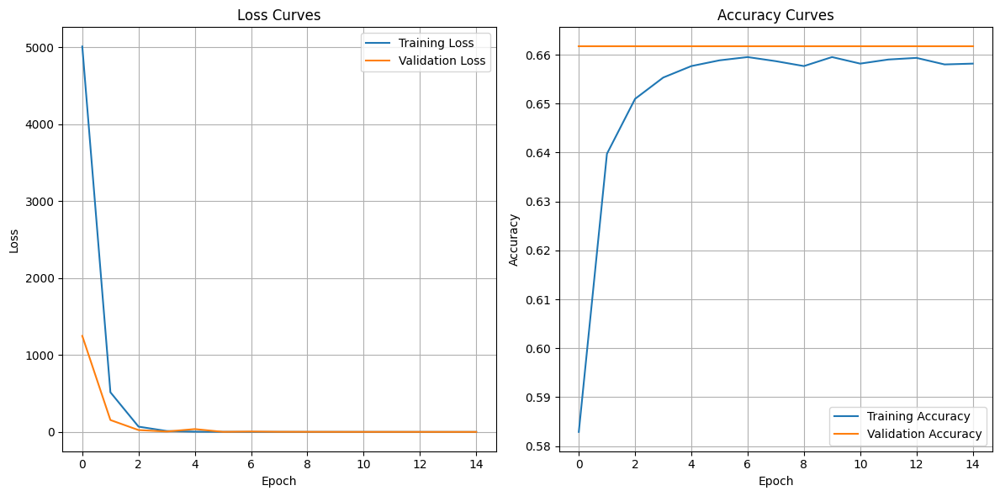

187/187 [==============================] - 42s 222ms/step - loss: 1.7320 - accuracy: 0.6582 - val_loss: 1.9046 - val_accuracy: 0.6617 - lr: 6.0653e-04
Epoch 16/60
187/187 [==============================] - ETA: 0s - loss: 1.7086 - accuracy: 0.6595

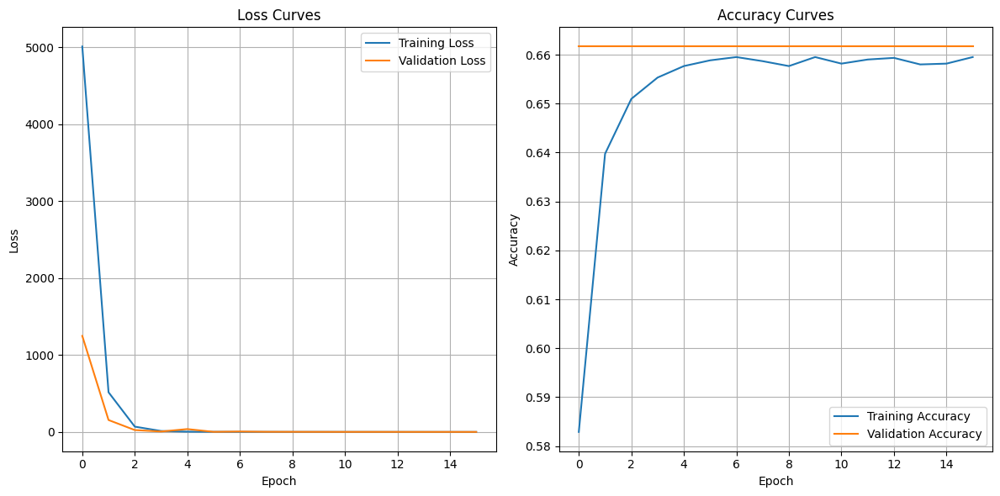

187/187 [==============================] - 42s 223ms/step - loss: 1.7086 - accuracy: 0.6595 - val_loss: 1.6815 - val_accuracy: 0.6617 - lr: 5.4881e-04
Epoch 17/60


KeyboardInterrupt: 

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split, KFold
from tensorflow.keras import layers, optimizers, regularizers
from tensorflow.keras.callbacks import Callback, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

# Data augmentation setup
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images, np.array(batch_labels)

    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)
batch_size = 32

# Learning rate scheduler
def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule)

# Early stopping setup
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3],
                      kernel_regularizer=regularizers.l2(0.01)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Cross-validation setup
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Split the data into train, validation, and test sets
train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir, class_labels)

# Cross-validation loop
fold_index = 0
for train_index, val_index in kfold.split(train_data):
    # Splitting data into folds
    train_data_fold = [train_data[i] for i in train_index]
    val_data_fold = [train_data[i] for i in val_index]
    train_labels_fold = [train_labels[i] for i in train_index]
    val_labels_fold = [train_labels[i] for i in val_index]

    # Create generators for the fold
    train_generator = data_to_generator(train_data_fold, train_labels_fold, img_size, batch_size)
    val_generator = data_to_generator(val_data_fold, val_labels_fold, img_size, batch_size)

    # Create the main CNN model
    inputs = tf.keras.Input(shape=(128, 128, 3))

    # Apply Layer Groups 1 and 2
    x = make_discriminator_model()(inputs)

    # Create parallel class expert layers for each class and load pretrained weights
    class_expert_outputs = []
    for class_name in class_labels:
        weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
        if os.path.exists(weights_path):
            expert_model = create_class_expert((128, 128, 3), weights_path)
            expert_x = expert_model(inputs)
            class_expert_outputs.append(expert_x)
        else:
            print(f"Weight file does not exist: {weights_path}")

    # Concatenate the outputs of class expert layers
    concatenated = layers.Concatenate()(class_expert_outputs)

    # Apply extra layers and final classification layer
    x = layers.Flatten()(concatenated)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(len(class_labels), activation='softmax')(x)

    # Compile the model
    final_model = tf.keras.Model(inputs=inputs, outputs=outputs)
    final_model.compile(optimizer=optimizers.Adam(learning_rate=0.001),
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])

    # Define a custom callback to plot losses and accuracies
    class PlotLossesCallback(Callback):
        def __init__(self):
            super(PlotLossesCallback, self).__init__()
            self.epochs = []
            self.history = {'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': []}

        def on_epoch_end(self, epoch, logs=None):
            self.epochs.append(epoch)
            for key in self.history.keys():
                self.history[key].append(logs.get(key))
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.plot(self.epochs, self.history['loss'], label='Training Loss')
            plt.plot(self.epochs, self.history['val_loss'], label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()
            plt.title('Loss Curves')
            plt.grid(True)

            plt.subplot(1, 2, 2)
            plt.plot(self.epochs, self.history['accuracy'], label='Training Accuracy')
            plt.plot(self.epochs, self.history['val_accuracy'], label='Validation Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()
            plt.title('Accuracy Curves')
            plt.grid(True)

            plt.tight_layout()
            plt.show()

    plot_losses_callback = PlotLossesCallback()

    # Train the model
    final_model.fit(
        train_generator,
        epochs=60,
        validation_data=val_generator,
        steps_per_epoch=len(train_data_fold)//batch_size,
        validation_steps=len(val_data_fold)//batch_size,
        callbacks=[plot_losses_callback, early_stopping, lr_scheduler]
    )

    # Evaluate on validation set
    val_loss, val_accuracy = final_model.evaluate(val_generator, steps=len(val_data_fold)//batch_size)
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

    # Save model weights
    final_model.save_weights(f'/content/final_model_weights_fold_{fold_index}.h5')

    # Print classification report
    # Collect validation predictions and ensure they align with validation labels
    val_predictions = final_model.predict(val_generator, steps=len(val_data_fold)//batch_size)
    val_predictions = np.argmax(val_predictions, axis=1)
    val_labels_fold = np.array(val_labels_fold)  # Ensure labels are a NumPy array for consistency
    print(classification_report(val_labels_fold, val_predictions, target_names=class_labels))

    fold_index += 1


Image count for each class in the combined dataset:
nevus: 7737 images
melanoma: 1305 images
pigmented benign keratosis: 1338 images
dermatofibroma: 160 images
squamous cell carcinoma: 229 images
basal cell carcinoma: 622 images
vascular lesion: 180 images
actinic keratosis: 149 images
Epoch 1/60
187/187 [==============================] - ETA: 0s - loss: 5010.9263 - accuracy: 0.5846

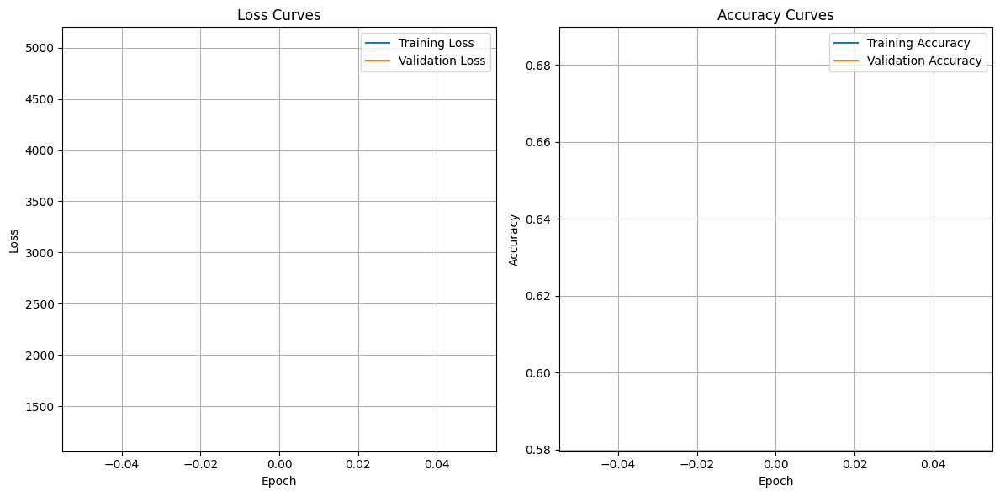

187/187 [==============================] - 67s 230ms/step - loss: 5010.9263 - accuracy: 0.5846 - val_loss: 1250.4941 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 2/60
187/187 [==============================] - ETA: 0s - loss: 517.8837 - accuracy: 0.6309

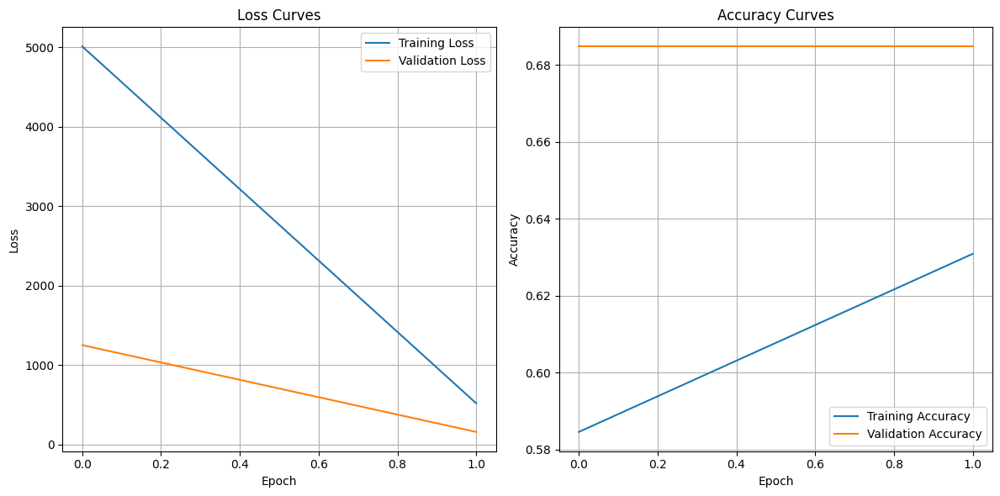

187/187 [==============================] - 41s 222ms/step - loss: 517.8837 - accuracy: 0.6309 - val_loss: 157.0419 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 3/60
187/187 [==============================] - ETA: 0s - loss: 71.0023 - accuracy: 0.6391

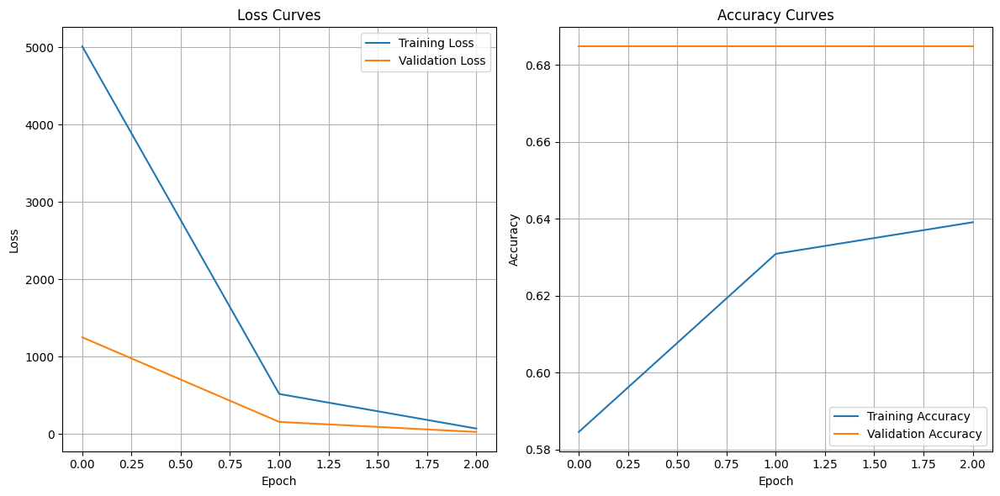

187/187 [==============================] - 41s 222ms/step - loss: 71.0023 - accuracy: 0.6391 - val_loss: 26.8950 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 4/60
187/187 [==============================] - ETA: 0s - loss: 14.1965 - accuracy: 0.6490

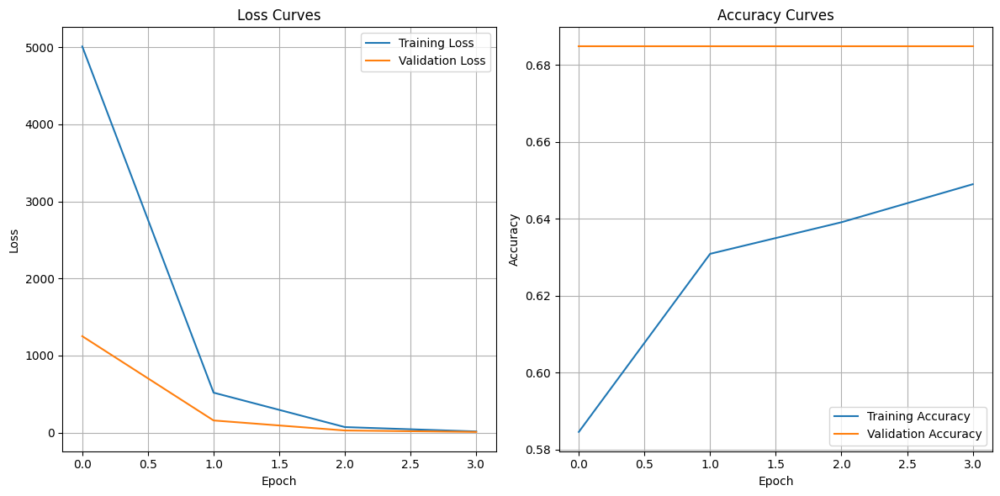

187/187 [==============================] - 42s 222ms/step - loss: 14.1965 - accuracy: 0.6490 - val_loss: 8.0326 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 5/60
187/187 [==============================] - ETA: 0s - loss: 5.3436 - accuracy: 0.6500

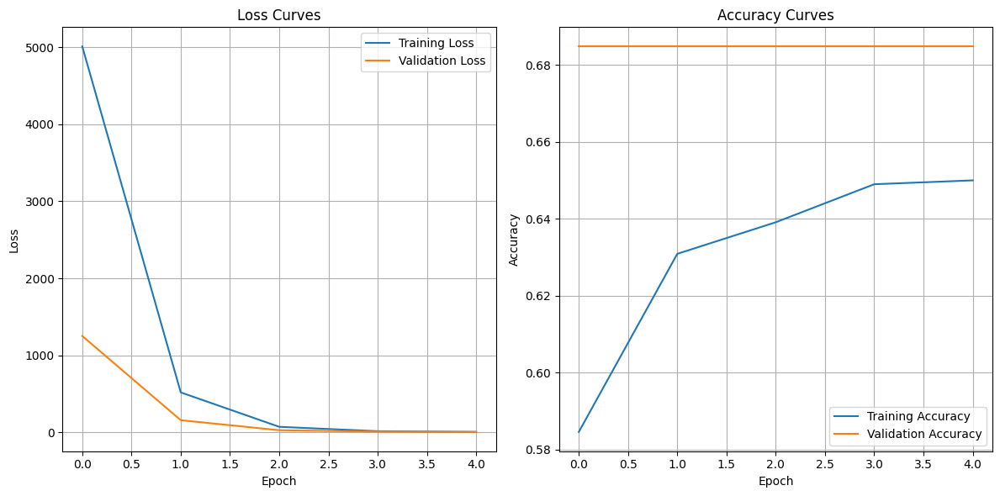

187/187 [==============================] - 41s 222ms/step - loss: 5.3436 - accuracy: 0.6500 - val_loss: 4.4560 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 6/60
187/187 [==============================] - ETA: 0s - loss: 3.3242 - accuracy: 0.6506

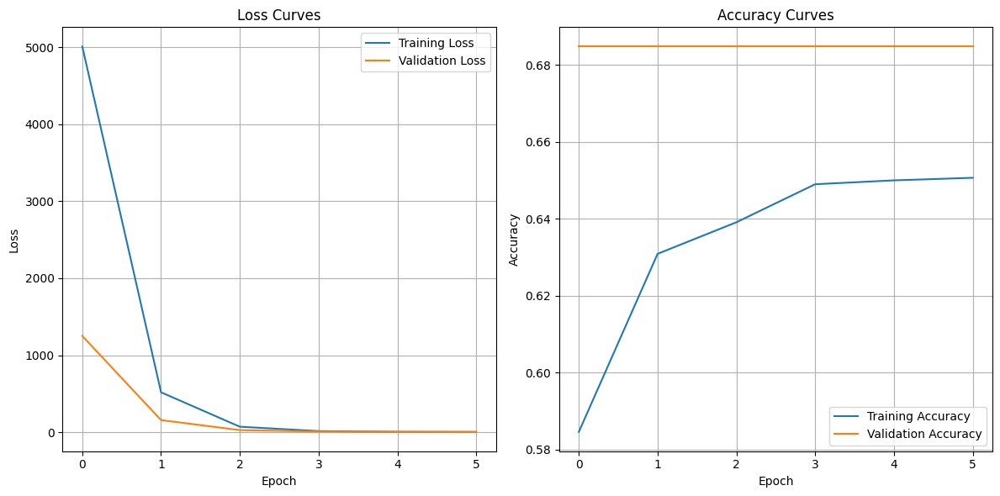

187/187 [==============================] - 41s 222ms/step - loss: 3.3242 - accuracy: 0.6506 - val_loss: 3.1999 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 7/60
187/187 [==============================] - ETA: 0s - loss: 2.6047 - accuracy: 0.6511

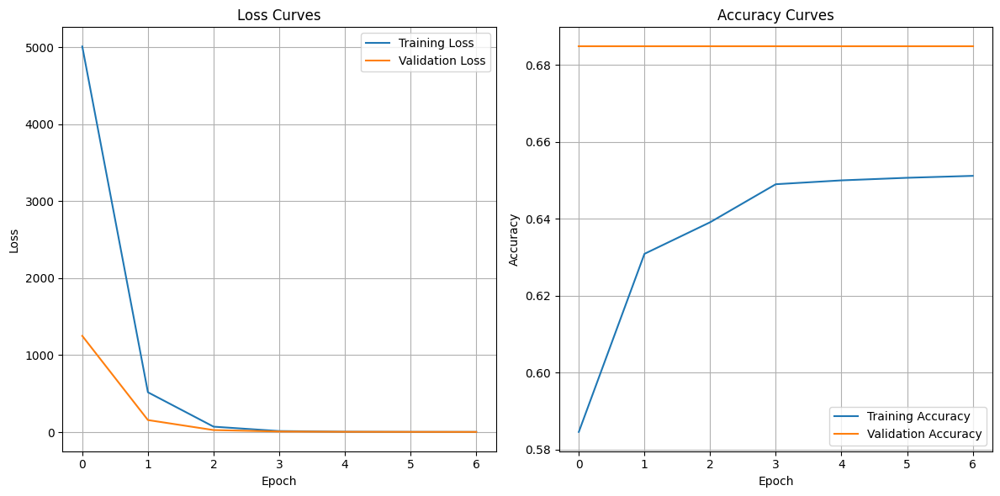

187/187 [==============================] - 41s 222ms/step - loss: 2.6047 - accuracy: 0.6511 - val_loss: 2.6202 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 8/60
187/187 [==============================] - ETA: 0s - loss: 2.5087 - accuracy: 0.6523

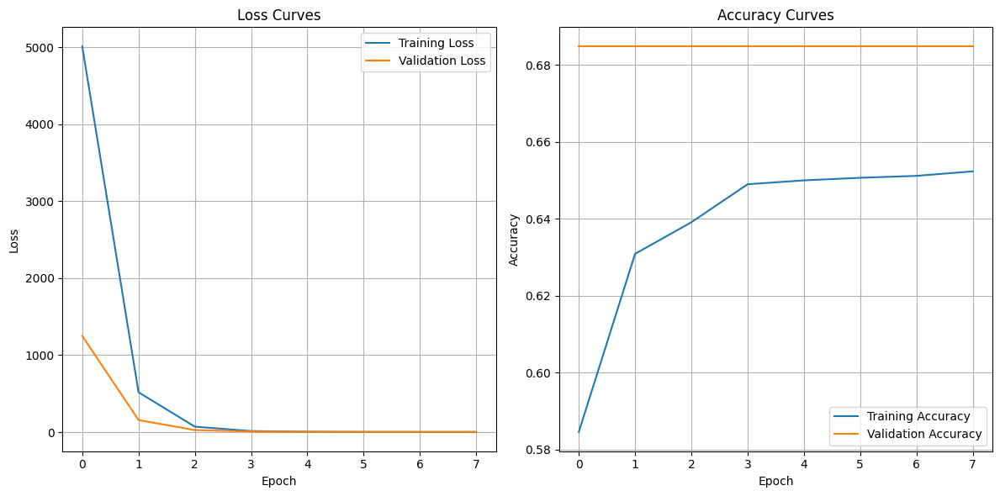

187/187 [==============================] - 41s 220ms/step - loss: 2.5087 - accuracy: 0.6523 - val_loss: 2.7678 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 9/60
187/187 [==============================] - ETA: 0s - loss: 2.4507 - accuracy: 0.6518

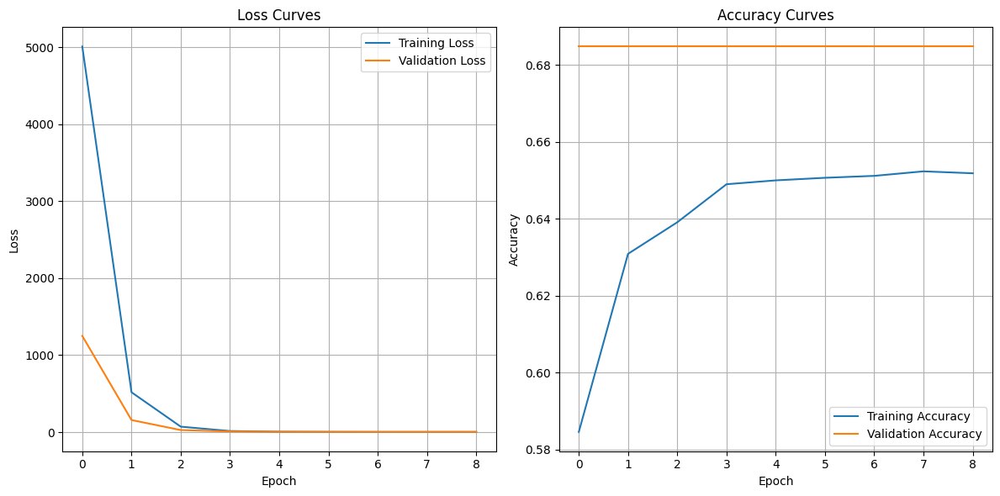

187/187 [==============================] - 41s 220ms/step - loss: 2.4507 - accuracy: 0.6518 - val_loss: 3.1260 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 10/60
187/187 [==============================] - ETA: 0s - loss: 2.2697 - accuracy: 0.6510

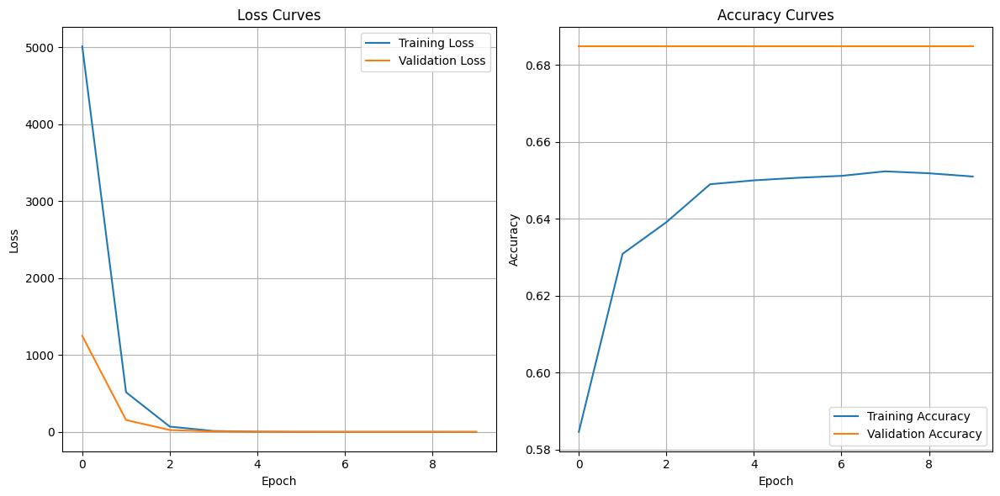

187/187 [==============================] - 41s 222ms/step - loss: 2.2697 - accuracy: 0.6510 - val_loss: 2.0572 - val_accuracy: 0.6848 - lr: 0.0010
Epoch 11/60
187/187 [==============================] - ETA: 0s - loss: 2.0824 - accuracy: 0.6530

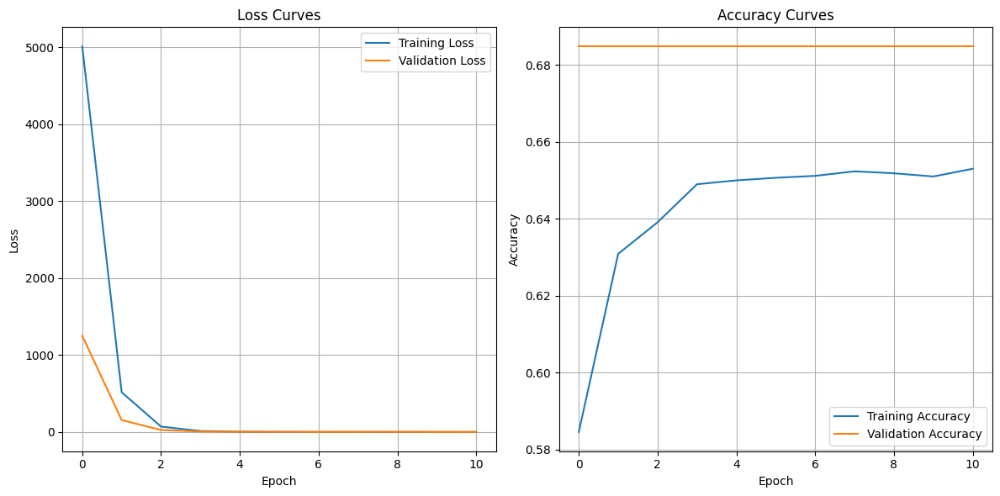

187/187 [==============================] - 41s 220ms/step - loss: 2.0824 - accuracy: 0.6530 - val_loss: 2.1728 - val_accuracy: 0.6848 - lr: 9.0484e-04
Epoch 12/60
187/187 [==============================] - ETA: 0s - loss: 2.0537 - accuracy: 0.6525

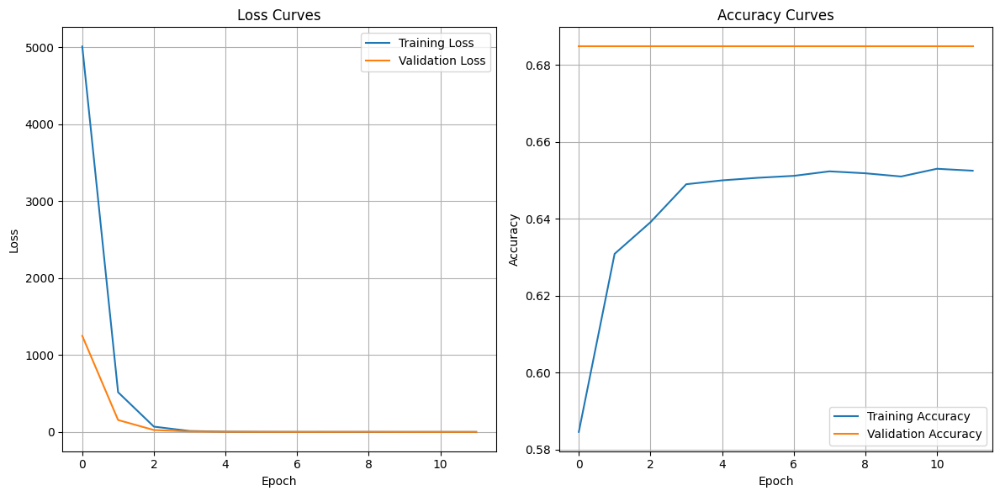

187/187 [==============================] - 41s 222ms/step - loss: 2.0537 - accuracy: 0.6525 - val_loss: 2.0179 - val_accuracy: 0.6848 - lr: 8.1873e-04
Epoch 13/60
187/187 [==============================] - ETA: 0s - loss: 1.8063 - accuracy: 0.6523

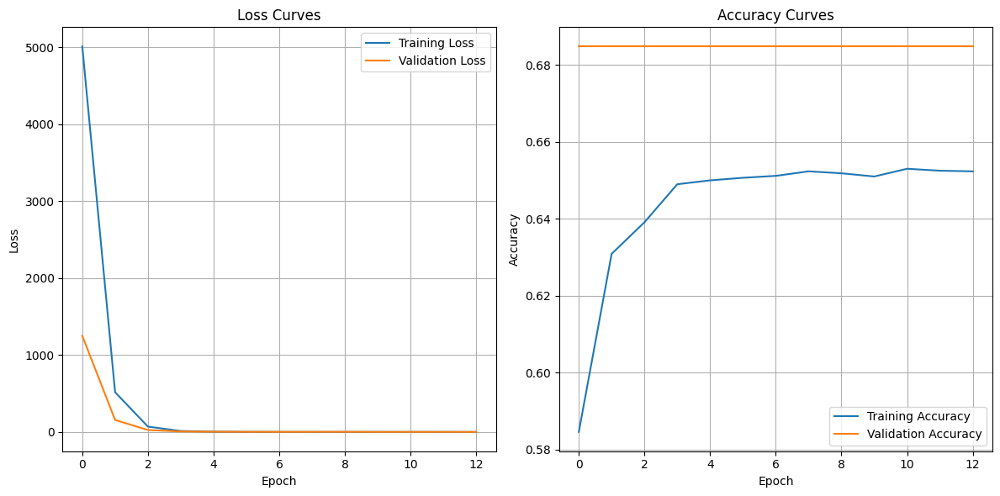

187/187 [==============================] - 41s 222ms/step - loss: 1.8063 - accuracy: 0.6523 - val_loss: 1.8960 - val_accuracy: 0.6848 - lr: 7.4082e-04
Epoch 14/60
187/187 [==============================] - ETA: 0s - loss: 1.8158 - accuracy: 0.6498

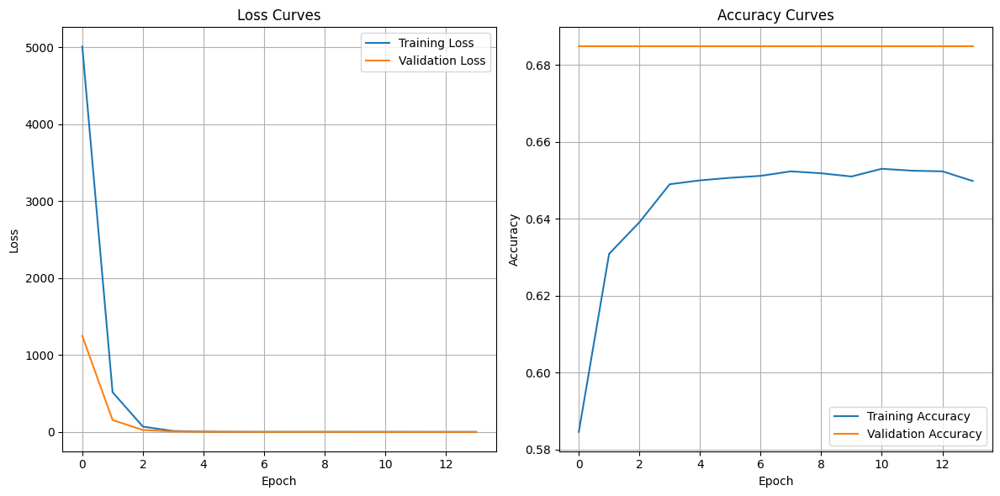

187/187 [==============================] - 41s 220ms/step - loss: 1.8158 - accuracy: 0.6498 - val_loss: 1.9387 - val_accuracy: 0.6848 - lr: 6.7032e-04
Epoch 15/60
187/187 [==============================] - ETA: 0s - loss: 1.7770 - accuracy: 0.6525

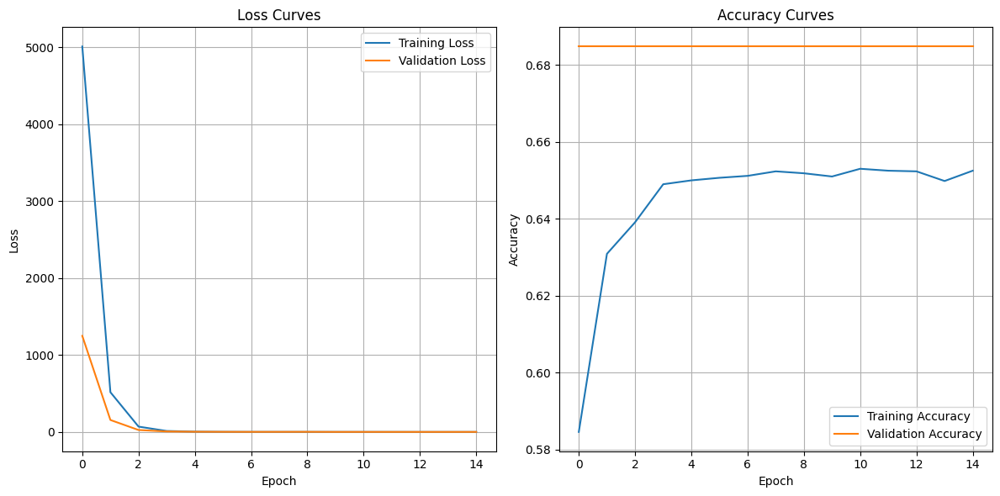

187/187 [==============================] - 41s 220ms/step - loss: 1.7770 - accuracy: 0.6525 - val_loss: 2.0224 - val_accuracy: 0.6848 - lr: 6.0653e-04
Epoch 16/60
187/187 [==============================] - ETA: 0s - loss: 1.6654 - accuracy: 0.6528

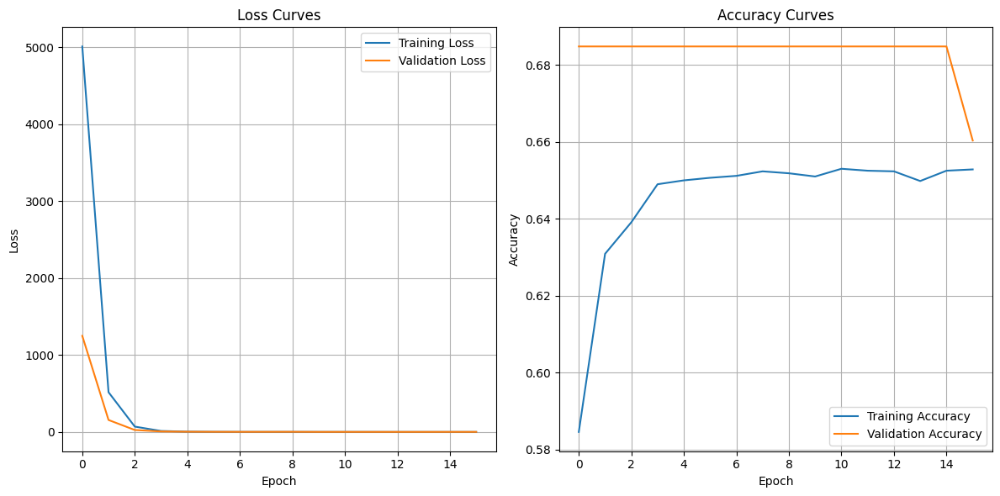

187/187 [==============================] - 41s 220ms/step - loss: 1.6654 - accuracy: 0.6528 - val_loss: 2.0867 - val_accuracy: 0.6603 - lr: 5.4881e-04
Epoch 17/60
187/187 [==============================] - ETA: 0s - loss: 1.6472 - accuracy: 0.6516

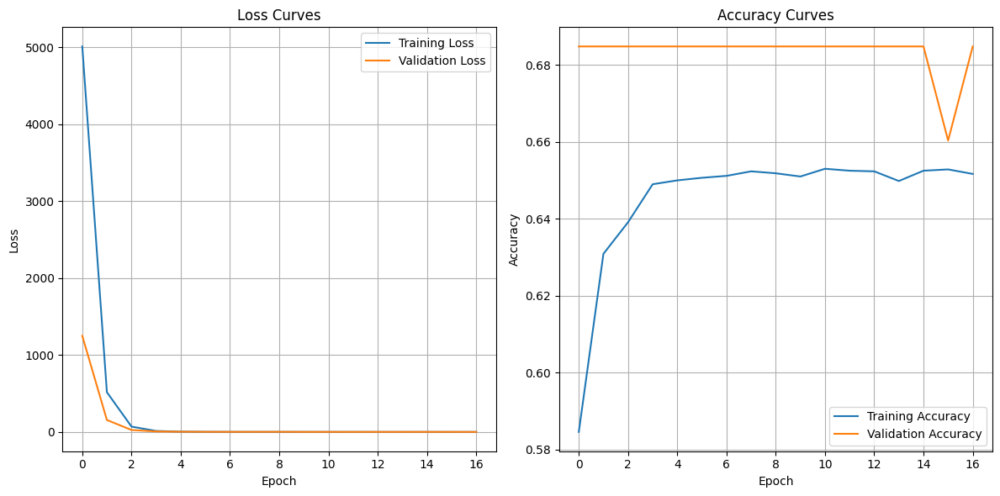

187/187 [==============================] - 41s 222ms/step - loss: 1.6472 - accuracy: 0.6516 - val_loss: 1.6105 - val_accuracy: 0.6848 - lr: 4.9659e-04
Epoch 18/60
187/187 [==============================] - ETA: 0s - loss: 1.5856 - accuracy: 0.6525

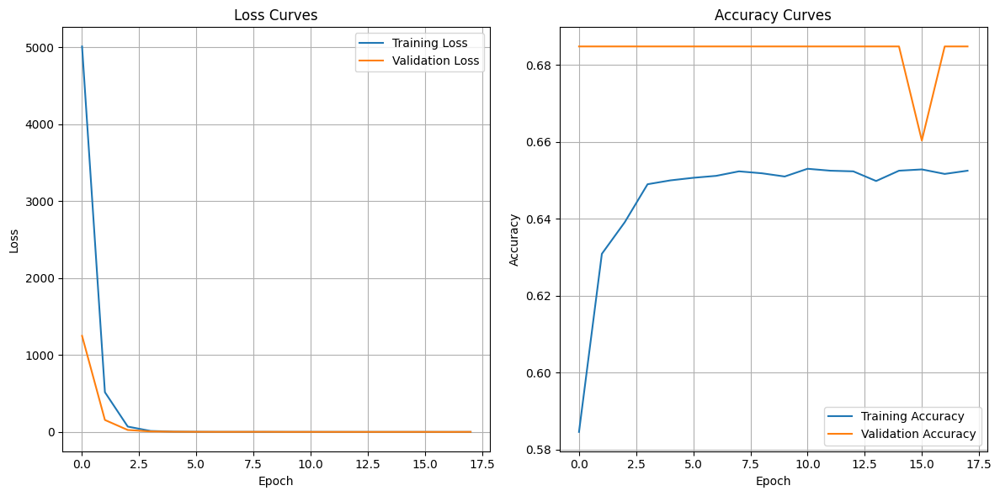

187/187 [==============================] - 41s 220ms/step - loss: 1.5856 - accuracy: 0.6525 - val_loss: 2.3742 - val_accuracy: 0.6848 - lr: 4.4933e-04
Epoch 19/60
187/187 [==============================] - ETA: 0s - loss: 1.5376 - accuracy: 0.6530

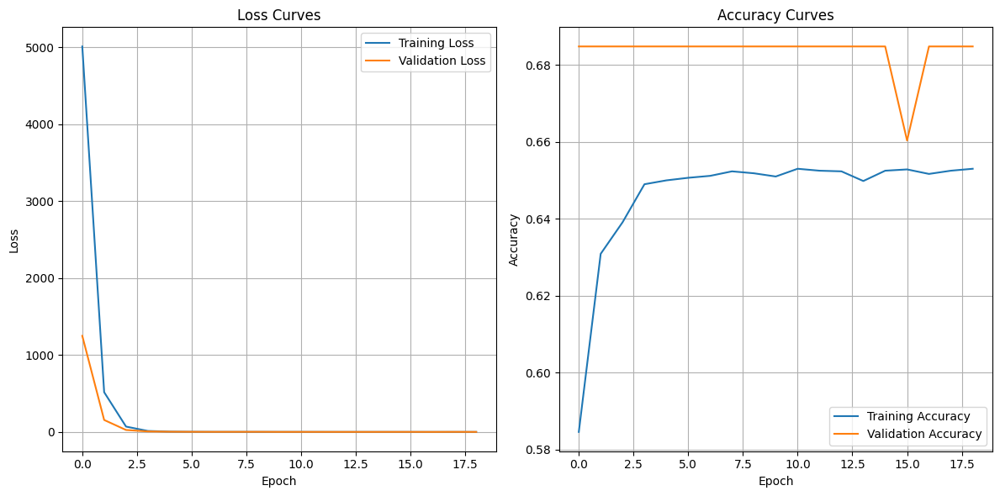

187/187 [==============================] - 41s 220ms/step - loss: 1.5376 - accuracy: 0.6530 - val_loss: 1.7250 - val_accuracy: 0.6848 - lr: 4.0657e-04
Epoch 20/60
187/187 [==============================] - ETA: 0s - loss: 1.4590 - accuracy: 0.6533

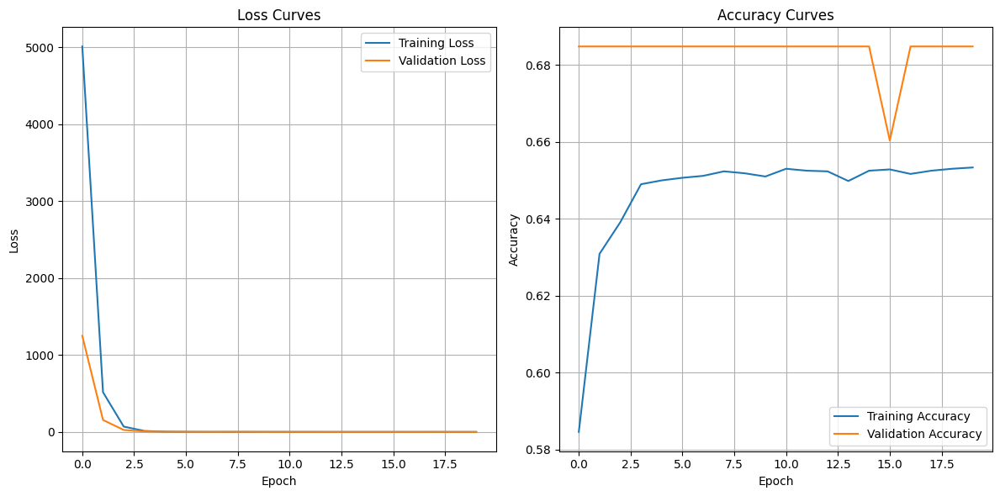

187/187 [==============================] - 41s 220ms/step - loss: 1.4590 - accuracy: 0.6533 - val_loss: 1.6543 - val_accuracy: 0.6848 - lr: 3.6788e-04
Epoch 21/60
187/187 [==============================] - ETA: 0s - loss: 1.4412 - accuracy: 0.6533

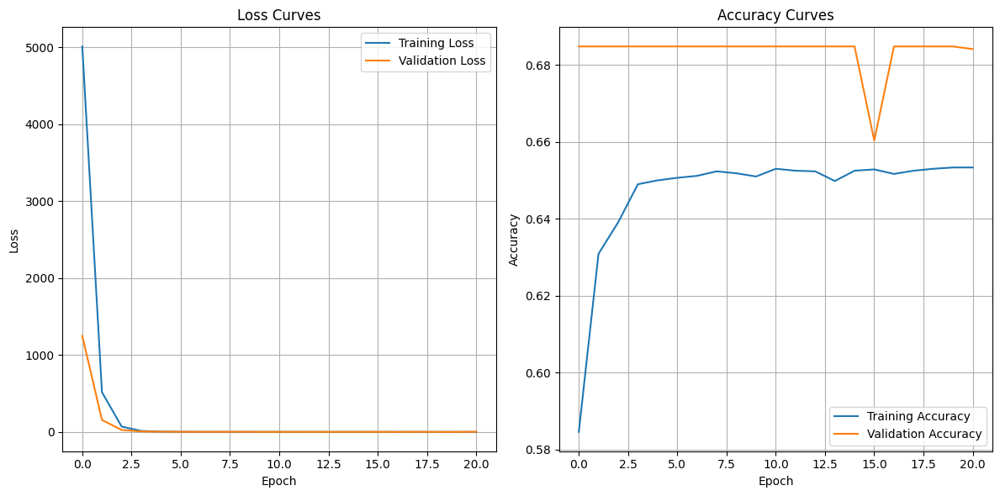

187/187 [==============================] - 41s 220ms/step - loss: 1.4412 - accuracy: 0.6533 - val_loss: 3.0651 - val_accuracy: 0.6841 - lr: 3.3287e-04
Epoch 22/60
187/187 [==============================] - ETA: 0s - loss: 1.4277 - accuracy: 0.6530

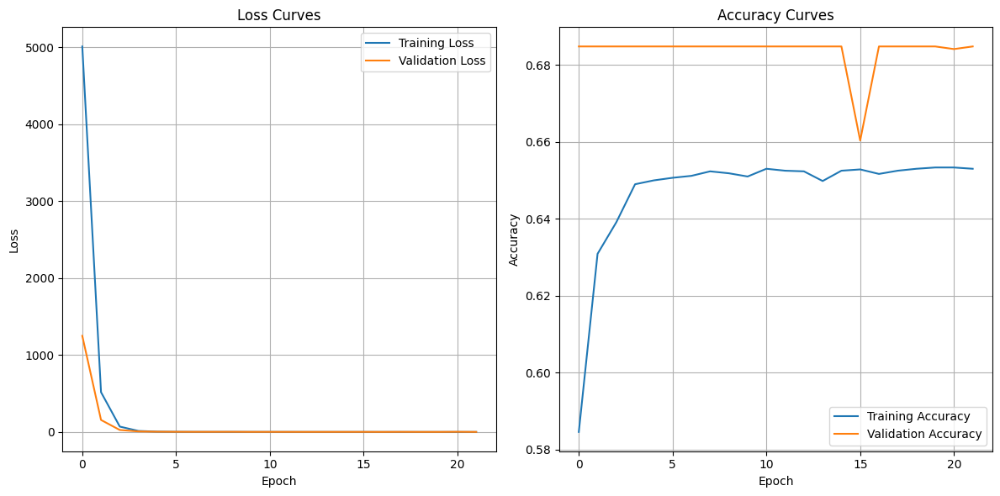

187/187 [==============================] - 41s 222ms/step - loss: 1.4277 - accuracy: 0.6530 - val_loss: 1.5068 - val_accuracy: 0.6848 - lr: 3.0119e-04
Epoch 23/60
187/187 [==============================] - ETA: 0s - loss: 1.4052 - accuracy: 0.6548

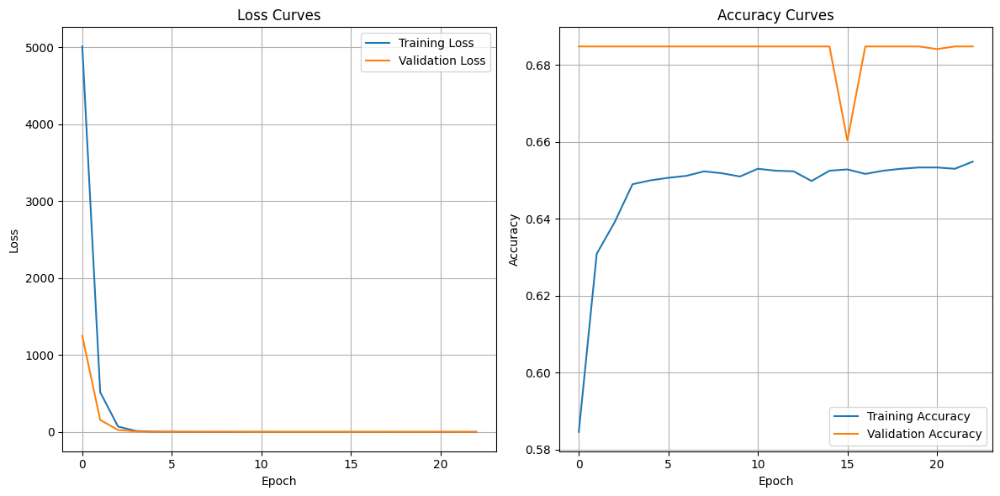

187/187 [==============================] - 41s 220ms/step - loss: 1.4052 - accuracy: 0.6548 - val_loss: 1.5725 - val_accuracy: 0.6848 - lr: 2.7253e-04
Epoch 24/60
187/187 [==============================] - ETA: 0s - loss: 1.3958 - accuracy: 0.6548

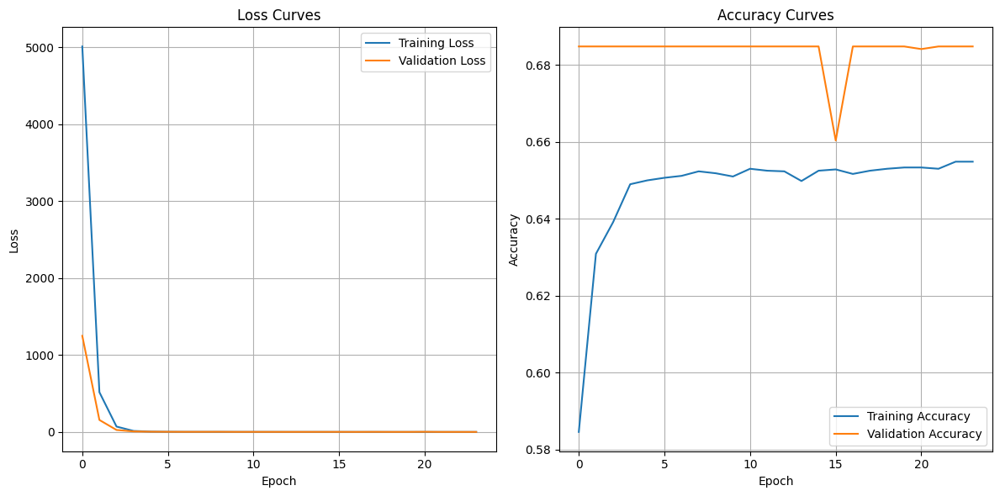

187/187 [==============================] - 41s 221ms/step - loss: 1.3958 - accuracy: 0.6548 - val_loss: 1.3510 - val_accuracy: 0.6848 - lr: 2.4660e-04
Epoch 25/60
187/187 [==============================] - ETA: 0s - loss: 1.3265 - accuracy: 0.6582

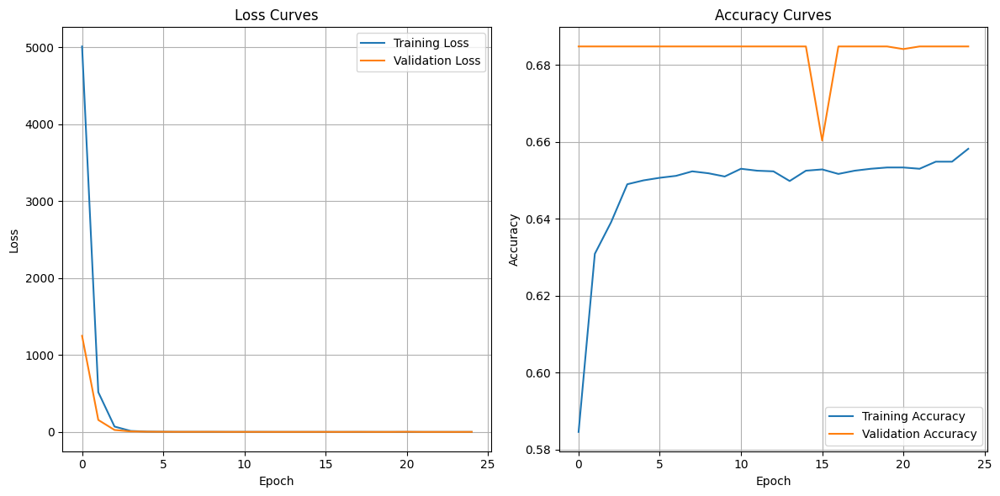

187/187 [==============================] - 41s 220ms/step - loss: 1.3265 - accuracy: 0.6582 - val_loss: 1.8848 - val_accuracy: 0.6848 - lr: 2.2313e-04
Epoch 26/60
187/187 [==============================] - ETA: 0s - loss: 1.2773 - accuracy: 0.6515

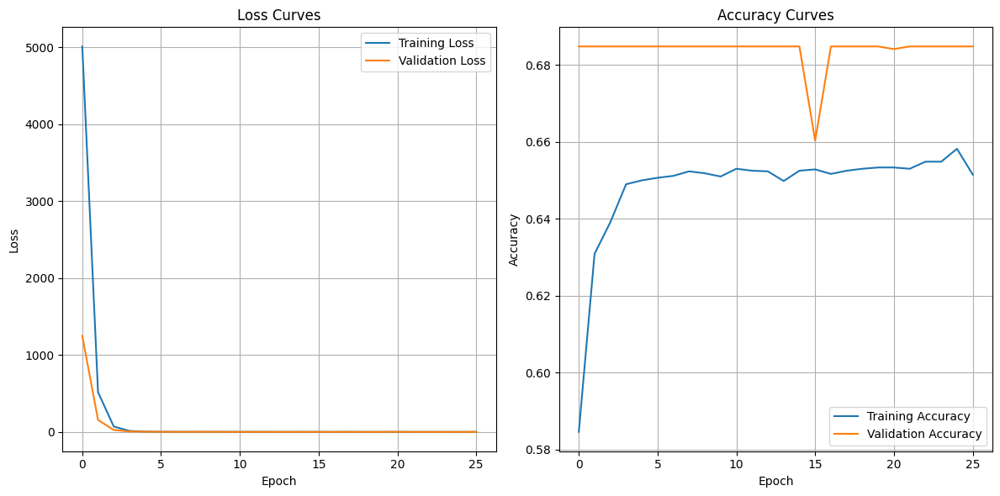

187/187 [==============================] - 41s 221ms/step - loss: 1.2773 - accuracy: 0.6515 - val_loss: 1.2389 - val_accuracy: 0.6848 - lr: 2.0190e-04
Epoch 27/60
187/187 [==============================] - ETA: 0s - loss: 1.2687 - accuracy: 0.6545

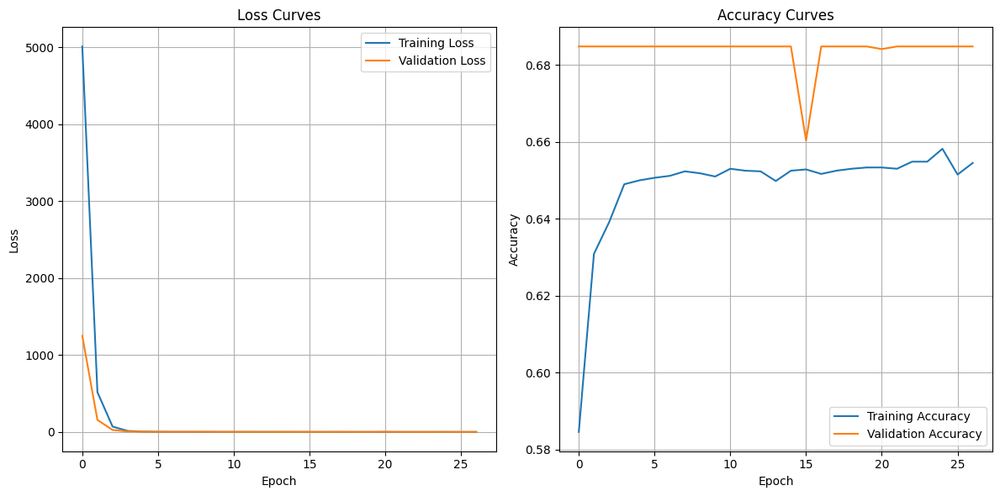

187/187 [==============================] - 41s 220ms/step - loss: 1.2687 - accuracy: 0.6545 - val_loss: 1.4420 - val_accuracy: 0.6848 - lr: 1.8268e-04
Epoch 28/60
187/187 [==============================] - ETA: 0s - loss: 1.2595 - accuracy: 0.6558

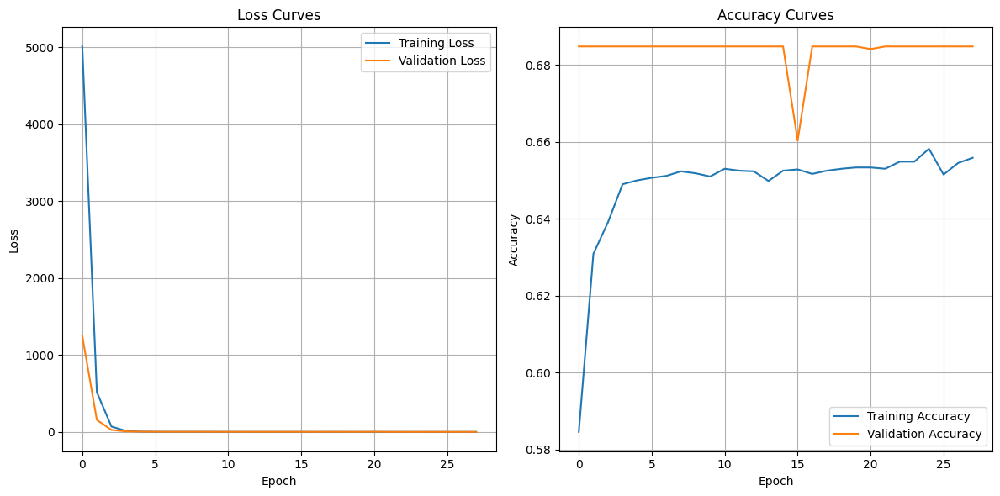

187/187 [==============================] - 42s 222ms/step - loss: 1.2595 - accuracy: 0.6558 - val_loss: 1.2181 - val_accuracy: 0.6848 - lr: 1.6530e-04
Epoch 29/60
187/187 [==============================] - ETA: 0s - loss: 1.2112 - accuracy: 0.6600

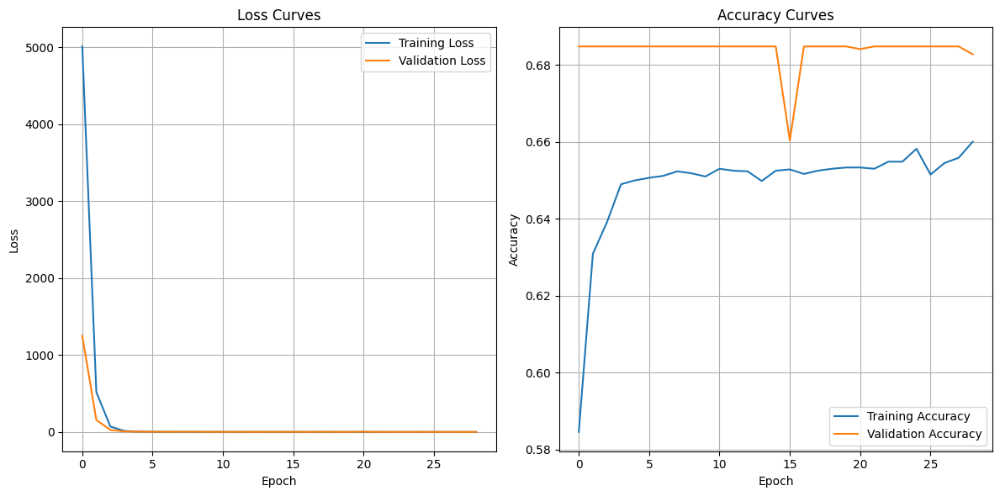

187/187 [==============================] - 41s 222ms/step - loss: 1.2112 - accuracy: 0.6600 - val_loss: 1.1711 - val_accuracy: 0.6827 - lr: 1.4957e-04
Epoch 30/60
187/187 [==============================] - ETA: 0s - loss: 1.1914 - accuracy: 0.6575

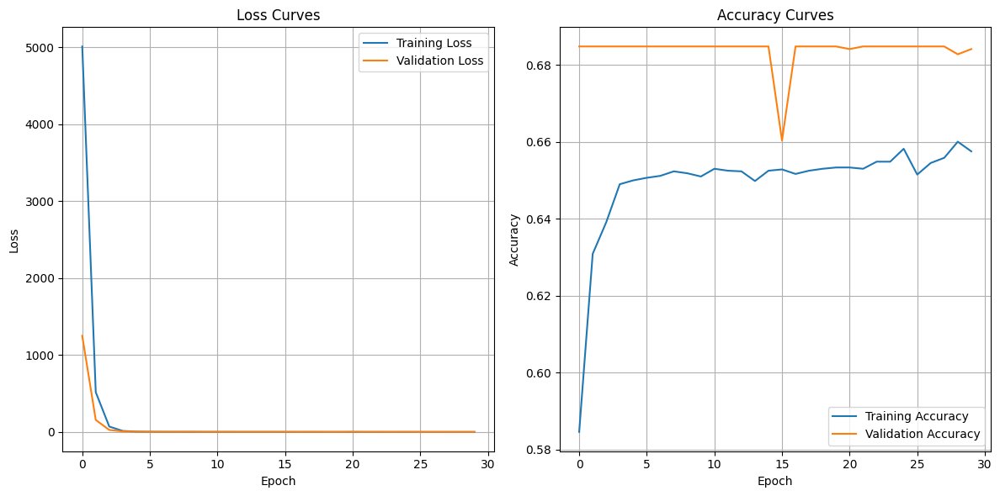

187/187 [==============================] - 41s 221ms/step - loss: 1.1914 - accuracy: 0.6575 - val_loss: 1.1258 - val_accuracy: 0.6841 - lr: 1.3534e-04
Epoch 31/60
187/187 [==============================] - ETA: 0s - loss: 1.1839 - accuracy: 0.6578

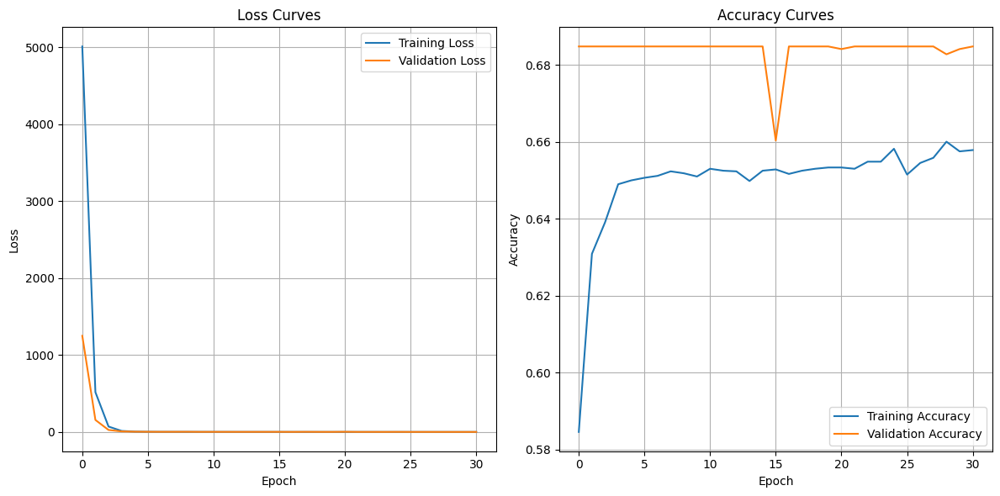

187/187 [==============================] - 41s 220ms/step - loss: 1.1839 - accuracy: 0.6578 - val_loss: 1.1668 - val_accuracy: 0.6848 - lr: 1.2246e-04
Epoch 32/60
187/187 [==============================] - ETA: 0s - loss: 1.1706 - accuracy: 0.6610

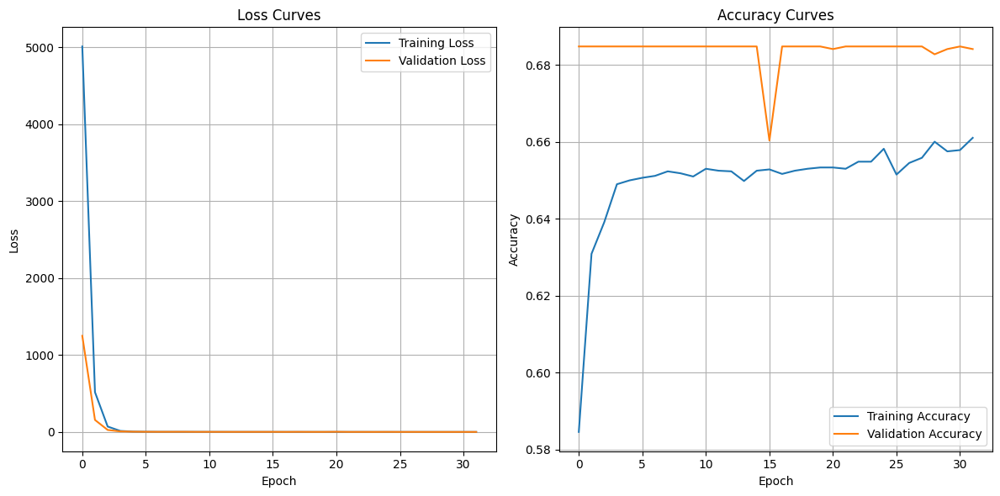

187/187 [==============================] - 41s 222ms/step - loss: 1.1706 - accuracy: 0.6610 - val_loss: 1.1216 - val_accuracy: 0.6841 - lr: 1.1080e-04
Epoch 33/60
187/187 [==============================] - ETA: 0s - loss: 1.1325 - accuracy: 0.6583

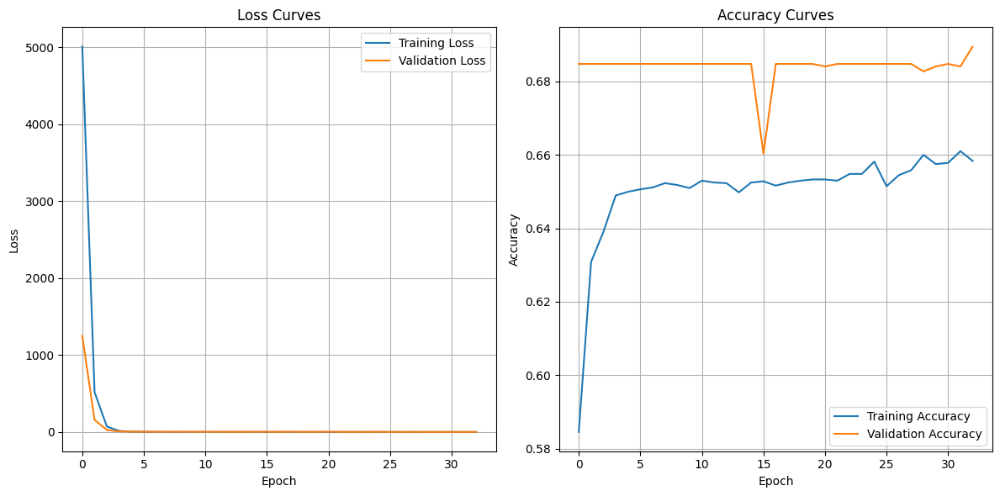

187/187 [==============================] - 41s 220ms/step - loss: 1.1325 - accuracy: 0.6583 - val_loss: 1.1933 - val_accuracy: 0.6895 - lr: 1.0026e-04
Epoch 34/60
187/187 [==============================] - ETA: 0s - loss: 1.1294 - accuracy: 0.6597

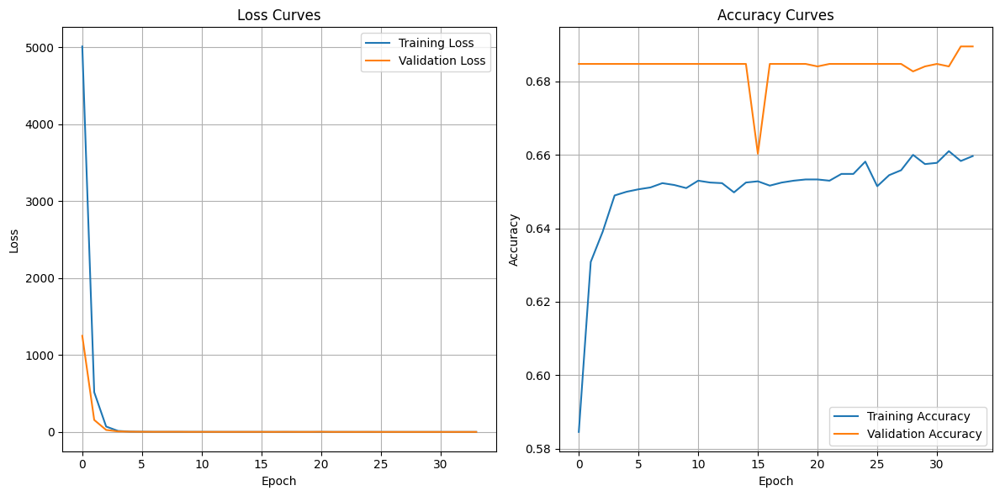

187/187 [==============================] - 41s 220ms/step - loss: 1.1294 - accuracy: 0.6597 - val_loss: 1.2333 - val_accuracy: 0.6895 - lr: 9.0718e-05
Epoch 35/60
187/187 [==============================] - ETA: 0s - loss: 1.1034 - accuracy: 0.6686

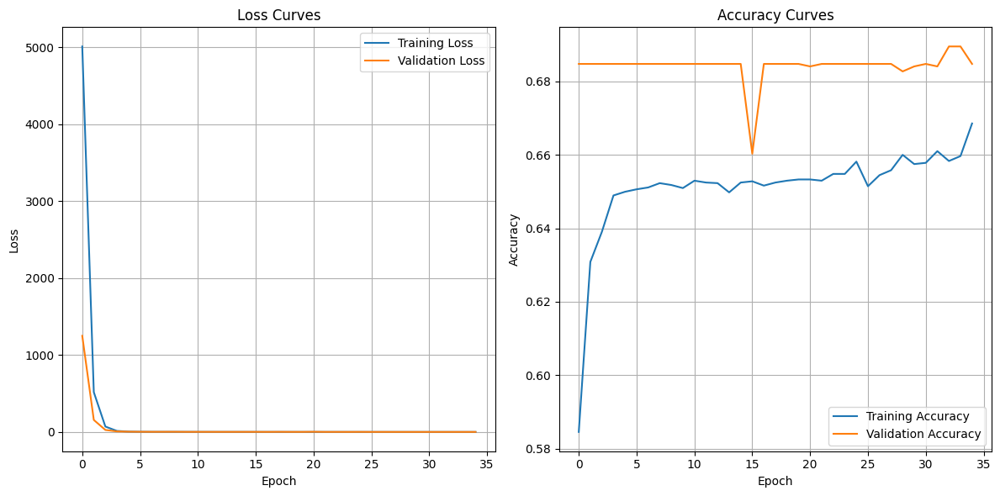

187/187 [==============================] - 41s 222ms/step - loss: 1.1034 - accuracy: 0.6686 - val_loss: 1.1042 - val_accuracy: 0.6848 - lr: 8.2085e-05
Epoch 36/60
187/187 [==============================] - ETA: 0s - loss: 1.0830 - accuracy: 0.6640

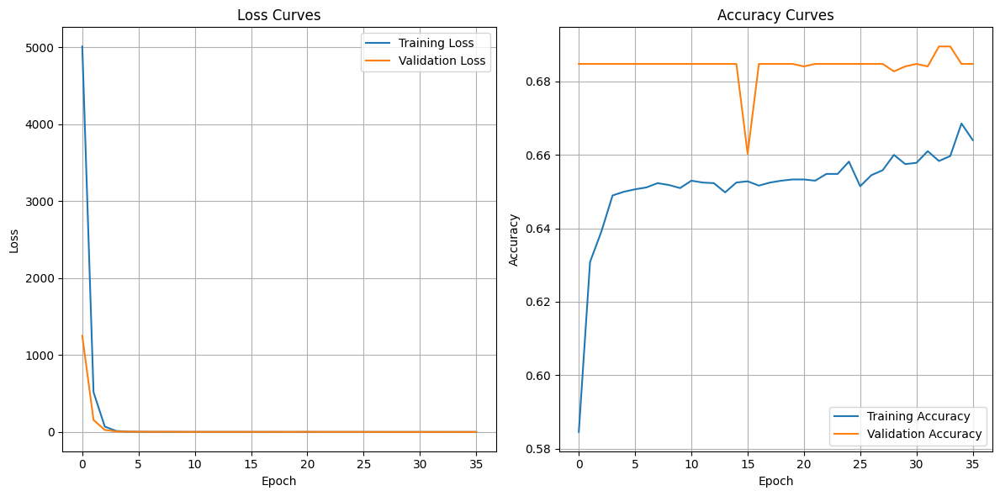

187/187 [==============================] - 41s 220ms/step - loss: 1.0830 - accuracy: 0.6640 - val_loss: 1.1363 - val_accuracy: 0.6848 - lr: 7.4273e-05
Epoch 37/60
187/187 [==============================] - ETA: 0s - loss: 1.0807 - accuracy: 0.6625

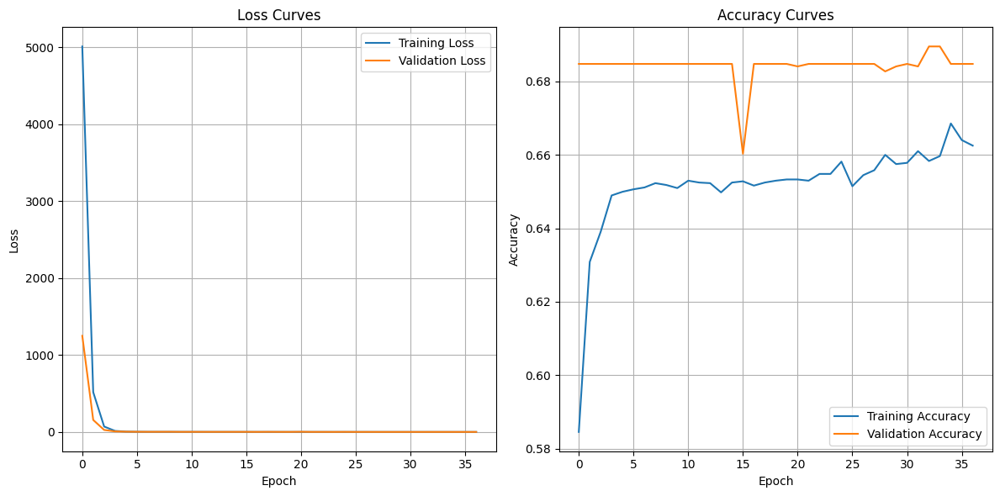

187/187 [==============================] - 41s 221ms/step - loss: 1.0807 - accuracy: 0.6625 - val_loss: 1.1025 - val_accuracy: 0.6848 - lr: 6.7205e-05
Epoch 38/60
187/187 [==============================] - ETA: 0s - loss: 1.0736 - accuracy: 0.6634

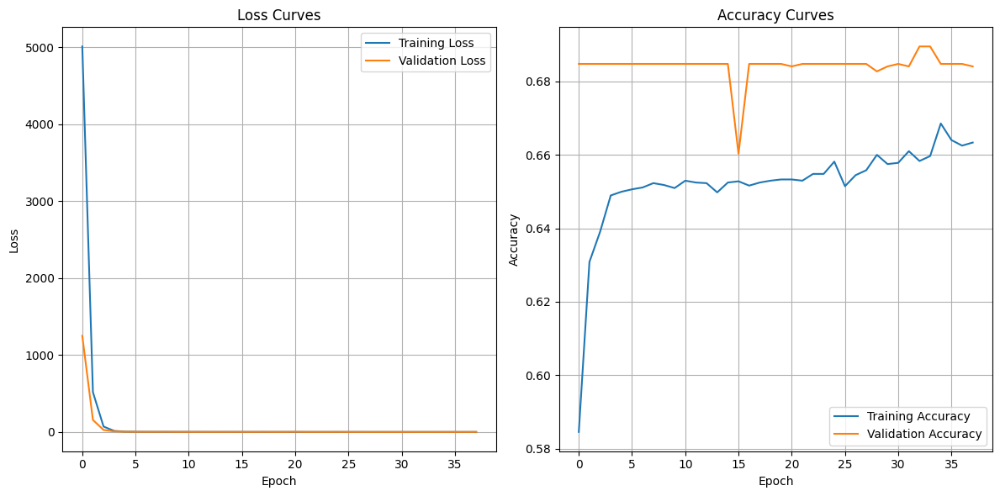

187/187 [==============================] - 41s 220ms/step - loss: 1.0736 - accuracy: 0.6634 - val_loss: 1.5216 - val_accuracy: 0.6841 - lr: 6.0810e-05
Epoch 39/60
187/187 [==============================] - ETA: 0s - loss: 1.0679 - accuracy: 0.6635

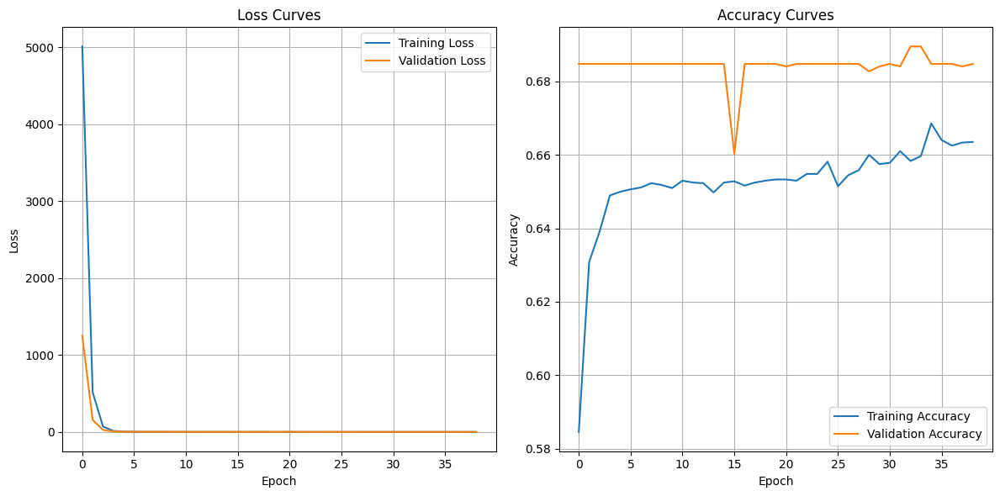

187/187 [==============================] - 41s 221ms/step - loss: 1.0679 - accuracy: 0.6635 - val_loss: 1.0918 - val_accuracy: 0.6848 - lr: 5.5023e-05
Epoch 40/60
187/187 [==============================] - ETA: 0s - loss: 1.0535 - accuracy: 0.6661

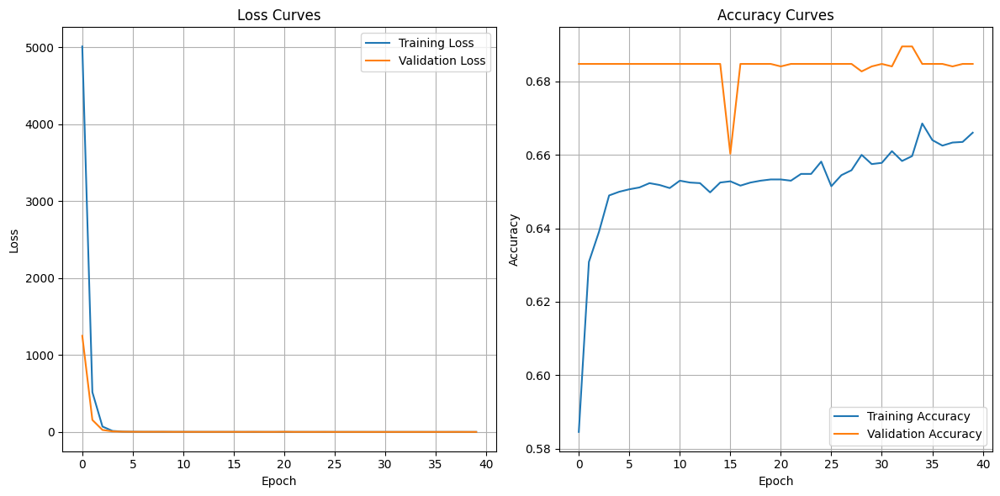

187/187 [==============================] - 41s 222ms/step - loss: 1.0535 - accuracy: 0.6661 - val_loss: 1.0672 - val_accuracy: 0.6848 - lr: 4.9787e-05
Epoch 41/60
187/187 [==============================] - ETA: 0s - loss: 1.0472 - accuracy: 0.6645

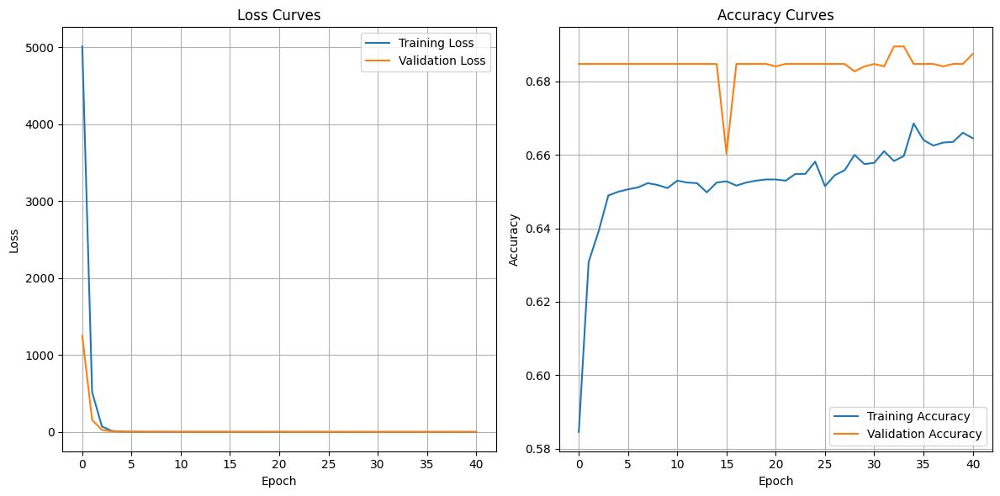

187/187 [==============================] - 41s 220ms/step - loss: 1.0472 - accuracy: 0.6645 - val_loss: 1.1604 - val_accuracy: 0.6875 - lr: 4.5049e-05
Epoch 42/60
187/187 [==============================] - ETA: 0s - loss: 1.0332 - accuracy: 0.6679

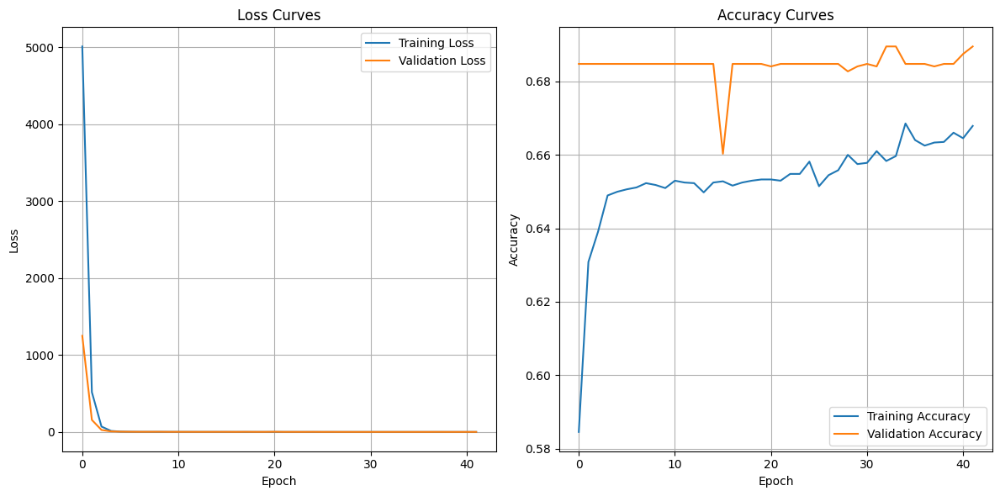

187/187 [==============================] - 41s 220ms/step - loss: 1.0332 - accuracy: 0.6679 - val_loss: 1.0991 - val_accuracy: 0.6895 - lr: 4.0762e-05
Epoch 43/60
187/187 [==============================] - ETA: 0s - loss: 1.0340 - accuracy: 0.6661

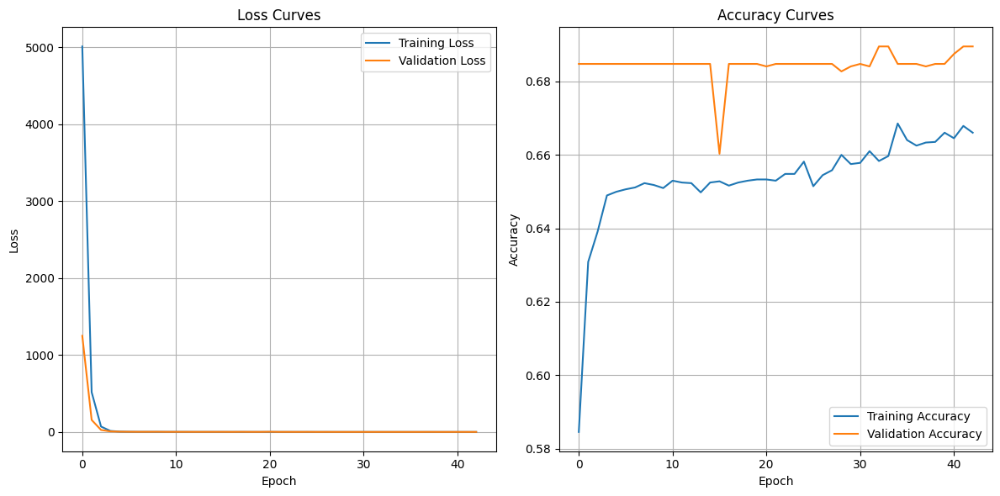

187/187 [==============================] - 41s 220ms/step - loss: 1.0340 - accuracy: 0.6661 - val_loss: 1.1001 - val_accuracy: 0.6895 - lr: 3.6883e-05
Epoch 44/60
187/187 [==============================] - ETA: 0s - loss: 1.0140 - accuracy: 0.6686

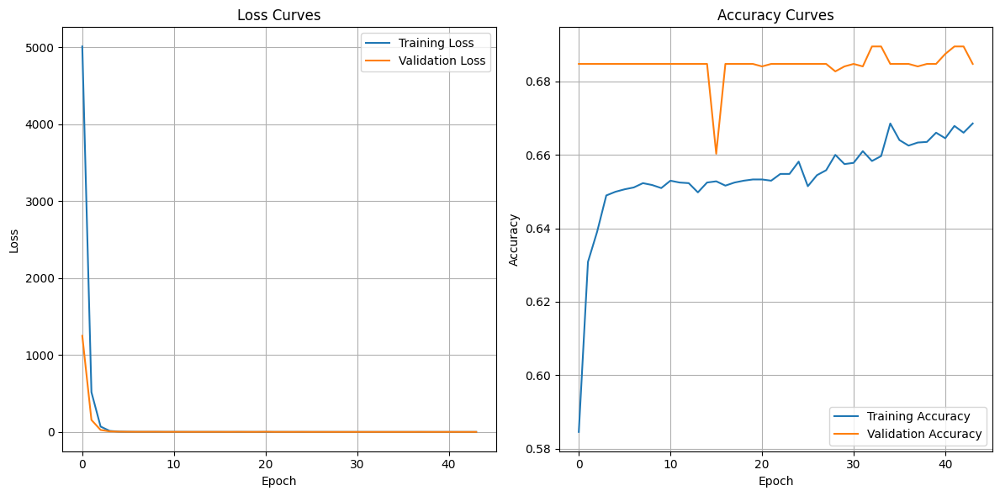

187/187 [==============================] - 42s 226ms/step - loss: 1.0140 - accuracy: 0.6686 - val_loss: 1.0169 - val_accuracy: 0.6848 - lr: 3.3373e-05
Epoch 45/60
187/187 [==============================] - ETA: 0s - loss: 1.0082 - accuracy: 0.6681

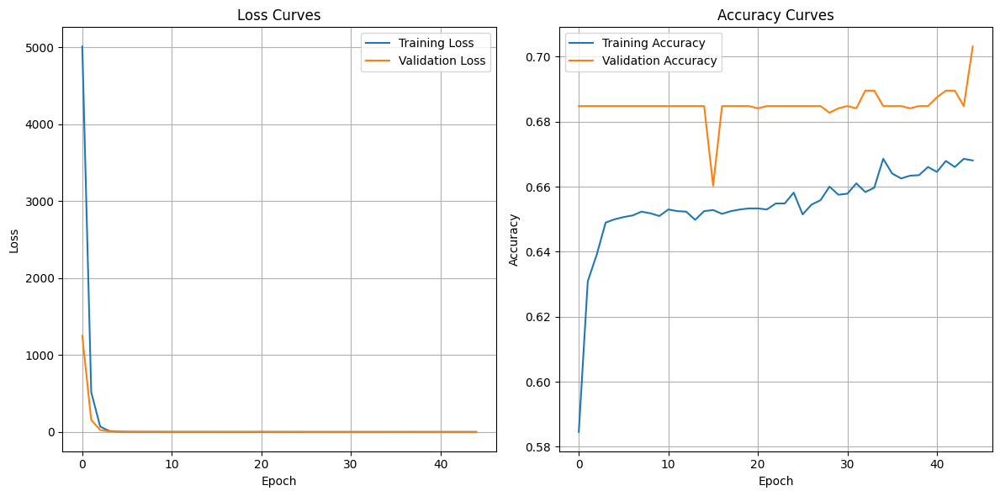

187/187 [==============================] - 41s 220ms/step - loss: 1.0082 - accuracy: 0.6681 - val_loss: 1.0504 - val_accuracy: 0.7031 - lr: 3.0197e-05
Epoch 46/60
187/187 [==============================] - ETA: 0s - loss: 0.9988 - accuracy: 0.6706

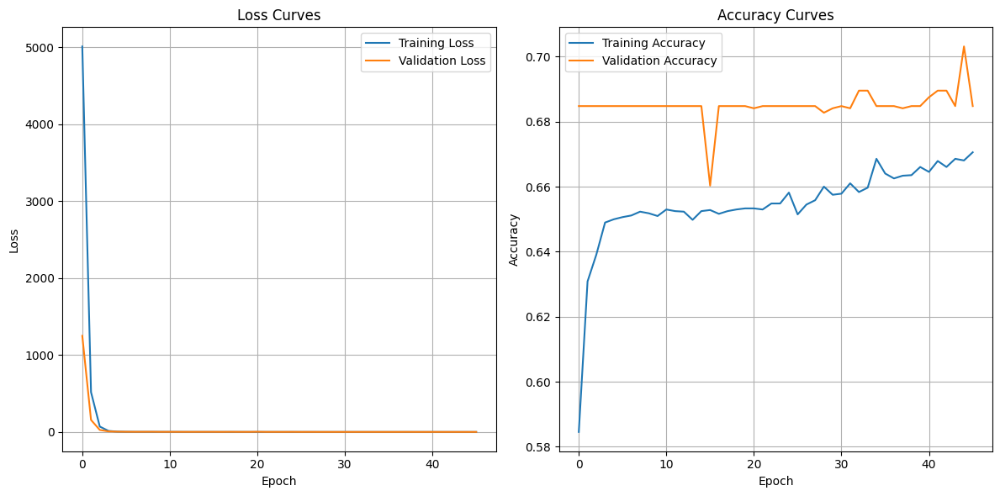

187/187 [==============================] - 41s 222ms/step - loss: 0.9988 - accuracy: 0.6706 - val_loss: 0.9908 - val_accuracy: 0.6848 - lr: 2.7324e-05
Epoch 47/60
187/187 [==============================] - ETA: 0s - loss: 0.9884 - accuracy: 0.6694

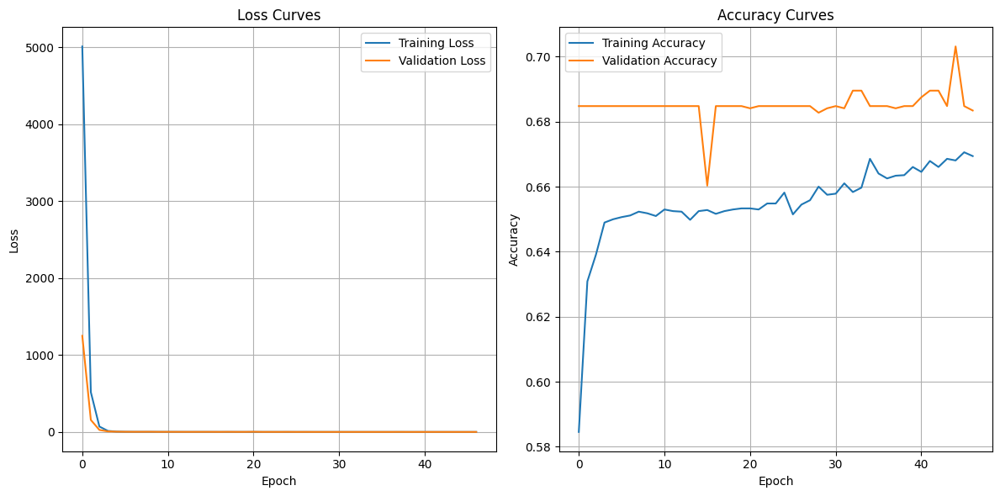

187/187 [==============================] - 41s 220ms/step - loss: 0.9884 - accuracy: 0.6694 - val_loss: 1.0165 - val_accuracy: 0.6834 - lr: 2.4723e-05
Epoch 48/60
187/187 [==============================] - ETA: 0s - loss: 0.9765 - accuracy: 0.6743

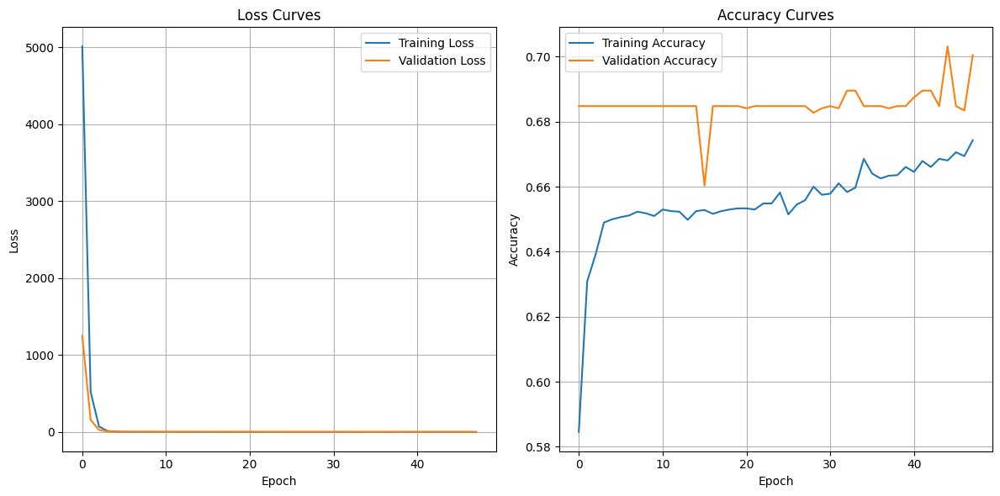

187/187 [==============================] - 41s 220ms/step - loss: 0.9765 - accuracy: 0.6743 - val_loss: 1.0040 - val_accuracy: 0.7004 - lr: 2.2371e-05
Epoch 49/60
187/187 [==============================] - ETA: 0s - loss: 0.9680 - accuracy: 0.6734

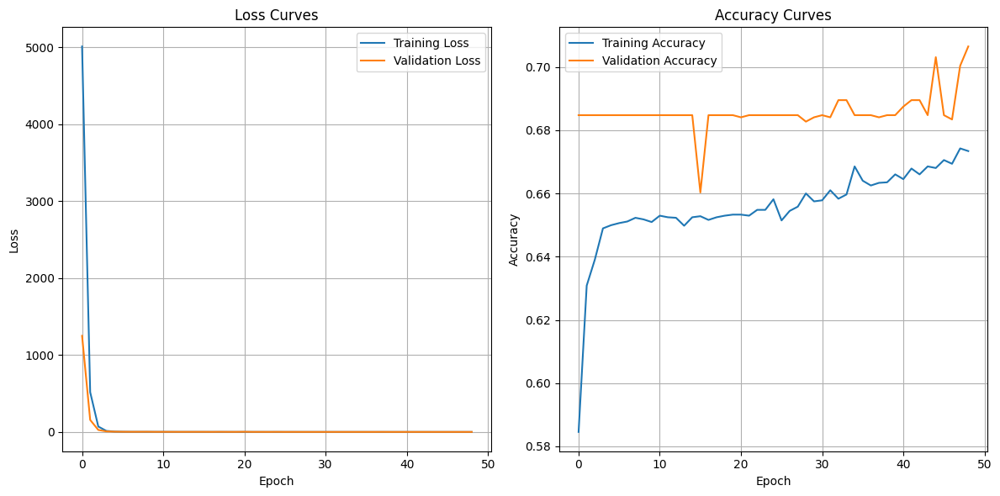

187/187 [==============================] - 41s 222ms/step - loss: 0.9680 - accuracy: 0.6734 - val_loss: 0.9515 - val_accuracy: 0.7065 - lr: 2.0242e-05
Epoch 50/60
187/187 [==============================] - ETA: 0s - loss: 0.9645 - accuracy: 0.6746

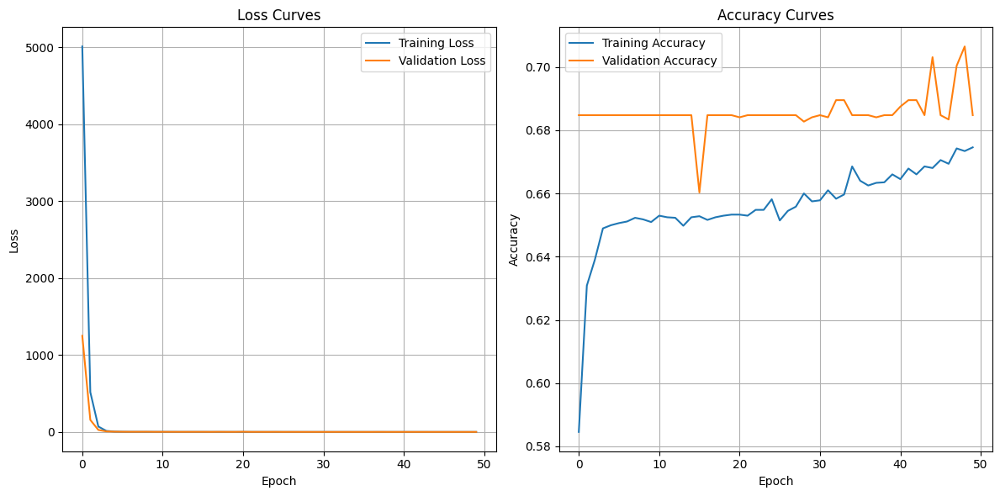

187/187 [==============================] - 41s 220ms/step - loss: 0.9645 - accuracy: 0.6746 - val_loss: 1.0063 - val_accuracy: 0.6848 - lr: 1.8316e-05
Epoch 51/60
187/187 [==============================] - ETA: 0s - loss: 0.9602 - accuracy: 0.6759

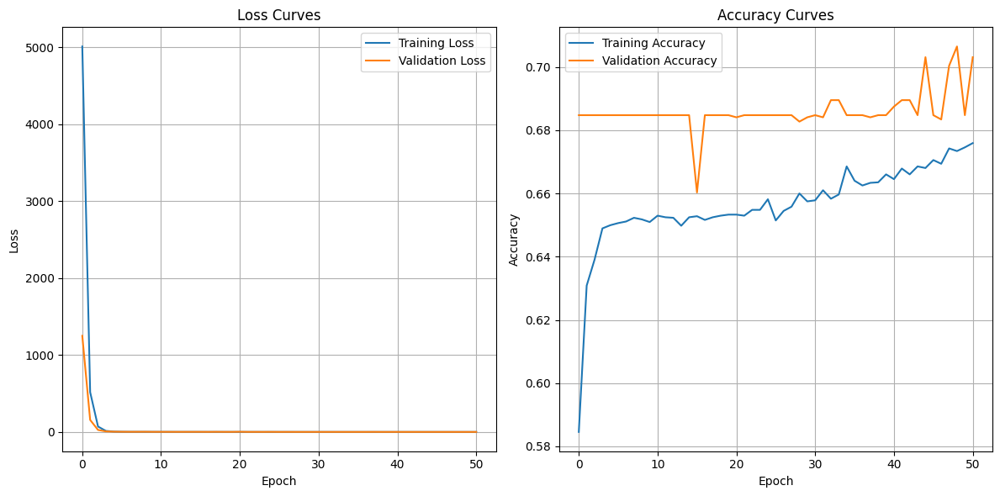

187/187 [==============================] - 41s 222ms/step - loss: 0.9602 - accuracy: 0.6759 - val_loss: 0.9450 - val_accuracy: 0.7031 - lr: 1.6573e-05
Epoch 52/60
187/187 [==============================] - ETA: 0s - loss: 0.9495 - accuracy: 0.6736

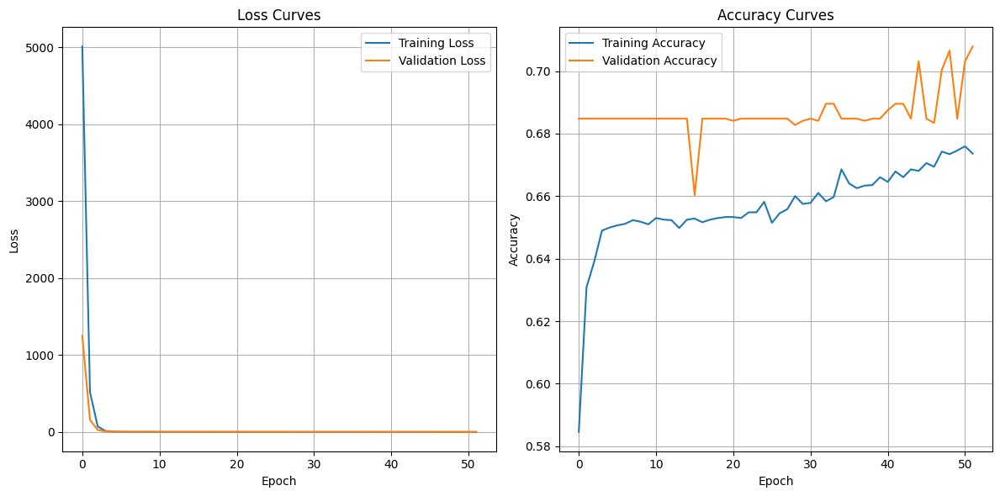

187/187 [==============================] - 41s 222ms/step - loss: 0.9495 - accuracy: 0.6736 - val_loss: 0.9316 - val_accuracy: 0.7079 - lr: 1.4996e-05
Epoch 53/60
187/187 [==============================] - ETA: 0s - loss: 0.9424 - accuracy: 0.6751

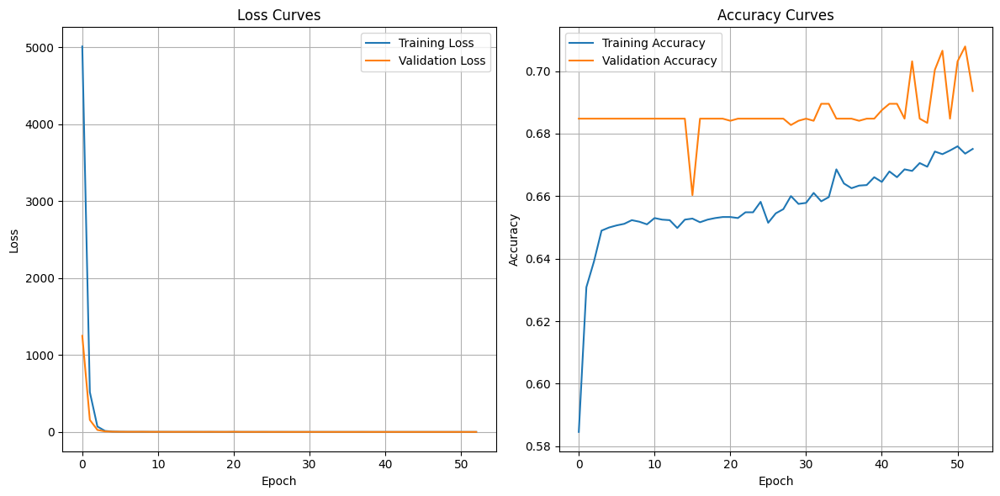

187/187 [==============================] - 41s 220ms/step - loss: 0.9424 - accuracy: 0.6751 - val_loss: 0.9320 - val_accuracy: 0.6936 - lr: 1.3569e-05
Epoch 54/60
187/187 [==============================] - ETA: 0s - loss: 0.9331 - accuracy: 0.6766

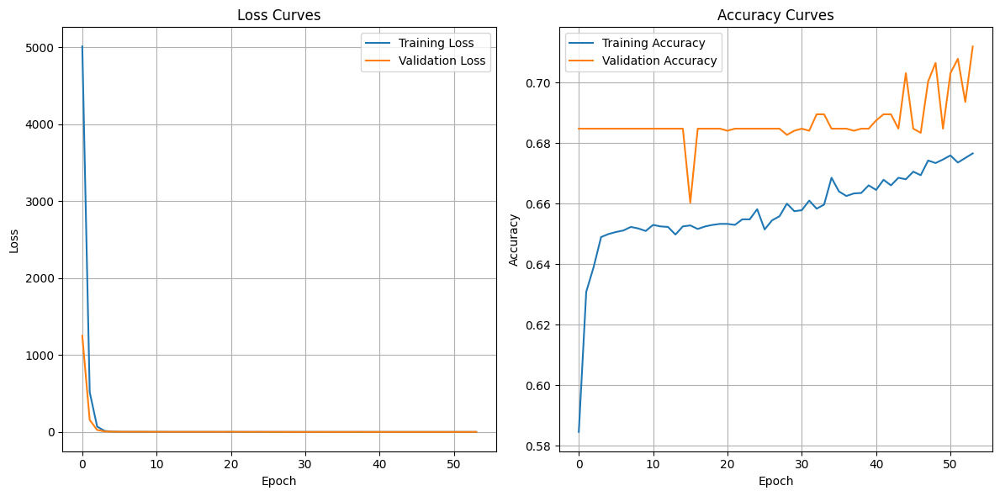

187/187 [==============================] - 41s 222ms/step - loss: 0.9331 - accuracy: 0.6766 - val_loss: 0.9188 - val_accuracy: 0.7120 - lr: 1.2277e-05
Epoch 55/60
187/187 [==============================] - ETA: 0s - loss: 0.9383 - accuracy: 0.6759

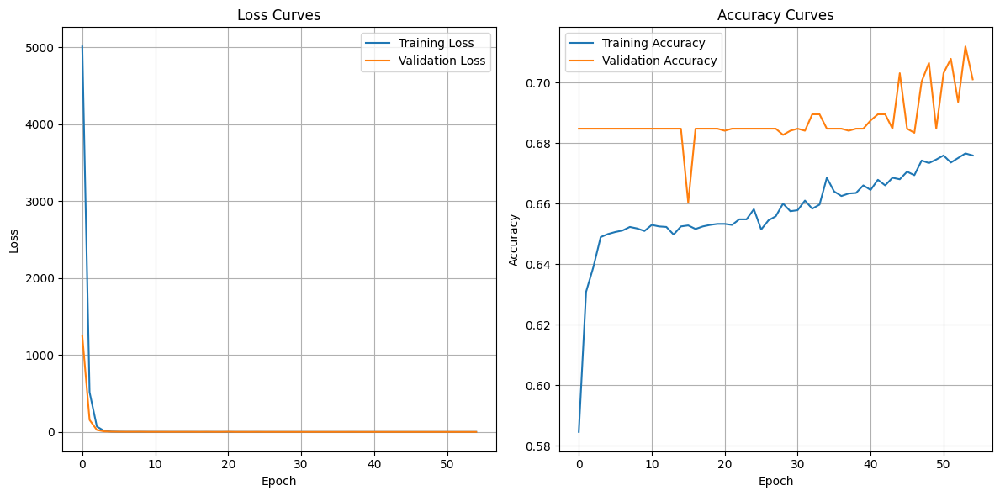

187/187 [==============================] - 41s 220ms/step - loss: 0.9383 - accuracy: 0.6759 - val_loss: 0.9316 - val_accuracy: 0.7011 - lr: 1.1109e-05
Epoch 56/60
187/187 [==============================] - ETA: 0s - loss: 0.9241 - accuracy: 0.6796

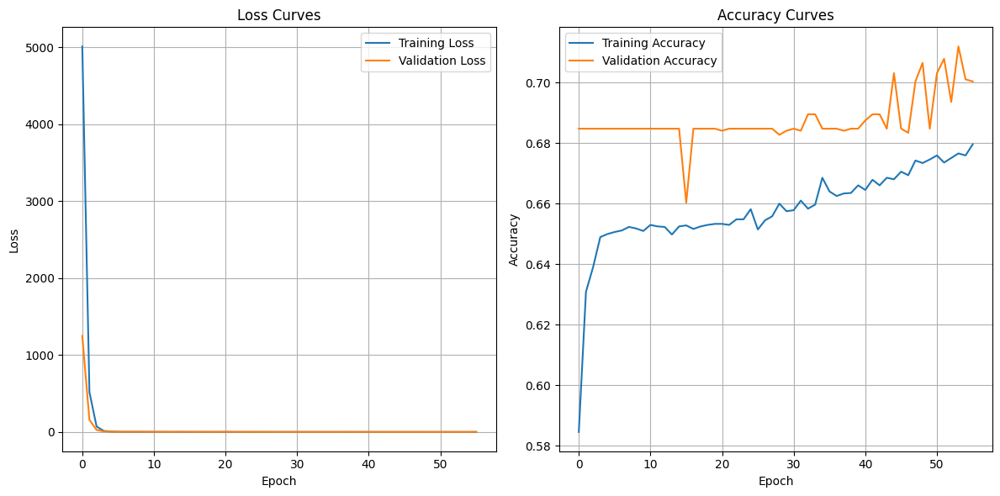

187/187 [==============================] - 41s 220ms/step - loss: 0.9241 - accuracy: 0.6796 - val_loss: 0.9323 - val_accuracy: 0.7004 - lr: 1.0052e-05
Epoch 57/60
187/187 [==============================] - ETA: 0s - loss: 0.9248 - accuracy: 0.6738

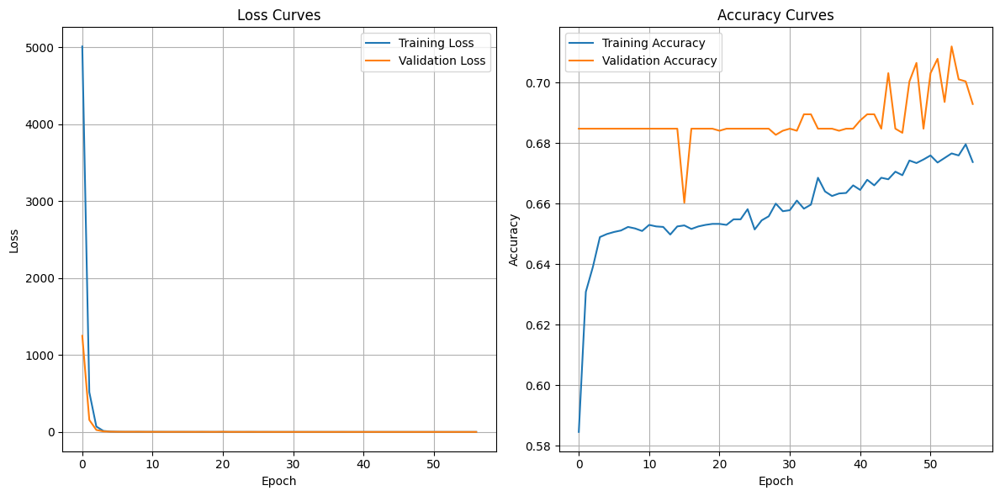

187/187 [==============================] - 41s 220ms/step - loss: 0.9248 - accuracy: 0.6738 - val_loss: 0.9507 - val_accuracy: 0.6929 - lr: 9.0953e-06
Epoch 58/60
187/187 [==============================] - ETA: 0s - loss: 0.9185 - accuracy: 0.6781

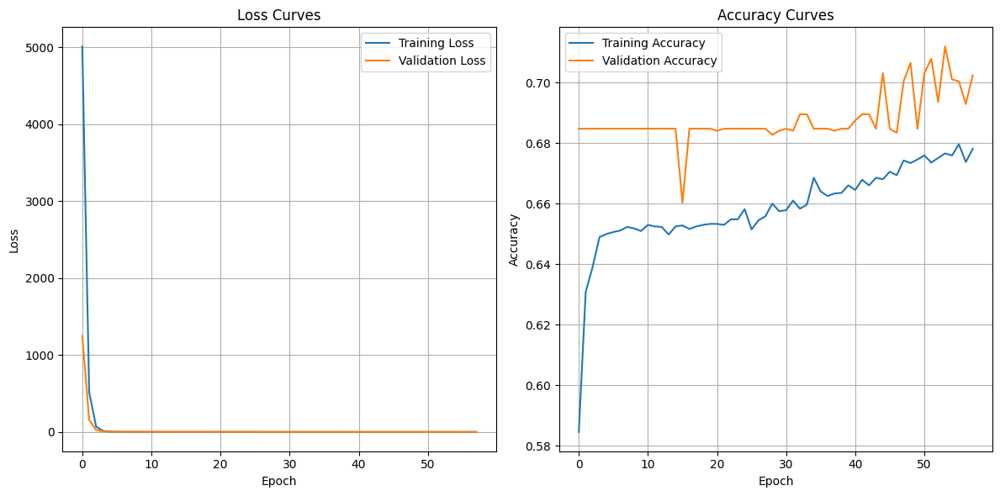

187/187 [==============================] - 41s 220ms/step - loss: 0.9185 - accuracy: 0.6781 - val_loss: 0.9192 - val_accuracy: 0.7024 - lr: 8.2297e-06
Epoch 59/60
187/187 [==============================] - ETA: 0s - loss: 0.9067 - accuracy: 0.6781

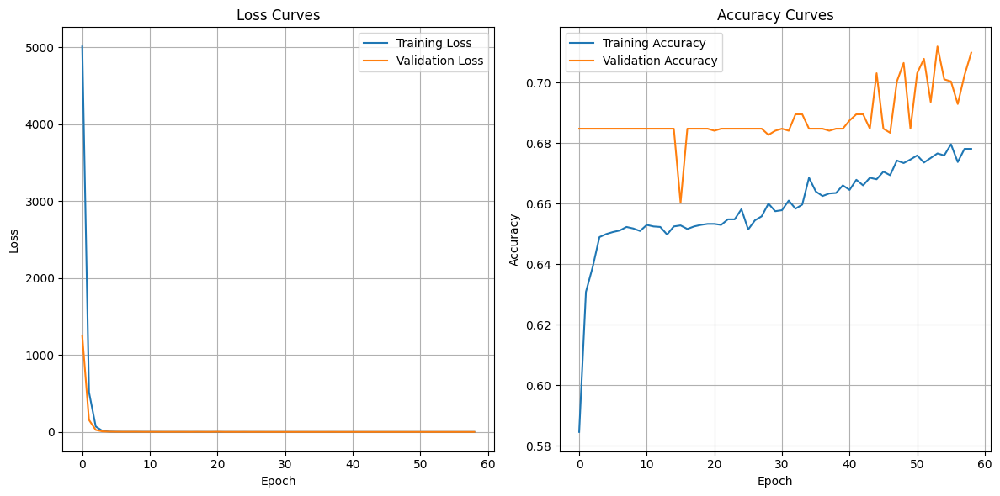

187/187 [==============================] - 41s 222ms/step - loss: 0.9067 - accuracy: 0.6781 - val_loss: 0.9086 - val_accuracy: 0.7099 - lr: 7.4466e-06
Epoch 60/60
187/187 [==============================] - ETA: 0s - loss: 0.8907 - accuracy: 0.6847

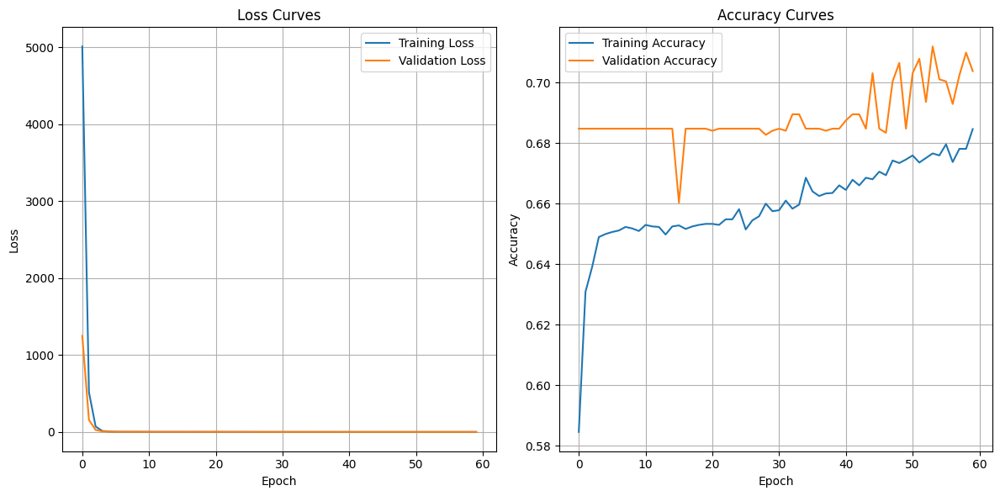

46/46 [==============================] - 3s 56ms/step - loss: 0.9302 - accuracy: 0.7038
Validation Loss: 0.9301535487174988, Validation Accuracy: 0.7038043737411499
46/46 [==============================] - 3s 52ms/step


ValueError: Found input variables with inconsistent numbers of samples: [1500, 1472]

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split, KFold
from tensorflow.keras import layers, optimizers, regularizers
from tensorflow.keras.callbacks import Callback, EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report

# Path to images and weights
images_path = '/content/HAM/HAM/data'
weights_folder = '/content/discriminator_weights'

# Ensure that image_path column and diagnosis column exist
if 'image_path' not in df.columns or 'diagnosis' not in df.columns:
    raise ValueError("DataFrame must contain 'image_path' and 'diagnosis' columns.")

# Define class directories based on unique diagnoses
class_labels = df['diagnosis'].unique()
class_dirs = {label: os.path.join('/content/HAM10000_dataset', label) for label in class_labels}

# Create a new directory for the combined dataset
combined_dir = '/content/HAM10000_dataset'
if not os.path.exists(combined_dir):
    os.makedirs(combined_dir)

# Create class directories
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if not os.path.exists(class_combined_dir):
        os.makedirs(class_combined_dir)

# Copy images into the new directory with their class labels
for idx, row in df.iterrows():
    img_name = row['image_path']
    diagnosis = row['diagnosis']
    img_path = os.path.join(images_path, img_name)

    # Check if image path exists
    if os.path.isfile(img_path):
        destination_dir = class_dirs[diagnosis]
        shutil.copy(img_path, destination_dir)
    else:
        print(f"Image file does not exist: {img_path}")

# Display the count of images for each class in the combined dataset
print("Image count for each class in the combined dataset:")
for class_name in class_labels:
    class_combined_dir = os.path.join(combined_dir, class_name)
    if os.path.isdir(class_combined_dir):
        count = len(os.listdir(class_combined_dir))
        print(f"{class_name}: {count} images")
    else:
        print(f"Directory does not exist: {class_combined_dir}")

# Split the data into training, validation, and test sets
def split_data(combined_dir, class_labels, test_size=0.2, val_size=0.2):
    data = []
    labels = []
    class_map = {class_name: idx for idx, class_name in enumerate(class_labels)}
    for class_name in class_labels:
        class_dir = os.path.join(combined_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                data.append(img_path)
                labels.append(class_map[class_name])

    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=test_size, stratify=labels)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_size, stratify=train_labels)

    return train_data, val_data, test_data, train_labels, val_labels, test_labels

# Data normalization setup
datagen = ImageDataGenerator(
    rescale=1./255  # Normalize pixel values to the range [0, 1]
)

# Convert lists of data and labels to ImageDataGenerator
def data_to_generator(data, labels, img_size, batch_size):
    def generator():
        while True:
            for i in range(0, len(data), batch_size):
                batch_data = data[i:i+batch_size]
                batch_labels = labels[i:i+batch_size]
                images = []
                for img_path in batch_data:
                    img = tf.keras.preprocessing.image.load_img(img_path, target_size=img_size)
                    img = tf.keras.preprocessing.image.img_to_array(img)
                    images.append(img)
                images = np.array(images)
                yield images / 255.0, np.array(batch_labels)  # Normalize images here

    output_shapes = ((None, img_size[0], img_size[1], 3), (None,))
    return tf.data.Dataset.from_generator(generator,
                                          output_types=(tf.float32, tf.int32),
                                          output_shapes=output_shapes)

# Image size and batch size
img_size = (128, 128)
batch_size = 32

# Learning rate scheduler
def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(lr_schedule)

# Early stopping setup
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define the discriminator model
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3],
                      kernel_regularizer=regularizers.l2(0.01)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

# Function to create and load class expert models
def create_class_expert(input_shape, weights_path):
    model = make_discriminator_model()
    model.build(input_shape=(None,) + input_shape)  # Ensure the model is built before loading weights
    model.load_weights(weights_path)
    return model

# Cross-validation setup
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Split the data into train, validation, and test sets
train_data, val_data, test_data, train_labels, val_labels, test_labels = split_data(combined_dir, class_labels)

# Cross-validation loop
fold_index = 0
for train_index, val_index in kfold.split(train_data):
    # Splitting data into folds
    train_data_fold = [train_data[i] for i in train_index]
    val_data_fold = [train_data[i] for i in val_index]
    train_labels_fold = [train_labels[i] for i in train_index]
    val_labels_fold = [train_labels[i] for i in val_index]

    # Create generators for the fold
    train_generator = data_to_generator(train_data_fold, train_labels_fold, img_size, batch_size)
    val_generator = data_to_generator(val_data_fold, val_labels_fold, img_size, batch_size)

    # Create the main CNN model
    inputs = tf.keras.Input(shape=(128, 128, 3))

    # Apply Layer Groups 1 and 2
    x = make_discriminator_model()(inputs)

    # Create parallel class expert layers for each class and load pretrained weights
    class_expert_outputs = []
    for class_name in class_labels:
        weights_path = f'{weights_folder}/{class_name.replace(" ", "_").replace("(", "").replace(")", "")}_discriminator_weights.h5'  # Path to weights for each class
        if os.path.exists(weights_path):
            expert_model = create_class_expert((128, 128, 3), weights_path)
            expert_x = expert_model(inputs)
            class_expert_outputs.append(expert_x)
        else:
            print(f"Weight file does not exist: {weights_path}")

    # Concatenate the outputs of class expert layers
    concatenated = layers.Concatenate()(class_expert_outputs)

    # Apply extra layers and final classification layer
    x = layers.Flatten()(concatenated)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(len(class_labels), activation='softmax')(x)

    # Compile the model
    final_model = tf.keras.Model(inputs=inputs, outputs=outputs)
    final_model.compile(optimizer=optimizers.Adam(learning_rate=0.001),
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])

    # Define a custom callback to plot losses and accuracies
    class PlotLossesCallback(Callback):
        def __init__(self):
            super(PlotLossesCallback, self).__init__()
            self.epochs = []
            self.history = {'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': []}

        def on_epoch_end(self, epoch, logs=None):
            self.epochs.append(epoch)
            for key in self.history.keys():
                self.history[key].append(logs.get(key))
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.plot(self.epochs, self.history['loss'], label='Training Loss')
            plt.plot(self.epochs, self.history['val_loss'], label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()
            plt.title('Loss Curves')
            plt.grid(True)

            plt.subplot(1, 2, 2)
            plt.plot(self.epochs, self.history['accuracy'], label='Training Accuracy')
            plt.plot(self.epochs, self.history['val_accuracy'], label='Validation Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()
            plt.title('Accuracy Curves')
            plt.grid(True)

            plt.tight_layout()
            plt.show()

    plot_losses_callback = PlotLossesCallback()

    # Train the model
    final_model.fit(
        train_generator,
        epochs=60,
        validation_data=val_generator,
        steps_per_epoch=len(train_data_fold)//batch_size,
        validation_steps=len(val_data_fold)//batch_size,
        callbacks=[plot_losses_callback, early_stopping, lr_scheduler]
    )

    # Evaluate on validation set
    val_loss, val_accuracy = final_model.evaluate(val_generator, steps=len(val_data_fold)//batch_size)
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

    # Save model weights
    final_model.save_weights(f'/content/final_model_weights_fold_{fold_index}.h5')

    # Print classification report
    # Collect validation predictions and ensure they align with validation labels
    val_predictions = final_model.predict(val_generator, steps=len(val_data_fold)//batch_size)
    val_predictions = np.argmax(val_predictions, axis=1)
    val_labels_fold = np.array(val_labels_fold)  # Ensure labels are a NumPy array for consistency
    print(classification_report(val_labels_fold, val_predictions, target_names=class_labels))

    fold_index += 1
